## Importing Libs

In [375]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import requests 
from bs4 import BeautifulSoup
import json
from pprint import pprint
import matplotlib.image as mpimg
import matplotlib.patches as patches
from PIL import Image
from io import BytesIO
import highlight_text
import matplotlib as mpl
from matplotlib.gridspec import GridSpec
from mplsoccer import Pitch, VerticalPitch
import matplotlib.image as mpimg
import matplotlib.patches as patches
from PIL import Image
from io import BytesIO
from mplsoccer import PyPizza, add_image, FontManager
from matplotlib.patches import Rectangle
import matplotlib.font_manager as font_manager
import matplotlib.image as mpimg
import matplotlib.patches as patches
from PIL import Image
from io import BytesIO
from mplsoccer import PyPizza, add_image, FontManager
#import soccerdata as sd
import re
from unidecode import unidecode
from scipy.spatial import ConvexHull
from matplotlib.colors import LinearSegmentedColormap
from highlight_text import ax_text, fig_text
from mplsoccer import Bumpy, FontManager, add_image


from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from webdriver_manager.chrome import ChromeDriverManager
from selenium.webdriver.common.by import By
import main
import visuals
import seaborn as sns
import requests
import utils
from highlight_text import fig_text
from mplsoccer import lines

from mplsoccer import PyPizza, FontManager
import os
%load_ext autoreload
%autoreload 2

pd.set_option("display.max_rows", None, "display.max_columns", None)
background = "#010b14"
#background = 'white'
text_color = 'black'
primary = '#C8102E'
secondary = 'lightblue'
mpl.rcParams['xtick.color'] = text_color
mpl.rcParams['ytick.color'] = text_color

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [376]:
import matplotlib.font_manager as fm
from mplsoccer import FontManager

# Set the path to the locally downloaded font file
font_path = r'C:\Users\acer\Documents\GitHub\IndianCitizen\ScorePredict\Score Logos-20241022T100701Z-001\Score Logos\Sora_Font\Sora-Regular.ttf'

# Add the font to matplotlib
font_prop = fm.FontProperties(fname=font_path)

# You can now use this font in your plots
fm_sora = FontManager()
#fm_sora.prop = font_prop

print("Font loaded and registered successfully!")

Font loaded and registered successfully!


In [425]:
from sqlalchemy import create_engine
import psycopg2

# Database connection settings (replace with your credentials)
db_config = {
    'dbname': 'understat_db',
    'user': 'ishdeep',
    'password': 'ichadhapg',
    'host': 'localhost',
    'port': 5432,
}

# Create a connection engine
engine = create_engine(f"postgresql+psycopg2://{db_config['user']}:{db_config['password']}@{db_config['host']}:{db_config['port']}/{db_config['dbname']}")

## Player Data

In [182]:
import glob
import os
import pandas as pd

# Specify the root directory containing all subfolders
root_folder = "D:/Scrape-Whoscored-Event-Data/data/player_data.csv"

player_df = pd.read_csv(root_folder)

In [183]:
player_df.columns

Index(['country_id', 'nationality_id', 'position_id', 'position',
       'detailed_position_id', 'common_name', 'name', 'display_name',
       'image_path', 'height', 'weight', 'team_id', 'league_id', 'team'],
      dtype='object')

In [184]:
player_df['player_name'] = player_df['display_name'].apply(lambda x: unidecode(str(x)))

In [185]:
# Define the mapping from position_id to position name
position_map = {
    24: 'Goalkeeper',
    25: 'Defender',
    26: 'Midfielder',
    27: 'Attacker',
    28: 'Unknown'
}

# Fill NaN values in 'position' using the 'position_id' and the mapping
player_df['position'] = player_df['position'].fillna(player_df['position_id'].map(position_map))

In [187]:
player_df['position'].value_counts()

position
Centre Back           109
Central Midfield       83
Goalkeeper             79
Defensive Midfield     60
Right Back             59
Centre Forward         59
Defender               54
Left Back              49
Right Wing             48
Midfielder             48
Left Wing              43
Attacker               41
Attacking Midfield     29
Left Midfield           5
Right Midfield          4
Secondary Striker       2
Name: count, dtype: int64

## FotMob

In [398]:
import requests
import pandas as pd
def scrape_shots(mi):
    headers = {
    'sec-ch-ua-platform': '"Windows"',
    'Referer': 'https://www.fotmob.com/matches/barcelona-vs-benfica/2sv14h',
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/133.0.0.0 Safari/537.36',
    'x-mas': 'eyJib2R5Ijp7InVybCI6Ii9hcGkvbWF0Y2hEZXRhaWxzP21hdGNoSWQ9NDUwNjU2NyIsImNvZGUiOjE3NDY1MzExMDc2NTUsImZvbyI6InByb2R1Y3Rpb246M2FhNjI2YmMwMTcyMjNkNGVkY2QwN2IzY2QyNTY3OTRmMTI3ZmMzNy11bmRlZmluZWQifSwic2lnbmF0dXJlIjoiRDdEQzJGQTVFMTZBNDRFRDJGREM2ODI0NkUwRjc2MjAifQ==',
    'sec-ch-ua': '"Not(A:Brand";v="99", "Google Chrome";v="133", "Chromium";v="133"',
    'sec-ch-ua-mobile': '?0',} # This headers changes regularly, so you need to get the new header everytime Fotmob change it.

    params = {
    'matchId': mi,
    'showNewUefaBracket': 'true'}

    response = requests.get('https://www.fotmob.com/api/matchDetails', params=params, headers=headers)
    data = response.json()
    shotmap = data['content']['shotmap']['shots']
    shots_df = pd.DataFrame(shotmap)
    shots_df['matchId'] = mi

    return shots_df

## League Event Data

In [189]:
import glob
import os
import pandas as pd

root_folder = "D:/Scrape-Whoscored-Event-Data/data/"
exclude_folder = os.path.join(root_folder, "champions-league").replace("\\", "/")  # Normalize path

# Get all CSV files recursively
csv_files = glob.glob(os.path.join(root_folder, "**", "*.csv"), recursive=True)

# Filter out files that are inside the excluded folder
csv_files = [f for f in csv_files if not f.replace("\\", "/").startswith(exclude_folder)]

# List to hold the DataFrames
dataframes = []

# Loop through the CSV files and read them into DataFrames
for file in csv_files:
    print(f"Reading: {file}")
    dfi = pd.read_csv(file)
    dataframes.append(dfi)

# Merge if files were found
if dataframes:
    df = pd.concat(dataframes, ignore_index=True)
    print("All CSV files successfully merged into a single DataFrame.")
else:
    print("No CSV files found in the specified directory.")


Reading: D:/Scrape-Whoscored-Event-Data/data\bundesliga\bundesliga_events1.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\bundesliga\bundesliga_events2.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\bundesliga\bundesliga_events3.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (37,259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\bundesliga\bundesliga_events4.csv
Reading: D:/Scrape-Whoscored-Event-Data/data\bundesliga\bundesliga_events_2025-03-19.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\bundesliga\bundesliga_events_2025-04-01.csv
Reading: D:/Scrape-Whoscored-Event-Data/data\bundesliga\bundesliga_events_2025-04-09.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (38) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\bundesliga\bundesliga_events_2025-04-16.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (37,259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\bundesliga\bundesliga_events_2025-04-22.csv
Reading: D:/Scrape-Whoscored-Event-Data/data\bundesliga\bundesliga_events_2025-04-29.csv
Reading: D:/Scrape-Whoscored-Event-Data/data\eredivisie\eredivisie_events_2025-04-02.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (31,259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\eredivisie\eredivisie_events_2025-04-02_2.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (36,259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\eredivisie\eredivisie_events_2025-04-02_3.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (37,259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\laliga\laliga_events.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (37,259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\laliga\laliga_events2.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (37,259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\laliga\laliga_events3.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\laliga\laliga_events4.csv
Reading: D:/Scrape-Whoscored-Event-Data/data\laliga\laliga_events5.csv
Reading: D:/Scrape-Whoscored-Event-Data/data\laliga\laliga_events6.csv
Reading: D:/Scrape-Whoscored-Event-Data/data\laliga\laliga_events_2025-03-19.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\laliga\laliga_events_2025-04-01.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\laliga\laliga_events_2025-04-09.csv
Reading: D:/Scrape-Whoscored-Event-Data/data\laliga\laliga_events_2025-04-16.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\laliga\laliga_events_2025-04-22.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\ligue-1\ligue-1_events_2025-04-01.csv
Reading: D:/Scrape-Whoscored-Event-Data/data\ligue-1\ligue-1_events_2025-04-09.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\ligue-1\ligue-1_events_2025-04-16.csv
Reading: D:/Scrape-Whoscored-Event-Data/data\ligue-1\ligue-1_events_2025-04-23.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\ligue-1\ligue1_events1.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (35,259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\ligue-1\ligue1_events2.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\ligue-1\ligue1_events3.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\ligue-1\ligue1_events4.csv
Reading: D:/Scrape-Whoscored-Event-Data/data\ligue-1\ligue1_events_2025-03-18.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\premier-league\pl_events1.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\premier-league\pl_events2.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\premier-league\pl_events3.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (37,259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\premier-league\pl_events4.csv
Reading: D:/Scrape-Whoscored-Event-Data/data\premier-league\premier-league_events_2025-03-18.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (36,38,40) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\premier-league\premier-league_events_2025-04-04.csv
Reading: D:/Scrape-Whoscored-Event-Data/data\premier-league\premier-league_events_2025-04-09.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (37) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\premier-league\premier-league_events_2025-04-14.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\premier-league\premier-league_events_2025-04-16.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\premier-league\premier-league_events_2025-04-22.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (37) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\premier-league\premier-league_events_2025-04-25.csv
Reading: D:/Scrape-Whoscored-Event-Data/data\premier-league\premier-league_events_2025-04-29.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\serie-a\serie-a_events_2025-03-19.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (37) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\serie-a\serie-a_events_2025-04-01.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (37) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\serie-a\serie-a_events_2025-04-09.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\serie-a\serie-a_events_2025-04-16.csv
Reading: D:/Scrape-Whoscored-Event-Data/data\serie-a\serie-a_events_2025-04-23.csv
Reading: D:/Scrape-Whoscored-Event-Data/data\serie-a\serieA_events1.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\serie-a\serieA_events2.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\serie-a\serieA_events3.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (37,259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


Reading: D:/Scrape-Whoscored-Event-Data/data\serie-a\serieA_events4.csv
Reading: D:/Scrape-Whoscored-Event-Data/data\serie-a\serieA_events5.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2554844446.py:20: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)


All CSV files successfully merged into a single DataFrame.


In [461]:
import glob
import os
import pandas as pd

# Specify the root directory containing all subfolders
root_folder = "D:/Scrape-Whoscored-Event-Data/data/laliga"

# Use glob to get all CSV file paths recursively from subdirectories
csv_files = glob.glob(os.path.join(root_folder, "**", "*.csv"), recursive=True)

# List to hold the DataFrames
dataframes = []

# Loop through the CSV files and read them into DataFrames
for file in csv_files:
    print(f"Reading: {file}")
    dfi = pd.read_csv(file)  # Read the CSV file
    dataframes.append(dfi)   # Append the DataFrame to the list

# Check if any CSV files were found
if dataframes:
    # Concatenate all DataFrames into a single DataFrame
    df = pd.concat(dataframes, ignore_index=True)
    print("All CSV files successfully merged into a single DataFrame.")
else:
    print("No CSV files found in the specified directory.")

Reading: D:/Scrape-Whoscored-Event-Data/data/laliga\laliga_events.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2444217362.py:17: DtypeWarning: Columns (37,259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)  # Read the CSV file


Reading: D:/Scrape-Whoscored-Event-Data/data/laliga\laliga_events2.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2444217362.py:17: DtypeWarning: Columns (37,259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)  # Read the CSV file


Reading: D:/Scrape-Whoscored-Event-Data/data/laliga\laliga_events3.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2444217362.py:17: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)  # Read the CSV file


Reading: D:/Scrape-Whoscored-Event-Data/data/laliga\laliga_events4.csv
Reading: D:/Scrape-Whoscored-Event-Data/data/laliga\laliga_events5.csv
Reading: D:/Scrape-Whoscored-Event-Data/data/laliga\laliga_events6.csv
Reading: D:/Scrape-Whoscored-Event-Data/data/laliga\laliga_events_2025-03-19.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2444217362.py:17: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)  # Read the CSV file


Reading: D:/Scrape-Whoscored-Event-Data/data/laliga\laliga_events_2025-04-01.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2444217362.py:17: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)  # Read the CSV file


Reading: D:/Scrape-Whoscored-Event-Data/data/laliga\laliga_events_2025-04-09.csv
Reading: D:/Scrape-Whoscored-Event-Data/data/laliga\laliga_events_2025-04-16.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2444217362.py:17: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)  # Read the CSV file


Reading: D:/Scrape-Whoscored-Event-Data/data/laliga\laliga_events_2025-04-22.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2444217362.py:17: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)  # Read the CSV file


Reading: D:/Scrape-Whoscored-Event-Data/data/laliga\laliga_events_2025-05-01.csv
Reading: D:/Scrape-Whoscored-Event-Data/data/laliga\laliga_events_2025-05-07.csv


C:\Users\acer\AppData\Local\Temp\ipykernel_14272\2444217362.py:17: DtypeWarning: Columns (259) have mixed types. Specify dtype option on import or set low_memory=False.
  dfi = pd.read_csv(file)  # Read the CSV file


All CSV files successfully merged into a single DataFrame.


In [462]:
teams_dict = {
    65: 'Barcelona',
    63: 'Atletico Madrid',
    52: 'Real Madrid',
    53: 'Atletic Club',
    839: 'Villarreal',
    54: 'Real Betis',
    64: 'Rayo Vallecano',
    51: 'Mallorca',
    68: 'Real Sociedad',
    62: 'Celta Vigo',
    131: 'Osasuna',
    67: 'Sevilla',
    2783: 'Girona',
    819: 'Getafe',
    70: 'Espanyol',
    825: 'Leganes',
    838: 'Las Palmas',
    55 : 'Valencia',
    60 : 'Deportivo Alaves',
    58: 'Real Valladolid',
    13: 'Arsenal',
    161: 'Wolves',
    24: 'Aston Villa',
    211: 'Brighton',
    30: 'Tottenham',
    167: 'Man City',
    14: 'Leicester',
    18: 'Southampton',
    183: 'Bournemouth',
    26: 'Liverpool',
    23: 'Newcastle',
    15: 'Chelsea',
    174: 'Nottingham Forest',
    29: 'West Ham',
    32: 'Man Utd',
    170: 'Fulham',
    189: 'Brentford',
    162: 'Crystal Palace',
    31: 'Everton',
    165: 'Ipswich',
    37: 'Bayern Munich',
    36: 'Bayer Leverkusen',
    45: 'Eintracht Frankfurt',
    219: 'Mainz 05',
    50: 'Freiburg',
    7614: 'RB Leipzig',
    33: 'Wolfsburg',
    134: 'Borussia M.Gladbach',
    41: 'VfB Stuttgart',
    44: 'Borussia Dortmund',
    1730: 'Augsburg',
    42: 'Werder Bremen',
    1211: 'Hoffenheim',
    796: 'Union Berlin',
    283: 'St. Pauli',
    1206: 'Holstein Kiel',
    4852: 'FC Heidenheim',
    109: 'Bochum',
    75 : 'Inter',
    276 : 'Napoli',
    300 : 'Atalanta',
    87 : 'Juventus',
    77 : 'Lazio',
    71 : 'Bologna',
    73 : 'Fiorentina',
    84 : 'Roma',
    80 : 'AC Milan',
    86 : 'Udinese',
    72 : 'Torino',
    278 : 'Genoa',
    1290 : 'Como',
    76 : 'Verona',
    78 : 'Cagliari',
    79 : 'Lecce',
    24341 : 'Parma Calcio',
    272 : 'Empoli',
    85 : 'Venezia',
    269 : 'Monza',
    304 : 'PSG',
    249 : 'Marseille',
    613 : 'Nice',
    248 : 'Monaco',
    607 : 'Lille',
    228 : 'Lyon',
    148 : 'Strasbourg',
    246 : 'Toulouse',
    309 : 'Lens',
    2332 : 'Brest',
    313 : 'Rennes',
    308 : 'Auxerre',
    614 : 'Angers',
    302 : 'Nantes',
    950 : 'Reims',
    217 : 'Le Havre',
    145 : 'Saint-Etienne',
    311 : 'Montpellier',
    299 : 'Benfica',
    129 : 'PSV'
}

In [463]:
# temprary use of typeId of period column
df['period'] = df['period'].replace({'FirstHalf': 1, 'SecondHalf': 2, 'FirstPeriodOfExtraTime': 3, 'SecondPeriodOfExtraTime': 4,
                                     'PenaltyShootout': 5, 'PostGame': 14, 'PreMatch': 16})
# new column for cumulative minutes, This part is taken from the "jakeyk11.github.io" github repository and modified for my use
def cumulative_match_mins(events_df):
    events_out = pd.DataFrame()
    # Add cumulative time to events data, resetting for each unique match
    match_events = events_df.copy()
    match_events['cumulative_mins'] = match_events['minute'] + (1/60) * match_events['second']
    # Add time increment to cumulative minutes based on period of game.
    for period in np.arange(1, match_events['period'].max() + 1, 1):
        if period > 1:
            t_delta = match_events[match_events['period'] == period - 1]['cumulative_mins'].max() - \
                                   match_events[match_events['period'] == period]['cumulative_mins'].min()
        elif period == 1 or period == 5:
            t_delta = 0
        else:
            t_delta = 0
        match_events.loc[match_events['period'] == period, 'cumulative_mins'] += t_delta
    # Rebuild events dataframe
    events_out = pd.concat([events_out, match_events])
    return events_out

df = cumulative_match_mins(df)

# Extracting the carry data and merge it with the main df, This part is also taken from the "jakeyk11.github.io" github repository and modified for my use
def insert_ball_carries(events_df, min_carry_length=3, max_carry_length=60, min_carry_duration=1, max_carry_duration=10):
    events_out = pd.DataFrame()
    # Carry conditions (convert from metres to opta)
    min_carry_length = 3.0
    max_carry_length = 60.0
    min_carry_duration = 1.0
    max_carry_duration = 10.0
    # match_events = events_df[events_df['match_id'] == match_id].reset_index()
    match_events = events_df.reset_index()
    match_carries = pd.DataFrame()

    for idx, match_event in match_events.iterrows():

        if idx < len(match_events) - 1:
            prev_evt_team = match_event['teamId']
            next_evt_idx = idx + 1
            init_next_evt = match_events.loc[next_evt_idx]
            take_ons = 0
            incorrect_next_evt = True

            while incorrect_next_evt:

                next_evt = match_events.loc[next_evt_idx]

                if next_evt['type'] == 'TakeOn' and next_evt['outcomeType'] == 'Successful':
                    take_ons += 1
                    incorrect_next_evt = True

                elif ((next_evt['type'] == 'TakeOn' and next_evt['outcomeType'] == 'Unsuccessful')
                      or (next_evt['teamId'] != prev_evt_team and next_evt['type'] == 'Challenge' and next_evt['outcomeType'] == 'Unsuccessful')
                      or (next_evt['type'] == 'Foul')):
                    incorrect_next_evt = True

                else:
                    incorrect_next_evt = False

                next_evt_idx += 1

            # Apply some conditioning to determine whether carry criteria is satisfied
            same_team = prev_evt_team == next_evt['teamId']
            not_ball_touch = match_event['type'] != 'BallTouch'
            dx = 105*(match_event['endX'] - next_evt['x'])/100
            dy = 68*(match_event['endY'] - next_evt['y'])/100
            far_enough = dx ** 2 + dy ** 2 >= min_carry_length ** 2
            not_too_far = dx ** 2 + dy ** 2 <= max_carry_length ** 2
            dt = 60 * (next_evt['cumulative_mins'] - match_event['cumulative_mins'])
            min_time = dt >= min_carry_duration
            same_phase = dt < max_carry_duration
            same_period = match_event['period'] == next_evt['period']

            valid_carry = same_team & not_ball_touch & far_enough & not_too_far & min_time & same_phase &same_period

            if valid_carry:
                carry = pd.DataFrame()
                prev = match_event
                nex = next_evt

                carry.loc[0, 'eventId'] = prev['eventId'] + 0.5
                carry['minute'] = np.floor(((init_next_evt['minute'] * 60 + init_next_evt['second']) + (
                        prev['minute'] * 60 + prev['second'])) / (2 * 60))
                carry['second'] = (((init_next_evt['minute'] * 60 + init_next_evt['second']) +
                                    (prev['minute'] * 60 + prev['second'])) / 2) - (carry['minute'] * 60)
                carry['teamId'] = nex['teamId']
                carry['x'] = prev['endX']
                carry['y'] = prev['endY']
                carry['expandedMinute'] = np.floor(((init_next_evt['expandedMinute'] * 60 + init_next_evt['second']) +
                                                    (prev['expandedMinute'] * 60 + prev['second'])) / (2 * 60))
                carry['period'] = nex['period']
                carry['type'] = carry.apply(lambda x: {'value': 99, 'displayName': 'Carry'}, axis=1)
                carry['outcomeType'] = 'Successful'
                carry['qualifiers'] = carry.apply(lambda x: {'type': {'value': 999, 'displayName': 'takeOns'}, 'value': str(take_ons)}, axis=1)
                carry['satisfiedEventsTypes'] = carry.apply(lambda x: [], axis=1)
                carry['isTouch'] = True
                carry['playerId'] = nex['playerId']
                carry['endX'] = nex['x']
                carry['endY'] = nex['y']
                carry['blockedX'] = np.nan
                carry['blockedY'] = np.nan
                carry['goalMouthZ'] = np.nan
                carry['goalMouthY'] = np.nan
                carry['isShot'] = np.nan
                carry['relatedEventId'] = nex['eventId']
                carry['relatedPlayerId'] = np.nan
                carry['isGoal'] = np.nan
                carry['cardType'] = np.nan
                carry['isOwnGoal'] = np.nan
                carry['type'] = 'Carry'
                carry['cumulative_mins'] = (prev['cumulative_mins'] + init_next_evt['cumulative_mins']) / 2
                carry['playerName'] = nex['playerName']

                match_carries = pd.concat([match_carries, carry], ignore_index=True, sort=False)

    match_events_and_carries = pd.concat([match_carries, match_events], ignore_index=True, sort=False)
    match_events_and_carries = match_events_and_carries.sort_values(['period', 'cumulative_mins']).reset_index(drop=True)

    # Rebuild events dataframe
    events_out = pd.concat([events_out, match_events_and_carries])

    return events_out

#df = insert_ball_carries(df, min_carry_length=3, max_carry_length=60, min_carry_duration=1, max_carry_duration=10)

df = df.reset_index(drop=True)
df['index'] = range(1, len(df) + 1)
df = df[['index'] + [col for col in df.columns if col != 'index']]

In [389]:
print(list(df.columns))

['index', 'Unnamed: 0', 'id', 'eventId', 'minute', 'second', 'teamId', 'h_a', 'x', 'y', 'expandedMinute', 'period', 'type', 'outcomeType', 'qualifiers', 'satisfiedEventsTypes', 'isTouch', 'matchId', 'startDate', 'startTime', 'score', 'ftScore', 'htScore', 'etScore', 'venueName', 'maxMinute', 'playerId', 'playerName', 'endX', 'endY', 'relatedEventId', 'relatedPlayerId', 'blockedX', 'blockedY', 'goalMouthZ', 'goalMouthY', 'isShot', 'cardType', 'isGoal', 'shotBodyType', 'situation', 'shotSixYardBox', 'shotPenaltyArea', 'shotOboxTotal', 'shotOpenPlay', 'shotCounter', 'shotSetPiece', 'shotDirectCorner', 'shotOffTarget', 'shotOnPost', 'shotOnTarget', 'shotsTotal', 'shotBlocked', 'shotRightFoot', 'shotLeftFoot', 'shotHead', 'shotObp', 'goalSixYardBox', 'goalPenaltyArea', 'goalObox', 'goalOpenPlay', 'goalCounter', 'goalSetPiece', 'penaltyScored', 'goalOwn', 'goalNormal', 'goalRightFoot', 'goalLeftFoot', 'goalHead', 'goalObp', 'shortPassInaccurate', 'shortPassAccurate', 'passCorner', 'passCorne

In [467]:
df = df.sort_values(by='matchId')

In [468]:
# Assign xT values
df_base  = df
dfxT = df_base.copy()
dfxT['qualifiers'] = dfxT['qualifiers'].astype(str)
dfxT = dfxT[(~dfxT['qualifiers'].str.contains('Corner'))]
dfxT = dfxT[(dfxT['type'].isin(['Pass', 'Carry'])) & (dfxT['outcomeType']=='Successful')]


xT = pd.read_csv('https://raw.githubusercontent.com/mckayjohns/youtube-videos/main/data/xT_Grid.csv', header=None) # use this if you don't have your own xT value Grid
# xT = pd.read_csv("/content/xT_Grid.csv", header=None)    # use this if you have your own xT value Grid, then place your file path here
xT = np.array(xT)
xT_rows, xT_cols = xT.shape

dfxT['x1_bin_xT'] = pd.cut(dfxT['x'], bins=xT_cols, labels=False)
dfxT['y1_bin_xT'] = pd.cut(dfxT['y'], bins=xT_rows, labels=False)
dfxT['x2_bin_xT'] = pd.cut(dfxT['endX'], bins=xT_cols, labels=False)
dfxT['y2_bin_xT'] = pd.cut(dfxT['endY'], bins=xT_rows, labels=False)

dfxT['start_zone_value_xT'] = dfxT[['x1_bin_xT', 'y1_bin_xT']].apply(lambda x: xT[x[1]][x[0]], axis=1)
dfxT['end_zone_value_xT'] = dfxT[['x2_bin_xT', 'y2_bin_xT']].apply(lambda x: xT[x[1]][x[0]], axis=1)

dfxT['xT'] = dfxT['end_zone_value_xT'] - dfxT['start_zone_value_xT']
columns_to_drop = ['eventId', 'minute', 'second', 'teamId', 'x', 'y', 'expandedMinute', 'period', 'type', 'outcomeType', 'qualifiers', 'satisfiedEventsTypes', 'isTouch', 'playerId', 'endX', 'endY', 'blockedX', 'blockedY', 'goalMouthZ', 'goalMouthY', 'isShot', 'relatedEventId', 'relatedPlayerId', 'isGoal', 'cardType', 'isOwnGoal', 'cumulative_mins', 'Unnamed: 0', 'id', 'h_a', 'matchId', 'startDate', 'startTime', 'score', 'ftScore', 'htScore', 'etScore', 'venueName', 'maxMinute', 'playerName', 'shotBodyType', 'situation', 'shotSixYardBox', 'shotPenaltyArea', 'shotOboxTotal', 'shotOpenPlay', 'shotCounter', 'shotSetPiece', 'shotDirectCorner', 'shotOffTarget', 'shotOnPost', 'shotOnTarget', 'shotsTotal', 'shotBlocked', 'shotRightFoot', 'shotLeftFoot', 'shotHead', 'shotObp', 'goalSixYardBox', 'goalPenaltyArea', 'goalObox', 'goalOpenPlay', 'goalCounter', 'goalSetPiece', 'penaltyScored', 'goalOwn', 'goalNormal', 'goalRightFoot', 'goalLeftFoot', 'goalHead', 'goalObp', 'shortPassInaccurate', 'shortPassAccurate', 'passCorner', 'passCornerAccurate', 'passCornerInaccurate', 'passFreekick', 'passBack', 'passForward', 'passLeft', 'passRight', 'keyPassLong', 'keyPassShort', 'keyPassCross', 'keyPassCorner', 'keyPassThroughball', 'keyPassFreekick', 'keyPassThrowin', 'keyPassOther', 'assistCross', 'assistCorner', 'assistThroughball', 'assistFreekick', 'assistThrowin', 'assistOther', 'dribbleLost', 'dribbleWon', 'challengeLost', 'interceptionWon', 'clearanceHead', 'outfielderBlock', 'passCrossBlockedDefensive', 'outfielderBlockedPass', 'offsideGiven', 'offsideProvoked', 'foulGiven', 'foulCommitted', 'yellowCard', 'voidYellowCard', 'secondYellow', 'redCard', 'turnover', 'dispossessed', 'saveLowLeft', 'saveHighLeft', 'saveLowCentre', 'saveHighCentre', 'saveLowRight', 'saveHighRight', 'saveHands', 'saveFeet', 'saveObp', 'saveSixYardBox', 'savePenaltyArea', 'saveObox', 'keeperDivingSave', 'standingSave', 'closeMissHigh', 'closeMissHighLeft', 'closeMissHighRight', 'closeMissLeft', 'closeMissRight', 'shotOffTargetInsideBox', 'touches', 'assist', 'ballRecovery', 'clearanceEffective', 'clearanceTotal', 'clearanceOffTheLine', 'dribbleLastman', 'errorLeadsToGoal', 'errorLeadsToShot', 'intentionalAssist', 'interceptionAll', 'interceptionIntheBox', 'keeperClaimHighLost', 'keeperClaimHighWon', 'keeperClaimLost', 'keeperClaimWon', 'keeperOneToOneWon', 'parriedDanger', 'parriedSafe', 'collected', 'keeperPenaltySaved', 'keeperSaveInTheBox', 'keeperSaveTotal', 'keeperSmother', 'keeperSweeperLost', 'keeperMissed', 'passAccurate', 'passBackZoneInaccurate', 'passForwardZoneAccurate', 'passInaccurate', 'passAccuracy', 'cornerAwarded', 'passKey', 'passChipped', 'passCrossAccurate', 'passCrossInaccurate', 'passLongBallAccurate', 'passLongBallInaccurate', 'passThroughBallAccurate', 'passThroughBallInaccurate', 'passThroughBallInacurate', 'passFreekickAccurate', 'passFreekickInaccurate', 'penaltyConceded', 'penaltyMissed', 'penaltyWon', 'passRightFoot', 'passLeftFoot', 'passHead', 'sixYardBlock', 'tackleLastMan', 'tackleLost', 'tackleWon', 'cleanSheetGK', 'cleanSheetDL', 'cleanSheetDC', 'cleanSheetDR', 'cleanSheetDML', 'cleanSheetDMC', 'cleanSheetDMR', 'cleanSheetML', 'cleanSheetMC', 'cleanSheetMR', 'cleanSheetAML', 'cleanSheetAMC', 'cleanSheetAMR', 'cleanSheetFWL', 'cleanSheetFW', 'cleanSheetFWR', 'cleanSheetSub', 'goalConcededByTeamGK', 'goalConcededByTeamDL', 'goalConcededByTeamDC', 'goalConcededByTeamDR', 'goalConcededByTeamDML', 'goalConcededByTeamDMC', 'goalConcededByTeamDMR', 'goalConcededByTeamML', 'goalConcededByTeamMC', 'goalConcededByTeamMR', 'goalConcededByTeamAML', 'goalConcededByTeamAMC', 'goalConcededByTeamAMR', 'goalConcededByTeamFWL', 'goalConcededByTeamFW', 'goalConcededByTeamFWR', 'goalConcededByTeamSub', 'goalConcededOutsideBoxGoalkeeper', 'goalScoredByTeamGK', 'goalScoredByTeamDL', 'goalScoredByTeamDC', 'goalScoredByTeamDR', 'goalScoredByTeamDML', 'goalScoredByTeamDMC', 'goalScoredByTeamDMR', 'goalScoredByTeamML', 'goalScoredByTeamMC', 'goalScoredByTeamMR', 'goalScoredByTeamAML', 'goalScoredByTeamAMC', 'goalScoredByTeamAMR', 'goalScoredByTeamFWL', 'goalScoredByTeamFW', 'goalScoredByTeamFWR', 'goalScoredByTeamSub', 'aerialSuccess', 'duelAerialWon', 'duelAerialLost', 'offensiveDuel', 'defensiveDuel', 'bigChanceMissed', 'bigChanceScored', 'bigChanceCreated', 'overrun', 'successfulFinalThirdPasses', 'punches', 'penaltyShootoutScored', 'penaltyShootoutMissedOffTarget', 'penaltyShootoutSaved', 'penaltyShootoutSavedGK', 'penaltyShootoutConcededGK', 'throwIn', 'subOn', 'subOff', 'defensiveThird', 'midThird', 'finalThird', 'pos']
dfxT.drop(columns=columns_to_drop, inplace=True)

df = df.merge(dfxT, on='index', how='left')

# New Column for Team Names and Oppositon TeamNames
df['teamName'] = df['teamId'].map(teams_dict)
team_names = list(teams_dict.values())
#opposition_dict = {team_names[i]: team_names[1-i] for i in range(len(team_names))}
#df['oppositionTeamName'] = df['teamName'].map(opposition_dict)

# Reshaping the data from 100x100 to 105x68, as I use the pitch_type='uefa', in the pitch function, you can consider according to your use
df['x'] = df['x']*1.05
df['y'] = df['y']*0.68
df['endX'] = df['endX']*1.05
df['endY'] = df['endY']*0.68
df['goalMouthY'] = df['goalMouthY']*0.68

df['qualifiers'] = df['qualifiers'].astype(str)
# Calculating passing distance, to find out progressive pass, this will just show the distance reduced by a pass, then will be able to filter passes which has reduced distance value more than 10yds as a progressive pass
df['prog_pass'] = np.where((df['type'] == 'Pass'),
                           np.sqrt((105 - df['x'])**2 + (34 - df['y'])**2) - np.sqrt((105 - df['endX'])**2 + (34 - df['endY'])**2), 0)
# Calculating carrying distance, to find out progressive carry, this will just show the distance reduced by a carry, then will be able to filter carries which has reduced distance value more than 10yds as a progressive carry
df['prog_carry'] = np.where((df['type'] == 'Carry'),
                            np.sqrt((105 - df['x'])**2 + (34 - df['y'])**2) - np.sqrt((105 - df['endX'])**2 + (34 - df['endY'])**2), 0)
df['pass_or_carry_angle'] = np.degrees(np.arctan2(df['endY'] - df['y'], df['endX'] - df['x']))

# Making all the alphabets in the name as English Alphabets only (for example: Á will be replaced by A)
df['playerName'] = df['playerName'].astype(str)
df['playerName'] = df['playerName'].apply(unidecode)

# Function to extract short names
def get_short_name(full_name):
    if pd.isna(full_name):
        return full_name
    parts = full_name.split()
    if len(parts) == 1:
        return full_name  # No need for short name if there's only one word
    elif len(parts) == 2:
        return parts[0][0] + ". " + parts[1]
    else:
        return parts[0][0] + ". " + parts[1][0] + ". " + " ".join(parts[2:])

# Applying the function to create 'shortName' column
df['shortName'] = df['playerName'].apply(get_short_name)

df['qualifiers'] = df['qualifiers'].astype(str)
columns_to_drop2 = ['id']
df.drop(columns=columns_to_drop2, inplace=True)

df['period'] = df['period'].replace({1: 'FirstHalf', 2: 'SecondHalf', 3: 'FirstPeriodOfExtraTime', 4: 'SecondPeriodOfExtraTime',
                                     5: 'PenaltyShootout', 14: 'PostGame', 16: 'PreMatch'})

C:\Users\acer\AppData\Local\Temp\ipykernel_14272\539181666.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  dfxT['start_zone_value_xT'] = dfxT[['x1_bin_xT', 'y1_bin_xT']].apply(lambda x: xT[x[1]][x[0]], axis=1)
C:\Users\acer\AppData\Local\Temp\ipykernel_14272\539181666.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  dfxT['end_zone_value_xT'] = dfxT[['x2_bin_xT', 'y2_bin_xT']].apply(lambda x: xT[x[1]][x[0]], axis=1)


In [195]:
player_df.shape

(772, 15)

In [196]:
df.shape

(2722975, 273)

In [472]:
df[df['offsideGiven'] == True][['playerName','teamName','outcomeType']].head()

,playerName,teamName,outcomeType
181,Carles Alena,Getafe,Unsuccessful
294,Carles Alena,Getafe,Unsuccessful
477,Dani Vivian,Atletic Club,Unsuccessful
504,Christantus Uche,Getafe,Unsuccessful
588,Yuri Berchiche,Atletic Club,Unsuccessful


In [473]:
df[df['offsideProvoked'] == True][['playerName','teamName','outcomeType']].head()

,playerName,teamName,outcomeType
193,Aitor Paredes,Atletic Club,Successful
292,Mikel Vesga,Atletic Club,Successful
375,Djene Dakonam,Getafe,Successful
470,Djene Dakonam,Getafe,Successful
620,Yeray Alvarez,Atletic Club,Successful


In [197]:
merged_df = df.merge(player_df, left_on='playerName', right_on='player_name', how='left')

## Shot of the Week

### Top 5 Leagues

In [426]:
goal_low_xg = """select round("xG" :: numeric ,4) xg,"result",player,situation,h_team,a_team,league,h_a,"minute",date,player_assisted,"lastAction","X","Y"
from understat_shots_tb
where "date" > current_date - 4
and "result" = 'Goal' and "xG" > 0
order by "xG" 
limit 1;"""

with engine.connect() as conn:
    df_goal_low_xg = pd.read_sql(goal_low_xg, conn)

In [432]:
df_goal_low_xg

,xg,result,player,situation,h_team,a_team,league,h_a,minute,date,player_assisted,lastAction,X,Y
0,0.0135,Goal,Julio Enciso,OpenPlay,Everton,Ipswich,EPL,a,40,2025-05-03 14:00:00,Cameron Burgess,TakeOn,0.704,0.542


In [433]:
shots_df = scrape_shots(4506568)

In [434]:
shots_df.columns

Index(['id', 'eventType', 'teamId', 'playerId', 'playerName', 'x', 'y', 'min',
       'minAdded', 'isBlocked', 'isOnTarget', 'blockedX', 'blockedY',
       'goalCrossedY', 'goalCrossedZ', 'expectedGoals',
       'expectedGoalsOnTarget', 'shotType', 'situation', 'period', 'isOwnGoal',
       'onGoalShot', 'isSavedOffLine', 'isFromInsideBox', 'keeperId',
       'firstName', 'lastName', 'fullName', 'teamColor', 'matchId'],
      dtype='object')

In [435]:
df_goal_low_xg

,xg,result,player,situation,h_team,a_team,league,h_a,minute,date,player_assisted,lastAction,X,Y
0,0.0135,Goal,Julio Enciso,OpenPlay,Everton,Ipswich,EPL,a,40,2025-05-03 14:00:00,Cameron Burgess,TakeOn,0.704,0.542


In [436]:
shots_df[(shots_df['playerName'] == 'Julio Enciso') & (shots_df['eventType'] == 'Goal')]

,id,eventType,teamId,playerId,playerName,x,y,min,minAdded,isBlocked,isOnTarget,blockedX,blockedY,goalCrossedY,goalCrossedZ,expectedGoals,expectedGoalsOnTarget,shotType,situation,period,isOwnGoal,onGoalShot,isSavedOffLine,isFromInsideBox,keeperId,firstName,lastName,fullName,teamColor,matchId
13,2809410945,Goal,9902,1073742,Julio Enciso,74.488835,37.2025,41,NaN,False,True,NaN,NaN,31.78875,1.952,0.019365,0.137576,RightFoot,RegularPlay,FirstHalf,False,"{'x': 1.5849867724867723, 'y': 0.5164021138624...",False,False,303919.0,Julio,Enciso,Julio Enciso,#0333A0,4506568


In [437]:
df_goal_low_xg['xGOT'] = 0.13
df_goal_low_xg['goalCrossedY'] = 31.78
df_goal_low_xg['goalCrossedZ'] = 1.95

In [438]:
if __name__ == "__main__":
    driver = webdriver.Chrome()
    
# whoscored match centre url of the required match (Example: Barcelona vs Sevilla)
url = "https://1xbet.whoscored.com/matches/1821387/live/england-premier-league-2024-2025-everton-ipswich"
match_data = main.getMatchData(driver, url, close_window=True)

# Match dataframe containing info about the match
matches_df = main.createMatchesDF(match_data)

# Events dataframe      
events_df = main.createEventsDF(match_data)

# match Id
matchId = match_data['matchId']

# Information about respective teams as dictionary
home_data = matches_df['home'][matchId]
away_data = matches_df['away'][matchId]

Region: England, League: Premier League, Season: 2024/2025, Match Id: 1821387


In [22]:
events_df['playerName'].unique()

array([nan, 'Abel Ruiz', 'Arthur', 'Arnau Martínez', 'Oriol Romeu',
       'David López', 'Ladislav Krejcí', 'Daley Blind', 'Jesús Areso',
       'Ante Budimir', 'Alejandro Catena', 'Enzo Boyomo', 'Rubén García',
       'Jorge Herrando', 'Abel Bretones', 'Aimar Oroz', 'Paulo Gazzaniga',
       'Yangel Herrera', 'Lucas Torró', 'Sergio Herrera',
       'Arnaut Danjuma', 'Jon Moncayola', 'Viktor Tsygankov',
       'Yáser Asprilla', 'Pablo Ibáñez', 'Cristhian Stuani',
       'Iván Martín', 'Iker Muñoz', 'Kike Barja', 'Unai García',
       'Juan Cruz', 'Portu', 'Donny van de Beek'], dtype=object)

In [439]:
events_df[(events_df['type'] == 'Goal') & (events_df['playerName'] == 'Julio Enciso')]

,id,eventId,minute,second,teamId,h_a,x,y,expandedMinute,period,type,outcomeType,qualifiers,satisfiedEventsTypes,isTouch,matchId,startDate,startTime,score,ftScore,htScore,etScore,venueName,maxMinute,playerId,playerName,endX,endY,blockedX,blockedY,goalMouthZ,goalMouthY,isShot,relatedEventId,relatedPlayerId,isGoal,cardType,shotBodyType,situation,shotSixYardBox,shotPenaltyArea,shotOboxTotal,shotOpenPlay,shotCounter,shotSetPiece,shotDirectCorner,shotOffTarget,shotOnPost,shotOnTarget,shotsTotal,shotBlocked,shotRightFoot,shotLeftFoot,shotHead,shotObp,goalSixYardBox,goalPenaltyArea,goalObox,goalOpenPlay,goalCounter,goalSetPiece,penaltyScored,goalOwn,goalNormal,goalRightFoot,goalLeftFoot,goalHead,goalObp,shortPassInaccurate,shortPassAccurate,passCorner,passCornerAccurate,passCornerInaccurate,passFreekick,passBack,passForward,passLeft,passRight,keyPassLong,keyPassShort,keyPassCross,keyPassCorner,keyPassThroughball,keyPassFreekick,keyPassThrowin,keyPassOther,assistCross,assistCorner,assistThroughball,assistFreekick,assistThrowin,assistOther,dribbleLost,dribbleWon,challengeLost,interceptionWon,clearanceHead,outfielderBlock,passCrossBlockedDefensive,outfielderBlockedPass,offsideGiven,offsideProvoked,foulGiven,foulCommitted,yellowCard,voidYellowCard,secondYellow,redCard,turnover,dispossessed,saveLowLeft,saveHighLeft,saveLowCentre,saveHighCentre,saveLowRight,saveHighRight,saveHands,saveFeet,saveObp,saveSixYardBox,savePenaltyArea,saveObox,keeperDivingSave,standingSave,closeMissHigh,closeMissHighLeft,closeMissHighRight,closeMissLeft,closeMissRight,shotOffTargetInsideBox,touches,assist,ballRecovery,clearanceEffective,clearanceTotal,clearanceOffTheLine,dribbleLastman,errorLeadsToGoal,errorLeadsToShot,intentionalAssist,interceptionAll,interceptionIntheBox,keeperClaimHighLost,keeperClaimHighWon,keeperClaimLost,keeperClaimWon,keeperOneToOneWon,parriedDanger,parriedSafe,collected,keeperPenaltySaved,keeperSaveInTheBox,keeperSaveTotal,keeperSmother,keeperSweeperLost,keeperMissed,passAccurate,passBackZoneInaccurate,passForwardZoneAccurate,passInaccurate,passAccuracy,cornerAwarded,passKey,passChipped,passCrossAccurate,passCrossInaccurate,passLongBallAccurate,passLongBallInaccurate,passThroughBallAccurate,passThroughBallInaccurate,passThroughBallInacurate,passFreekickAccurate,passFreekickInaccurate,penaltyConceded,penaltyMissed,penaltyWon,passRightFoot,passLeftFoot,passHead,sixYardBlock,tackleLastMan,tackleLost,tackleWon,cleanSheetGK,cleanSheetDL,cleanSheetDC,cleanSheetDR,cleanSheetDML,cleanSheetDMC,cleanSheetDMR,cleanSheetML,cleanSheetMC,cleanSheetMR,cleanSheetAML,cleanSheetAMC,cleanSheetAMR,cleanSheetFWL,cleanSheetFW,cleanSheetFWR,cleanSheetSub,goalConcededByTeamGK,goalConcededByTeamDL,goalConcededByTeamDC,goalConcededByTeamDR,goalConcededByTeamDML,goalConcededByTeamDMC,goalConcededByTeamDMR,goalConcededByTeamML,goalConcededByTeamMC,goalConcededByTeamMR,goalConcededByTeamAML,goalConcededByTeamAMC,goalConcededByTeamAMR,goalConcededByTeamFWL,goalConcededByTeamFW,goalConcededByTeamFWR,goalConcededByTeamSub,goalConcededOutsideBoxGoalkeeper,goalScoredByTeamGK,goalScoredByTeamDL,goalScoredByTeamDC,goalScoredByTeamDR,goalScoredByTeamDML,goalScoredByTeamDMC,goalScoredByTeamDMR,goalScoredByTeamML,goalScoredByTeamMC,goalScoredByTeamMR,goalScoredByTeamAML,goalScoredByTeamAMC,goalScoredByTeamAMR,goalScoredByTeamFWL,goalScoredByTeamFW,goalScoredByTeamFWR,goalScoredByTeamSub,aerialSuccess,duelAerialWon,duelAerialLost,offensiveDuel,defensiveDuel,bigChanceMissed,bigChanceScored,bigChanceCreated,overrun,successfulFinalThirdPasses,punches,penaltyShootoutScored,penaltyShootoutMissedOffTarget,penaltyShootoutSaved,penaltyShootoutSavedGK,penaltyShootoutConcededGK,throwIn,subOn,subOff,defensiveThird,midThird,finalThird,pos
594,2.809411e+09,313,40,44,165,a,70.4,54.2,40,FirstHalf,Goal,Successful,"[{'type': 'IndividualPlay'}, {'type': 'GoalMou...","[touches, goalNormal, shotOnTarget, shotsTotal...",True,1821387,2025-05-03T00:00:00,2025-05-03T15:00:00,2 : 2,2 : 2,2 : 1,,Goodison

In [440]:
player = 'Julio Enciso'
df_goal_low_xg['second'] = events_df[(events_df['type'] == 'Goal') & (events_df['playerName'] == player)]['second'].iloc[0]
df_goal_low_xg['score'] = events_df[(events_df['type'] == 'Goal') & (events_df['playerName'] == player)]['score'].iloc[0]
df_goal_low_xg['venueName'] = events_df[(events_df['type'] == 'Goal') & (events_df['playerName'] == player)]['venueName'].iloc[0]

### UCL

In [3]:
import requests
import pandas as pd

# Define the range of match IDs
match_ids = [12763958, 12764006, 12764059,12764152,12764084,12764222,
            12764241,12764271,12764277,12764296,12764332,12764399,
            12764448,12764504,12764494,12764165,12764517,12764530]  # Replace with your match ID range

# Initialize an empty list to store shot data
all_shots = []

# Loop through each match ID
for match_id in match_ids:
    url = f'https://www.sofascore.com/api/v1/event/{match_id}/shotmap'
    
    try:
        response = requests.get(url)
        response.raise_for_status()  # Raise an HTTPError for bad responses
        
        data = response.json()
        
        # Check if 'shotmap' exists and is a list
        if 'shotmap' in data and isinstance(data['shotmap'], list):
            shotmap_data = data['shotmap']
            
            # Normalize and add match ID for reference
            df = pd.json_normalize(shotmap_data, sep='_')
            df['matchId'] = match_id  # Add match ID as a column
            
            all_shots.append(df)  # Store DataFrame in list

    except requests.exceptions.RequestException as e:
        print(f"Error fetching data for match {match_id}: {e}")

# Combine all match data into a single DataFrame
if all_shots:
    final_df = pd.concat(all_shots, ignore_index=True)
else:
    final_df = pd.DataFrame()  # Empty DataFrame if no data found

In [6]:
df = final_df.drop(columns = ['draw_start_x', 'draw_start_y', 'draw_end_x',
       'draw_end_y', 'draw_goal_x', 'draw_goal_y', 'blockCoordinates_x',
       'blockCoordinates_y', 'blockCoordinates_z', 'draw_block_x',
       'draw_block_y', 'player_fieldTranslations_nameTranslation_ar',
       'player_fieldTranslations_nameTranslation_hi',
       'player_fieldTranslations_nameTranslation_bn',
       'player_fieldTranslations_shortNameTranslation_ar',
       'player_fieldTranslations_shortNameTranslation_hi',
       'player_fieldTranslations_shortNameTranslation_bn'],axis=1)

In [15]:
df[df['shotType'] == 'goal'].sort_values(by='xg', ascending=True).head(1)

,isHome,shotType,goalType,situation,bodyPart,goalMouthLocation,xg,xgot,id,time,addedTime,timeSeconds,reversedPeriodTime,reversedPeriodTimeSeconds,incidentType,player_name,player_firstName,player_lastName,player_slug,player_shortName,player_position,player_jerseyNumber,player_userCount,player_id,playerCoordinates_x,playerCoordinates_y,playerCoordinates_z,goalMouthCoordinates_x,goalMouthCoordinates_y,goalMouthCoordinates_z,matchId
268,True,goal,regular,corner,left-foot,low-right,0.019988,0.295599,4347641,52,NaN,3362,34,2038,shot,Angel Gomes,NaN,NaN,angel-gomes,A. Gomes,M,8,2938,867441,2.416488,18.082825,0,0,44.760042,12.7,12764296


In [17]:
if __name__ == "__main__":
    driver = webdriver.Chrome()
    
# whoscored match centre url of the required match (Example: Barcelona vs Sevilla)
url = "https://1xbet.whoscored.com/matches/1866206/live/europe-champions-league-2024-2025-lille-feyenoord"
match_data = main.getMatchData(driver, url, close_window=True)

# Match dataframe containing info about the match
matches_df = main.createMatchesDF(match_data)

# Events dataframe      
events_df = main.createEventsDF(match_data)

# match Id
matchId = match_data['matchId']

# Information about respective teams as dictionary
home_data = matches_df['home'][matchId]
away_data = matches_df['away'][matchId]

Region: Europe, League: Champions League, Season: 2024/2025, Match Id: 1866206


In [18]:
events_df[(events_df['type'] == 'Goal') & (events_df['playerName'] == 'Angel Gomes')]

,id,eventId,minute,second,teamId,h_a,x,y,expandedMinute,period,type,outcomeType,qualifiers,satisfiedEventsTypes,isTouch,matchId,startDate,startTime,score,ftScore,htScore,etScore,venueName,maxMinute,playerId,playerName,endX,endY,relatedEventId,relatedPlayerId,goalMouthZ,goalMouthY,isShot,isGoal,blockedX,blockedY,isOwnGoal,cardType,shotBodyType,situation,shotSixYardBox,shotPenaltyArea,shotOboxTotal,shotOpenPlay,shotCounter,shotSetPiece,shotDirectCorner,shotOffTarget,shotOnPost,shotOnTarget,shotsTotal,shotBlocked,shotRightFoot,shotLeftFoot,shotHead,shotObp,goalSixYardBox,goalPenaltyArea,goalObox,goalOpenPlay,goalCounter,goalSetPiece,penaltyScored,goalOwn,goalNormal,goalRightFoot,goalLeftFoot,goalHead,goalObp,shortPassInaccurate,shortPassAccurate,passCorner,passCornerAccurate,passCornerInaccurate,passFreekick,passBack,passForward,passLeft,passRight,keyPassLong,keyPassShort,keyPassCross,keyPassCorner,keyPassThroughball,keyPassFreekick,keyPassThrowin,keyPassOther,assistCross,assistCorner,assistThroughball,assistFreekick,assistThrowin,assistOther,dribbleLost,dribbleWon,challengeLost,interceptionWon,clearanceHead,outfielderBlock,passCrossBlockedDefensive,outfielderBlockedPass,offsideGiven,offsideProvoked,foulGiven,foulCommitted,yellowCard,voidYellowCard,secondYellow,redCard,turnover,dispossessed,saveLowLeft,saveHighLeft,saveLowCentre,saveHighCentre,saveLowRight,saveHighRight,saveHands,saveFeet,saveObp,saveSixYardBox,savePenaltyArea,saveObox,keeperDivingSave,standingSave,closeMissHigh,closeMissHighLeft,closeMissHighRight,closeMissLeft,closeMissRight,shotOffTargetInsideBox,touches,assist,ballRecovery,clearanceEffective,clearanceTotal,clearanceOffTheLine,dribbleLastman,errorLeadsToGoal,errorLeadsToShot,intentionalAssist,interceptionAll,interceptionIntheBox,keeperClaimHighLost,keeperClaimHighWon,keeperClaimLost,keeperClaimWon,keeperOneToOneWon,parriedDanger,parriedSafe,collected,keeperPenaltySaved,keeperSaveInTheBox,keeperSaveTotal,keeperSmother,keeperSweeperLost,keeperMissed,passAccurate,passBackZoneInaccurate,passForwardZoneAccurate,passInaccurate,passAccuracy,cornerAwarded,passKey,passChipped,passCrossAccurate,passCrossInaccurate,passLongBallAccurate,passLongBallInaccurate,passThroughBallAccurate,passThroughBallInaccurate,passThroughBallInacurate,passFreekickAccurate,passFreekickInaccurate,penaltyConceded,penaltyMissed,penaltyWon,passRightFoot,passLeftFoot,passHead,sixYardBlock,tackleLastMan,tackleLost,tackleWon,cleanSheetGK,cleanSheetDL,cleanSheetDC,cleanSheetDR,cleanSheetDML,cleanSheetDMC,cleanSheetDMR,cleanSheetML,cleanSheetMC,cleanSheetMR,cleanSheetAML,cleanSheetAMC,cleanSheetAMR,cleanSheetFWL,cleanSheetFW,cleanSheetFWR,cleanSheetSub,goalConcededByTeamGK,goalConcededByTeamDL,goalConcededByTeamDC,goalConcededByTeamDR,goalConcededByTeamDML,goalConcededByTeamDMC,goalConcededByTeamDMR,goalConcededByTeamML,goalConcededByTeamMC,goalConcededByTeamMR,goalConcededByTeamAML,goalConcededByTeamAMC,goalConcededByTeamAMR,goalConcededByTeamFWL,goalConcededByTeamFW,goalConcededByTeamFWR,goalConcededByTeamSub,goalConcededOutsideBoxGoalkeeper,goalScoredByTeamGK,goalScoredByTeamDL,goalScoredByTeamDC,goalScoredByTeamDR,goalScoredByTeamDML,goalScoredByTeamDMC,goalScoredByTeamDMR,goalScoredByTeamML,goalScoredByTeamMC,goalScoredByTeamMR,goalScoredByTeamAML,goalScoredByTeamAMC,goalScoredByTeamAMR,goalScoredByTeamFWL,goalScoredByTeamFW,goalScoredByTeamFWR,goalScoredByTeamSub,aerialSuccess,duelAerialWon,duelAerialLost,offensiveDuel,defensiveDuel,bigChanceMissed,bigChanceScored,bigChanceCreated,overrun,successfulFinalThirdPasses,punches,penaltyShootoutScored,penaltyShootoutMissedOffTarget,penaltyShootoutSaved,penaltyShootoutSavedGK,penaltyShootoutConcededGK,throwIn,subOn,subOff,defensiveThird,midThird,finalThird,pos
865,2.770264e+09,906,56,2.0,607,h,96.4,68.7,63,SecondHalf,Goal,Successful,"[{'type': 'FromCorner'}, {'type': 'LeftFoot'},...","[touches, goalNormal, shotOnTarget, shotsTotal...",True,1866206,2025-01-29T00:00:00,2025-01-29T20:00:00,6 : 1,6 : 1,2 :

In [31]:
player = 'Angel Gomes'
df_goal_low_xg = df[df['shotType'] == 'goal'].sort_values(by='xg', ascending=True).head(1)
#df_goal_low_xg['goalMouthZ'] = events_df[(events_df['type'] == 'Goal') & (events_df['playerName'] == player)]['goalMouthZ'].iloc[0]
#df_goal_low_xg['goalMouthY'] = events_df[(events_df['type'] == 'Goal') & (events_df['playerName'] == player)]['goalMouthY'].iloc[0]
df_goal_low_xg['second'] = events_df[(events_df['type'] == 'Goal') & (events_df['playerName'] == player)]['second'].iloc[0]
df_goal_low_xg['score'] = events_df[(events_df['type'] == 'Goal') & (events_df['playerName'] == player)]['score'].iloc[0]
df_goal_low_xg['venueName'] = events_df[(events_df['type'] == 'Goal') & (events_df['playerName'] == player)]['venueName'].iloc[0]
df_goal_low_xg['date'] = events_df[(events_df['type'] == 'Goal') & (events_df['playerName'] == player)]['startDate'].iloc[0]
df_goal_low_xg['date'] = df_goal_low_xg['date'].str.split('T').str[0]

In [20]:
df_goal_low_xg.columns

Index(['isHome', 'shotType', 'goalType', 'situation', 'bodyPart',
       'goalMouthLocation', 'xg', 'xgot', 'id', 'time', 'addedTime',
       'timeSeconds', 'reversedPeriodTime', 'reversedPeriodTimeSeconds',
       'incidentType', 'player_name', 'player_firstName', 'player_lastName',
       'player_slug', 'player_shortName', 'player_position',
       'player_jerseyNumber', 'player_userCount', 'player_id',
       'playerCoordinates_x', 'playerCoordinates_y', 'playerCoordinates_z',
       'goalMouthCoordinates_x', 'goalMouthCoordinates_y',
       'goalMouthCoordinates_z', 'matchId', 'second', 'score', 'venueName'],
      dtype='object')

### Plotting

In [441]:
df_goal_low_xg

,xg,result,player,situation,h_team,a_team,league,h_a,minute,date,player_assisted,lastAction,X,Y,xGOT,goalCrossedY,goalCrossedZ,second,score,venueName
0,0.0135,Goal,Julio Enciso,OpenPlay,Everton,Ipswich,EPL,a,40,2025-05-03 14:00:00,Cameron Burgess,TakeOn,0.704,0.542,0.13,31.78,1.95,44,2 : 2,Goodison Park


In [45]:
df_goal_low_xg['X'] = 100 - df_goal_low_xg['playerCoordinates_x']
df_goal_low_xg['Y'] = 100 - df_goal_low_xg['playerCoordinates_y']
df_goal_low_xg['h_team'] = 'Lille'
df_goal_low_xg['a_team'] = 'Feyenoord'
df_goal_low_xg['league'] = 'UCL'
df_goal_low_xg['minute'] = df_goal_low_xg['time']
df_goal_low_xg['player'] = df_goal_low_xg['player_name']
df_goal_low_xg['player_assisted'] = 'None'
df_goal_low_xg['lastAction'] = 'Pass'

In [444]:
def plot_goal_low_xg(df):
    teamcolor = '#0051d6'
    #background = 'green'
    df['X'] = (df['X'] / 100) * 105 * 100
    df['Y'] = (df['Y'] / 100) * 68 * 100
    
    pitch = VerticalPitch(
    pitch_type='uefa',
    goal_type = 'box',
    half=True, 
    pitch_color=background, 
    stripe=False,
    pad_bottom=.5, 
    line_color='white',
    linewidth=.5,
    axis=True, 
    label=True
    )

    # create a subplot with 2 rows and 1 column
    fig = plt.figure(figsize=(9, 12))
    fig.patch.set_facecolor(background)

    ax1 = fig.add_axes([0, 0.7, 1, .2])
    ax1.set_facecolor(background)
    ax1.set_xlim(0, 1)
    ax1.set_ylim(0, 1)

    ax1.text(
        x=0.29, 
        y=.9, 
        s='Shot Of The Week', 
        fontsize=28, 
        fontproperties=font_prop,  
        color='white', 
        ha='center'
    )

    ax1.text(
        x=0.3, 
        y=0.6, 
        s=f"Match - {df['h_team'].iloc[0]} v {df['a_team'].iloc[0]} ({df['league'].iloc[0]})", 
        fontsize=15, 
        fontproperties=font_prop, 
        color='white',
        ha='center'
    )

    ax1.text(
        x=0.24, 
        y=0.4, 
        s=f"Date - {df['date'].iloc[0].date()}",
        #s=f"Date - {df['date'].iloc[0]}", 
        fontsize=15, 
        fontproperties=font_prop, 
        color='white', 
        ha='center'
    )
    
    ax1.text(
        x=0.815, 
        y=.6, 
        s=f"Time - {df['minute'].iloc[0]} : {df['second'].iloc[0]}", 
        fontsize=15,
        fontproperties=font_prop, 
        color='white', 
        ha='center'
    )

    ax1.text(
        x=0.27, 
        y=.2, 
        s=f"Player - {df['player'].iloc[0]} ({df['h_a'].iloc[0]})", 
        fontsize=15,
        fontproperties=font_prop, 
        color=teamcolor, 
        ha='center'
    )

    ax1.text(
        x=0.8, 
        y=.4, 
        s=f"Final Score - {df['score'].iloc[0]}", 
        fontsize=15,
        fontproperties=font_prop, 
        color='white', 
        ha='center'
    )

    logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Score Logos-20241022T100701Z-001/Score Logos/ScoreSquareWhite.png')

    ax_image = add_image(
        logo, fig, left=0.82, bottom=0.85, width=0.08, height=0.08,aspect='equal'
    )
    

    ax1.set_axis_off()

    
    ax2 = fig.add_axes([.05, 0.25, .9, .5])
    ax2.set_facecolor(background)
    
    pitch.draw(ax=ax2)

    pitch.scatter(
        df['X'].iloc[0], 
        df['Y'].iloc[0], 
        s=40000 * df['xg'].iloc[0], 
        c=background,
        marker='football',
        ax=ax2,
        alpha=.7,
        linewidths=.8,
        edgecolors=teamcolor
    )
    pitch.annotate(f"xG - {round(df['xg'].iloc[0],3)}",
        xy=(df['X'].iloc[0]-10,df['Y'].iloc[0]+7),
        fontsize=15, 
        fontproperties=font_prop, 
        color='white', 
        ha='center', va='center',
        ax=ax2
    )
    pitch.annotate(f"xGOT - {round(df['xGOT'].iloc[0],3)}",
        xy=(df['X'].iloc[0]-13,df['Y'].iloc[0]+7),
        fontsize=15, 
        fontproperties=font_prop, 
        color='white', 
        ha='center', va='center',
        ax=ax2
    )

    pitch.annotate(f"Situation - {df['situation'].iloc[0]}",
        xy=(df['X'].iloc[0]-16,df['Y'].iloc[0]+7),
        fontsize=15, 
        fontproperties=font_prop, 
        color='white', 
        ha='center', va='center',
        ax=ax2
    )

    pitch.arrows(
        df['X'].iloc[0], df['Y'].iloc[0],105,35,
        width=1.5,alpha=0.8,zorder=3,
        headwidth=8, headlength=10, color='white',
        ax=ax2
    )

    

        
    ax2.set_axis_off()
    
    # add another axis for the stats
    ax3 = fig.add_axes([0, 0.2, 1, .05])
    ax3.set_facecolor(background)
    ax3.set_xlim(0, 1)
    ax3.set_ylim(0, 1)
    
    ax3.text(
        x=0.1, 
        y=0, 
        s=f"Assisted By : {df['player_assisted'].iloc[0]}", 
        fontsize=15, 
        fontproperties=font_prop, 
        color=teamcolor, 
        ha='left'
    )

    ax3.text(
        x=0.7, 
        y=0, 
        s=f"Last Action : {df['lastAction'].iloc[0]}", 
        fontsize=15, 
        fontproperties=font_prop, 
        color=teamcolor, 
        ha='left'
    )
    

    ax3.set_axis_off()

    plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/ShotOfTheWeek.png',dpi=500,bbox_inches = 'tight',facecolor=background)


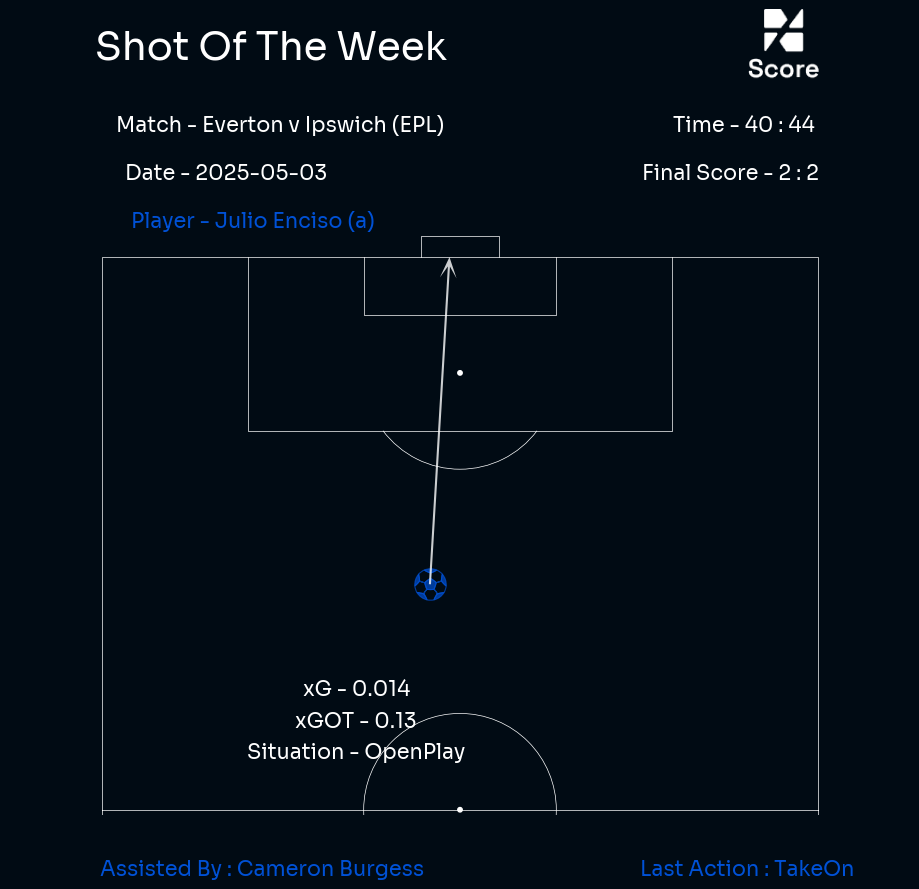

In [445]:
df_goal_low_xg1 = df_goal_low_xg.copy()
plot_goal_low_xg(df_goal_low_xg1)

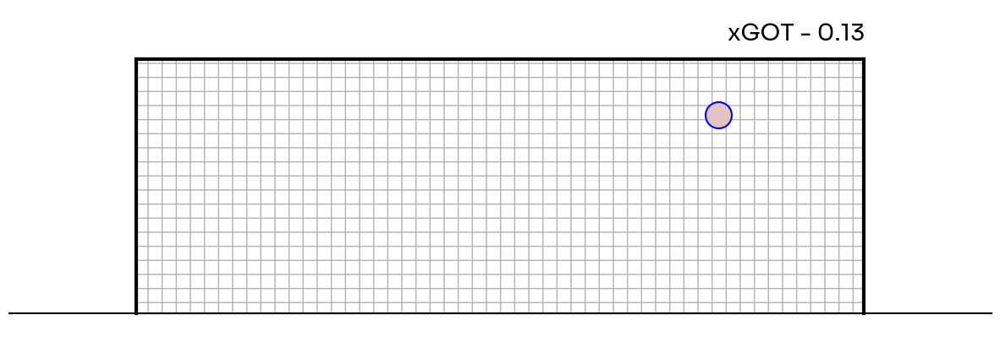

In [446]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mplsoccer import Pitch, VerticalPitch, FontManager
from mplsoccer import Sbopen
from matplotlib.patches import Rectangle

#Create figure
fig=plt.figure(facecolor='white')
fig.set_size_inches(15, 5)

#plt.gca().invert_xaxis()

# Goal post lines (shifted to the left by 1 unit)
plt.plot([29, 39], [0, 0], color='black', linewidth=1.5)
plt.plot([30.3, 37.7], [2.5, 2.5], color='black', linewidth=3)
plt.plot([37.7, 37.7], [0, 2.5], color='black', linewidth=3)
plt.plot([30.3, 30.3], [0, 2.5], color='black', linewidth=3)

# Goal net (shifted to the left by 1 unit)
plt.gca().add_patch(Rectangle((30.3, 0), 7.4, 2.5, fill=False, edgecolor='black', hatch='+', alpha=0.3))

#plt.gca().invert_yaxis()
#Tidy Axes
plt.axis('off')

df = df_goal_low_xg1.copy()

goal_mask = (df.result == 'Goal') 
sc1 = plt.scatter(68 - df[goal_mask].goalCrossedY, df[goal_mask].goalCrossedZ,marker='o', color='#e4c3c3', label='Goal',s=500,zorder=2,edgecolors = 'blue',linewidths=1.5)
fig.text(0.8, 0.82, f'xGOT - {round(df.xGOT.iloc[0], 2)}', color='black', fontsize=20,fontproperties=font_prop, zorder=3, ha='right', va='center')

#legend = plt.legend(loc='upper right', fontsize=12, facecolor='white', framealpha=0.8, markerscale=0.7, edgecolor='black')
plt.ylim(ymin=-0.2, ymax=3)
plt.xlim(xmin=29, xmax=39)
#plt.legend(loc='upper right')
#plt.legend(fontsize=14)

plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/ShotOfTheWeek2.png',dpi=500,bbox_inches = 'tight',facecolor='white')

## Miss of the Week

### Creating DataFrame

In [428]:
miss_high_xg = """select round("xG" :: numeric ,4) xg,"result",player,situation,h_team,a_team,league,h_a,"minute",date,player_assisted,"lastAction","X","Y"
from understat_shots_tb
where "date" > current_date - 4
and "result" != 'Goal' and situation != 'Penalty'
order by "xG" desc 
limit 1;"""

with engine.connect() as conn:
    df_miss_high_xg = pd.read_sql(miss_high_xg, conn)

In [429]:
df_miss_high_xg

,xg,result,player,situation,h_team,a_team,league,h_a,minute,date,player_assisted,lastAction,X,Y
0,0.7695,BlockedShot,Noni Madueke,OpenPlay,Chelsea,Liverpool,EPL,h,55,2025-05-04 15:30:00,Cole Palmer,None,0.97,0.507


In [8]:
if __name__ == "__main__":
    driver = webdriver.Chrome()
    
# whoscored match centre url of the required match (Example: Barcelona vs Sevilla)
url = "https://1xbet.whoscored.com/matches/1821377/live/england-premier-league-2024-2025-wolves-leicester"
match_data = main.getMatchData(driver, url, close_window=True)

# Match dataframe containing info about the match
matches_df = main.createMatchesDF(match_data)

# Events dataframe      
events_df = main.createEventsDF(match_data)

# match Id
matchId = match_data['matchId']

# Information about respective teams as dictionary
home_data = matches_df['home'][matchId]
away_data = matches_df['away'][matchId]

Region: England, League: Premier League, Season: 2024/2025, Match Id: 1821377


In [71]:
events_df['type'].unique()

array(['Start', 'Pass', 'Clearance', 'BallTouch', 'TakeOn', 'Tackle',
       'BallRecovery', 'Interception', 'Foul', 'Challenge',
       'CornerAwarded', 'Goal', 'OffsideGiven', 'OffsidePass',
       'OffsideProvoked', 'KeeperPickup', 'Dispossessed', 'MissedShots',
       'SavedShot', 'Save', 'Aerial', 'BlockedPass', 'ShieldBallOpp',
       'Card', 'End', 'KeeperSweeper', 'SubstitutionOff',
       'SubstitutionOn', 'FormationChange', 'ShotOnPost', 'FormationSet'],
      dtype=object)

In [9]:
player = df_miss_high_xg['player'].iloc[0]
minute = df_miss_high_xg['minute'].iloc[0]

#df_miss_high_xg['goalMouthZ'] = events_df[(events_df['type'] == 'SavedShot') & (events_df['playerName'] == player) & (events_df['minute'] == minute)]['goalMouthZ'].iloc[0]
#df_miss_high_xg['goalMouthY'] = events_df[(events_df['type'] == 'SavedShot') & (events_df['playerName'] == player) & (events_df['minute'] == minute)]['goalMouthY'].iloc[0]
df_miss_high_xg['second'] = events_df[(events_df['type'] == 'MissedShots') & (events_df['playerName'] == player)]['second'].iloc[0]
df_miss_high_xg['score'] = events_df[(events_df['type'] == 'MissedShots') & (events_df['playerName'] == player) ]['score'].iloc[0]
df_miss_high_xg['venueName'] =events_df[(events_df['type'] == 'MissedShots') & (events_df['playerName'] == player)]['venueName'].iloc[0]
df_miss_high_xg['date'] = events_df[(events_df['type'] == 'MissedShots') & (events_df['playerName'] == player)]['startDate'].iloc[0]
df_miss_high_xg['date'] = df_miss_high_xg['date'].str.split('T').str[0]

In [10]:
df_miss_high_xg

,xg,result,player,situation,h_team,a_team,league,h_a,minute,date,player_assisted,lastAction,X,Y,second,score,venueName
0,0.9466,MissedShots,Jørgen Strand Larsen,OpenPlay,Wolverhampton Wanderers,Leicester,EPL,h,51,2025-04-26,Marshall Munetsi,Pass,0.975,0.47,2.0,3 : 0,Molineux Stadium


In [132]:
df_miss_high_xg['X'] = 100 - df_miss_high_xg['playerCoordinates_x']
df_miss_high_xg['Y'] = 100 - df_miss_high_xg['playerCoordinates_y']
df_miss_high_xg['h_team'] = 'Young Boys'
df_miss_high_xg['a_team'] = 'Crvena Zvezda'
df_miss_high_xg['league'] = 'UCL'
df_miss_high_xg['minute'] = df_miss_high_xg['time']
df_miss_high_xg['player'] = df_miss_high_xg['player_name']
df_miss_high_xg['player_assisted'] = 'None'
df_miss_high_xg['lastAction'] = 'Pass'
df_miss_high_xg['result'] = df_miss_high_xg['shotType']
df_miss_high_xg['situation'] = 'OpenPlay'

### Plotting

In [12]:
def plot_miss_high_xg(df,teamcolor):
    #background = 'green'
    df['X'] = (df['X'] / 100) * 105 * 100
    df['Y'] = (df['Y'] / 100) * 68 * 100
    
    pitch = VerticalPitch(
    pitch_type='uefa',
    goal_type = 'box',
    half=True, 
    pitch_color=background, 
    stripe=False,
    pad_bottom=.5, 
    line_color='white',
    linewidth=.5,
    axis=True, 
    label=True
    )

    # create a subplot with 2 rows and 1 column
    fig = plt.figure(figsize=(9, 12))
    fig.patch.set_facecolor(background)

    ax1 = fig.add_axes([0, 0.7, 1, .2])
    ax1.set_facecolor(background)
    ax1.set_xlim(0, 1)
    ax1.set_ylim(0, 1)

    ax1.text(
        x=0.29, 
        y=.9, 
        s='Miss Of The Week', 
        fontsize=28, 
        fontproperties=font_prop,  
        color='white', 
        ha='center'
    )

    ax1.text(
        x=0.32, 
        y=0.6, 
        s=f"Match - {df['h_team'].iloc[0]} v {df['a_team'].iloc[0]} ({df['league'].iloc[0]})", 
        fontsize=15, 
        fontproperties=font_prop, 
        color='white', 
        ha='center'
    )
    
    ax1.text(
        x=0.815, 
        y=.6, 
        s=f"Time - {df['minute'].iloc[0]} : {df['second'].iloc[0]}", 
        fontsize=15,
        fontproperties=font_prop, 
        color='white', 
        ha='center'
    )

    ax1.text(
        x=0.21, 
        y=0.4, 
        s=f"Date - {df['date'].iloc[0]}", 
        fontsize=15, 
        fontproperties=font_prop, 
        color='white', 
        ha='center'
    )

    ax1.text(
        x=0.25, 
        y=.2, 
        s=f"Player - {df['player'].iloc[0]} ({df['h_a'].iloc[0]})", 
        fontsize=15,
        fontproperties=font_prop, 
        color=teamcolor, 
        ha='center'
    )

    ax1.text(
        x=0.8, 
        y=.4, 
        s=f"Final Score - {df['score'].iloc[0]}", 
        fontsize=15,
        fontproperties=font_prop, 
        color='white', 
        ha='center'
    )

    logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Score Logos-20241022T100701Z-001/Score Logos/ScoreSquareWhite.png')

    ax_image = add_image(
        logo, fig, left=0.82, bottom=0.85, width=0.08, height=0.08,aspect='equal'
    )
    

    ax1.set_axis_off()

    
    ax2 = fig.add_axes([.05, 0.25, .9, .5])
    ax2.set_facecolor(background)
    
    pitch.draw(ax=ax2)

    pitch.scatter(
        df['X'].iloc[0], 
        df['Y'].iloc[0], 
        s=1000 * df['xg'].iloc[0], 
        color=teamcolor,
        marker='o',
        ax=ax2,
        alpha=.7,
        linewidths=.8,
        edgecolor='white'
    )
    pitch.annotate(f"xG - {round(df['xg'].iloc[0],2)}",
        xy=(df['X'].iloc[0]-21,df['Y'].iloc[0]+1),
        fontsize=15, 
        fontproperties=font_prop, 
        color=teamcolor, 
        ha='center', va='center',
        ax=ax2
    )

    pitch.annotate(f"Situation - {df['situation'].iloc[0]}",
        xy=(df['X'].iloc[0]-24,df['Y'].iloc[0]+1),
        fontsize=15, 
        fontproperties=font_prop, 
        color=teamcolor, 
        ha='center', va='center',
        ax=ax2
    )
    pitch.annotate(f"Result - {df['result'].iloc[0]}",
        xy=(df['X'].iloc[0]-27,df['Y'].iloc[0]+1),
        fontsize=15, 
        fontproperties=font_prop, 
        color=teamcolor, 
        ha='center', va='center',
        ax=ax2
    )

    

        
    ax2.set_axis_off()
    
    # add another axis for the stats
    ax3 = fig.add_axes([0, 0.2, 1, .05])
    ax3.set_facecolor(background)
    ax3.set_xlim(0, 1)
    ax3.set_ylim(0, 1)

    ax3.text(
        x=0.1, 
        y=0, 
        s=f"Assisted By : {df['player_assisted'].iloc[0]}", 
        fontsize=15, 
        fontproperties=font_prop, 
        color=teamcolor, 
        ha='left'
    )

    ax3.text(
        x=0.66, 
        y=0, 
        s=f"Last Action : {df['lastAction'].iloc[0]}", 
        fontsize=15, 
        fontproperties=font_prop, 
        color=teamcolor, 
        ha='left'
    )


    ax3.set_axis_off()
    plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/MissOfTheWeek.png',dpi=500,bbox_inches = 'tight',facecolor=background)

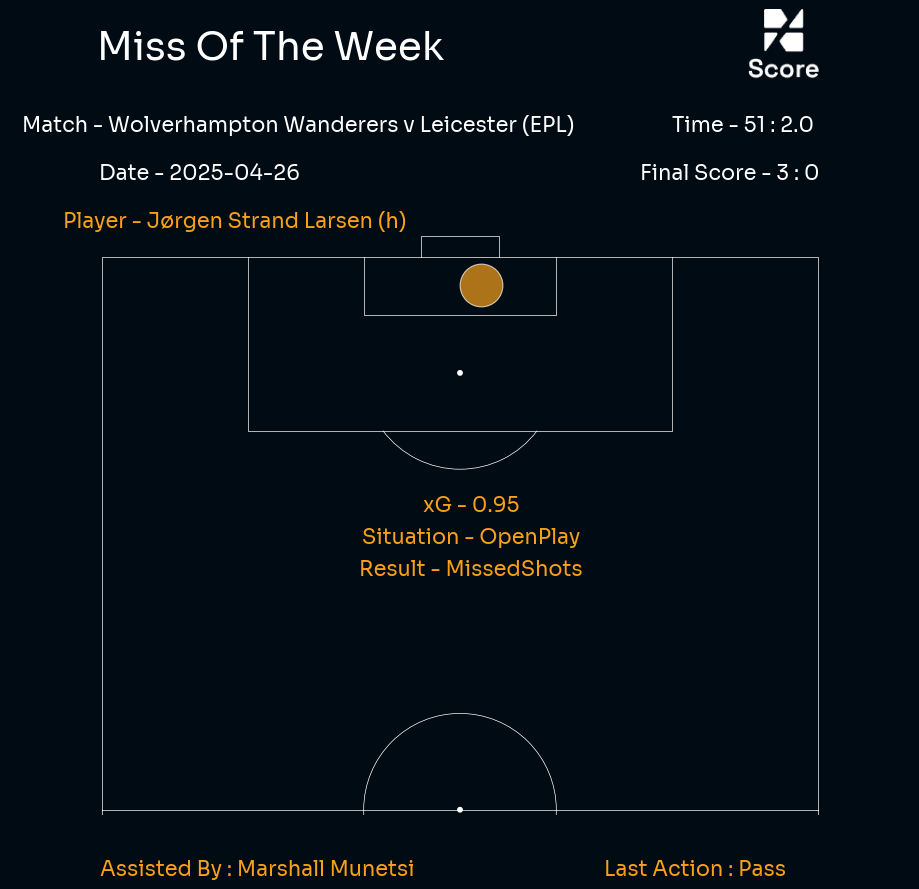

In [13]:
df_miss_high_xg1 = df_miss_high_xg.copy()
plot_miss_high_xg(df_miss_high_xg1,'#F8A01A')

## Save Of the Week

In [430]:
gk_save_xg = """select round("xG" :: numeric ,4) xg,"result",player,situation,h_team,a_team,league,h_a,"minute",date,player_assisted,"lastAction","X","Y"
from understat_shots_tb
where "date" > current_date - 7
and "result" = 'SavedShot' and situation != 'Penalty'
order by "xG" desc 
limit 1;"""

with engine.connect() as conn:
    df_gk_save_xg = pd.read_sql(gk_save_xg, conn)

In [431]:
df_gk_save_xg

,xg,result,player,situation,h_team,a_team,league,h_a,minute,date,player_assisted,lastAction,X,Y
0,0.6146,SavedShot,Christian Pulisic,OpenPlay,Genoa,AC Milan,Serie_A,a,40,2025-05-05 18:45:00,Rafael Leão,TakeOn,0.954,0.44


In [89]:
shots_df = scrape_shots(4514039)

In [91]:
shots_df[(shots_df['playerName'] == 'André Ayew') & (shots_df['eventType'] == 'AttemptSaved')]

,id,eventType,teamId,playerId,playerName,x,y,min,minAdded,isBlocked,isOnTarget,blockedX,blockedY,goalCrossedY,goalCrossedZ,expectedGoals,expectedGoalsOnTarget,shotType,situation,period,isOwnGoal,onGoalShot,isSavedOffLine,isFromInsideBox,keeperId,firstName,lastName,fullName,teamColor,matchId
7,2793809673,AttemptSaved,9746,95955,André Ayew,101.301724,33.92375,39,NaN,False,True,104.336207,33.16125,34.4575,0.892526,0.892175,0.779226,LeftFoot,RegularPlay,FirstHalf,False,"{'x': 0.8789682539682532, 'y': 0.2361180717989...",False,True,167035.0,André,Ayew,André Ayew,#6fb0d8,4514039


In [92]:
df_gk_save_xg['xGOT'] = 0.779
df_gk_save_xg['xg'] = 0.892
df_gk_save_xg['goalCrossedY'] = 34.4575
df_gk_save_xg['goalCrossedZ'] = 0.892526

In [93]:
df_gk_save_xg

,xg,result,player,situation,h_team,a_team,league,h_a,minute,date,player_assisted,lastAction,X,Y,xGOT,goalCrossedY,goalCrossedZ
0,0.892,SavedShot,André Ayew,OpenPlay,Le Havre,Nantes,Ligue_1,h,38,2025-03-30 16:15:00,Josué Casimir,Pass,0.957,0.5,0.779,34.4575,0.892526


In [94]:
if __name__ == "__main__":
    driver = webdriver.Chrome()
    
# whoscored match centre url of the required match (Example: Barcelona vs Sevilla)
url = "https://1xbet.whoscored.com/matches/1824915/live/france-ligue-1-2024-2025-le-havre-nantes"
match_data = main.getMatchData(driver, url, close_window=True)

# Match dataframe containing info about the match
matches_df = main.createMatchesDF(match_data)

# Events dataframe      
events_df = main.createEventsDF(match_data)

# match Id
matchId = match_data['matchId']

# Information about respective teams as dictionary
home_data = matches_df['home'][matchId]
away_data = matches_df['away'][matchId]

Region: France, League: Ligue 1, Season: 2024/2025, Match Id: 1824915


In [95]:
player = 'André Ayew'
df_gk_save_xg['second'] = events_df[(events_df['type'] == 'SavedShot') & (events_df['playerName'] == player)]['second'].iloc[0]
df_gk_save_xg['score'] = events_df[(events_df['type'] == 'SavedShot') & (events_df['playerName'] == player)]['score'].iloc[0]
df_gk_save_xg['venueName'] = events_df[(events_df['type'] == 'SavedShot') & (events_df['playerName'] == player)]['venueName'].iloc[0]

In [97]:
df_gk_save_xg

,xg,result,player,situation,h_team,a_team,league,h_a,minute,date,player_assisted,lastAction,X,Y,xGOT,goalCrossedY,goalCrossedZ,second,score,venueName
0,0.892,SavedShot,André Ayew,OpenPlay,Le Havre,Nantes,Ligue_1,h,38,2025-03-30 16:15:00,Josué Casimir,Pass,0.957,0.5,0.779,34.4575,0.892526,35.0,3 : 2,Stade Océane


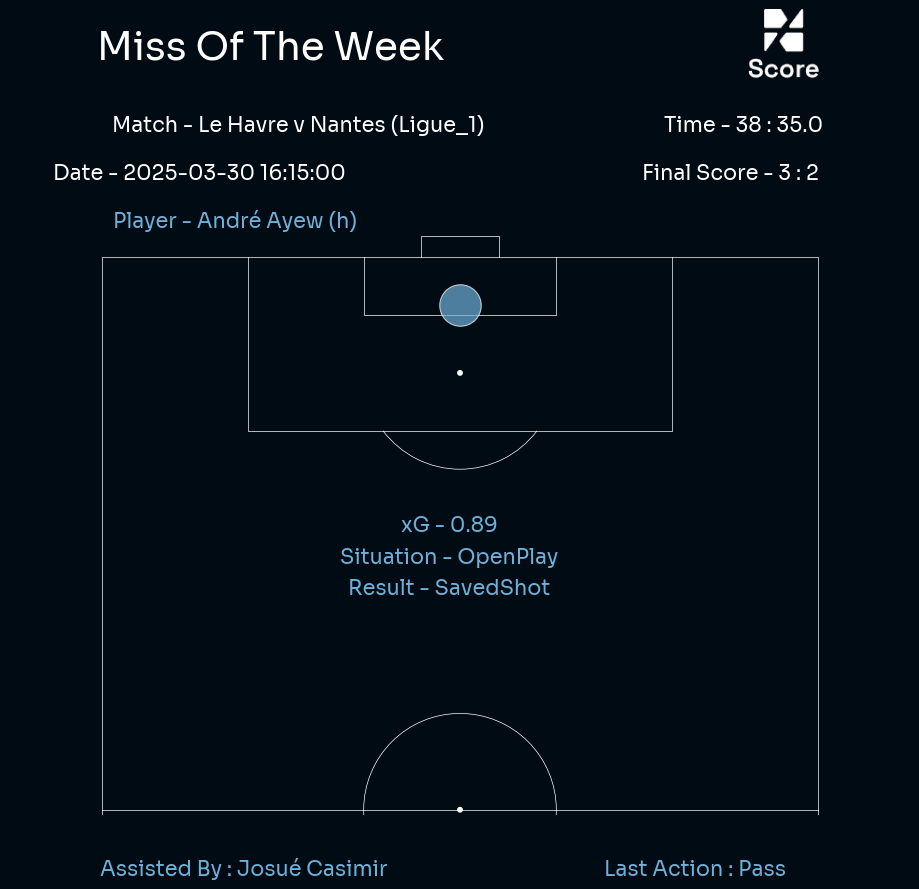

In [101]:
df_gk_save_xg1 = df_gk_save_xg.copy()
plot_miss_high_xg(df_gk_save_xg1,'#6fb0d8')

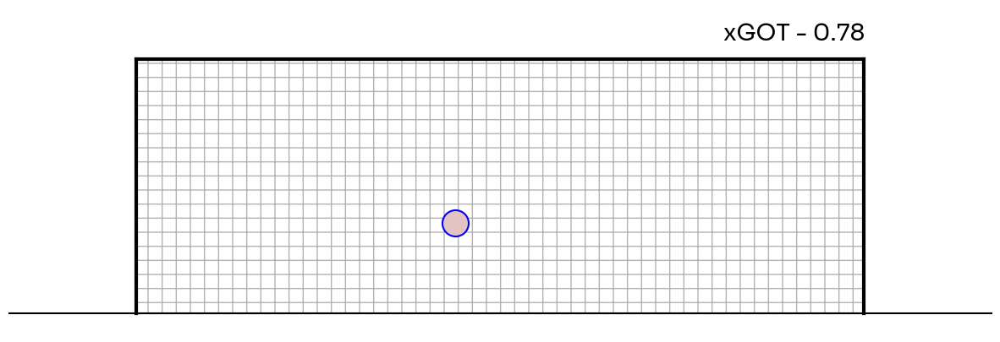

In [105]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mplsoccer import Pitch, VerticalPitch, FontManager
from mplsoccer import Sbopen
from matplotlib.patches import Rectangle

#Create figure
fig=plt.figure(facecolor='white')
fig.set_size_inches(15, 5)

#plt.gca().invert_xaxis()

# Goal post lines (shifted to the left by 1 unit)
plt.plot([29, 39], [0, 0], color='black', linewidth=1.5)
plt.plot([30.3, 37.7], [2.5, 2.5], color='black', linewidth=3)
plt.plot([37.7, 37.7], [0, 2.5], color='black', linewidth=3)
plt.plot([30.3, 30.3], [0, 2.5], color='black', linewidth=3)

# Goal net (shifted to the left by 1 unit)
plt.gca().add_patch(Rectangle((30.3, 0), 7.4, 2.5, fill=False, edgecolor='black', hatch='+', alpha=0.3))

#plt.gca().invert_yaxis()
#Tidy Axes
plt.axis('off')

df = df_gk_save_xg1.copy()

goal_mask = (df.result == 'SavedShot') 
sc1 = plt.scatter(68 - df[goal_mask].goalCrossedY, df[goal_mask].goalCrossedZ,marker='o', color='#e4c3c3', label='Goal',s=500,zorder=2,edgecolors = 'blue',linewidths=1.5)
fig.text(0.8, 0.82, f'xGOT - {round(df.xGOT.iloc[0], 2)}', color='black', fontsize=20,fontproperties=font_prop, zorder=3, ha='right', va='center')

#legend = plt.legend(loc='upper right', fontsize=12, facecolor='white', framealpha=0.8, markerscale=0.7, edgecolor='black')
plt.ylim(ymin=-0.2, ymax=3)
plt.xlim(xmin=29, xmax=39)
#plt.legend(loc='upper right')
#plt.legend(fontsize=14)

plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/SaveOfTheWeek2.png',dpi=500,bbox_inches = 'tight',facecolor='white')

## ShotMaps

### Top 9 Players Based on Number oof Shots Across Top 5 Leagues

In [153]:
query = """select player , count(*) as num_shots,
count(case when "result" = 'Goal' or "result" = 'SavedShot' or "result" = 'ShotOnPost' then 1 else null end) as num_shots_on_target,
count(case when "result" = 'Goal' then 1 else null end) as num_goals,
count(case when "result" = 'Goal' and situation != 'Penalty' then 1 else null end) as num_goals_non_penalty,
sum(round("xG" :: numeric ,2)) as total_xG,
sum(case when situation != 'Penalty' then round("xG" :: numeric ,2) else null end) as total_npxG
from understat_shots_tb ust
where season = '2024'
group by player
order by num_shots desc
limit 9;"""

with engine.connect() as conn:
    df_stats = pd.read_sql(query, conn)

In [154]:
df_stats

,player,num_shots,num_shots_on_target,num_goals,num_goals_non_penalty,total_xg,total_npxg
0,Erling Haaland,89,52,17,16,19.26,17.74
1,Mohamed Salah,83,44,18,13,16.73,12.93
2,Antoine Semenyo,82,26,6,6,9.03,9.03
3,Nikola Krstovic,81,28,6,5,7.77,6.25
4,Kylian Mbappe-Lottin,80,43,12,8,14.51,10.81
5,Omar Marmoush,77,38,15,13,10.47,8.95
6,Cole Palmer,77,35,14,11,10.87,8.59
7,Valentín Castellanos,73,29,7,5,12.15,9.87
8,Robert Lewandowski,66,36,16,14,18.34,16.12


In [155]:
df_stats['team'] = ['Man City','Liverpool','Bournemouth','Lecce','Real Madrid','Man City','Chelsea','Lazio','Barcelona']

In [156]:
query_shots = """ select "result","X","Y",situation,"shotType",player from understat_shots_tb ust
where season = '2024' and 
player in (select player from

(select player , count(*) as num_shots,
count(case when "result" = 'Goal' or "result" = 'SavedShot' or "result" = 'ShotOnPost' then 1 else null end) as num_shots_on_target,
count(case when "result" = 'Goal' then 1 else null end) as num_goals,
count(case when "result" = 'Goal' and situation != 'Penalty' then 1 else null end) as num_goals_non_penalty,
sum(round("xG" :: numeric ,2)) as total_xG,
sum(case when situation != 'Penalty' then round("xG" :: numeric ,2) else null end) as total_npxG
from understat_shots_tb ust
where season = '2024'
group by player
order by num_shots desc
limit 9) players);"""

with engine.connect() as conn:
    df_shots = pd.read_sql(query_shots, conn)

In [157]:
df_shots['player'].value_counts()

player
Erling Haaland          89
Mohamed Salah           83
Antoine Semenyo         82
Nikola Krstovic         81
Kylian Mbappe-Lottin    80
Omar Marmoush           77
Cole Palmer             77
Valentín Castellanos    73
Raphinha                66
Name: count, dtype: int64

### Top 9 Players Based on Number of Goals Across Top 5 Leagues

In [4]:
query = """select player , count(*) as num_shots,
count(case when "result" = 'Goal' or "result" = 'SavedShot' or "result" = 'ShotOnPost' then 1 else null end) as num_shots_on_target,
count(case when "result" = 'Goal' then 1 else null end) as num_goals,
count(case when "result" = 'Goal' and situation != 'Penalty' then 1 else null end) as num_goals_non_penalty,
sum(round("xG" :: numeric ,2)) as total_xG,
sum(case when situation != 'Penalty' then round("xG" :: numeric ,2) else null end) as total_npxG
from understat_shots_tb ust
where season = '2024'
group by player
order by num_goals desc
limit 9;"""

with engine.connect() as conn:
    df_stats = pd.read_sql(query, conn)

In [5]:
df_stats

,player,num_shots,num_shots_on_target,num_goals,num_goals_non_penalty,total_xg,total_npxg
0,Mohamed Salah,90,48,21,15,18.01,13.45
1,Harry Kane,76,39,21,12,18.74,11.90
2,Mateo Retegui,65,29,20,18,13.33,11.05
3,Erling Haaland,93,55,19,18,20.13,18.61
4,Robert Lewandowski,72,39,19,17,19.94,17.72
5,Alexander Isak,64,34,17,16,14.10,13.34
6,Chris Wood,45,27,17,14,11.93,9.65
7,Kylian Mbappe-Lottin,92,51,16,11,17.18,12.74
8,Ousmane Dembélé,63,36,16,15,12.06,11.30


In [6]:
df_stats['team'] = ['Liverpool','Bayern Munich','Atalanta','Man City','Barcelona','Newcastle','Nottingham Forest','Real Madrid','PSG']

In [7]:
query_shots = """ select "result","X","Y",situation,"shotType",player from understat_shots_tb ust
where season = '2024' and 
player in (select player from

(select player , count(*) as num_shots,
count(case when "result" = 'Goal' or "result" = 'SavedShot' or "result" = 'ShotOnPost' then 1 else null end) as num_shots_on_target,
count(case when "result" = 'Goal' then 1 else null end) as num_goals,
count(case when "result" = 'Goal' and situation != 'Penalty' then 1 else null end) as num_goals_non_penalty,
sum(round("xG" :: numeric ,2)) as total_xG,
sum(case when situation != 'Penalty' then round("xG" :: numeric ,2) else null end) as total_npxG
from understat_shots_tb ust
where season = '2024'
group by player
order by num_goals desc
limit 9) players);"""

with engine.connect() as conn:
    df_shots = pd.read_sql(query_shots, conn)

In [8]:
df_shots['player'].value_counts()

player
Erling Haaland          93
Kylian Mbappe-Lottin    92
Mohamed Salah           90
Harry Kane              76
Robert Lewandowski      72
Mateo Retegui           65
Alexander Isak          64
Ousmane Dembélé         63
Chris Wood              45
Name: count, dtype: int64

### Top 9 Players with most shots outside the box

In [854]:
query = """select player , count(*) as num_shots,
count(case when "result" = 'Goal' or "result" = 'SavedShot' or "result" = 'ShotOnPost' then 1 else null end) as num_shots_on_target,
count(case when "result" = 'Goal' then 1 else null end) as num_goals,
sum(round("xG" :: numeric ,2)) as total_xG
from understat_shots_tb ust
where season = '2024' AND ("X" <= 0.82 OR "Y" BETWEEN 0.8 AND 1 OR "Y" BETWEEN 0 AND 0.2) AND player <> 'Mason Greenwood'
group by player
order by num_shots desc
limit 9;"""

with engine.connect() as conn:
    df_stats = pd.read_sql(query, conn)

In [855]:
df_stats

,player,num_shots,num_shots_on_target,num_goals,total_xg
0,Cole Palmer,51,18,4,2.13
1,Eberechi Eze,46,12,2,1.78
2,Bruno Fernandes,43,14,4,1.72
3,Nikola Krstovic,42,18,2,1.54
4,Matheus Cunha,40,16,5,1.26
5,Nico Paz,37,14,1,1.12
6,Lamine Yamal,36,11,3,1.05
7,Raphinha,35,12,2,2.01
8,Téji Savanier,33,10,0,1.13


In [856]:
df_stats['team'] = ['Chelsea','Crystal Palace','Manchester United','Lecce','Wolves','Como','Barcelona','Barcelona','Montpellier']

In [861]:
query_shots = """ SELECT "result", "X", "Y", situation, "shotType", player
FROM understat_shots_tb ust
WHERE season = '2024' AND ("X" <= 0.82 OR "Y" BETWEEN 0.8 AND 1 OR "Y" BETWEEN 0 AND 0.2)
AND player IN (
    SELECT player
    FROM (
        SELECT player, 
               COUNT(*) AS num_shots,
               COUNT(CASE WHEN "result" IN ('Goal', 'SavedShot', 'ShotOnPost') THEN 1 END) AS num_shots_on_target,
               COUNT(CASE WHEN "result" = 'Goal' THEN 1 END) AS num_goals,
               SUM(ROUND("xG"::NUMERIC, 2)) AS total_xG
        FROM understat_shots_tb
        WHERE season = '2024' 
          AND ("X" <= 0.82 OR "Y" BETWEEN 0.8 AND 1 OR "Y" BETWEEN 0 AND 0.2)
          AND player <> 'Mason Greenwood'
        GROUP BY player
        ORDER BY num_shots DESC
        LIMIT 9
    ) AS top_players
);
"""

with engine.connect() as conn:
    df_shots = pd.read_sql(query_shots, conn)

In [862]:
df_shots['player'].value_counts()

player
Cole Palmer        51
Eberechi Eze       46
Bruno Fernandes    43
Nikola Krstovic    42
Matheus Cunha      40
Nico Paz           37
Lamine Yamal       36
Raphinha           35
Téji Savanier      33
Name: count, dtype: int64

### Plot

In [863]:
df = df_shots.copy()
df['X'] = (df['X'] / 100) * 105 * 100
df['Y'] = (df['Y'] / 100) * 68 * 100

In [864]:
df.columns

Index(['result', 'X', 'Y', 'situation', 'shotType', 'player'], dtype='object')

In [865]:
df_stats['team'].unique()

array(['Chelsea', 'Crystal Palace', 'Manchester United', 'Lecce',
       'Wolves', 'Como', 'Barcelona', 'Montpellier'], dtype=object)

In [867]:
df_stats

,player,num_shots,num_shots_on_target,num_goals,total_xg,team
0,Cole Palmer,51,18,4,2.13,Chelsea
1,Eberechi Eze,46,12,2,1.78,Crystal Palace
2,Bruno Fernandes,43,14,4,1.72,Manchester United
3,Nikola Krstovic,42,18,2,1.54,Lecce
4,Matheus Cunha,40,16,5,1.26,Wolves
5,Nico Paz,37,14,1,1.12,Como
6,Lamine Yamal,36,11,3,1.05,Barcelona
7,Raphinha,35,12,2,2.01,Barcelona
8,Téji Savanier,33,10,0,1.13,Montpellier


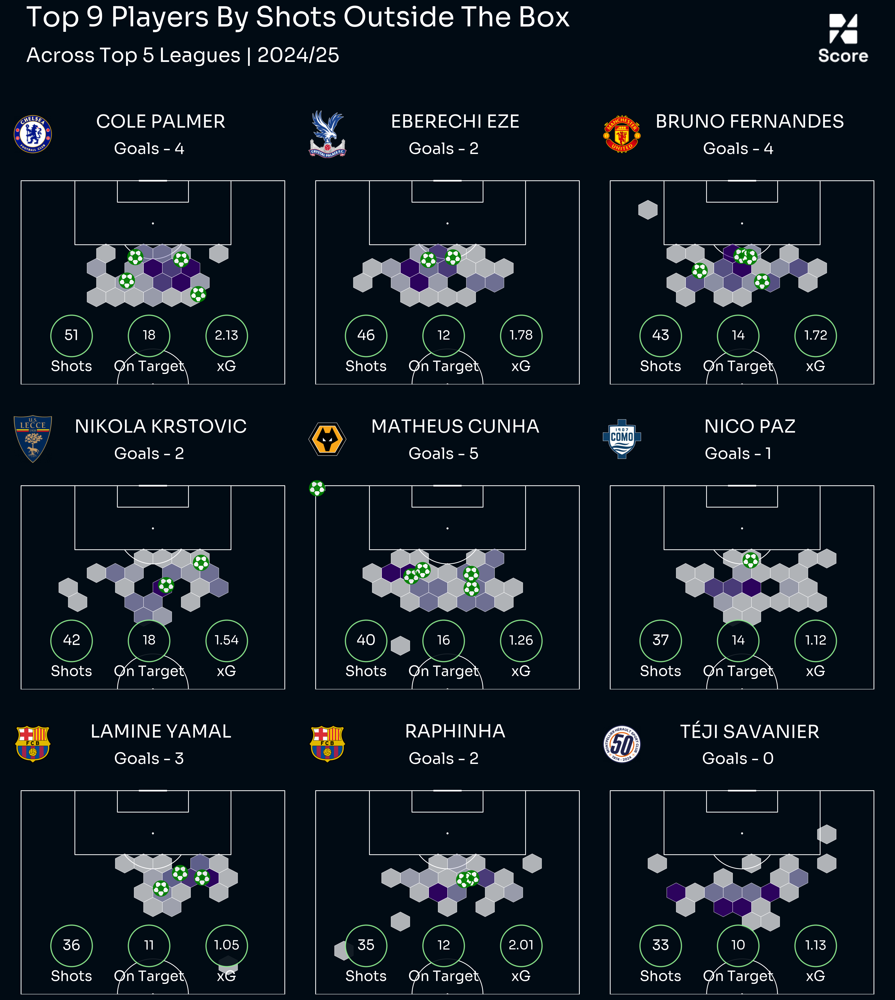

In [873]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

zoom_factor = 0.15

plt.rcParams['hatch.linewidth'] = 0.02
plt.rcParams['font.family'] = 'serif'
plt.style.use('fivethirtyeight')
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(18,30), dpi=300)
axs = axs.flatten()  # Flatten the axis array for easy iteration

logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Score Logos-20241022T100701Z-001/Score Logos/ScoreSquareWhite.png')

ax_image = add_image(
    logo, fig, left=0.88, bottom=0.75, width=0.05, height=0.05,aspect='equal'
)

img_url = 'C:\\Users\\acer\\Documents\\GitHub\\IndianCitizen\\ScorePredict\\Images\\TeamLogos'
for index, ax in enumerate(axs):
    pitch = VerticalPitch(
    pitch_type='uefa',
    goal_type = 'line',
    half=True, 
    pitch_color=background, 
    stripe=False, 
    line_color='white',
    linewidth=1,
    line_zorder=2,pad_bottom=0, pad_top=20
    )
    pitch.draw(ax=ax)

    ax.annotate(text=f"{df_stats['player'].iloc[index].upper()}", xy=(32, 120), size=23, color='white', ha='center', va='center', font=font_prop)
    team_name = df_stats['team'].iloc[index]
    img = plt.imread(f"{img_url}\\{team_name}.png")  # Adjust file path as needed
    im = OffsetImage(img, zoom=0.35)  # Adjust zoom for size
    ab = AnnotationBbox(
        im, 
        (65, 117),  # Adjust coordinates for image placement
        frameon=False,
        xycoords='data'
    )
    ax.add_artist(ab)
    
    
    #ax.annotate(text=f"Shots - {df_stats['num_shots'].iloc[index]}", xy=(45, 113), size=18, color='white', ha='center', va='center', font=font_prop)

    ax.annotate(text=f"Goals - {df_stats['num_goals'].iloc[index]}", xy=(35, 113), size=20, color='white', ha='center', va='center', font=font_prop)

    player_shots = df[df['player'] == df_stats['player'].iloc[index]]

    if not player_shots.empty:
        # Plot hexbin for the player's shots
        pitch.hexbin(
            player_shots.X, 
            player_shots.Y, 
            ax=ax, 
            edgecolors='white',
            gridsize=(14, 14), 
            cmap='Purples', 
            alpha=0.7, 
            zorder=3
        )

    player_goals = player_shots[(player_shots['result'] == 'Goal') & (player_shots['situation'] != 'Penalty')]
    pitch.scatter(player_goals.X, player_goals.Y,s=400, ax=ax, zorder=4, edgecolors='green',marker='football',
                          alpha=0.9, linewidths=1.2, c='white')

    pitch.scatter(65, 55,s=2800, ax=ax, zorder=4, edgecolors='lightgreen',alpha=0.9, lw=1.5, color=background)
    pitch.scatter(65, 35,s=2800, ax=ax, zorder=4, edgecolors='lightgreen',alpha=0.9, lw=1.5, color=background)
    pitch.scatter(65, 15,s=2800, ax=ax, zorder=4, edgecolors='lightgreen',alpha=0.9, lw=1.5, color=background)

    pitch.annotate(text=f"{df_stats['num_shots'].iloc[index]}",ax=ax, xy=(65, 55), size=18, color='white', ha='center', va='center',zorder=5, font=font_prop)
    pitch.annotate(text="Shots",ax=ax, xy=(57, 55), size=18, color='white', ha='center', va='center',zorder=5, font=font_prop)

    pitch.annotate(text=f"{df_stats['num_shots_on_target'].iloc[index]}",ax=ax, xy=(65, 35), size=16, color='white', ha='center', va='center',zorder=5, font=font_prop)
    pitch.annotate(text="On Target",ax=ax, xy=(57, 35), size=18, color='white', ha='center', va='center',zorder=5, font=font_prop)

    pitch.annotate(text=f"{df_stats['total_xg'].iloc[index]}",ax=ax, xy=(65, 15), size=16, color='white', ha='center', va='center',zorder=5, font=font_prop)
    pitch.annotate(text="xG",ax=ax, xy=(57, 15), size=18, color='white', ha='center', va='center',zorder=5, font=font_prop)


    
    

fig.patch.set_facecolor(background)
plt.subplots_adjust(wspace=0, hspace=-0.6)

fig.text(x=0.1, y=0.78, s=f"Top 9 Players By Shots Outside The Box", va="bottom", ha="left",
             fontsize=35, color="white", font=font_prop, weight="bold")
fig.text(x=0.1, y=0.76, s=f"Across Top 5 Leagues | 2024/25",color="white",
         va="bottom", ha="left", fontsize=25, font=font_prop)

plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/Top9EuropeShotsOutsideTheBox.png',dpi=500,bbox_inches = 'tight',facecolor=background)


In [ ]:
'Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Grays', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cmr.amber', 'cmr.amber_r', 'cmr.amethyst', 'cmr.amethyst_r', 'cmr.apple', 'cmr.apple_r', 'cmr.arctic', 'cmr.arctic_r', 'cmr.bubblegum', 'cmr.bubblegum_r', 'cmr.chroma', 'cmr.chroma_r', 'cmr.copper', 'cmr.copper_r', 'cmr.copper_s', 'cmr.copper_s_r', 'cmr.cosmic', 'cmr.cosmic_r', 'cmr.dusk', 'cmr.dusk_r', 'cmr.eclipse', 'cmr.eclipse_r', 'cmr.ember', 'cmr.ember_r', 'cmr.emerald', 'cmr.emerald_r', 'cmr.emergency', 'cmr.emergency_r', 'cmr.emergency_s', 'cmr.emergency_s_r', 'cmr.fall', 'cmr.fall_r', 'cmr.flamingo', 'cmr.flamingo_r', 'cmr.freeze', 'cmr.freeze_r', 'cmr.fusion', 'cmr.fusion_r', 'cmr.gem', 'cmr.gem_r', 'cmr.ghostlight', 'cmr.ghostlight_r', 'cmr.gothic', 'cmr.gothic_r', 'cmr.guppy', 'cmr.guppy_r', 'cmr.holly', 'cmr.holly_r', 'cmr.horizon', 'cmr.horizon_r', 'cmr.iceburn', 'cmr.iceburn_r', 'cmr.infinity', 'cmr.infinity_r', 'cmr.infinity_s', 'cmr.infinity_s_r', 'cmr.jungle', 'cmr.jungle_r', 'cmr.lavender', 'cmr.lavender_r', 'cmr.lilac', 'cmr.lilac_r', 'cmr.neon', 'cmr.neon_r', 'cmr.neutral', 'cmr.neutral_r', 'cmr.nuclear', 'cmr.nuclear_r', 'cmr.ocean', 'cmr.ocean_r', 'cmr.pepper', 'cmr.pepper_r', 'cmr.pride', 'cmr.pride_r', 'cmr.prinsenvlag', 'cmr.prinsenvlag_r', 'cmr.rainforest', 'cmr.rainforest_r', 'cmr.redshift', 'cmr.redshift_r', 'cmr.sapphire', 'cmr.sapphire_r', 'cmr.savanna', 'cmr.savanna_r', 'cmr.seasons', 'cmr.seasons_r', 'cmr.seasons_s', 'cmr.seasons_s_r', 'cmr.seaweed', 'cmr.seaweed_r', 'cmr.sepia', 'cmr.sepia_r', 'cmr.sunburst', 'cmr.sunburst_r', 'cmr.swamp', 'cmr.swamp_r', 'cmr.torch', 'cmr.torch_r', 'cmr.toxic', 'cmr.toxic_r', 'cmr.tree', 'cmr.tree_r', 'cmr.tropical', 'cmr.tropical_r', 'cmr.viola', 'cmr.viola_r', 'cmr.voltage', 'cmr.voltage_r', 'cmr.waterlily', 'cmr.waterlily_r', 'cmr.watermelon', 'cmr.watermelon_r', 'cmr.wildfire', 'cmr.wildfire_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'crest', 'crest_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'flare', 'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_grey', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gist_yerg', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'grey', 'hot', 'hot_r', 'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'mako', 'mako_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'rocket', 'rocket_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'vlag', 'vlag_r', 'winter', 'winter_r'

### PLayerShotMap

In [14]:
query = """select *
from understat_shots_tb ust
where player = 'Georges Mikautadze'"""

with engine.connect() as conn:
    df_shots = pd.read_sql(query, conn)

In [109]:
df_shots[df_shots['season'] == 2024]['shotType'].value_counts()

shotType
RightFoot        24
Head              7
LeftFoot          7
OtherBodyPart     1
Name: count, dtype: int64

In [181]:
df_shots = final_shots_df.copy()

In [221]:
brobbey = df_shots[df_shots['playerName'] == 'Brian Brobbey']
wout = df_shots[df_shots['playerName'] == 'Wout Weghorst']

In [249]:
def plot_shotmap_understat_player(df,name,teamcolor):
    #df1 = df_shots[(df_shots['h_team'] == team) & (df_shots['h_a'] == 'h')]
    #df2 = df_shots[(df_shots['a_team'] == team) & (df_shots['h_a'] == 'a')]
    #teamdf = pd.concat([df1, df2], ignore_index=True)
    #df = teamdf[teamdf['player'] == player]
    #df['x'] = (df['x'] / 100) * 105 * 100
    #df['y'] = (df['y'] / 100) * 68 * 100
    total_shots = df.shape[0]
    total_goals = df[df['eventType'] == 'Goal'].shape[0]
    total_xG = df['expectedGoals'].sum()
    total_xGOT = df['expectedGoalsOnTarget'].sum()
    xG_per_shot = total_xG / total_shots
    points_average_distance = df['x'].mean()
    actual_average_distance = 105 - (df['x'] * 1.2).mean()

    pitch = VerticalPitch(
    pitch_type='uefa', 
    half=True, 
    pitch_color=background, 
    pad_bottom=.5, 
    line_color='white',
    linewidth=.5,
    axis=True, 
    label=True
    )

    # create a subplot with 2 rows and 1 column
    fig = plt.figure(figsize=(10, 12))
    fig.patch.set_facecolor(background)
    
    ax1 = fig.add_axes([0, 0.7, 1, .2])
    ax1.set_facecolor(background)
    ax1.set_xlim(0, 1)
    ax1.set_ylim(0, 1)

    ax1.text(
    x=0.25, 
    y=0.4, 
    s=f'Low Quality Chance', 
    fontsize=12, 
    fontproperties=font_prop, 
    color='white', 
    ha='center'
    )

    # add a scatter point between the two texts
    ax1.scatter(
        x=0.37, 
        y=0.43, 
        s=100, 
        color=background, 
        edgecolor=teamcolor, 
        linewidth=.8
    )
    ax1.scatter(
        x=0.42, 
        y=0.43, 
        s=200, 
        color=background, 
        edgecolor=teamcolor, 
        linewidth=.8
    )
    ax1.scatter(
        x=0.48, 
        y=0.43, 
        s=300, 
        color=background, 
        edgecolor=teamcolor, 
        linewidth=.8
    )
    ax1.scatter(
        x=0.54, 
        y=0.43, 
        s=400, 
        color=background, 
        edgecolor=teamcolor, 
        linewidth=.8
    )
    ax1.scatter(
        x=0.6, 
        y=0.43, 
        s=500, 
        color=background, 
        edgecolor=teamcolor, 
        linewidth=.8
    )

    ax1.text(
        x=0.75, 
        y=0.4, 
        s=f'High Quality Chance', 
        fontsize=12, 
        fontproperties=font_prop, 
        color='white', 
        ha='center'
    )

    ax1.text(
        x=0.5, 
        y=0.6, 
        s=f'{name}', 
        fontsize=20, 
        fontproperties=font_prop, 
        color='white', 
        ha='center'
    )

    ax1.set_axis_off()


    ax2 = fig.add_axes([.05, 0.25, .9, .5])
    ax2.set_facecolor(background)
    
    pitch.draw(ax=ax2)

    for shot in df.to_dict(orient='records'):
        #print(shot)
        pitch.scatter(
            shot['x'], 
            shot['y'], 
            s=600 * shot['expectedGoals'], 
            c=teamcolor if shot['eventType'] == 'Goal' else 'white',
            marker = 'football' if shot['eventType'] == 'Goal' else 'o',
            ax=ax2,
            zorder=4,
            alpha=.7,
            linewidths=.8,
            edgecolors=background if shot['eventType'] == 'Goal' else teamcolor
        )
        
    ax2.set_axis_off()
    
    # add another axis for the stats
    ax3 = fig.add_axes([0, .2, 1, .05])
    ax3.set_facecolor(background)
    ax3.set_xlim(0, 1)
    ax3.set_ylim(0, 1)

    ax3.text(
        x=0.25, 
        y=.5, 
        s='Shots', 
        fontsize=20, 
        fontproperties=font_prop, 
        fontweight='bold', 
        color='white', 
        ha='left'
    )
    
    ax3.text(
        x=0.25, 
        y=0, 
        s=f'{total_shots}', 
        fontsize=16, 
        fontproperties=font_prop, 
        color=teamcolor, 
        ha='left'
    )

    ax3.text(
        x=0.38, 
        y=.5, 
        s='Goals', 
        fontsize=20, 
        fontproperties=font_prop, 
        fontweight='bold', 
        color='white', 
        ha='left'
    )
    
    ax3.text(
        x=0.38, 
        y=0, 
        s=f'{total_goals}', 
        fontsize=16, 
        fontproperties=font_prop, 
        color=teamcolor, 
        ha='left'
    )

    ax3.text(
        x=0.53, 
        y=.5, 
        s='xG', 
        fontsize=20, 
        fontproperties=font_prop, 
        fontweight='bold', 
        color='white', 
        ha='left'
    )

    ax3.text(
        x=0.53, 
        y=0, 
        s=f'{total_xG:.2f}', 
        fontsize=16, 
        fontproperties=font_prop, 
        color=teamcolor, 
        ha='left'
    )

    ax3.text(
        x=0.63, 
        y=.5, 
        s='xGOT', 
        fontsize=20, 
        fontproperties=font_prop, 
        fontweight='bold', 
        color='white', 
        ha='left'
    ) 
    
    ax3.text(
        x=0.63, 
        y=0, 
        s=f'{total_xGOT:.2f}', 
        fontsize=16, 
        fontproperties=font_prop, 
        color=teamcolor, 
        ha='left'
    )

    ax3.set_axis_off()
    plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/{name}.png',dpi=500,bbox_inches = 'tight',facecolor=background)


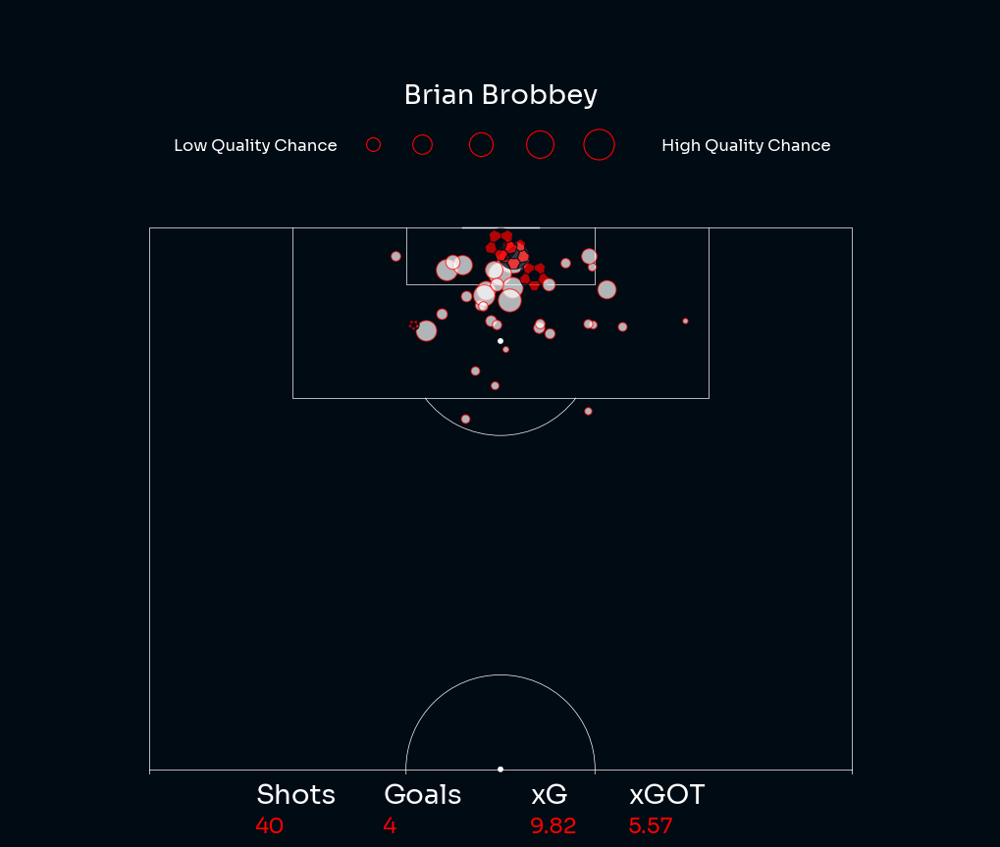

In [251]:
plot_shotmap_understat_player(brobbey,'Brian Brobbey','red')

## Scatter Plots for Different Metrics

In [526]:
#https://x.com/DataAnalyticEPL/status/1869757409042006186

### OpenPlay V SetPiece xG

In [226]:
query = """SELECT 
    CASE 
        WHEN h_a = 'h' THEN h_team 
        ELSE a_team 
    END AS team,
    SUM(ROUND(CASE WHEN situation = 'OpenPlay' THEN "xG"::NUMERIC ELSE 0 END, 2)) AS xG_openplay,
    SUM(ROUND(CASE WHEN situation = 'SetPiece' or situation = 'FromCorner' or situation = 'DirectFreekick' THEN "xG"::NUMERIC ELSE 0 END, 2)) AS xG_setpiece
FROM understat_shots_tb ust
WHERE 
    season = '2024' 
    AND league = 'Ligue_1'
GROUP BY 
    CASE 
        WHEN h_a = 'h' THEN h_team 
        ELSE a_team 
    END;"""

with engine.connect() as conn:
    df = pd.read_sql(query, conn)

In [227]:
df.to_csv('OpenPLayVsSetPiece_2025.csv')

In [204]:
df.loc[19, "team"] = "Wolves"

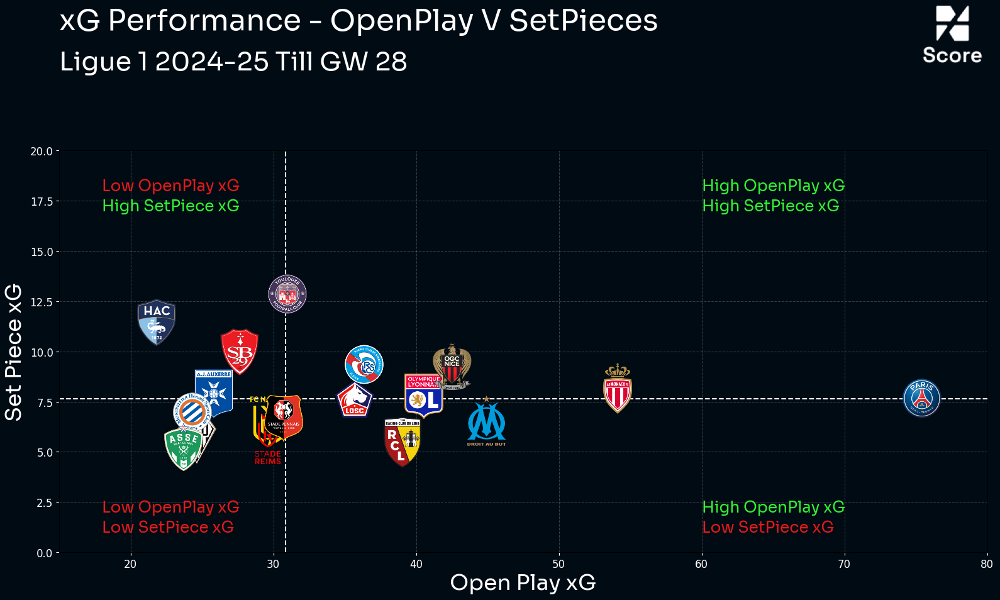

In [219]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import pandas as pd
from PIL import Image

# Function to load logos
def get_team_logo(team_name, logo_dir='C://Users//acer//Desktop//IndianCityzen//football-logos-master//logos//France - Ligue 1//'):
    logo_path = f"{logo_dir}{team_name}.png"
    try:
        logo = Image.open(logo_path)
        return logo
    except FileNotFoundError:
        print(f"Logo for {team_name} not found at {logo_path}")
        return None

# Create scatter plot
fig, ax = plt.subplots(figsize=(16, 10))
fig.patch.set_facecolor(background)
ax.patch.set_facecolor(background)

for _, row in df.iterrows():
    team, xg_openplay, xg_setpiece = row['team'], row['xg_openplay'], row['xg_setpiece']
    logo = get_team_logo(team)
    if logo:
        imagebox = OffsetImage(logo, zoom=0.32)  # Adjust zoom for size
        ab = AnnotationBbox(imagebox, (xg_openplay, xg_setpiece), frameon=False)
        ax.add_artist(ab)
    else:
        # Plot a regular scatter point if logo not found
        ax.scatter(xg_openplay, xg_setpiece, color='red', label=team)

median_openplay_xG = df['xg_openplay'].median()
median_setpiece_xG = df['xg_setpiece'].median()
ax.axvline(median_openplay_xG, color='white', linestyle='--', lw=1.5, label=f'Median Open Play xG ({median_openplay_xG:.2f})')
ax.axhline(median_setpiece_xG, color='white', linestyle='--', lw=1.5, label=f'Median Set Piece xG ({median_setpiece_xG:.2f})')

logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Score Logos-20241022T100701Z-001/Score Logos/ScoreSquareWhite.png')

ax_image = add_image(
    logo, fig, left=0.9, bottom=0.85, width=0.1, height=0.1,aspect='equal'
)

# Customize the plot
ax.set_xlim(15, 80)
ax.set_ylim(0, 20)
ax.set_xlabel('Open Play xG',font=font_prop,color='white', fontsize=25)
ax.set_ylabel('Set Piece xG',font=font_prop,color='white', fontsize=25)
#ax.set_title('Premier League\n 2024-25 Till GW 27',font=font_prop,color='white', fontsize=30,y=1.08, fontweight='bold')

title_text = f"xG Performance - OpenPlay V SetPieces"
subtitle_text = "Ligue 1 2024-25 Till GW 28"

# Title
ax.text(15, 26, title_text, fontweight="bold",fontproperties=font_prop, fontsize=34, color='w')
ax.text(15, 24, subtitle_text, fontweight="regular",fontproperties=font_prop, fontsize=30, color='w')

ax.text(60,18,'High OpenPlay xG',font=font_prop,color='#34F132', fontsize=18)
ax.text(60,17,'High SetPiece xG',font=font_prop,color='#34F132', fontsize=18)


ax.text(18,18,'Low OpenPlay xG',font=font_prop,color='#E61919', fontsize=18)
ax.text(18,17,'High SetPiece xG',font=font_prop,color='#34F132', fontsize=18)

ax.text(60,2,'High OpenPlay xG',font=font_prop,color='#34F132', fontsize=18)
ax.text(60,1,'Low SetPiece xG',font=font_prop,color='#E61919', fontsize=18)

ax.text(18,2,'Low OpenPlay xG',font=font_prop,color='#E61919', fontsize=18)
ax.text(18,1,'Low SetPiece xG',font=font_prop,color='#E61919', fontsize=18)


ax.tick_params(axis='x', colors='white', labelsize=12)  # X-axis tick labels in green
ax.tick_params(axis='y', colors='white', labelsize=12)
ax.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()

plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/OpenPlayVSetPieceLigue1_25.png',dpi=500,bbox_inches = 'tight',facecolor=background)


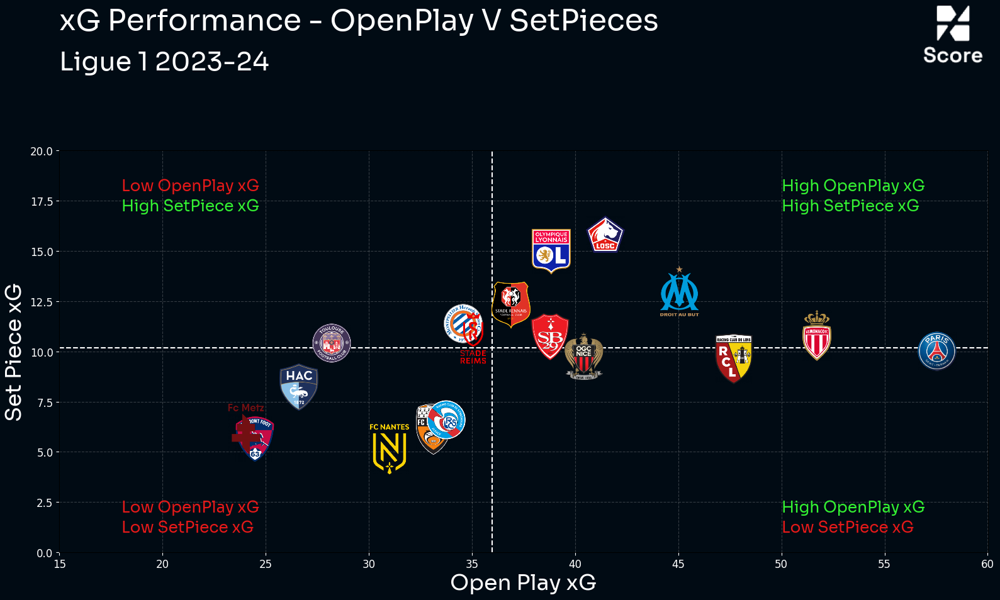

In [215]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import pandas as pd
from PIL import Image

# Function to load logos
def get_team_logo(team_name, logo_dir='C://Users//acer//Desktop//IndianCityzen//football-logos-master//logos//France - Ligue 1//'):
    logo_path = f"{logo_dir}{team_name}.png"
    try:
        logo = Image.open(logo_path)
        return logo
    except FileNotFoundError:
        print(f"Logo for {team_name} not found at {logo_path}")
        return None

# Create scatter plot
fig, ax = plt.subplots(figsize=(16, 10))
fig.patch.set_facecolor(background)
ax.patch.set_facecolor(background)

for _, row in df.iterrows():
    team, xg_openplay, xg_setpiece = row['team'], row['xg_openplay'], row['xg_setpiece']
    logo = get_team_logo(team)
    if logo:
        imagebox = OffsetImage(logo, zoom=0.32)  # Adjust zoom for size
        ab = AnnotationBbox(imagebox, (xg_openplay, xg_setpiece), frameon=False)
        ax.add_artist(ab)
    else:
        # Plot a regular scatter point if logo not found
        ax.scatter(xg_openplay, xg_setpiece, color='red', label=team)

median_openplay_xG = df['xg_openplay'].median()
median_setpiece_xG = df['xg_setpiece'].median()
ax.axvline(median_openplay_xG, color='white', linestyle='--', lw=1.5, label=f'Median Open Play xG ({median_openplay_xG:.2f})')
ax.axhline(median_setpiece_xG, color='white', linestyle='--', lw=1.5, label=f'Median Set Piece xG ({median_setpiece_xG:.2f})')

logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Score Logos-20241022T100701Z-001/Score Logos/ScoreSquareWhite.png')

ax_image = add_image(
    logo, fig, left=0.9, bottom=0.85, width=0.1, height=0.1,aspect='equal'
)

# Customize the plot
ax.set_xlim(15, 60)
ax.set_ylim(0, 20)
ax.set_xlabel('Open Play xG',font=font_prop,color='white', fontsize=25)
ax.set_ylabel('Set Piece xG',font=font_prop,color='white', fontsize=25)
#ax.set_title('Premier League\n 2024-25 Till GW 27',font=font_prop,color='white', fontsize=30,y=1.08, fontweight='bold')

title_text = f"xG Performance - OpenPlay V SetPieces"
subtitle_text = "Ligue 1 2023-24"

# Title
ax.text(15, 26, title_text, fontweight="bold",fontproperties=font_prop, fontsize=34, color='w')
ax.text(15, 24, subtitle_text, fontweight="regular",fontproperties=font_prop, fontsize=30, color='w')

ax.text(50,18,'High OpenPlay xG',font=font_prop,color='#34F132', fontsize=18)
ax.text(50,17,'High SetPiece xG',font=font_prop,color='#34F132', fontsize=18)


ax.text(18,18,'Low OpenPlay xG',font=font_prop,color='#E61919', fontsize=18)
ax.text(18,17,'High SetPiece xG',font=font_prop,color='#34F132', fontsize=18)

ax.text(50,2,'High OpenPlay xG',font=font_prop,color='#34F132', fontsize=18)
ax.text(50,1,'Low SetPiece xG',font=font_prop,color='#E61919', fontsize=18)

ax.text(18,2,'Low OpenPlay xG',font=font_prop,color='#E61919', fontsize=18)
ax.text(18,1,'Low SetPiece xG',font=font_prop,color='#E61919', fontsize=18)


ax.tick_params(axis='x', colors='white', labelsize=12)  # X-axis tick labels in green
ax.tick_params(axis='y', colors='white', labelsize=12)
ax.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()

plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/OpenPlayVSetPieceLigue1_24.png',dpi=500,bbox_inches = 'tight',facecolor=background)


### xG Home V Away

In [272]:
query = """SELECT 
    CASE 
        WHEN h_a = 'h' THEN h_team  -- Home team shot
        WHEN h_a = 'a' THEN a_team  -- Away team shot
    END AS team,
    SUM(CASE WHEN h_a = 'h' THEN "xG" ELSE 0 END) AS xG_home,
    SUM(CASE WHEN h_a = 'a' THEN "xG" ELSE 0 END) AS xG_away,
    SUM(CASE WHEN h_a = 'h' AND result = 'Goal' THEN 1 ELSE 0 END) AS goals_home,
    SUM(CASE WHEN h_a = 'a' AND result = 'Goal' THEN 1 ELSE 0 END) AS goals_away
FROM understat_shots_tb
where season = 2024 and league = 'Serie_A'
GROUP BY team"""

with engine.connect() as conn:
    df = pd.read_sql(query, conn)

In [273]:
df

,team,xg_home,xg_away,goals_home,goals_away
0,Inter,34.537133,29.550541,31,33
1,Roma,26.949736,24.656423,30,14
2,Venezia,18.152239,13.942830,12,11
3,Lecce,17.219678,12.494476,11,10
4,Bologna,34.953394,16.385100,28,21
5,Atalanta,29.806674,35.954208,28,33
6,Verona,16.671035,15.306868,12,14
7,Cagliari,24.638496,16.465823,17,12
8,Napoli,29.312064,17.192042,22,22
9,Udinese,19.179829,18.079810,19,17


In [274]:
print(df['xg_away'].min(),df['xg_away'].max(),df['xg_home'].min(),df['xg_home'].max())

12.494475606828924 35.954207939095795 10.912297193892298 34.95339437387884


In [275]:
df['xg_away'].median()

16.775173492496833

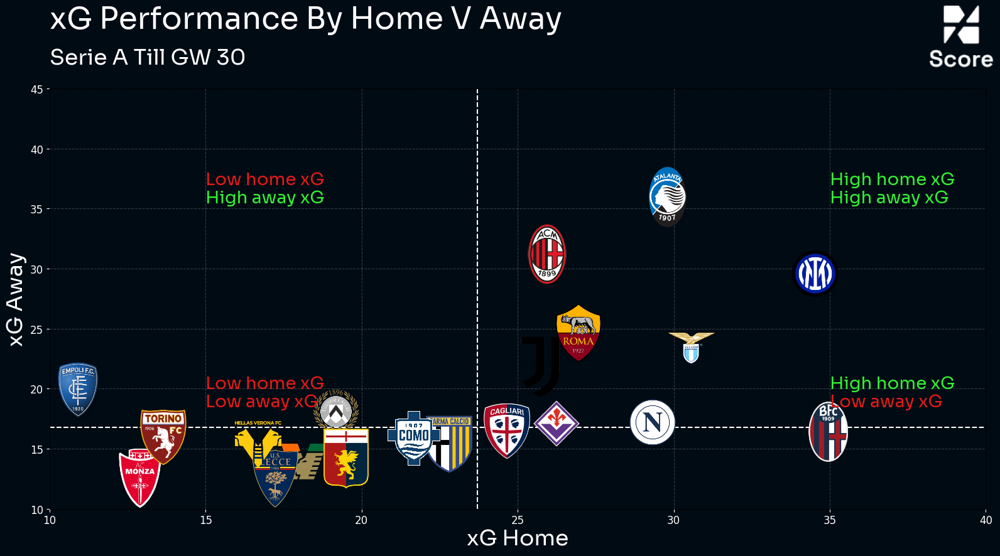

In [135]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import pandas as pd
from PIL import Image

# Function to load logos
def get_team_logo(team_name, logo_dir='C://Users//acer//Desktop//IndianCityzen//football-logos-master//logos//Italy - Serie A//'):
    logo_path = f"{logo_dir}{team_name}.png"
    try:
        logo = Image.open(logo_path)
        return logo
    except FileNotFoundError:
        print(f"Logo for {team_name} not found at {logo_path}")
        return None

# Create scatter plot
fig, ax = plt.subplots(figsize=(16, 9))
fig.patch.set_facecolor(background)
ax.patch.set_facecolor(background)

for _, row in df.iterrows():
    team, xg_home, xg_away = row['team'], row['xg_home'], row['xg_away']
    logo = get_team_logo(team)
    if logo:
        if team == 'Como':
            zoom = 0.05
        else:
            zoom = 0.38
        imagebox = OffsetImage(logo, zoom=zoom)  # Adjust zoom for size
        ab = AnnotationBbox(imagebox, (xg_home, xg_away), frameon=False)
        ax.add_artist(ab)
    else:
        # Plot a regular scatter point if logo not found
        ax.scatter(xg_home, xg_away, color='red', label=team)

median_home_xG = df['xg_home'].median()
median_away_xG = df['xg_away'].median()
ax.axvline(median_home_xG, color='white', linestyle='--', lw=1.5, label=f'Median Open Play xG ({median_home_xG:.2f})')
ax.axhline(median_away_xG, color='white', linestyle='--', lw=1.5, label=f'Median Set Piece xG ({median_away_xG:.2f})')

logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Score Logos-20241022T100701Z-001/Score Logos/ScoreSquareWhite.png')

ax_image = add_image(
    logo, fig, left=0.9, bottom=0.86, width=0.12, height=0.12,aspect='equal'
)

# Customize the plot
ax.set_xlim(10, 40)
ax.set_ylim(10, 45)
ax.set_xlabel('xG Home',font=font_prop,color='white', fontsize=25)
ax.set_ylabel('xG Away',font=font_prop,color='white', fontsize=25)
#ax.set_title('Team Performance Home V Away\nLigue 1 2024-25 Till GW 23',font=font_prop,color='white', fontsize=30,y=1.08, fontweight='bold')


ax.text(10,50,'xG Performance By Home V Away',font=font_prop,color='white', fontsize=35,fontweight='bold')
ax.text(10,47,'Serie A Till GW 30',font=font_prop,color='white', fontsize=25,fontweight='bold')

ax.text(35,37,'High home xG',font=font_prop,color='#34F132', fontsize=20)
ax.text(35,35.5,'High away xG',font=font_prop,color='#34F132', fontsize=20)


ax.text(15,37,'Low home xG',font=font_prop,color='#E61919', fontsize=20)
ax.text(15,35.5,'High away xG',font=font_prop,color='#34F132', fontsize=20)

ax.text(35,20,'High home xG',font=font_prop,color='#34F132', fontsize=20)
ax.text(35,18.5,'Low away xG',font=font_prop,color='#E61919', fontsize=20)

ax.text(15,20,'Low home xG',font=font_prop,color='#E61919', fontsize=20,zorder=5)
ax.text(15,18.5,'Low away xG',font=font_prop,color='#E61919', fontsize=20,zorder=5)


ax.tick_params(axis='x', colors='white', labelsize=12)  # X-axis tick labels in green
ax.tick_params(axis='y', colors='white', labelsize=12)
ax.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()

plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/homeVawaySerieA.png',dpi=500,bbox_inches = 'tight',facecolor=background)


### Saves P90 V Passing Accuracy - GK

In [392]:
# Making all the alphabets in the name as English Alphabets only (for example: Á will be replaced by A)
df['playerName'] = df['playerName'].astype(str)
df['playerName'] = df['playerName'].apply(unidecode)

# Function to extract short names
def get_short_name(full_name):
    if pd.isna(full_name):
        return full_name
    parts = full_name.split()
    if len(parts) == 1:
        return full_name  # No need for short name if there's only one word
    elif len(parts) == 2:
        return parts[0][0] + ". " + parts[1]
    else:
        return parts[0][0] + ". " + parts[1][0] + ". " + " ".join(parts[2:])

# Applying the function to create 'shortName' column
df['shortName'] = df['playerName'].apply(get_short_name)

In [393]:
player_minutes = df.groupby(['shortName', 'teamName', 'matchId'])['maxMinute'].max().reset_index()

# Step 2: Sum total minutes played across all matches
total_minutes_played = player_minutes.groupby(['shortName', 'teamName'])['maxMinute'].sum().reset_index()
total_minutes_played.rename(columns={'maxMinute': 'TotalMinutesPlayed'}, inplace=True)

eligible_players = total_minutes_played[total_minutes_played['TotalMinutesPlayed'] >= 500]

goalkeepers = df[df['type'] == 'KeeperSweeper']['shortName'].unique()
eligible_goalkeepers = eligible_players[eligible_players['shortName'].isin(goalkeepers)]

eligible_goalkeepers_names = eligible_goalkeepers['shortName'].unique()
gk_saves_df = df[(df['type'] == 'Save') & (df['shortName'].isin(eligible_goalkeepers_names))]
gk_passes_df = df[(df['type'] == 'Pass') & (df['shortName'].isin(eligible_goalkeepers_names))]

# Calculate saves per match
saves_per_match = gk_saves_df.groupby(['shortName', 'teamName', 'matchId']).size().reset_index(name='saves')
saves_per90 = saves_per_match.groupby(['shortName', 'teamName'])['saves'].mean().reset_index()
saves_per90.rename(columns={'saves': 'SavesPer90'}, inplace=True)

# Calculate passes per match
passes_per_match = gk_passes_df.groupby(['shortName', 'teamName', 'matchId']).size().reset_index(name='total_passes')
successful_passes_per_match = gk_passes_df[gk_passes_df['outcomeType'] == 'Successful'].groupby(['shortName', 'teamName', 'matchId']).size().reset_index(name='successful_passes')

# Compute per 90 values for passing
passes_per90 = passes_per_match.groupby(['shortName', 'teamName'])['total_passes'].mean().reset_index()
passes_per90.rename(columns={'total_passes': 'PassesPer90'}, inplace=True)

successful_passes_per90 = successful_passes_per_match.groupby(['shortName', 'teamName'])['successful_passes'].mean().reset_index()
successful_passes_per90.rename(columns={'successful_passes': 'SuccessfulPassesPer90'}, inplace=True)

# Merge pass stats
passing_per90 = pd.merge(passes_per90, successful_passes_per90, on=['shortName', 'teamName'], how='left')
passing_per90['SuccessfulPassesPer90'].fillna(0, inplace=True)  # Handle keepers with no successful passes

# Compute Passing Accuracy Per 90
passing_per90['PassingAccuracyPer90'] = (passing_per90['SuccessfulPassesPer90'] / passing_per90['PassesPer90']) * 100

# Merge with SavesPer90
gk_metrics_df = pd.merge(saves_per90, passing_per90[['shortName','PassingAccuracyPer90']], on=['shortName'], how='left')

gk_metrics_df = pd.merge(gk_metrics_df, eligible_goalkeepers , on = ['shortName','teamName'],how='left')

# Sort by SavesPer90 (optional, for better readability)
gk_metrics_df = gk_metrics_df.sort_values(by='SavesPer90', ascending=False)

In [394]:
# Ensure unique records before merging
saves_per90 = saves_per90.drop_duplicates(subset=['shortName', 'teamName'])
passing_per90 = passing_per90.drop_duplicates(subset=['shortName', 'teamName'])
eligible_goalkeepers = eligible_goalkeepers.drop_duplicates(subset=['shortName', 'teamName'])

# Merging
gk_metrics_df = pd.merge(saves_per90, 
                         passing_per90[['shortName', 'teamName', 'PassingAccuracyPer90']], 
                         on=['shortName', 'teamName'], 
                         how='left')

gk_metrics_df = pd.merge(gk_metrics_df, eligible_goalkeepers, 
                         on=['shortName', 'teamName'], 
                         how='left')

# Drop duplicates after merging
gk_metrics_df = gk_metrics_df.drop_duplicates(subset=['shortName'], keep='first')

# Final check
print(gk_metrics_df.duplicated(subset=['shortName']).sum())  # Should be 0


0


In [395]:
print(gk_metrics_df['SavesPer90'].min() , gk_metrics_df['SavesPer90'].max() , gk_metrics_df['PassingAccuracyPer90'].min() , gk_metrics_df['PassingAccuracyPer90'].max())

1.6666666666666667 4.875 62.5925925925926 88.25910931174089


Text(0.13, 0.01, 'Marker size reprsents minutes played')

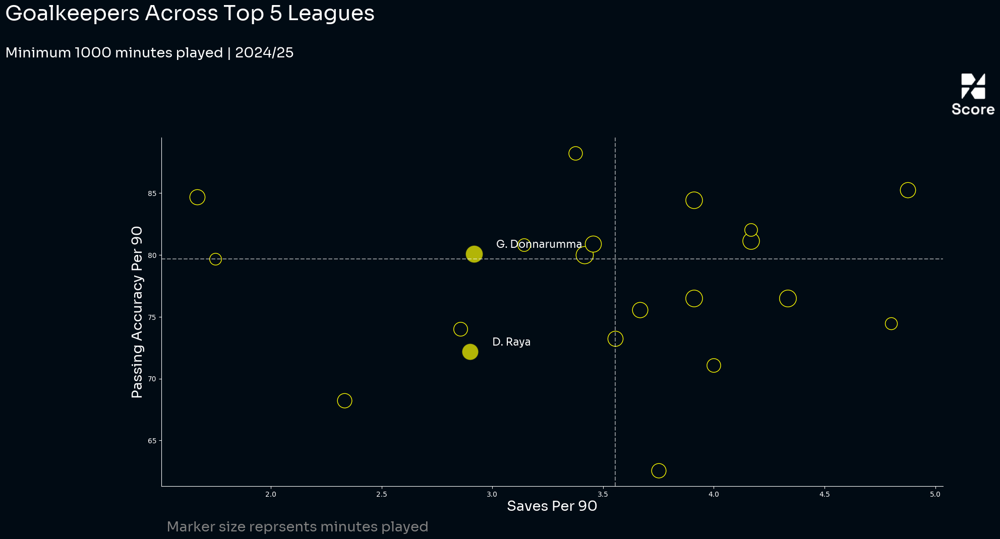

In [397]:
fig, ax = plt.subplots(figsize=(20,9))
fig.set_facecolor(background)
ax.set_facecolor(background)
ax.grid(color='white', linestyle='--', linewidth=0.5, alpha=0.7)

for index,row in gk_metrics_df.iterrows():
    '''
  if ( ((row['SavesPer90'] >= 3.8) & (row['PassingAccuracyPer90'] >= 84.0)) or (row['PassingAccuracyPer90'] >= 88) or (row['SavesPer90'] >= 4.3)):
    ax.scatter(row['SavesPer90'], row['PassingAccuracyPer90'],color='yellow',s=row['TotalMinutesPlayed'] * 0.5,edgecolor=background,zorder=1,alpha=0.7)
    ax.annotate(row['shortName'],xy = (row['SavesPer90']+0.1,row['PassingAccuracyPer90']+0.5),fontproperties=font_prop,color='white',fontsize=15,zorder=2)
  elif ( ((row['PassingAccuracyPer90'] >= 84.0) & (row['SavesPer90'] <= 1.2)) or ((row['PassingAccuracyPer90'] <= 60.0) & (row['SavesPer90'] >= 4)) ):
    ax.scatter(row['SavesPer90'], row['PassingAccuracyPer90'],color='yellow',s=row['TotalMinutesPlayed'] * 0.5,edgecolor=background,zorder=1,alpha=0.7)
    ax.annotate(row['shortName'],xy = (row['SavesPer90'],row['PassingAccuracyPer90']+1.5),fontproperties=font_prop,color='white',fontsize=15,zorder=2)
  '''
    if ( (row['shortName']== 'D. Raya') or (row['shortName']=='G. Donnarumma')):
        ax.scatter(row['SavesPer90'], row['PassingAccuracyPer90'],color='yellow',s=row['TotalMinutesPlayed'] * 0.5,edgecolor=background,zorder=1,alpha=0.7)
        ax.annotate(row['shortName'],xy = (row['SavesPer90']+0.1,row['PassingAccuracyPer90']+0.5),fontproperties=font_prop,color='white',fontsize=15,zorder=2)
            
    else:
        ax.scatter(row['SavesPer90'], row['PassingAccuracyPer90'],color=background,s=row['TotalMinutesPlayed'] * 0.5,edgecolor='yellow')


median_saves = gk_metrics_df['SavesPer90'].median()
median_passes = gk_metrics_df['PassingAccuracyPer90'].median()
ax.axvline(median_saves, color='white', linestyle='--', lw=1.5,alpha=0.5,zorder=1)
ax.axhline(median_passes, color='white', linestyle='--', lw=1.5,alpha=0.5,zorder=1)

logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Score Logos-20241022T100701Z-001/Score Logos/ScoreSquareWhite.png')

ax_image = add_image(
    logo, fig, left=0.88, bottom=0.92, width=0.1, height=0.1,aspect='equal'
)

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')
ax.spines['top'].set_color(background)
ax.spines['right'].set_color(background)
ax.spines['bottom'].set_color('white')
ax.spines['left'].set_color('white')

ax.set_xlabel("Saves Per 90",fontproperties=font_prop,color='white',fontsize=20)
ax.set_ylabel("Passing Accuracy Per 90",fontproperties=font_prop,color='white',fontsize=20)
ax.grid(False)
#ax.set_title("Top GoalKeepers - LaLiga 2024/25",fontproperties=font_prop,color='white',fontsize=32,y=1.07)
#ax.suptitle("Players With 100+ Passes and Carries",fontsize=18,color='white')
ax.text(0.8, 99, "Goalkeepers Across Top 5 Leagues", fontproperties=font_prop,ha='left', fontsize=30,color='white')
ax.text(0.8, 96, "Minimum 1000 minutes played | 2024/25", fontproperties=font_prop,ha='left', fontsize=20,color='white')

fig.text(0.13,0.01, "Marker size reprsents minutes played", fontproperties=font_prop,ha='left', fontsize=20,color='grey')


#ax.scatter(2, 99,edgecolor='yellow',s=500,color=background)
#plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/GoalkeepersTop5.png',dpi=500,bbox_inches = 'tight',facecolor=background)


### Most Improved/worsen teams

In [94]:
query = """WITH xg_periods AS (
    SELECT
        CASE 
            WHEN h_a = 'h' THEN h_team
            WHEN h_a = 'a' THEN a_team
        END AS team,
        CASE 
            WHEN date >= '2024-08-01' AND date < '2025-01-01' THEN 'period1'
            WHEN date >= '2025-01-01' AND date < '2025-05-01' THEN 'period2'
        END AS period,
        ROUND(SUM("xG")::NUMERIC, 2) AS total_xG,
        COUNT(*) AS total_shots_period,
        SUM(CASE WHEN result = 'Goal' THEN 1 ELSE 0 END) AS total_goals_period
    FROM understat_shots_tb
    WHERE 
        --league = 'Bundesliga'
        --AND
        season = '2024'
        AND date >= '2024-08-01' AND date < '2025-05-01'
    GROUP BY team, period
),
xg_aggregated AS (
    SELECT
        team,
        MAX(CASE WHEN period = 'period1' THEN total_xG END) AS xG_period1,
        MAX(CASE WHEN period = 'period2' THEN total_xG END) AS xG_period2,
        MAX(CASE WHEN period = 'period1' THEN total_shots_period END) AS shots_period1,
        MAX(CASE WHEN period = 'period2' THEN total_shots_period END) AS shots_period2,
        MAX(CASE WHEN period = 'period1' THEN total_goals_period END) AS goals_period1,
        MAX(CASE WHEN period = 'period2' THEN total_goals_period END) AS goals_period2
    FROM xg_periods
    GROUP BY team
),
totals AS (
    SELECT
        CASE 
            WHEN h_a = 'h' THEN h_team
            WHEN h_a = 'a' THEN a_team
        END AS team,
        COUNT(*) AS total_shots,
        SUM(CASE WHEN result = 'Goal' THEN 1 ELSE 0 END) AS total_goals
    FROM understat_shots_tb
    WHERE season = '2024'
    GROUP BY team
)
SELECT
    xg_aggregated.team,
    COALESCE(xG_period1, 0) AS xG_period1,
    COALESCE(xG_period2, 0) AS xG_period2,
    COALESCE(xG_period2, 0) - COALESCE(xG_period1, 0) AS xG_diff
FROM xg_aggregated
LEFT JOIN totals ON xg_aggregated.team = totals.team
ORDER BY xG_diff DESC;"""

with engine.connect() as conn:
    df_xg = pd.read_sql(query, conn)

In [98]:
query = """WITH xg_periods AS (
    SELECT
        CASE 
            WHEN h_a = 'a' THEN h_team
            WHEN h_a = 'h' THEN a_team
        END AS team,
        CASE 
            WHEN date >= '2024-08-01' AND date < '2025-01-01' THEN 'period1'
            WHEN date >= '2025-01-01' AND date < '2025-05-01' THEN 'period2'
        END AS period,
        ROUND(SUM("xG")::NUMERIC, 2) AS total_xG_conceded,
        COUNT(*) AS total_shots_period,
        SUM(CASE WHEN result = 'Goal' THEN 1 ELSE 0 END) AS total_goals_period
    FROM understat_shots_tb
    WHERE 
        --league = 'Bundesliga'
        --AND
        season = '2024'
        AND date >= '2024-08-01' AND date < '2025-05-01'
    GROUP BY team, period
),
xg_aggregated AS (
    SELECT
        team,
        MAX(CASE WHEN period = 'period1' THEN total_xG_conceded END) AS xG_c_period1,
        MAX(CASE WHEN period = 'period2' THEN total_xG_conceded END) AS xG_c_period2,
        MAX(CASE WHEN period = 'period1' THEN total_shots_period END) AS shots_period1,
        MAX(CASE WHEN period = 'period2' THEN total_shots_period END) AS shots_period2,
        MAX(CASE WHEN period = 'period1' THEN total_goals_period END) AS goals_period1,
        MAX(CASE WHEN period = 'period2' THEN total_goals_period END) AS goals_period2
    FROM xg_periods
    GROUP BY team
),
totals AS (
    SELECT
        CASE 
            WHEN h_a = 'a' THEN h_team
            WHEN h_a = 'h' THEN a_team
        END AS team,
        COUNT(*) AS total_shots_condeded,
        SUM(CASE WHEN result = 'Goal' THEN 1 ELSE 0 END) AS total_goals_conceded
    FROM understat_shots_tb
    WHERE season = '2024'
    GROUP BY team
)
SELECT
    xg_aggregated.team,
    COALESCE(xG_c_period1, 0) AS xG_c_period1,
    COALESCE(xG_c_period2, 0) AS xG_c_period2,
    COALESCE(xG_c_period2, 0) - COALESCE(xG_c_period1, 0) AS xG_c_diff
FROM xg_aggregated
LEFT JOIN totals ON xg_aggregated.team = totals.team
ORDER BY xG_c_diff DESC;"""

with engine.connect() as conn:
    df_xg_c = pd.read_sql(query, conn)

In [99]:
df = df_xg.merge(df_xg_c,on='team',how='left')

In [148]:
df.loc[27, "team"] = "Wolves"

In [177]:
df.to_csv('MostImproved_Teams.csv')

In [149]:
df[(df['xg_diff'] > 1) & (df['xg_c_diff']<-1)]

,team,xg_period1,xg_period2,xg_diff,xg_c_period1,xg_c_period2,xg_c_diff
1,Marseille,25.50,37.13,11.63,25.62,23.46,-2.16
6,Nice,27.59,34.64,7.05,21.70,19.79,-1.91
8,Valencia,17.66,23.59,5.93,27.35,22.10,-5.25
9,Brest,22.47,27.44,4.97,33.49,26.05,-7.44
11,Bochum,18.64,22.66,4.02,36.74,32.98,-3.76
13,Strasbourg,23.75,27.43,3.68,31.19,25.56,-5.63
15,Leganes,14.44,17.76,3.32,31.89,27.52,-4.37
16,Getafe,17.72,20.88,3.16,22.88,21.19,-1.69
17,Eintracht Frankfurt,32.50,35.63,3.13,26.03,24.29,-1.74
21,Wolfsburg,24.17,26.19,2.02,30.15,25.05,-5.10


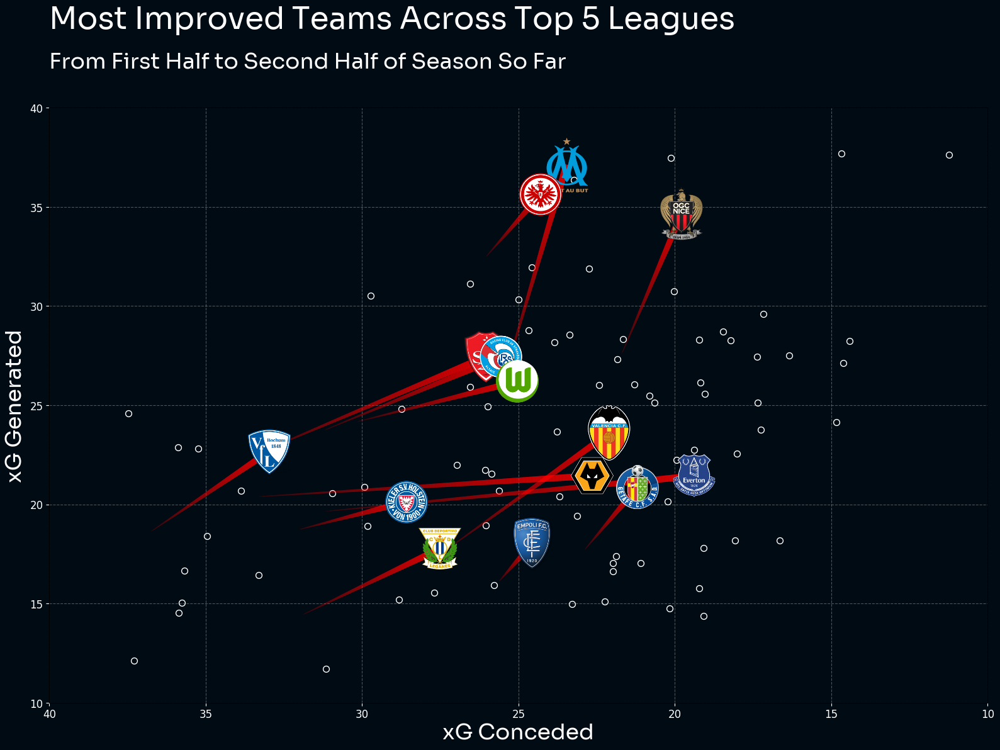

In [178]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import pandas as pd
from PIL import Image

# Function to load logos
def get_team_logo(team_name, logo_dir='C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/TeamLogos/'):
    logo_path = f"{logo_dir}{team_name}.png"
    try:
        logo = Image.open(logo_path)
        return logo
    except FileNotFoundError:
        print(f"Logo for {team_name} not found at {logo_path}")
        return None

# Create scatter plot
fig, ax = plt.subplots(figsize=(16, 12))
fig.patch.set_facecolor(background)
ax.patch.set_facecolor(background)

for _, row in df.iterrows():
    #team, xg_p1, xg_p2,shots,goals = row['team'], row['xg_period1'], row['xg_period2'],row['total_shots'],row['total_goals']
    team = row['team']
    xg_p1 = row['xg_period1']
    xg_p2 = row['xg_period2']
    xg_c_p1 = row['xg_c_period1']
    xg_c_p2 = row['xg_c_period2']
    xg_diff = row['xg_diff']
    xg_c_diff = row['xg_c_diff']
    #logo = get_team_logo(team) 
    if (xg_diff > 1 and xg_c_diff < -1):
        lc1 = lines(
            xg_c_p1,xg_p1,
            xg_c_p2,xg_p2,
            color='red',
            comet=True, transparent=True,
            alpha_start=0.1, alpha_end=0.6,linewidth=8,
            ax=ax
        )
        logo = get_team_logo(team)
        if logo:
            imagebox = OffsetImage(logo, zoom=0.35)  # Adjust zoom for size
            ab = AnnotationBbox(imagebox, (xg_c_p2, xg_p2), frameon=False)
            ax.add_artist(ab)
        #ax.scatter(xg_c_p2, xg_p2, color='blue',s=200 ,label=team)
    else:  
        # Plot a regular scatter point if logo not found
        ax.scatter(xg_c_p2, xg_p2, color=background,edgecolor='white',s=50, label=team)

# Customize the plot
ax.set_xlim(10, 40)
ax.set_ylim(10, 40)
ax.set_xlabel('xG Conceded',font=font_prop,color='white', fontsize=25)
ax.set_ylabel('xG Generated',font=font_prop,color='white', fontsize=25)
#ax.set_title('Team Performance Home V Away\nLigue 1 2024-25 Till GW 23',font=font_prop,color='white', fontsize=30,y=1.08, fontweight='bold')

ax.invert_xaxis()

ax.text(40,44,'Most Improved Teams Across Top 5 Leagues',font=font_prop,color='white', fontsize=35,fontweight='bold')
ax.text(40,42,'From First Half to Second Half of Season So Far',font=font_prop,color='white', fontsize=25,fontweight='bold')


ax.tick_params(axis='x', colors='white', labelsize=12)  # X-axis tick labels in green
ax.tick_params(axis='y', colors='white', labelsize=12)
ax.grid(False, linestyle='--',color='white', alpha=0.3)
plt.tight_layout()

plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/MostImprovedTeams.png',dpi=500,bbox_inches = 'tight',facecolor=background)


### Offsides Provoked Vs Caught Offside

In [487]:
provoked = df[df['offsideProvoked'] == True].groupby('teamName').size().reset_index(name='off_provoked')

In [492]:
data = {
    'teamName': [
        'Getafe', 'Leganes', 'Real Madrid', 'Real Sociedad', 'Villarreal',
        'Girona', 'Mallorca', 'Deportivo Alaves', 'Rayo Vallecano', 'Valencia',
        'Real Valladolid', 'Sevilla', 'Atletico Madrid', 'Barcelona', 'Celta Vigo',
        'Osasuna', 'Las Palmas', 'Atletic Club', 'Espanyol', 'Real Betis'
    ],
    'off_caught': [
        81, 78, 75, 75, 73,
        73, 72, 70, 68, 66,
        62, 62, 61, 61, 60,
        60, 56, 55, 52, 49
    ]
}

caught = pd.DataFrame(data)

In [493]:
offsides = provoked.merge(caught, on = 'teamName', how='left')

In [495]:
offsides

,teamName,off_provoked,off_caught
0,Atletic Club,79,55
1,Atletico Madrid,34,61
2,Barcelona,161,61
3,Celta Vigo,61,60
4,Deportivo Alaves,58,70
5,Espanyol,49,52
6,Getafe,81,81
7,Girona,40,73
8,Las Palmas,92,56
9,Leganes,44,78


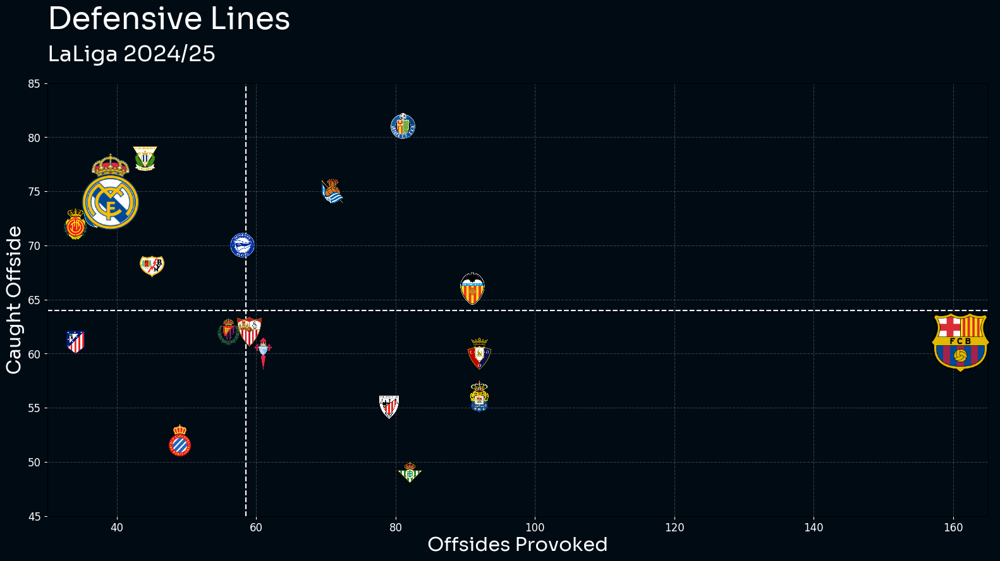

In [507]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import pandas as pd
from PIL import Image

# Function to load logos
def get_team_logo(team_name, logo_dir='C://Users//acer//Desktop//IndianCityzen//football-logos-master//logos//Spain - LaLiga//'):
    logo_path = f"{logo_dir}{team_name}.png"
    try:
        logo = Image.open(logo_path)
        return logo
    except FileNotFoundError:
        print(f"Logo for {team_name} not found at {logo_path}")
        return None

# Create scatter plot
fig, ax = plt.subplots(figsize=(16, 9))
fig.patch.set_facecolor(background)
ax.patch.set_facecolor(background)

for _, row in offsides.iterrows():
    team, off_provoked, off_caught = row['teamName'], row['off_provoked'], row['off_caught']
    logo = get_team_logo(team)
    if logo:
        if team == 'Barcelona' or team == 'Real Madrid':
            zoom = 0.5
            zorder = 4
        else:
            zoom = 0.2
            zorder = 3
        imagebox = OffsetImage(logo, zoom=zoom)  # Adjust zoom for size
        ab = AnnotationBbox(imagebox, (off_provoked, off_caught), frameon=False,zorder = zorder)
        ax.add_artist(ab)
    else:
        # Plot a regular scatter point if logo not found
        ax.scatter(off_provoked, off_caught, color='red', label=team)

median_home_xG = offsides['off_provoked'].median()
median_away_xG = offsides['off_caught'].median()
ax.axvline(median_home_xG, color='white', linestyle='--', lw=1.5, label=f'Median Open Play xG ({median_home_xG:.2f})')
ax.axhline(median_away_xG, color='white', linestyle='--', lw=1.5, label=f'Median Set Piece xG ({median_away_xG:.2f})')

# Customize the plot
ax.set_xlim(30, 165)
ax.set_ylim(45, 85)
ax.set_xlabel('Offsides Provoked',font=font_prop,color='white', fontsize=22)
ax.set_ylabel('Caught Offside',font=font_prop,color='white', fontsize=22)
#ax.set_title('Team Performance Home V Away\nLigue 1 2024-25 Till GW 23',font=font_prop,color='white', fontsize=30,y=1.08, fontweight='bold')


ax.text(30,90,'Defensive Lines',font=font_prop,color='white', fontsize=35,fontweight='bold')
ax.text(30,87,'LaLiga 2024/25',font=font_prop,color='white', fontsize=25,fontweight='bold')


ax.tick_params(axis='x', colors='white', labelsize=12)  # X-axis tick labels in green
ax.tick_params(axis='y', colors='white', labelsize=12)
ax.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()

plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/BarcaVMadrid.png',dpi=500,bbox_inches = 'tight',facecolor=background)


## Crossing Analysis

### Number of Crosses P90 Vs xG From Crosses

In [425]:
df[df['passCrossAccurate'] == True].shape

(2288, 273)

In [509]:
df[(df['passCrossAccurate'] == True) & (~df['qualifiers'].str.contains('CornerTaken|Freekick'))].shape

(1489, 273)

In [510]:
df_crosses = df[(df['type'] =='Pass') & (df['passCrossAccurate'] == True)  & (~df['qualifiers'].str.contains('CornerTaken|Freekick'))]

In [511]:
# Count the number of crosses per team per match
crosses_per_match = df_crosses.groupby(['teamName']).size().reset_index(name='crosses')

In [530]:
query = """SELECT 
    "teamName",
    ROUND(SUM("xG")::NUMERIC, 2) AS total_xG, 
    SUM(goals) AS total_goals
FROM (
    SELECT 
        h_team AS  "teamName", 
        "xG",
        CASE WHEN result = 'Goal' THEN 1 ELSE 0 END AS goals
    FROM understat_shots_tb
    WHERE league = 'La_Liga' 
      AND season = 2024 
      AND h_a = 'h' 
      AND "lastAction" = 'Cross' and situation = 'OpenPlay'

    UNION ALL

    SELECT 
        a_team AS  "teamName", 
        "xG",
        CASE WHEN result = 'Goal' THEN 1 ELSE 0 END AS goals
    FROM understat_shots_tb
    WHERE league = 'La_Liga' 
      AND season = 2024 
      AND h_a = 'a' 
      AND "lastAction" = 'Cross'and situation = 'OpenPlay'
) AS team_xG
GROUP BY  "teamName"
ORDER BY total_xG DESC;"""

with engine.connect() as conn:
    df_xg_crosses = pd.read_sql(query, conn)

In [531]:
df_xg_crosses.loc[10, "teamName"] = "Deportivo Alaves"
df_xg_crosses.loc[0, "teamName"] = "Atletic Club"

In [532]:
df_crosses_final = pd.merge(crosses_per_match, df_xg_crosses, on=['teamName'], how='left')

In [533]:
df_crosses_final.loc[0, "teamName"] = "Athletic Club"
df_crosses_final.loc[4, "teamName"] = "Alaves"

In [534]:
df_crosses_final

,teamName,crosses,total_xg,total_goals
0,Athletic Club,91,7.58,7
1,Atletico Madrid,80,6.39,5
2,Barcelona,68,6.67,5
3,Celta Vigo,59,4.29,5
4,Alaves,92,4.71,5
5,Espanyol,66,3.10,4
6,Getafe,91,2.42,1
7,Girona,86,5.53,5
8,Las Palmas,75,3.39,1
9,Leganes,34,1.37,1


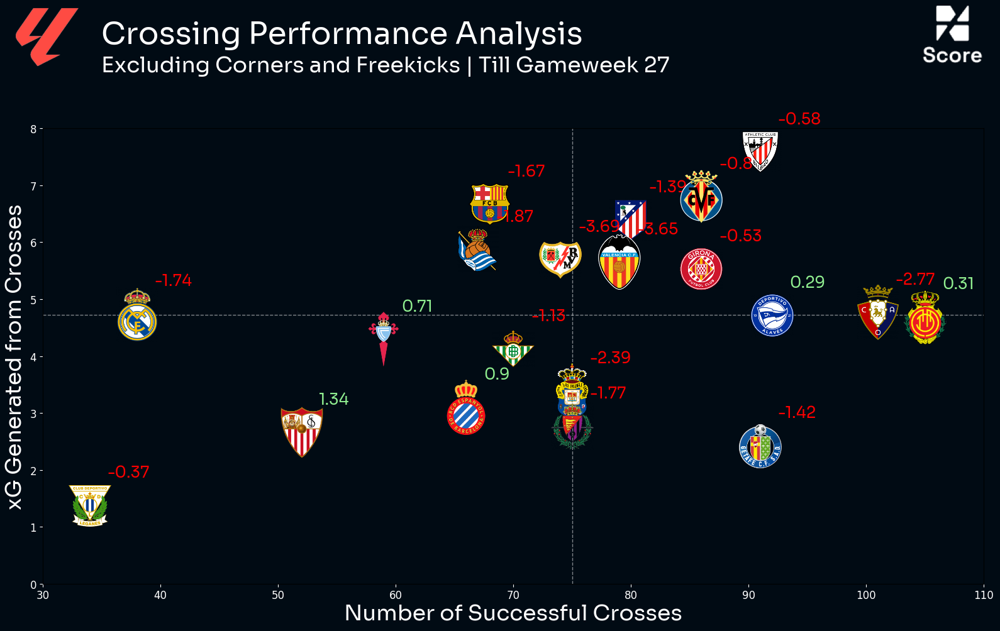

In [793]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import pandas as pd
from PIL import Image

# Function to load logos
def get_team_logo(team_name, logo_dir='C://Users//acer//Desktop//IndianCityzen//football-logos-master//logos//Spain - LaLiga//'):
    logo_path = f"{logo_dir}{team_name}.png"
    try:
        logo = Image.open(logo_path)
        return logo
    except FileNotFoundError:
        print(f"Logo for {team_name} not found at {logo_path}")
        return None

# Create scatter plot
fig, ax = plt.subplots(figsize=(16, 10))
fig.patch.set_facecolor(background)
ax.patch.set_facecolor(background)

for _, row in df_crosses_final.iterrows():
    team, crosses, xg , diff = row['teamName'], row['crosses'], row['total_xg'] , round(row['total_goals'] - row['total_xg'],2)
    logo = get_team_logo(team)
    if logo:
        imagebox = OffsetImage(logo, zoom=0.35)  # Adjust zoom for size
        ab = AnnotationBbox(imagebox, (crosses, xg), frameon=False)
        ax.add_artist(ab)
        text_color = 'lightgreen'
        if diff < 0:
            text_color = 'red'
        ax.text(crosses+1.5,xg+0.5,f'{diff}',font=font_prop,color=text_color, fontsize=18)
    else:
        # Plot a regular scatter point if logo not found
        ax.scatter(crosses, xg, color='red', label=team)

median_crosses = df_crosses_final['crosses'].median()
median_xG = df_crosses_final['total_xg'].median()
ax.axvline(median_crosses, color='white', linestyle='--', lw=1,alpha=0.5, label=f'Median Number of Crosses ({median_crosses:.2f})')
ax.axhline(median_xG, color='white', linestyle='--', lw=1,alpha=0.5, label=f'Median xG ({median_xG:.2f})')

logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Score Logos-20241022T100701Z-001/Score Logos/ScoreSquareWhite.png')

ax_image = add_image(
    logo, fig, left=0.9, bottom=0.9, width=0.1, height=0.1,aspect='equal'
)

league_logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/TeamLogos/LaLiga.png')

ax_image = add_image(
    league_logo, fig, left=0, bottom=0.9, width=0.1, height=0.1,aspect='equal'
)

# Customize the plot
ax.set_xlim(30, 110)
ax.set_ylim(0, 8)
ax.set_xlabel('Number of Successful Crosses',font=font_prop,color='white', fontsize=25)
ax.set_ylabel('xG Generated from Crosses',font=font_prop,color='white', fontsize=25)
ax.text(35,9.5,'Crossing Performance Analysis',font=font_prop,color='white', fontsize=35,fontweight='bold')
ax.text(35,9,'Excluding Corners and Freekicks | Till Gameweek 27',font=font_prop,color='white', fontsize=25,fontweight='regular')

'''
ax.text(35,30,'High home xG',font=font_prop,color='#34F132', fontsize=18)
ax.text(35,31.5,'High away xG',font=font_prop,color='#34F132', fontsize=18)


ax.text(15,30,'Low home xG',font=font_prop,color='#E61919', fontsize=18)
ax.text(15,31.5,'High away xG',font=font_prop,color='#34F132', fontsize=18)

ax.text(35,14,'High home xG',font=font_prop,color='#34F132', fontsize=18)
ax.text(35,12.5,'Low away xG',font=font_prop,color='#E61919', fontsize=18)

ax.text(15,14,'Low home xG',font=font_prop,color='#E61919', fontsize=18,zorder=2)
ax.text(15,12.5,'Low away xG',font=font_prop,color='#E61919', fontsize=18,zorder=2)
'''

ax.tick_params(axis='x', colors='white', labelsize=12)  # X-axis tick labels in green
ax.tick_params(axis='y', colors='white', labelsize=12)
ax.grid(False)
plt.tight_layout()

plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/LaLigaCrossing_1.png',dpi=500,bbox_inches = 'tight',facecolor=background)


### Crosses from high performing teams

In [540]:
df_crosses_final.loc[0, "teamName"] = "Atletic Club"
high_performing_teams = df_crosses_final[df_crosses_final['total_xg']>6.7]['teamName']
df_crosses_team = df_crosses[df_crosses['teamName'].isin(high_performing_teams)]

In [541]:
df_crosses_team['teamName'].unique()

array(['Atletic Club', 'Villarreal'], dtype=object)

In [542]:
cross_counts = df_crosses_team.groupby(['teamName', 'playerName'])['playerName'].count().reset_index(name='cross_count')
cross_counts = cross_counts.sort_values(by=['teamName','cross_count'], ascending=[True,False])
top_2_per_team = cross_counts.groupby('teamName').head(2)

In [543]:
top_2_per_team

,teamName,playerName,cross_count
6,Atletic Club,Inaki Williams,16
11,Atletic Club,Nico Williams,13
28,Villarreal,Sergi Cardona,22
16,Villarreal,Alex Baena,16


In [776]:
from scipy.ndimage import gaussian_filter
def player_passmap(ax,df_crosses_team, pname,team,team_color):
    pitch = VerticalPitch(pitch_type='uefa',half=True, corner_arcs=True, pitch_color=background, line_color='white', linewidth=0.5)
    pitch.draw(ax=ax)
    dfpass = df_crosses_team[df_crosses_team['playerName'] == pname]

    key_pass = dfpass[dfpass['qualifiers'].str.contains('KeyPass')]
    big_chnc = dfpass[dfpass['qualifiers'].str.contains('BigChanceCreated')]
    assist = dfpass[(dfpass['qualifiers'].str.contains('IntentionalGoalAssist'))]
    #fnl_thd = acc_pass[(acc_pass['endX']>=70) & (~acc_pass['qualifiers'].str.contains('CornerTaken|Freekick'))]
    #pen_box = dfpass[(dfpass['endX']>=88.5) & (dfpass['endY']>=13.6) & (dfpass['endY']<=54.4) &
    #                   (~dfpass['qualifiers'].str.contains('CornerTaken|Freekick'))]

    df_xT_inc = dfpass[dfpass['xT']>0]
    df_xT_dec = dfpass[dfpass['xT']<0]
    xT_by_Pass = dfpass['xT'].sum().round(2)

    pitch.lines(dfpass.x, dfpass.y, dfpass.endX, dfpass.endY, color='white', lw=1, alpha=0.6, comet=False, zorder=2, ax=ax)
    #pitch.lines(pen_box.x, pen_box.y, pen_box.endX, pen_box.endY, color='blue', lw=1, alpha=0.8,comet=False, zorder=3, ax=ax)
    pitch.lines(key_pass.x, key_pass.y, key_pass.endX, key_pass.endY, color='#33efff',  lw=1.5, alpha=0.7,comet=True, zorder=4, ax=ax)
    pitch.lines(assist.x, assist.y, assist.endX, assist.endY, color=team_color, lw=3, alpha=0.9,comet=True, zorder=5, ax=ax)
    
    ax.scatter(dfpass.endY, dfpass.endX, s=30, color=background,edgecolor='white', alpha=0.8, zorder=2)
    #ax.scatter(pen_box.endY, pen_box.endX, s=100, color=background,edgecolor='blue', alpha=0.8, zorder=3)
    ax.scatter(key_pass.endY, key_pass.endX, s=70, color=background,edgecolor='#33efff', alpha=0.8, zorder=4)
    ax.scatter(assist.endY, assist.endX, s=80, color=background,edgecolor=team_color, alpha=1, zorder=5)


    df_xT = dfpass[(dfpass['xT'] > 0)]
    cmap = LinearSegmentedColormap.from_list('custom_cmap', [background, team_color])  # White to team color

    bin_statistic = pitch.bin_statistic(df_xT.x, df_xT.y, statistic='count', bins=(20, 20))
    bin_statistic['statistic'] = gaussian_filter(bin_statistic['statistic'], 1)
    pcm = pitch.heatmap(bin_statistic, ax=ax, cmap=cmap, edgecolors=background,alpha=0.5,zorder=1)
    
    logo = get_team_logo(team)
    if logo:
        imagebox = OffsetImage(logo, zoom=0.2)  # Adjust zoom for size
        ab = AnnotationBbox(imagebox, (5, 109), frameon=False,transform=ax.transAxes,zorder=10)
        ax.add_artist(ab)
    else:
        print('No')
    ax.text(65,110,f"{pname}", color='white', fontsize=20,fontproperties=font_prop)
    ax_text(34, 60, f'''Crosses: {len(dfpass)}                     <Assists: {len(assist)}>\n<xT: {xT_by_Pass}>                    <Key Crosses: {len(key_pass)}>
    ''',
    color='white',fontproperties=font_prop,transform=ax.transAxes,
    highlight_textprops=[{'color':team_color}, {'color':'#33efff'},{'color':'#33efff'}],zorder=10, fontsize=15, ha='center', va='center', ax=ax)
    
    return

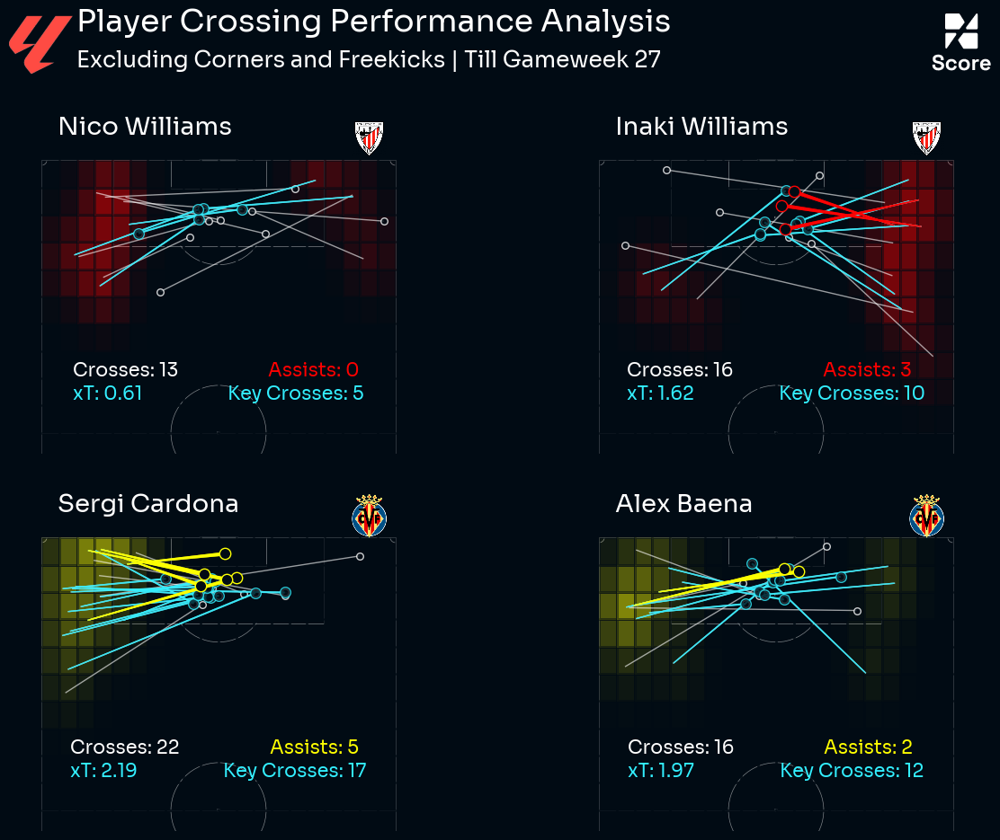

In [778]:
fig, axes = plt.subplots(2, 2, figsize=(16, 10), facecolor=background)


fig.text(0.22,1,'Player Crossing Performance Analysis',font=font_prop,color='white', fontsize=25,fontweight='bold')
fig.text(0.22,0.96,'Excluding Corners and Freekicks | Till Gameweek 27',font=font_prop,color='white', fontsize=18,fontweight='regular')

player_passmap(axes[0,0],df_crosses_team, 'Nico Williams','Atletic Club','red')
player_passmap(axes[0,1],df_crosses_team, 'Inaki Williams','Atletic Club','red')
player_passmap(axes[1,0],df_crosses_team, 'Sergi Cardona','Villarreal','yellow')
player_passmap(axes[1,1],df_crosses_team, 'Alex Baena','Villarreal','yellow')

logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Score Logos-20241022T100701Z-001/Score Logos/ScoreSquareWhite.png')

ax_image = add_image(
    logo, fig, left=0.8, bottom=0.95, width=0.07, height=0.07,aspect='equal'
)

league_logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/TeamLogos/LaLiga.png')

ax_image = add_image(
    league_logo, fig, left=0.16, bottom=0.95, width=0.07, height=0.07,aspect='equal'
)
plt.subplots_adjust(wspace=0)

plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/LaLigaCrossing_2.png',dpi=500,bbox_inches = 'tight',facecolor=background)


### Players with the most shots from Crosses

In [794]:
query = """SELECT *
FROM understat_shots_tb
WHERE 
    league = 'La_Liga' 
    AND season = 2024 
    AND "lastAction" = 'Cross' 
    AND situation = 'OpenPlay'
    AND player IN (
        SELECT player
        FROM understat_shots_tb
        WHERE 
            league = 'La_Liga' 
            AND season = 2024 
            AND "lastAction" = 'Cross' 
            AND situation = 'OpenPlay'
        GROUP BY player
        ORDER BY COUNT(*) DESC
        LIMIT 4
    )
ORDER BY player, "xG" DESC;"""

with engine.connect() as conn:
    df_crosses_shots = pd.read_sql(query, conn)

In [796]:
df_crosses_shots['player'].unique()

array(['Ante Budimir', 'Kike García', 'Mikel Oyarzabal', 'Vedat Muriqi'],
      dtype=object)

In [798]:
df_crosses_shots.columns

Index(['id', 'minute', 'result', 'X', 'Y', 'xG', 'player', 'h_a', 'player_id',
       'situation', 'season', 'shotType', 'match_id', 'h_team', 'a_team',
       'h_goals', 'a_goals', 'date', 'player_assisted', 'lastAction',
       'league'],
      dtype='object')

In [800]:
# Convert 'X' to integer and then to float for accurate calculations
df_crosses_shots['X'] = pd.to_numeric(df_crosses_shots['X'], errors='coerce')
df_crosses_shots['X'] = (df_crosses_shots['X'] / 100) * 105 * 100  # Convert to cm based on 105m length

# Convert 'Y' similarly
df_crosses_shots['Y'] = pd.to_numeric(df_crosses_shots['Y'], errors='coerce')
df_crosses_shots['Y'] = (df_crosses_shots['Y'] / 100) * 68 * 100  # Convert to cm based on 68m width

df_crosses_shots['expectedGoals'] = df_crosses_shots['xG']
df_crosses_shots['expectedGoals'] = df_crosses_shots['xG']

df_crosses_shots['expectedGoals'] = pd.to_numeric(df_crosses_shots['expectedGoals'], errors='coerce')
df_crosses_shots['expectedGoals'] = pd.to_numeric(df_crosses_shots['expectedGoals'], errors='coerce')

In [829]:
def shotmap_player(ax,df_crosses_shots,player,team,team_color):
    shots_df = df_crosses_shots[df_crosses_shots['player'] == player]
    df_team = shots_df[(shots_df.result != 'Goal') & (shots_df.shotType != 'Head')].copy()
    
    df_team_goals = shots_df[(shots_df.result == 'Goal') & (shots_df.shotType != 'Head')].copy()
    
    df_team_headers_goals = shots_df[(shots_df.result == 'Goal') & (shots_df.shotType == 'Head')].copy()
    
    df_team_own_goals = shots_df[(shots_df.result == 'OwnGoal')].copy()
    
    df_team_headers = shots_df[(shots_df.result != 'Goal') & (shots_df.shotType == 'Head')].copy()
    
    team_xg = round(shots_df['expectedGoals'].astype(float).sum(),2)
    
    
    pitch = VerticalPitch(pitch_type='uefa',half=True, line_zorder=1
              ,pitch_color=background, line_color='white',linewidth=1)
    pitch.draw(ax=ax)
    
    #pitch.scatter(2,2,s=100,edgecolors='white', c='grey',marker='football',ax=ax,alpha=0.5,zorder=2)
    #ax.text(6, 2, 'GOAL', color = 'white', ha='center', va='center',fontsize=12,fontproperties=font_prop,zorder=2)
    pitch.scatter(55,20,s=100,edgecolors='yellow', c=background,marker='o',ax=ax,zorder=2)
    ax.text(10, 55, 'Header', color = 'white', ha='center', va='center',fontsize=10,fontproperties=font_prop,zorder=2)
    
    sc_team = pitch.scatter(df_team.X, df_team.Y, s=df_team.expectedGoals * 400,
                             edgecolors=background, c=team_color, ax=ax,zorder=2)
    sc_team_goals = pitch.scatter(df_team_goals.X, df_team_goals.Y, s=df_team_goals.expectedGoals * 700,
                             edgecolors='white', c=team_color,marker='football', ax=ax,zorder=2)
    sc_team_headers = pitch.scatter(df_team_headers.X, df_team_headers.Y, s=df_team_headers.expectedGoals * 400,
                             edgecolors='yellow', c=team_color,marker='o', ax=ax,zorder=2)
    sc_team_headers_goals = pitch.scatter(df_team_headers_goals.X, df_team_headers_goals.Y, s=df_team_headers_goals.expectedGoals * 700,
                             edgecolors='yellow', c=team_color,marker='football', ax=ax,zorder=2)
    sc_team_own_goals = pitch.scatter(df_team_own_goals.X, df_team_own_goals.Y, s=500,
                             edgecolors='orange', c=team_color,marker='football', ax=ax,zorder=2)

    ax.text(65, 75, f'Shots - {shots_df.shape[0]} (Headers - {df_team_headers.shape[0]})', color = 'white', ha='left', va='center',fontsize=15,fontproperties=font_prop,zorder=2)
    ax.text(65, 70, f'Goals - {df_team_goals.shape[0] + df_team_headers_goals.shape[0]}', color = 'white', ha='left', va='center',fontsize=15,fontproperties=font_prop,zorder=2)
    ax.text(65, 65, f'xG - {team_xg}', color = 'white', ha='left', va='center',fontsize=15,fontproperties=font_prop,zorder=2)

    
    fig.set_facecolor(background)
    ax.text(65,110,f"{player}", color='white', fontsize=20,fontproperties=font_prop)
    logo = get_team_logo(team)
    if logo:
        imagebox = OffsetImage(logo, zoom=0.2)  # Adjust zoom for size
        ab = AnnotationBbox(imagebox, (5, 109), frameon=False,transform=ax.transAxes,zorder=10)
        ax.add_artist(ab)
    else:
        print('No')

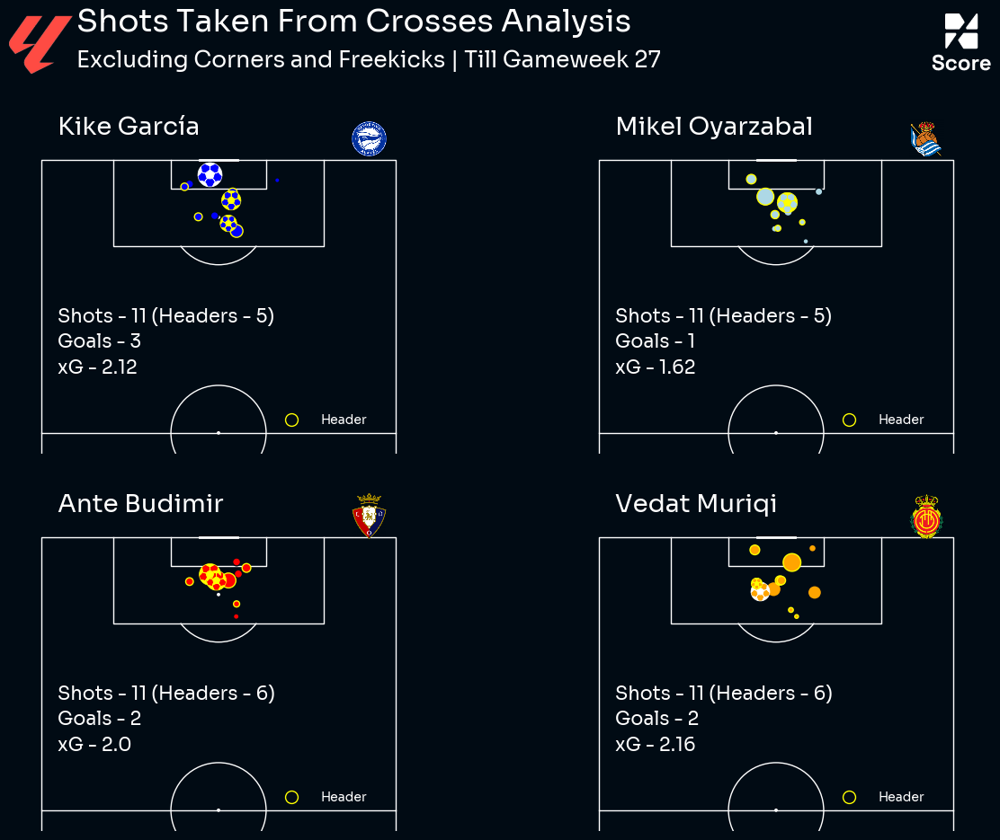

In [830]:
fig, axes = plt.subplots(2, 2, figsize=(16, 10), facecolor=background)


fig.text(0.22,1,'Shots Taken From Crosses Analysis',font=font_prop,color='white', fontsize=25,fontweight='bold')
fig.text(0.22,0.96,'Excluding Corners and Freekicks | Till Gameweek 27',font=font_prop,color='white', fontsize=18,fontweight='regular')

shotmap_player(axes[0,0],df_crosses_shots, 'Kike García','Alaves','blue')
shotmap_player(axes[0,1],df_crosses_shots, 'Mikel Oyarzabal','Real Sociedad','lightblue')
shotmap_player(axes[1,0],df_crosses_shots, 'Ante Budimir','Osasuna','red')
shotmap_player(axes[1,1],df_crosses_shots, 'Vedat Muriqi','Mallorca','orange')

logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Score Logos-20241022T100701Z-001/Score Logos/ScoreSquareWhite.png')

ax_image = add_image(
    logo, fig, left=0.8, bottom=0.95, width=0.07, height=0.07,aspect='equal'
)

league_logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/TeamLogos/LaLiga.png')

ax_image = add_image(
    league_logo, fig, left=0.16, bottom=0.95, width=0.07, height=0.07,aspect='equal'
)
plt.subplots_adjust(wspace=0)

plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/LaLigaCrossing_3.png',dpi=500,bbox_inches = 'tight',facecolor=background)


## Radar / Pizza Plots

In [266]:
from urllib.request import urlopen

import matplotlib.pyplot as plt
from PIL import Image

from mplsoccer import PyPizza, add_image, FontManager
import matplotlib.image as mpimg

font_normal = FontManager('https://raw.githubusercontent.com/googlefonts/roboto/main/'
                          'src/hinted/Roboto-Regular.ttf')
font_italic = FontManager('https://raw.githubusercontent.com/googlefonts/roboto/main/'
                          'src/hinted/Roboto-Italic.ttf')
font_bold = FontManager('https://raw.githubusercontent.com/google/fonts/main/apache/robotoslab/'
                        'RobotoSlab[wght].ttf')
img1 = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/Images/Players/AK.jpg')

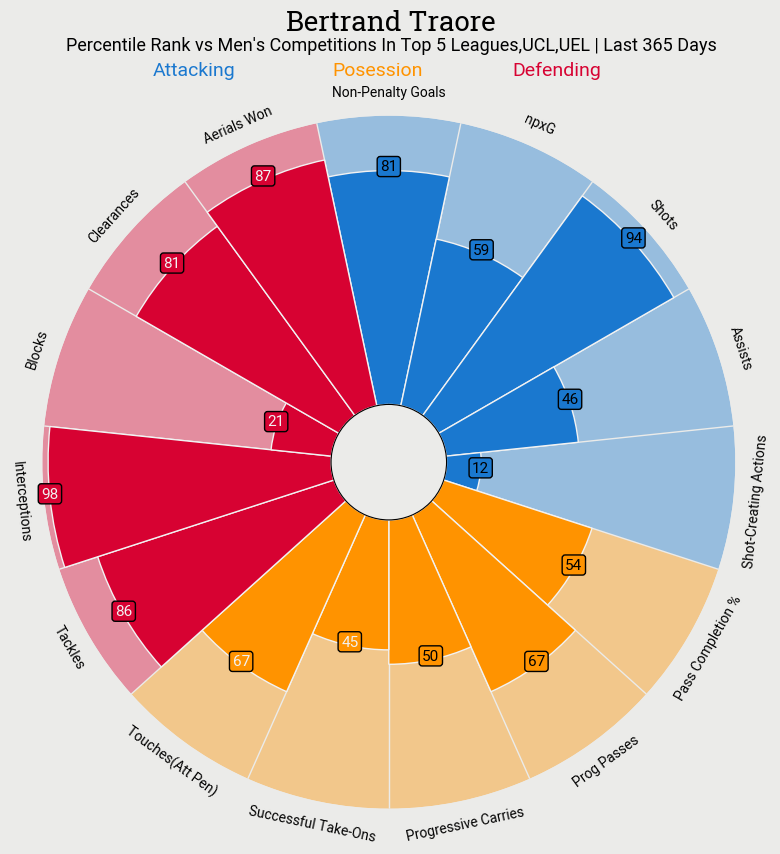

In [270]:
# parameter list
params = ["Non-Penalty Goals", "npxG", "Shots", "Assists","Shot-Creating Actions",
          "Pass Completion %", "Prog Passes", "Progressive Carries", "Successful Take-Ons","Touches(Att Pen)",
          "Tackles","Interceptions","Blocks","Clearances","Aerials Won"]

# value list
# The values are taken from the excellent fbref website (supplied by StatsBomb)
values = [
    81, 59, 94, 46, 12,
    54, 67, 50, 45, 67,
    86, 98, 21, 81, 87
]

# color for the slices and text
slice_colors = ["#1A78CF"] * 5 + ["#FF9300"] * 5 + ["#D70232"] * 5
text_colors = ["#000000"] * 8 + ["#F2F2F2"] * 7

# instantiate PyPizza class
baker = PyPizza(
    params=params,                  # list of parameters
    background_color="#EBEBE9",     # background color
    straight_line_color="#EBEBE9",  # color for straight lines
    straight_line_lw=1,             # linewidth for straight lines
    last_circle_lw=0,               # linewidth of last circle
    other_circle_lw=0,              # linewidth for other circles
    inner_circle_size=20            # size of inner circle
)

# plot pizza
fig, ax = baker.make_pizza(
    values,                          # list of values
    figsize=(9, 9),                # adjust figsize according to your need
    color_blank_space="same",        # use same color to fill blank space
    slice_colors=slice_colors,       # color for individual slices
    value_colors=text_colors,        # color for the value-text
    value_bck_colors=slice_colors,   # color for the blank spaces
    blank_alpha=0.4,                 # alpha for blank-space colors
    kwargs_slices=dict(
        edgecolor="#F2F2F2", zorder=2, linewidth=1
    ),                               # values to be used when plotting slices
    kwargs_params=dict(
        color="#000000", fontsize=10,
        fontproperties=font_normal.prop, va="center"
    ),                               # values to be used when adding parameter
    kwargs_values=dict(
        color="#000000", fontsize=11,
        fontproperties=font_normal.prop, zorder=3,
        bbox=dict(
            edgecolor="#000000", facecolor="cornflowerblue",
            boxstyle="round,pad=0.2", lw=1
        )
    )                                # values to be used when adding parameter-values
)

# add title
fig.text(
    0.515, 0.975, "Bertrand Traore", size=20,
    ha="center", fontproperties=font_bold.prop, color="#000000"
)

# add subtitle
fig.text(
    0.515, 0.953,
    "Percentile Rank vs Men's Competitions In Top 5 Leagues,UCL,UEL | Last 365 Days",
    size=13,
    ha="center", fontproperties=font_normal.prop, color="#000000"
)

# add text
fig.text(
    0.25, 0.925, "Attacking", size=14,
    fontproperties=font_normal.prop, color="#1a78cf"
)

fig.text(
    0.45, 0.925, "Posession", size=14,
    fontproperties=font_normal.prop, color="#ff9300"
)

fig.text(
    0.65, 0.925, "Defending", size=14,
    fontproperties=font_normal.prop, color="#d70232"
)

plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/BT.png',dpi=500,bbox_inches = 'tight',facecolor='white')

## xG For V xG Against Time Series Plot

In [94]:
query = """WITH team_shots AS (
    SELECT 
        h_team AS team,
        match_id,
        season,
        date,
        SUM("xG") AS xg_sum
    FROM understat_shots_tb
    WHERE league = 'Serie_A' AND season >= EXTRACT(YEAR FROM CURRENT_DATE) - 4 AND h_a = 'h'
    GROUP BY h_team, match_id, season, date
    
    UNION
    
    SELECT 
        a_team AS team,
        match_id,
        season,
        date,
        SUM("xG") AS xg_sum
    FROM understat_shots_tb
    WHERE league = 'Serie_A' AND season >= EXTRACT(YEAR FROM CURRENT_DATE) - 4 AND h_a = 'a'
    GROUP BY a_team, match_id, season, date
),
team_shots_against AS (
    SELECT 
        a_team AS team,
        match_id,
        season,
        date,
        SUM("xG") AS xg_against_sum
    FROM understat_shots_tb
    WHERE league = 'Serie_A' AND season >= EXTRACT(YEAR FROM CURRENT_DATE) - 4 AND h_a = 'h'
    GROUP BY a_team, match_id, season, date
    
    UNION
    
    SELECT 
        h_team AS team,
        match_id,
        season,
        date,
        SUM("xG") AS xg_against_sum
    FROM understat_shots_tb
    WHERE league = 'Serie_A' AND season >= EXTRACT(YEAR FROM CURRENT_DATE) - 4 AND h_a = 'a'
    GROUP BY h_team, match_id, season, date
),
team_matches AS (
    SELECT 
        shots.team,
        shots.season,
        shots.match_id,
        shots.date,
        shots.xg_sum,
        COALESCE(against.xg_against_sum, 0) AS xg_against_sum,
        ROW_NUMBER() OVER (PARTITION BY shots.team, shots.season ORDER BY shots.date) AS match_number
    FROM team_shots AS shots
    LEFT JOIN team_shots_against AS against
        ON shots.team = against.team AND shots.match_id = against.match_id
),
rolling_xg AS (
    SELECT 
        team,
        season,
        match_id,
        date,
        match_number,
        xg_sum,
        xg_against_sum,
        SUM(xg_sum) OVER (PARTITION BY team, season ORDER BY match_number ROWS BETWEEN 9 PRECEDING AND CURRENT ROW) AS rolling_xg,
        SUM(xg_against_sum) OVER (PARTITION BY team, season ORDER BY match_number ROWS BETWEEN 9 PRECEDING AND CURRENT ROW) AS rolling_xg_against
    FROM team_matches
)
SELECT 
    team,
    season,
    --match_id,
    date,
    xg_sum AS xg_per_game,            -- Sum of xG for the current game
    xg_against_sum AS xg_against_per_game, -- Sum of xG conceded for the current game
    rolling_xg,                       -- Rolling sum of xG over 10 games
    rolling_xg_against,                -- Rolling sum of xG conceded over 10 games
    rolling_xg - rolling_xg_against as rolling_diff
FROM rolling_xg
ORDER BY team, season, date;"""

with engine.connect() as conn:
    df_xg = pd.read_sql(query, conn)

In [95]:
df_xg['team'].unique()

array(['AC Milan', 'Atalanta', 'Bologna', 'Cagliari', 'Como', 'Cremonese',
       'Empoli', 'Fiorentina', 'Frosinone', 'Genoa', 'Inter', 'Juventus',
       'Lazio', 'Lecce', 'Monza', 'Napoli', 'Parma Calcio 1913', 'Roma',
       'Salernitana', 'Sampdoria', 'Sassuolo', 'Spezia', 'Torino',
       'Udinese', 'Venezia', 'Verona'], dtype=object)

In [96]:
df_team = df_xg[df_xg['team'] == 'AC Milan']

In [98]:
df_team.head(10)

,team,season,date,xg_per_game,xg_against_per_game,rolling_xg,rolling_xg_against,rolling_diff
0,AC Milan,2021,2021-08-23 18:45:00,0.807511,1.247570,0.807511,1.247570,-0.440059
1,AC Milan,2021,2021-08-29 18:45:00,2.671691,0.406709,3.479202,1.654279,1.824923
2,AC Milan,2021,2021-09-12 16:00:00,3.761252,0.247830,7.240455,1.902109,5.338345
3,AC Milan,2021,2021-09-19 18:45:00,1.050324,1.315180,8.290778,3.217289,5.073489
4,AC Milan,2021,2021-09-22 18:45:00,2.114092,0.607282,10.404870,3.824571,6.580299
5,AC Milan,2021,2021-09-25 13:00:00,1.741024,0.953769,12.145895,4.778341,7.367554
6,AC Milan,2021,2021-10-03 18:45:00,2.739849,2.673553,14.885743,7.451894,7.433850
7,AC Milan,2021,2021-10-16 18:45:00,1.518525,1.583192,16.404268,9.035085,7.369183
8,AC Milan,2021,2021-10-23 18:45:00,0.917683,0.631008,17.321951,9.666093,7.655858
9,AC Milan,2021,2021-10-26 18:45:00,1.147733,0.488007,18.469684,10.154100,8.315585


In [99]:
# Sort the dataframe by date
df_team = df_team.sort_values(by='date')

# Assign match numbers
df_team['Match Number'] = range(1, len(df_team) + 1)

# Reset the index (optional)
df_team = df_team.reset_index(drop=True)

In [91]:
df_team.columns

Index(['team', 'season', 'date', 'xg_per_game', 'xg_against_per_game',
       'rolling_xg', 'rolling_xg_against', 'rolling_diff', 'Match Number'],
      dtype='object')

In [92]:
38*4

152

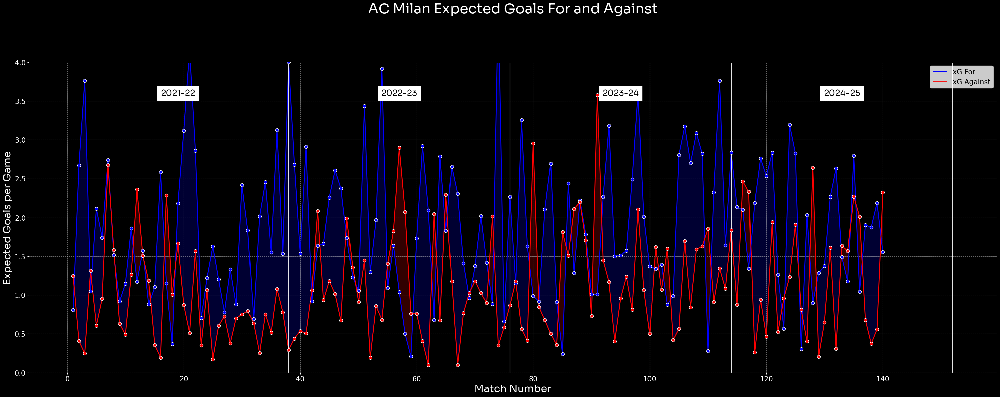

In [102]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from matplotlib.patches import FancyArrow

fig, ax = plt.subplots(figsize=(30, 12))
fig.patch.set_facecolor(background)
ax.patch.set_facecolor(background)
# Plot xG For and Against
ax.plot(df_team['Match Number'], df_team['xg_per_game'], label='xG For', color='blue', lw=2)
ax.plot(df_team['Match Number'], df_team['xg_against_per_game'], label='xG Against', color='red', lw=2)

# Shaded area between xG For and Against
ax.fill_between(df_team['Match Number'], df_team['xg_per_game'], df_team['xg_against_per_game'],
                where=(df_team['xg_per_game'] > df_team['xg_against_per_game']), interpolate=True, color='blue', alpha=0.2)
ax.fill_between(df_team['Match Number'], df_team['xg_per_game'], df_team['xg_against_per_game'],
                where=(df_team['xg_per_game'] <= df_team['xg_against_per_game']), interpolate=True, color='red', alpha=0.2)


# Scatter points for actual xG For and xG Against
ax.scatter(df_team['Match Number'], df_team['xg_per_game'], color='blue', edgecolors='white', s=50, zorder=3)
ax.scatter(df_team['Match Number'], df_team['xg_against_per_game'], color='red', edgecolors='white', s=50, zorder=3)

# Add vertical lines and season annotations
season_splits = [38, 76, 114,152]  # Match numbers where seasons end
seasons = ['2021-22','2022-23','2023-24','2024-25']
for i, split in enumerate(season_splits):
    ax.axvline(split, color='white', linestyle='-', alpha=0.9)
    ax.text(split - 19, 3.6, seasons[i], color='black', backgroundcolor='white',
            ha='center', va='center', fontsize=18, font=font_prop)

# Customize chart
ax.set_title("AC Milan Expected Goals For and Against",font=font_prop,color='white',fontsize=30,y=1.15)
#ax.text(30,4.25,'Steve Cooper',color='black', backgroundcolor='white',
#            ha='center', va='center', fontsize=22, font=font_prop)

#ax.text(78,4.25,'Nuno Santo',color='black', backgroundcolor='white',
#            ha='center', va='center', fontsize=22, font=font_prop)

ax.set_xlabel('Match Number',color='white',font=font_prop, fontsize=22)
ax.set_ylabel('Expected Goals per Game',color='white',font=font_prop, fontsize=22)
ax.set_ylim(0, 4)
ax.grid(ls='--', color='lightgrey', alpha=0.5)
ax.legend(fontsize=15, loc='upper right')
ax.tick_params(axis='both', which='major',color='white', labelsize=10)


ax.tick_params(axis='x', colors='white', labelsize=15)  # X-axis tick labels in green
ax.tick_params(axis='y', colors='white', labelsize=15)
# Show plot
plt.tight_layout()

#plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/NotFor.png',dpi=500,bbox_inches = 'tight',facecolor=background)


## Passing Networks

In [4]:
# Put the match HTML file path here
match_html_path = "C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/HTMLs/ManCity/36.html"

def extract_json_from_html(html_path, save_output=False):
    with open(html_path, 'r', encoding='utf-8') as html_file:
        html = html_file.read()

    regex_pattern = r'(?<=require\.config\.params\["args"\].=.)[\s\S]*?;'
    data_txt = re.findall(regex_pattern, html)[0]

    # add quotations for JSON parser
    data_txt = data_txt.replace('matchId', '"matchId"')
    data_txt = data_txt.replace('matchCentreData', '"matchCentreData"')
    data_txt = data_txt.replace('matchCentreEventTypeJson', '"matchCentreEventTypeJson"')
    data_txt = data_txt.replace('formationIdNameMappings', '"formationIdNameMappings"')
    data_txt = data_txt.replace('};', '}')

    if save_output:
        # save JSON data to txt
        output_file = open(f"{html_path}.txt", "wt", encoding='utf-8')
        n = output_file.write(data_txt)
        output_file.close()

    return data_txt

def extract_data_from_dict(data):
    # load data from json
    event_types_json = data["matchCentreEventTypeJson"]
    formation_mappings = data["formationIdNameMappings"]
    events_dict = data["matchCentreData"]["events"]
    teams_dict = {data["matchCentreData"]['home']['teamId']: data["matchCentreData"]['home']['name'],
                  data["matchCentreData"]['away']['teamId']: data["matchCentreData"]['away']['name']}
    players_dict = data["matchCentreData"]["playerIdNameDictionary"]
    # create players dataframe
    players_home_df = pd.DataFrame(data["matchCentreData"]['home']['players'])
    players_home_df["teamId"] = data["matchCentreData"]['home']['teamId']
    players_away_df = pd.DataFrame(data["matchCentreData"]['away']['players'])
    players_away_df["teamId"] = data["matchCentreData"]['away']['teamId']
    players_df = pd.concat([players_home_df, players_away_df])
    players_ids = data["matchCentreData"]["playerIdNameDictionary"]
    return events_dict, players_df, teams_dict


json_data_txt = extract_json_from_html(match_html_path)
data = json.loads(json_data_txt)
events_dict, players_df, teams_dict = extract_data_from_dict(data)

df = pd.DataFrame(events_dict)
dfp = pd.DataFrame(players_df)

# Extract the 'displayName' value
df['type'] = df['type'].apply(lambda x: x['displayName'] if isinstance(x, dict) else None)
df['outcomeType'] = df['outcomeType'].apply(lambda x: x['displayName'] if isinstance(x, dict) else None)
df['period'] = df['period'].apply(lambda x: x['displayName'] if isinstance(x, dict) else None)

# temprary use of typeId of period column
df['period'] = df['period'].replace({'FirstHalf': 1, 'SecondHalf': 2, 'FirstPeriodOfExtraTime': 3, 'SecondPeriodOfExtraTime': 4,
                                     'PenaltyShootout': 5, 'PostGame': 14, 'PreMatch': 16})

# new column for cumulative minutes, This part is taken from the "jakeyk11.github.io" github repository and modified for my use
def cumulative_match_mins(events_df):
    events_out = pd.DataFrame()
    # Add cumulative time to events data, resetting for each unique match
    match_events = events_df.copy()
    match_events['cumulative_mins'] = match_events['minute'] + (1/60) * match_events['second']
    # Add time increment to cumulative minutes based on period of game.
    for period in np.arange(1, match_events['period'].max() + 1, 1):
        if period > 1:
            t_delta = match_events[match_events['period'] == period - 1]['cumulative_mins'].max() - \
                                   match_events[match_events['period'] == period]['cumulative_mins'].min()
        elif period == 1 or period == 5:
            t_delta = 0
        else:
            t_delta = 0
        match_events.loc[match_events['period'] == period, 'cumulative_mins'] += t_delta
    # Rebuild events dataframe
    events_out = pd.concat([events_out, match_events])
    return events_out

df = cumulative_match_mins(df)

# Extracting the carry data and merge it with the main df, This part is also taken from the "jakeyk11.github.io" github repository and modified for my use
def insert_ball_carries(events_df, min_carry_length=3, max_carry_length=60, min_carry_duration=1, max_carry_duration=10):
    events_out = pd.DataFrame()
    # Carry conditions (convert from metres to opta)
    min_carry_length = 3.0
    max_carry_length = 60.0
    min_carry_duration = 1.0
    max_carry_duration = 10.0
    # match_events = events_df[events_df['match_id'] == match_id].reset_index()
    match_events = events_df.reset_index()
    match_carries = pd.DataFrame()

    for idx, match_event in match_events.iterrows():

        if idx < len(match_events) - 1:
            prev_evt_team = match_event['teamId']
            next_evt_idx = idx + 1
            init_next_evt = match_events.loc[next_evt_idx]
            take_ons = 0
            incorrect_next_evt = True

            while incorrect_next_evt:

                next_evt = match_events.loc[next_evt_idx]

                if next_evt['type'] == 'TakeOn' and next_evt['outcomeType'] == 'Successful':
                    take_ons += 1
                    incorrect_next_evt = True

                elif ((next_evt['type'] == 'TakeOn' and next_evt['outcomeType'] == 'Unsuccessful')
                      or (next_evt['teamId'] != prev_evt_team and next_evt['type'] == 'Challenge' and next_evt['outcomeType'] == 'Unsuccessful')
                      or (next_evt['type'] == 'Foul')):
                    incorrect_next_evt = True

                else:
                    incorrect_next_evt = False

                next_evt_idx += 1

            # Apply some conditioning to determine whether carry criteria is satisfied
            same_team = prev_evt_team == next_evt['teamId']
            not_ball_touch = match_event['type'] != 'BallTouch'
            dx = 105*(match_event['endX'] - next_evt['x'])/100
            dy = 68*(match_event['endY'] - next_evt['y'])/100
            far_enough = dx ** 2 + dy ** 2 >= min_carry_length ** 2
            not_too_far = dx ** 2 + dy ** 2 <= max_carry_length ** 2
            dt = 60 * (next_evt['cumulative_mins'] - match_event['cumulative_mins'])
            min_time = dt >= min_carry_duration
            same_phase = dt < max_carry_duration
            same_period = match_event['period'] == next_evt['period']

            valid_carry = same_team & not_ball_touch & far_enough & not_too_far & min_time & same_phase &same_period

            if valid_carry:
                carry = pd.DataFrame()
                prev = match_event
                nex = next_evt

                carry.loc[0, 'eventId'] = prev['eventId'] + 0.5
                carry['minute'] = np.floor(((init_next_evt['minute'] * 60 + init_next_evt['second']) + (
                        prev['minute'] * 60 + prev['second'])) / (2 * 60))
                carry['second'] = (((init_next_evt['minute'] * 60 + init_next_evt['second']) +
                                    (prev['minute'] * 60 + prev['second'])) / 2) - (carry['minute'] * 60)
                carry['teamId'] = nex['teamId']
                carry['x'] = prev['endX']
                carry['y'] = prev['endY']
                carry['expandedMinute'] = np.floor(((init_next_evt['expandedMinute'] * 60 + init_next_evt['second']) +
                                                    (prev['expandedMinute'] * 60 + prev['second'])) / (2 * 60))
                carry['period'] = nex['period']
                carry['type'] = carry.apply(lambda x: {'value': 99, 'displayName': 'Carry'}, axis=1)
                carry['outcomeType'] = 'Successful'
                carry['qualifiers'] = carry.apply(lambda x: {'type': {'value': 999, 'displayName': 'takeOns'}, 'value': str(take_ons)}, axis=1)
                carry['satisfiedEventsTypes'] = carry.apply(lambda x: [], axis=1)
                carry['isTouch'] = True
                carry['playerId'] = nex['playerId']
                carry['endX'] = nex['x']
                carry['endY'] = nex['y']
                carry['blockedX'] = np.nan
                carry['blockedY'] = np.nan
                carry['goalMouthZ'] = np.nan
                carry['goalMouthY'] = np.nan
                carry['isShot'] = np.nan
                carry['relatedEventId'] = nex['eventId']
                carry['relatedPlayerId'] = np.nan
                carry['isGoal'] = np.nan
                carry['cardType'] = np.nan
                carry['isOwnGoal'] = np.nan
                carry['type'] = 'Carry'
                carry['cumulative_mins'] = (prev['cumulative_mins'] + init_next_evt['cumulative_mins']) / 2

                match_carries = pd.concat([match_carries, carry], ignore_index=True, sort=False)

    match_events_and_carries = pd.concat([match_carries, match_events], ignore_index=True, sort=False)
    match_events_and_carries = match_events_and_carries.sort_values(['period', 'cumulative_mins']).reset_index(drop=True)

    # Rebuild events dataframe
    events_out = pd.concat([events_out, match_events_and_carries])

    return events_out

df = insert_ball_carries(df, min_carry_length=3, max_carry_length=60, min_carry_duration=1, max_carry_duration=10)

df = df.reset_index(drop=True)
df['index'] = range(1, len(df) + 1)
df = df[['index'] + [col for col in df.columns if col != 'index']]

# Assign xT values
df_base  = df
dfxT = df_base.copy()
dfxT['qualifiers'] = dfxT['qualifiers'].astype(str)
dfxT = dfxT[(~dfxT['qualifiers'].str.contains('Corner'))]
dfxT = dfxT[(dfxT['type'].isin(['Pass', 'Carry'])) & (dfxT['outcomeType']=='Successful')]


xT = pd.read_csv('https://raw.githubusercontent.com/mckayjohns/youtube-videos/main/data/xT_Grid.csv', header=None) # use this if you don't have your own xT value Grid
# xT = pd.read_csv("/content/xT_Grid.csv", header=None)    # use this if you have your own xT value Grid, then place your file path here
xT = np.array(xT)
xT_rows, xT_cols = xT.shape

dfxT['x1_bin_xT'] = pd.cut(dfxT['x'], bins=xT_cols, labels=False)
dfxT['y1_bin_xT'] = pd.cut(dfxT['y'], bins=xT_rows, labels=False)
dfxT['x2_bin_xT'] = pd.cut(dfxT['endX'], bins=xT_cols, labels=False)
dfxT['y2_bin_xT'] = pd.cut(dfxT['endY'], bins=xT_rows, labels=False)

dfxT['start_zone_value_xT'] = dfxT[['x1_bin_xT', 'y1_bin_xT']].apply(lambda x: xT[x[1]][x[0]], axis=1)
dfxT['end_zone_value_xT'] = dfxT[['x2_bin_xT', 'y2_bin_xT']].apply(lambda x: xT[x[1]][x[0]], axis=1)

dfxT['xT'] = dfxT['end_zone_value_xT'] - dfxT['start_zone_value_xT']
columns_to_drop = ['id', 'eventId', 'minute', 'second', 'teamId', 'x', 'y', 'expandedMinute', 'period', 'outcomeType', 'qualifiers',  'type',
                   'satisfiedEventsTypes', 'isTouch', 'playerId', 'endX', 'endY', 'relatedEventId', 'relatedPlayerId', 'blockedX', 'blockedY',
                   'goalMouthZ', 'goalMouthY', 'isShot', 'cumulative_mins']
dfxT.drop(columns=columns_to_drop, inplace=True)

df = df.merge(dfxT, on='index', how='left')

# New Column for Team Names and Oppositon TeamNames
df['teamName'] = df['teamId'].map(teams_dict)
team_names = list(teams_dict.values())
opposition_dict = {team_names[i]: team_names[1-i] for i in range(len(team_names))}
df['oppositionTeamName'] = df['teamName'].map(opposition_dict)

# Reshaping the data from 100x100 to 105x68, as I use the pitch_type='uefa', in the pitch function, you can consider according to your use
df['x'] = df['x']*1.05
df['y'] = df['y']*0.68
df['endX'] = df['endX']*1.05
df['endY'] = df['endY']*0.68
df['goalMouthY'] = df['goalMouthY']*0.68

columns_to_drop = ['height', 'weight', 'age', 'isManOfTheMatch', 'field', 'stats',
                   'subbedInPlayerId', 'subbedOutPeriod',
                   'subbedOutExpandedMinute', 'subbedInPeriod', 'subbedInExpandedMinute', 'subbedOutPlayerId',
                   'teamId']
dfp.drop(columns=columns_to_drop, inplace=True)

# adding player name, shirt no. etc info
df = df.merge(dfp, on='playerId', how='left')

df['qualifiers'] = df['qualifiers'].astype(str)
# Calculating passing distance, to find out progressive pass, this will just show the distance reduced by a pass, then will be able to filter passes which has reduced distance value more than 10yds as a progressive pass
df['prog_pass'] = np.where((df['type'] == 'Pass'),
                           np.sqrt((105 - df['x'])**2 + (34 - df['y'])**2) - np.sqrt((105 - df['endX'])**2 + (34 - df['endY'])**2), 0)
# Calculating carrying distance, to find out progressive carry, this will just show the distance reduced by a carry, then will be able to filter carries which has reduced distance value more than 10yds as a progressive carry
df['prog_carry'] = np.where((df['type'] == 'Carry'),
                            np.sqrt((105 - df['x'])**2 + (34 - df['y'])**2) - np.sqrt((105 - df['endX'])**2 + (34 - df['endY'])**2), 0)
df['pass_or_carry_angle'] = np.degrees(np.arctan2(df['endY'] - df['y'], df['endX'] - df['x']))

# Making all the alphabets in the name as English Alphabets only (for example: Á will be replaced by A)
df['name'] = df['name'].astype(str)
df['name'] = df['name'].apply(unidecode)

# Function to extract short names
def get_short_name(full_name):
    if pd.isna(full_name):
        return full_name
    parts = full_name.split()
    if len(parts) == 1:
        return full_name  # No need for short name if there's only one word
    elif len(parts) == 2:
        return parts[0][0] + ". " + parts[1]
    else:
        return parts[0][0] + ". " + parts[1][0] + ". " + " ".join(parts[2:])

# Applying the function to create 'shortName' column
df['shortName'] = df['name'].apply(get_short_name)

df['qualifiers'] = df['qualifiers'].astype(str)
columns_to_drop2 = ['id']
df.drop(columns=columns_to_drop2, inplace=True)

df['period'] = df['period'].replace({1: 'FirstHalf', 2: 'SecondHalf', 3: 'FirstPeriodOfExtraTime', 4: 'SecondPeriodOfExtraTime',
                                     5: 'PenaltyShootout', 14: 'PostGame', 16: 'PreMatch'})

C:\Users\acer\AppData\Local\Temp\ipykernel_24956\3081816427.py:206: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  dfxT['start_zone_value_xT'] = dfxT[['x1_bin_xT', 'y1_bin_xT']].apply(lambda x: xT[x[1]][x[0]], axis=1)
C:\Users\acer\AppData\Local\Temp\ipykernel_24956\3081816427.py:207: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  dfxT['end_zone_value_xT'] = dfxT[['x2_bin_xT', 'y2_bin_xT']].apply(lambda x: xT[x[1]][x[0]], axis=1)


In [5]:
team1_name = 'Man City'
team2_name = 'Bournemouth'

team1_facecolor = 'white'
team2_facecolor = '#76b4e5'

In [6]:
import matplotlib.patheffects as path_effects
from matplotlib.colors import to_rgba

def get_passes_df(df):
    df1 = df[~df['type'].str.contains('SubstitutionOn|FormationChange|FormationSet|Card')]
    df = df1
    df.loc[:, "receiver"] = df["playerId"].shift(-1)
    passes_ids = df.index[df['type'] == 'Pass']
    df_passes = df.loc[passes_ids, ["index", "x", "y","minute", "endX", "endY", "teamName", "playerId", "receiver", "type", "outcomeType", "pass_or_carry_angle"]]

    return df_passes

passes_df = get_passes_df(df)
path_eff = [path_effects.Stroke(linewidth=3, foreground=background), path_effects.Normal()]

def passing_stats(teamName, df):
    dfpass = df[(df['teamName'] == teamName) & (df['type'] == 'Pass')]

    total_passes = dfpass.shape[0]
    acc_pass = dfpass[dfpass['outcomeType'] == 'Successful']
    through_pass = dfpass[(dfpass['qualifiers'].str.contains('Throughball')) & (~dfpass['qualifiers'].str.contains('CornerTaken|Freekick'))]
    Lng_ball = dfpass[(dfpass['qualifiers'].str.contains('Longball')) & (~dfpass['qualifiers'].str.contains('CornerTaken|Freekick'))]
    Crosses = dfpass[(dfpass['qualifiers'].str.contains('Cross')) & (~dfpass['qualifiers'].str.contains('CornerTaken|Freekick'))]
    pen_box = acc_pass[(acc_pass['endX'] >= 88.5) & (acc_pass['endY'] >= 13.6) & (acc_pass['endY'] <= 54.4) & 
                       (~acc_pass['qualifiers'].str.contains('CornerTaken|Freekick'))]

    return total_passes, acc_pass.shape[0], Lng_ball.shape[0], Crosses.shape[0], pen_box.shape[0]

import pandas as pd
from unidecode import unidecode

def get_passes_and_stats(teamName, passes_df, players_df, events_df, time_range):
    """
    Computes passing networks and key passing statistics for a given team within a specified time range.

    Parameters:
    - teamName (str): Name of the team to analyze.
    - passes_df (pd.DataFrame): DataFrame containing pass events.
    - players_df (pd.DataFrame): DataFrame with player details.
    - events_df (pd.DataFrame): DataFrame with all match events (for player positions).
    - time_range (tuple): (start_min, end_min) time range to filter events.

    Returns:
    - passes_between_df (pd.DataFrame): Pass network between players.
    - average_locs_and_count_df (pd.DataFrame): Average player locations and pass count.
    - pass_stats (dict): Dictionary containing key passing statistics.
    """
    start_min, end_min = time_range

    # Filter passes within the given time range and team
    passes_df = passes_df[
        (passes_df["teamName"] == teamName) & 
        (passes_df["minute"] >= start_min) & (passes_df["minute"] < end_min)
    ]

    # Filter events within the given time range and team
    dfteam = events_df[
        (events_df['teamName'] == teamName) & 
        (events_df['minute'] >= start_min) & (events_df['minute'] < end_min) & 
        (~events_df['type'].str.contains('SubstitutionOn|FormationChange|FormationSet|Card'))
    ]

    # Merge with player information
    passes_df = passes_df.merge(players_df[["playerId", "isFirstEleven"]], on='playerId', how='left')

    # Calculate median positions for players
    average_locs_and_count_df = dfteam.groupby('playerId').agg({'x': ['median'], 'y': ['median', 'count']})
    average_locs_and_count_df.columns = ['pass_avg_x', 'pass_avg_y', 'count']

    # Merge player details
    average_locs_and_count_df = average_locs_and_count_df.merge(
        players_df[['playerId', 'name', 'shirtNo', 'position', 'isFirstEleven']], 
        on='playerId', how='left'
    ).set_index('playerId')

    # Normalize player names
    average_locs_and_count_df['name'] = average_locs_and_count_df['name'].apply(unidecode)

    # Get passes between each player
    passes_player_ids_df = passes_df[['playerId', 'receiver']]
    passes_player_ids_df['pos_max'] = passes_player_ids_df[['playerId', 'receiver']].max(axis='columns')
    passes_player_ids_df['pos_min'] = passes_player_ids_df[['playerId', 'receiver']].min(axis='columns')

    # Count passes between player pairs
    passes_between_df = passes_player_ids_df.groupby(['pos_min', 'pos_max']).size().reset_index(name='pass_count')

    # Merge with player locations
    passes_between_df = passes_between_df.merge(
        average_locs_and_count_df, left_on='pos_min', right_index=True
    ).merge(
        average_locs_and_count_df, left_on='pos_max', right_index=True, suffixes=['', '_end']
    )

    ### Passing Statistics ###
    dfpass = dfteam[dfteam['type'] == 'Pass'].copy()

    # Assign receivers by shifting playerId
    dfpass.loc[:, "receiver"] = dfpass["playerId"].shift(-1)

    # Pass count per player
    passes_count = dfpass["playerId"].value_counts()

    # Most passes made
    most_passes_player = players_df.loc[players_df["playerId"] == passes_count.idxmax(), "name"].values[0]
    most_passes_count = passes_count.max()

    # Key passes
    key_pass = dfpass[dfpass['qualifiers'].str.contains('KeyPass', na=False)]
    key_passes_count = key_pass["playerId"].value_counts()

    if not key_passes_count.empty:
        most_key_passes_player = players_df.loc[players_df["playerId"] == key_passes_count.idxmax(), "name"].values[0]
        most_key_passes_count = key_passes_count.max()
    else:
        most_key_passes_player, most_key_passes_count = None, 0

    # Most passes received
    most_passes_received_count = dfpass["receiver"].value_counts()

    if not most_passes_received_count.empty:
        most_passes_received_player = players_df.loc[players_df["playerId"] == most_passes_received_count.idxmax(), "name"].values[0]
        most_passes_received_count = most_passes_received_count.max()
    else:
        most_passes_received_player, most_passes_received_count = None, 0

    # Most key passes received
    most_key_passes_received_count = dfpass[dfpass['qualifiers'].str.contains('KeyPass', na=False)]["receiver"].value_counts()

    if not most_key_passes_received_count.empty:
        most_key_passes_received_player = players_df.loc[players_df["playerId"] == most_key_passes_received_count.idxmax(), "name"].values[0]
        most_key_passes_received_count = most_key_passes_received_count.max()
    else:
        most_key_passes_received_player, most_key_passes_received_count = None, 0

    # Expected Threat (xT) Contribution
    if "xT" in dfpass.columns:
        player_xT_sum = dfpass.groupby("playerId")["xT"].sum()

        if not player_xT_sum.empty:
            top_xT_player = players_df.loc[players_df["playerId"] == player_xT_sum.idxmax(), "name"].values[0]
            top_xT_value = player_xT_sum.max()
        else:
            top_xT_player, top_xT_value = None, 0
    else:
        top_xT_player, top_xT_value = None, 0

    # Store stats in a dictionary
    pass_stats = {
        "most_passes_player": most_passes_player,
        "most_passes_count": most_passes_count,
        "most_key_passes_player": most_key_passes_player,
        "most_key_passes_count": most_key_passes_count,
        "most_passes_received_player": most_passes_received_player,
        "most_passes_received_count": most_passes_received_count,
        "most_key_passes_received_player": most_key_passes_received_player,
        "most_key_passes_received_count": most_key_passes_received_count,
        "top_xT_player": top_xT_player,
        "top_xT_value": top_xT_value
    }

    return passes_between_df, average_locs_and_count_df, pass_stats


In [7]:
def calculate_centralization_index(teamName, passes_df, players_df, events_df, time_range):
    """
    Calculate the centralization index for a given team within a specified time range.

    Parameters:
    - teamName (str): Name of the team to analyze.
    - passes_df (pd.DataFrame): DataFrame containing pass events.
    - players_df (pd.DataFrame): DataFrame with player details.
    - events_df (pd.DataFrame): DataFrame with all match events (for player positions).
    - time_range (tuple): (start_min, end_min) time range to filter events.

    Returns:
    - centralization_index (float): The calculated centralization index for the team.
    """
    start_min, end_min = time_range

    # Filter passes within the given time range and team
    passes_df = passes_df[
        (passes_df["teamName"] == teamName) & 
        (passes_df["minute"] >= start_min) & (passes_df["minute"] < end_min)
    ]

    # Calculate number of passes made by each player
    player_passes_count = passes_df["playerId"].value_counts()

    # Get the total number of passes made by the team
    total_passes = player_passes_count.sum()

    # Get the maximal number of passes made by a single player
    max_passes = player_passes_count.max()

    # Number of players in the team
    num_players = len(player_passes_count)

    # Calculate the denominator (Total passes * (Number of players - 1))
    denominator = total_passes * 10

    # Calculate the numerator (sum of (Max passes - Player passes))
    numerator = sum(max_passes - player_passes_count)

    # Calculate the centralization index
    centralization_index = numerator / denominator if denominator != 0 else 0

    return centralization_index

In [29]:
def pass_network_visualization(ax, passes_between_df, average_locs_and_count_df, col, teamName,MAX_LINE_WIDTH, flipped=False):
    home_passes_between_df_1st_half, home_avg_locs_1st_half, home_pass_stats_1st_half  = get_passes_and_stats(
    team1_name, passes_df, players_df, df, time_range=(0, 45)
    )
    
    # Compute passing network for team1 after 45 minutes
    home_passes_between_df_2nd_half, home_avg_locs_2nd_half, home_pass_stats_2nd_half  = get_passes_and_stats(
        team1_name, passes_df, players_df, df, time_range=(46, 60)
    )

    home_passes_between_df_3nd_half, home_avg_locs_3nd_half, home_pass_stats_3nd_half  = get_passes_and_stats(
        team1_name, passes_df, players_df, df, time_range=(61, 80)
    )
    
    MAX_MARKER_SIZE = 1500
    line_color='white'
    passes_between_df['width'] = (passes_between_df.pass_count / passes_between_df.pass_count.max()) * MAX_LINE_WIDTH
    average_locs_and_count_df['marker_size'] = (average_locs_and_count_df['count']/ average_locs_and_count_df['count'].max() * MAX_MARKER_SIZE) #You can plot variable size of each player's node according to their passing volume, in the plot using this
    MIN_TRANSPARENCY = 0.25
    MAX_TRANSPARENCY = 0.95
    color = np.array(to_rgba(col))
    color = np.tile(color, (len(passes_between_df), 1))
    c_transparency = passes_between_df.pass_count / passes_between_df.pass_count.max()
    c_transparency = (c_transparency * (MAX_TRANSPARENCY - MIN_TRANSPARENCY)) + MIN_TRANSPARENCY
    color[:, 3] = c_transparency

    pitch = VerticalPitch(pitch_type='uefa', corner_arcs=True, pitch_color=background, line_color='white', linewidth=0.5,
                         positional=True, shade_middle=True, positional_color='#C94948', shade_color='grey',shade_alpha=0.3,positional_alpha=0.5)
    pitch.draw(ax=ax)
    ax.set_aspect('equal')
    #ax.set_xlim(-0.5, 105.5)
    #ax.set_ylim(-0.5, 68.5)

    # Plotting those lines between players
    pass_lines = pitch.lines(passes_between_df.pass_avg_x, passes_between_df.pass_avg_y, passes_between_df.pass_avg_x_end, passes_between_df.pass_avg_y_end,
                             lw=passes_between_df.width, color=color, zorder=1, ax=ax)
    #pitch.arrows(passes_between_df.pass_avg_x, passes_between_df.pass_avg_y,
    #         passes_between_df.pass_avg_x_end, passes_between_df.pass_avg_y_end, width=passes_between_df.width,
    #         headwidth=10, headlength=10, color=col, ax=ax,label='')
    
    # Plotting the player nodes
    for index, row in average_locs_and_count_df.iterrows():
      #if row['isFirstEleven'] == True:
        pass_nodes = pitch.scatter(row['pass_avg_x'], row['pass_avg_y'], s=row['marker_size'], marker='o', color=background, edgecolor=line_color, linewidth=2, alpha=1, ax=ax)
      #else:
        #pass_nodes = pitch.scatter(row['pass_avg_x'], row['pass_avg_y'], s=900, marker='s', color=background, edgecolor=line_color, linewidth=2, alpha=0.7, ax=ax)

    # Plotting the shirt no. of each player
    for index, row in average_locs_and_count_df.iterrows():
        #if row['isFirstEleven'] == True:
        player_initials = row["shirtNo"]
        pitch.annotate(player_initials, xy=(row.pass_avg_x, row.pass_avg_y), c=col, ha='center', va='center', size=14, ax=ax)

    # Defense line Passing Height (avg. height of all the passes made by the Center Backs)
    center_backs_height = average_locs_and_count_df[average_locs_and_count_df['position']=='DC']
    def_line_h = round(center_backs_height['pass_avg_x'].median(), 2)
    #ax.axvline(x=def_line_h, color='white', linestyle='dotted', alpha=0.7, linewidth=2)

    # Getting the top passers combination
    passes_between_df = passes_between_df.sort_values(by='pass_count', ascending=False).head(1).reset_index(drop=True)
    most_pass_from = passes_between_df['name'][0]
    most_pass_from_no = passes_between_df['shirtNo'][0]
    most_pass_to = passes_between_df['name_end'][0]
    most_pass_to_no = passes_between_df['shirtNo_end'][0]
    most_pass_count = passes_between_df['pass_count'][0]

    # Calculate centralization index for team1 during the first half (0-45 minutes)
    centralization_index_1st_half = calculate_centralization_index(team1_name, passes_df, players_df, df, time_range=(0, 45))

    # Calculate centralization index for team1 during the second half (46-90 minutes)
    centralization_index_2nd_half = calculate_centralization_index(team1_name, passes_df, players_df, df, time_range=(46, 60))
    centralization_index_3nd_half = calculate_centralization_index(team1_name, passes_df, players_df, df, time_range=(61, 80))

    # Headlines and other texts
    if col == team1_facecolor:
        #ax.text(0.85, -0.05, f"Average On Ball Defensive Line = {def_line_h}m", color='white',fontproperties=font_prop, size=13,ha='right', transform=ax.transAxes)
        #ax.text(0.99, -0.1, f"{most_pass_from} ({most_pass_from_no}) to {most_pass_to} ({most_pass_to_no}) {most_pass_count} Passes", color='white',fontproperties=font_prop, size=13,ha='right', transform=ax.transAxes)
        ax.text(0.5,1,f"Before First Sub (0-45)", color=line_color,fontproperties=font_prop, size=20,ha='center', transform=ax.transAxes)
        ax_text(70,-12,f"Most Passes From <{home_pass_stats_1st_half['most_passes_player']}> {home_pass_stats_1st_half['most_passes_count']}",color=line_color,fontproperties=font_prop,highlight_textprops=[{'color':team1_facecolor}], size=13,ha='left', ax=ax)
        
        ax_text(70,-5,f"Centralization Index <{round(centralization_index_1st_half,3)}>",color=line_color,fontproperties=font_prop,highlight_textprops=[{'color':team1_facecolor}], size=13,ha='left', ax=ax)
        
        ax_text(70,-19,f"Most Key Passes From <{home_pass_stats_1st_half['most_key_passes_player']}> {home_pass_stats_1st_half['most_key_passes_count']}",color=line_color,fontproperties=font_prop,highlight_textprops=[{'color':team1_facecolor}], size=13,ha='left', ax=ax)
        ax_text(70,-26,f"Most Key Passes To <{home_pass_stats_1st_half['most_key_passes_received_player']}> {home_pass_stats_1st_half['most_key_passes_received_count']}",color=line_color,fontproperties=font_prop,highlight_textprops=[{'color':team1_facecolor}], size=13,ha='left', ax=ax)
        ax_text(70,-33,f"Highest xT Passes From <{home_pass_stats_1st_half['top_xT_player']}> {round(home_pass_stats_1st_half['top_xT_value'],2)}",color=line_color,fontproperties=font_prop,highlight_textprops=[{'color':team1_facecolor}], size=13,ha='left',ax=ax)
        
    elif col == team2_facecolor:
        
      #ax.text(0.9, -0.05, f"Average On Ball Defensive Line = {def_line_h}m", color='white',fontproperties=font_prop, size=13,ha='right', transform=ax.transAxes)
      #ax.text(0.99, -0.1, f"{most_pass_from} ({most_pass_from_no}) to {most_pass_to} ({most_pass_to_no}) {most_pass_count} Passes", color='white',fontproperties=font_prop, size=13,ha='right', transform=ax.transAxes)
      ax.text(0.5,1,f"After First Sub (46-90)", color=line_color,fontproperties=font_prop, size=20,ha='center', transform=ax.transAxes)
      ax_text(70,-12,f"Most Passes From <{home_pass_stats_2nd_half['most_passes_player']}> {home_pass_stats_2nd_half['most_passes_count']}",color=line_color,fontproperties=font_prop,highlight_textprops=[{'color':team2_facecolor}], size=13,ha='left', ax=ax)
      
      ax_text(70,-5,f"Centralization Index <{round(centralization_index_2nd_half,3)}>",color=line_color,fontproperties=font_prop,highlight_textprops=[{'color':team2_facecolor}], size=13,ha='left', ax=ax)
      
      ax_text(70,-19,f"Most Key Passes From <{home_pass_stats_2nd_half['most_key_passes_player']}> {home_pass_stats_2nd_half['most_key_passes_count']}",color=line_color,fontproperties=font_prop,highlight_textprops=[{'color':team2_facecolor}], size=13,ha='left', ax=ax)
      ax_text(70,-26,f"Most Key Passes To <{home_pass_stats_2nd_half['most_key_passes_received_player']}> {home_pass_stats_2nd_half['most_key_passes_received_count']}",color=line_color,fontproperties=font_prop,highlight_textprops=[{'color':team2_facecolor}], size=13,ha='left', ax=ax)
      ax_text(70,-33,f"Highest xT Passes From <{home_pass_stats_2nd_half['top_xT_player']}> {round(home_pass_stats_2nd_half['top_xT_value'],2)}",color=line_color,fontproperties=font_prop,highlight_textprops=[{'color':team2_facecolor}], size=13,ha='left',ax=ax)

    else:
      ax.text(0.5,1,f"After Second Sub (61-80)", color=line_color,fontproperties=font_prop, size=20,ha='center', transform=ax.transAxes)
      ax_text(70,-12,f"Most Passes From <{home_pass_stats_3nd_half['most_passes_player']}> {home_pass_stats_3nd_half['most_passes_count']}",color=line_color,fontproperties=font_prop,highlight_textprops=[{'color':'lightgreen'}], size=13,ha='left', ax=ax)
      
      ax_text(70,-5,f"Centralization Index <{round(centralization_index_3nd_half,3)}>",color=line_color,fontproperties=font_prop,highlight_textprops=[{'color':'lightgreen'}], size=13,ha='left', ax=ax)
      
      ax_text(70,-19,f"Most Key Passes From <{home_pass_stats_3nd_half['most_key_passes_player']}> {home_pass_stats_3nd_half['most_key_passes_count']}",color=line_color,fontproperties=font_prop,highlight_textprops=[{'color':'lightgreen'}], size=13,ha='left', ax=ax)
      ax_text(70,-26,f"Most Key Passes To <{home_pass_stats_3nd_half['most_key_passes_received_player']}> {home_pass_stats_3nd_half['most_key_passes_received_count']}",color=line_color,fontproperties=font_prop,highlight_textprops=[{'color':'lightgreen'}], size=13,ha='left', ax=ax)
      ax_text(70,-33,f"Highest xT Passes From <{home_pass_stats_3nd_half['top_xT_player']}> {round(home_pass_stats_3nd_half['top_xT_value'],2)}",color=line_color,fontproperties=font_prop,highlight_textprops=[{'color':'lightgreen'}], size=13,ha='left',ax=ax)

    return

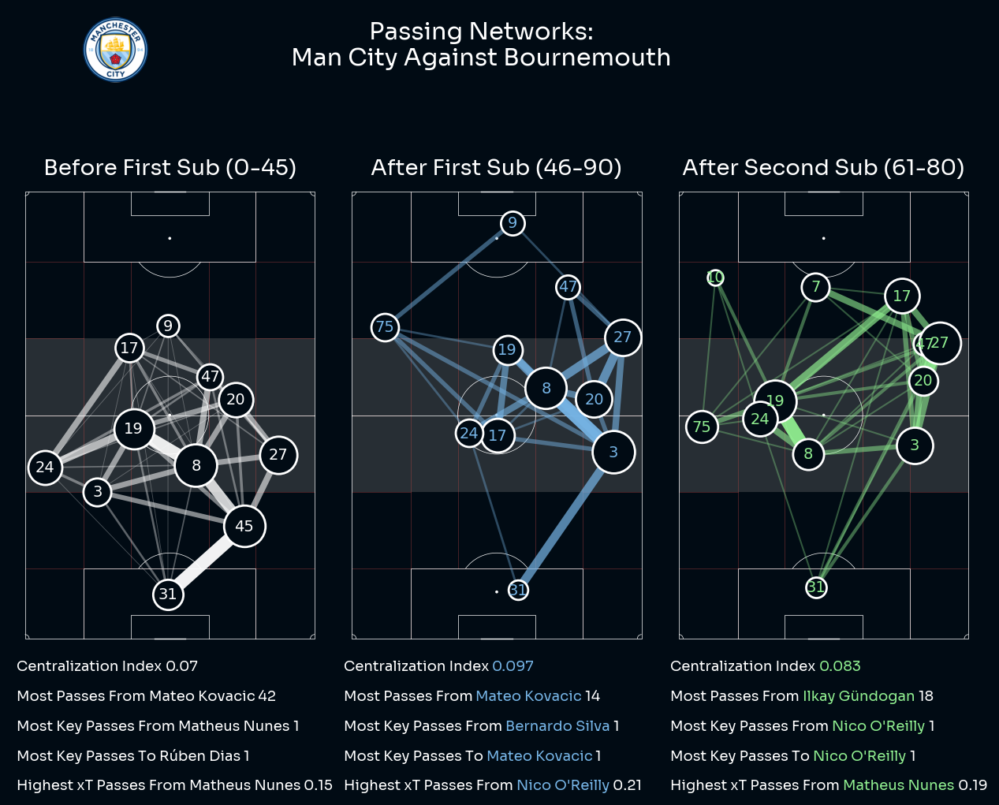

In [32]:
fig,axs=plt.subplots(1,3, figsize=(16,9), facecolor=background)

plt.subplots_adjust(wspace=0.01)

fig.suptitle(f'Passing Networks:\n{team1_name} Against {team2_name}', fontsize=22,fontproperties=font_prop, color='white', y=1.05)

img_team1 = mpimg.imread(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/TeamLogos/{team1_name}.png')
ax_image = add_image(
    img_team1, fig, left=0.15, bottom=0.95, width=0.12, height=0.12,aspect='equal'
)


home_passes_between_df_1st_half, home_avg_locs_1st_half, stats1 = get_passes_and_stats(team1_name, passes_df, players_df, df, (0,45))
home_passes_between_df_2nd_half, home_avg_locs_2nd_half, stats2 = get_passes_and_stats(team1_name, passes_df, players_df, df, (46,60))
home_passes_between_df_3nd_half, home_avg_locs_3nd_half, stats3 = get_passes_and_stats(team1_name, passes_df, players_df, df, (61,80))

pass_network_stats_home = pass_network_visualization(axs[0], home_passes_between_df_1st_half, home_avg_locs_1st_half, team1_facecolor, team1_name,12)
pass_network_stats_away = pass_network_visualization(axs[1], home_passes_between_df_2nd_half, home_avg_locs_2nd_half, team2_facecolor, team1_name,12)
pass_network_stats_away = pass_network_visualization(axs[2], home_passes_between_df_3nd_half, home_avg_locs_3nd_half, 'lightgreen', team1_name,12)
#action_types = ['Passes', 'Acc Passes', 'Long Ball','Crosses', 'Penalty Box']
#plot_donut_charts(axs[1],action_types,passing_stats(team1_name,df),passing_stats(team2_name,df),team1_name,team2_name)
plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/PassingNetworks.png',dpi=500,bbox_inches = 'tight',facecolor=background)


## xG Per Game State

### When Losing/Drawing

In [61]:
query = """WITH ShotGameState AS (
    SELECT 
        s.*,
        CASE 
            WHEN h_a = 'h' AND h_goals > a_goals THEN 'winning'
            WHEN h_a = 'h' AND h_goals = a_goals THEN 'drawing'
            WHEN h_a = 'h' AND h_goals < a_goals THEN 'losing'
            WHEN h_a = 'a' AND a_goals > h_goals THEN 'winning'
            WHEN h_a = 'a' AND a_goals = h_goals THEN 'drawing'
            WHEN h_a = 'a' AND a_goals < h_goals THEN 'losing'
        END AS game_state,
        CASE WHEN h_a = 'h' THEN h_team ELSE a_team END AS team
    FROM understat_shots_tb s
    WHERE season = '2024' and league = 'Bundesliga'
), 

StateChange AS (
    SELECT 
        team, 
        league,
        match_id,
        minute,
        game_state,
        result,
        "xG",
        (CASE WHEN result = 'goal' THEN 1 ELSE 0 END) AS goal,
        LAG(game_state) OVER (PARTITION BY team, match_id ORDER BY minute) AS prev_game_state
    FROM ShotGameState
),

FilteredShots AS (
    SELECT 
        team, 
        league,
        match_id,
        SUM(CASE WHEN game_state IN ('losing') THEN "xG" ELSE 0 END) AS total_xG,
        SUM(CASE WHEN game_state IN ('losing') AND result = 'Goal' THEN 1 ELSE 0 END) AS total_goals
    FROM StateChange
    WHERE game_state IN ('losing')
    GROUP BY team, league, match_id
),

AggregatedTeams AS (
    SELECT 
        team,
        league,
        SUM(total_xG) AS total_xG,
        SUM(total_goals) AS total_goals
    FROM FilteredShots
    GROUP BY team, league
),

RankedTeams AS (
    SELECT 
        team,
        league,
        total_xG,
        total_goals,
        RANK() OVER (ORDER BY total_xG DESC) AS rank
    FROM AggregatedTeams
)

SELECT team, total_xG, total_goals
FROM RankedTeams;"""

with engine.connect() as conn:
    df1 = pd.read_sql(query, conn)

In [62]:
df1['xG_Losing'] = df1['total_xg']
df1['Goals_Losing'] = df1['total_goals']

df1.drop(columns = ['total_xg','total_goals'],inplace=True)


In [63]:
query = """WITH ShotGameState AS (
    SELECT 
        s.*,
        CASE 
            WHEN h_a = 'h' AND h_goals > a_goals THEN 'winning'
            WHEN h_a = 'h' AND h_goals = a_goals THEN 'drawing'
            WHEN h_a = 'h' AND h_goals < a_goals THEN 'losing'
            WHEN h_a = 'a' AND a_goals > h_goals THEN 'winning'
            WHEN h_a = 'a' AND a_goals = h_goals THEN 'drawing'
            WHEN h_a = 'a' AND a_goals < h_goals THEN 'losing'
        END AS game_state,
        CASE WHEN h_a = 'h' THEN h_team ELSE a_team END AS team
    FROM understat_shots_tb s
    WHERE season = '2024' and league = 'Bundesliga'
), 

StateChange AS (
    SELECT 
        team, 
        league,
        match_id,
        minute,
        game_state,
        result,
        "xG",
        (CASE WHEN result = 'goal' THEN 1 ELSE 0 END) AS goal,
        LAG(game_state) OVER (PARTITION BY team, match_id ORDER BY minute) AS prev_game_state
    FROM ShotGameState
),

FilteredShots AS (
    SELECT 
        team, 
        league,
        match_id,
        SUM(CASE WHEN game_state = 'winning' THEN "xG" ELSE 0 END) AS total_xG,
        SUM(CASE WHEN game_state = 'winning' AND result = 'Goal' THEN 1 ELSE 0 END) AS total_goals
    FROM StateChange
    WHERE game_state = 'winning'
    GROUP BY team, league, match_id
),

AggregatedTeams AS (
    SELECT 
        team,
        league,
        SUM(total_xG) AS total_xG,
        SUM(total_goals) AS total_goals
    FROM FilteredShots
    GROUP BY team, league
),

RankedTeams AS (
    SELECT 
        team,
        league,
        total_xG,
        total_goals,
        RANK() OVER (ORDER BY total_xG DESC) AS rank
    FROM AggregatedTeams
)

SELECT team, total_xG, total_goals
FROM RankedTeams;"""

with engine.connect() as conn:
    df2 = pd.read_sql(query, conn)

In [64]:
df2['xG_Winning'] = df2['total_xg']
df2['Goals_Winning'] = df2['total_goals']

df2.drop(columns = ['total_xg','total_goals'],inplace=True)

In [65]:
query = """WITH ShotGameState AS (
    SELECT 
        s.*,
        CASE 
            WHEN h_a = 'h' AND h_goals > a_goals THEN 'winning'
            WHEN h_a = 'h' AND h_goals = a_goals THEN 'drawing'
            WHEN h_a = 'h' AND h_goals < a_goals THEN 'losing'
            WHEN h_a = 'a' AND a_goals > h_goals THEN 'winning'
            WHEN h_a = 'a' AND a_goals = h_goals THEN 'drawing'
            WHEN h_a = 'a' AND a_goals < h_goals THEN 'losing'
        END AS game_state,
        CASE WHEN h_a = 'h' THEN h_team ELSE a_team END AS team
    FROM understat_shots_tb s
    WHERE season = '2024' and league = 'Bundesliga'
), 

StateChange AS (
    SELECT 
        team, 
        league,
        match_id,
        minute,
        game_state,
        result,
        "xG",
        (CASE WHEN result = 'goal' THEN 1 ELSE 0 END) AS goal,
        LAG(game_state) OVER (PARTITION BY team, match_id ORDER BY minute) AS prev_game_state
    FROM ShotGameState
),

FilteredShots AS (
    SELECT 
        team, 
        league,
        match_id,
        SUM(CASE WHEN game_state = 'drawing' THEN "xG" ELSE 0 END) AS total_xG,
        SUM(CASE WHEN game_state = 'drawing' AND result = 'Goal' THEN 1 ELSE 0 END) AS total_goals
    FROM StateChange
    WHERE game_state = 'drawing'
    GROUP BY team, league, match_id
),

AggregatedTeams AS (
    SELECT 
        team,
        league,
        SUM(total_xG) AS total_xG,
        SUM(total_goals) AS total_goals
    FROM FilteredShots
    GROUP BY team, league
),

RankedTeams AS (
    SELECT 
        team,
        league,
        total_xG,
        total_goals,
        RANK() OVER (ORDER BY total_xG DESC) AS rank
    FROM AggregatedTeams
)

SELECT team, total_xG, total_goals
FROM RankedTeams;"""

with engine.connect() as conn:
    df3 = pd.read_sql(query, conn)

In [66]:
df3['xG_Drawing'] = df3['total_xg']
df3['Goals_Drawing'] = df3['total_goals']

df3.drop(columns = ['total_xg','total_goals'],inplace=True)

In [67]:
df12 = df1.merge(df2, on='team', how='inner') 
df = df12.merge(df3, on='team', how='inner')

In [68]:
df['xG_Losing'] = round(df['xG_Losing'],2)
df['xG_Winning'] = round(df['xG_Winning'],2)
df['xG_Drawing'] = round(df['xG_Drawing'],2)

In [209]:
df.loc[19, "team"] = "Wolves"

In [69]:
df['Goals_Losing'] = df['Goals_Losing'].astype(int)
df['Goals_Winning'] = df['Goals_Winning'].astype(int)
df['Goals_Drawing'] = df['Goals_Drawing'].astype(int)

In [70]:
df

,team,xG_Losing,Goals_Losing,xG_Winning,Goals_Winning,xG_Drawing,Goals_Drawing
0,Augsburg,7.45,4,14.05,19,7.95,6
1,Bayer Leverkusen,4.80,2,35.38,48,15.55,7
2,Bayern Munich,3.78,3,62.94,64,7.81,6
3,Bochum,19.26,8,8.55,8,7.61,8
4,Borussia Dortmund,15.20,9,31.30,30,5.00,4
5,Borussia M.Gladbach,10.99,8,28.53,31,4.01,3
6,Eintracht Frankfurt,9.78,5,34.93,39,11.42,10
7,FC Heidenheim,18.56,12,8.80,13,7.21,6
8,Freiburg,7.78,4,26.09,27,9.36,3
9,Hoffenheim,13.96,8,12.17,17,9.63,7


In [71]:
# Define local logo folder path
logo_dir = r"C:/Users/acer/Desktop/IndianCityzen/football-logos-master/logos/Germany - Bundesliga/"

# Create `image_url` column dynamically
df["image_url"] = df["team"].apply(lambda team: os.path.join(logo_dir, f"{team}.png"))

In [72]:
# Calculate total goals for sorting
df["Total_Goals"] = df["Goals_Losing"] + df["Goals_Drawing"] + df["Goals_Winning"]

# Sort teams by total goals in descending order
df = df.sort_values(by="Total_Goals", ascending=False)

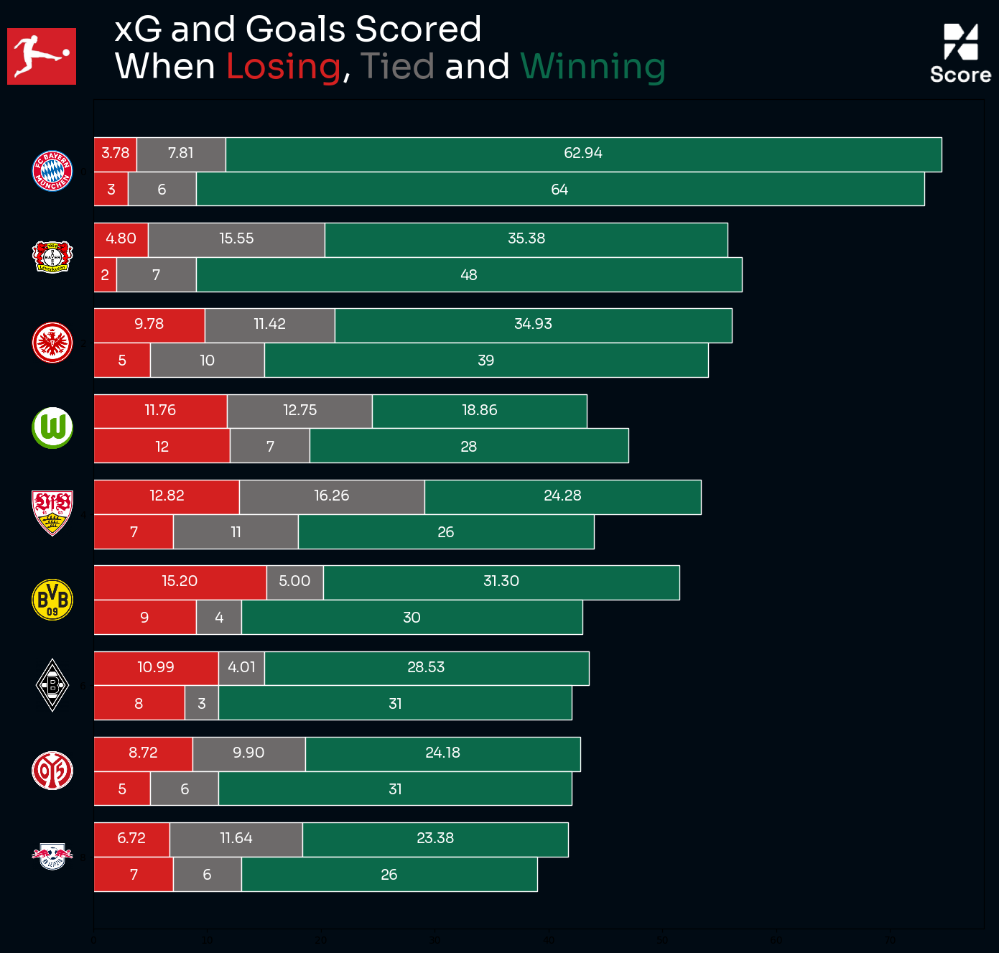

In [76]:
import matplotlib.image as mpimg
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

df_top10 = df[:9]

# Set up figure and axes
fig, ax = plt.subplots(figsize=(16, 15),facecolor=background)
#background = "#010b14"
text_color = 'white'
ax.set_facecolor(background)

# Number of teams
num_teams = len(df_top10)
y_positions = np.arange(num_teams)
bar_height = 0.4  # Height of each stacked bar

# Stacked Bars for xG
ax.barh(y_positions - bar_height / 2, df_top10["xG_Losing"], height=bar_height, color="#d42020",edgecolor='white', label="xG (Losing)")
ax.barh(y_positions - bar_height / 2, df_top10["xG_Drawing"], height=bar_height, color="#6d6a6a",edgecolor='white', left=df_top10["xG_Losing"], label="xG (Drawing)")
ax.barh(y_positions - bar_height / 2, df_top10["xG_Winning"], height=bar_height, color="#0b694a", edgecolor='white',left=df_top10["xG_Losing"] + df_top10["xG_Drawing"], label="xG (Winning)")

# Stacked Bars for Goals
ax.barh(y_positions + bar_height / 2, df_top10["Goals_Losing"], height=bar_height, color="#d42020",edgecolor='white', label="Goals (Losing)")
ax.barh(y_positions + bar_height / 2, df_top10["Goals_Drawing"], height=bar_height, color="#6d6a6a",edgecolor='white', left=df_top10["Goals_Losing"], label="Goals (Drawing)")
ax.barh(y_positions + bar_height / 2, df_top10["Goals_Winning"], height=bar_height, color="#0b694a",edgecolor='white', left=df_top10["Goals_Losing"] + df_top10["Goals_Drawing"], label="Goals (Winning)")


# Add text labels for xG values
for i, team in enumerate(df_top10["team"]):
    # xG values
    ax.text(df_top10["xG_Losing"].iloc[i] / 2, y_positions[i] - bar_height / 2.5, 
            f'{df_top10["xG_Losing"].iloc[i]:.2f}', color='white', ha='center',fontproperties=font_prop, fontsize=14)
    
    ax.text(df_top10["xG_Losing"].iloc[i] + df_top10["xG_Drawing"].iloc[i] / 2, y_positions[i] - bar_height / 2.5, 
            f'{df_top10["xG_Drawing"].iloc[i]:.2f}', color='white', ha='center',fontproperties=font_prop, fontsize=14)
    
    ax.text(df_top10["xG_Losing"].iloc[i] + df_top10["xG_Drawing"].iloc[i] + df_top10["xG_Winning"].iloc[i] / 2, 
            y_positions[i] - bar_height / 2.5, f'{df_top10["xG_Winning"].iloc[i]:.2f}', color='white', ha='center',fontproperties=font_prop, fontsize=14)
    
    # Goal values
    ax.text(df_top10["Goals_Losing"].iloc[i] / 2, y_positions[i] + bar_height / 1.5, 
            f'{df_top10["Goals_Losing"].iloc[i]}', color='white', ha='center',fontproperties=font_prop, fontsize=14)
    
    ax.text(df_top10["Goals_Losing"].iloc[i] + df_top10["Goals_Drawing"].iloc[i] / 2, y_positions[i] + bar_height / 1.5, 
            f'{df_top10["Goals_Drawing"].iloc[i]}', color='white', ha='center',fontproperties=font_prop, fontsize=14)
    
    ax.text(df_top10["Goals_Losing"].iloc[i] + df_top10["Goals_Drawing"].iloc[i] + df_top10["Goals_Winning"].iloc[i] / 2, 
            y_positions[i] + bar_height / 1.5, f'{df_top10["Goals_Winning"].iloc[i]}', color='white', ha='center',fontproperties=font_prop, fontsize=14)


for y, img_path in zip(y_positions, df_top10["image_url"]):
    if os.path.exists(img_path):  # Check if the image file exists
        img = mpimg.imread(img_path)  # Load the image
        imagebox = OffsetImage(img, zoom=0.3)  # Adjust zoom level
        ab = AnnotationBbox(imagebox, (0.8, y), frameon=False, xybox=(-50, 0), xycoords='data', boxcoords="offset points")
        ax.add_artist(ab)



logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Score Logos-20241022T100701Z-001/Score Logos/ScoreSquareWhite.png')

ax_image = add_image(
    logo, fig, left=0.85, bottom=0.89, width=0.06, height=0.06,aspect='equal'
)


league_logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/TeamLogos/Bundesliga.jpg')

ax_image = add_image(
    league_logo, fig, left=0.05, bottom=0.89, width=0.06, height=0.06,aspect='equal'
)

# Labels and Titles
#ax.set_yticks(y_positions)
#ax.set_yticklabels(df_top10["team"],fontproperties=font_prop, color='white', fontsize=20)
#ax.set_xlabel("xG and Goals per 90")
#ax.set_title("xG vs Goals in Different Game States", fontweight="bold",fontproperties=font_prop, color='white', fontsize=30)


ax_text(-1, -1.2, '''
    xG and Goals Scored
    When <Losing>, <Tied> and <Winning>\n
    ''',
    color='white',fontproperties=font_prop,
    highlight_textprops=[{'color':'#d42020'}, {'color':'#6d6a6a'},{'color':'#0b694a'}], fontsize=35, ha='left', va='center', ax=ax)

# Grid and Legend
#ax.grid(axis="x", linestyle="--", alpha=0.7)
#ax.legend(loc="lower right", ncol=2)

ax.invert_yaxis()

plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/Bundesliga_GameState_Top9.png',dpi=500,bbox_inches = 'tight',facecolor=background)


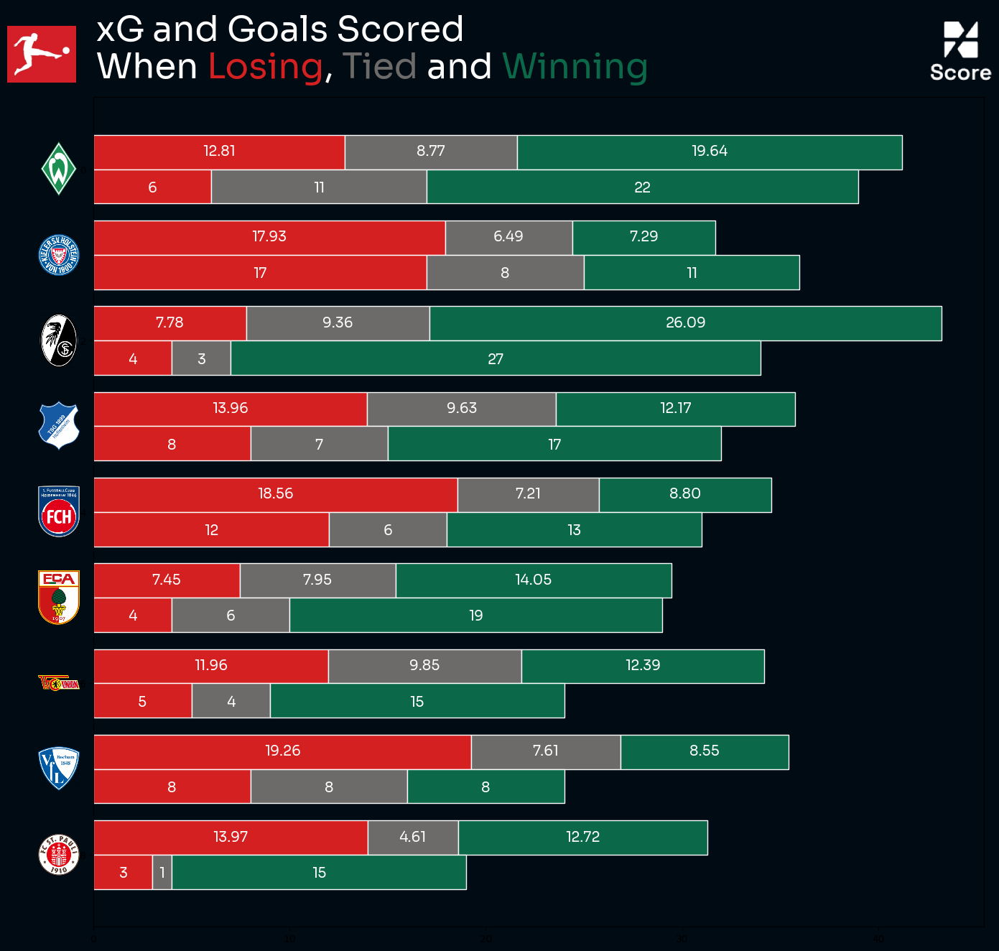

In [77]:
df_top10 = df[9:]

# Set up figure and axes
fig, ax = plt.subplots(figsize=(16, 15),facecolor=background)
#background = "#010b14"
text_color = 'white'
ax.set_facecolor(background)

# Number of teams
num_teams = len(df_top10)
y_positions = np.arange(num_teams)
bar_height = 0.4  # Height of each stacked bar

# Stacked Bars for xG
ax.barh(y_positions - bar_height / 2, df_top10["xG_Losing"], height=bar_height, color="#d42020",edgecolor='white', label="xG (Losing)")
ax.barh(y_positions - bar_height / 2, df_top10["xG_Drawing"], height=bar_height, color="#6d6a6a",edgecolor='white', left=df_top10["xG_Losing"], label="xG (Drawing)")
ax.barh(y_positions - bar_height / 2, df_top10["xG_Winning"], height=bar_height, color="#0b694a", edgecolor='white',left=df_top10["xG_Losing"] + df_top10["xG_Drawing"], label="xG (Winning)")

# Stacked Bars for Goals
ax.barh(y_positions + bar_height / 2, df_top10["Goals_Losing"], height=bar_height, color="#d42020",edgecolor='white', label="Goals (Losing)")
ax.barh(y_positions + bar_height / 2, df_top10["Goals_Drawing"], height=bar_height, color="#6d6a6a",edgecolor='white', left=df_top10["Goals_Losing"], label="Goals (Drawing)")
ax.barh(y_positions + bar_height / 2, df_top10["Goals_Winning"], height=bar_height, color="#0b694a",edgecolor='white', left=df_top10["Goals_Losing"] + df_top10["Goals_Drawing"], label="Goals (Winning)")


# Add text labels for xG values
for i, team in enumerate(df_top10["team"]):
    # xG values
    ax.text(df_top10["xG_Losing"].iloc[i] / 2, y_positions[i] - bar_height / 2.5, 
            f'{df_top10["xG_Losing"].iloc[i]:.2f}', color='white', ha='center',fontproperties=font_prop, fontsize=14)
    
    ax.text(df_top10["xG_Losing"].iloc[i] + df_top10["xG_Drawing"].iloc[i] / 2, y_positions[i] - bar_height / 2.5, 
            f'{df_top10["xG_Drawing"].iloc[i]:.2f}', color='white', ha='center',fontproperties=font_prop, fontsize=14)
    
    ax.text(df_top10["xG_Losing"].iloc[i] + df_top10["xG_Drawing"].iloc[i] + df_top10["xG_Winning"].iloc[i] / 2, 
            y_positions[i] - bar_height / 2.5, f'{df_top10["xG_Winning"].iloc[i]:.2f}', color='white', ha='center',fontproperties=font_prop, fontsize=14)
    
    # Goal values
    ax.text(df_top10["Goals_Losing"].iloc[i] / 2, y_positions[i] + bar_height / 1.5, 
            f'{df_top10["Goals_Losing"].iloc[i]}', color='white', ha='center',fontproperties=font_prop, fontsize=14)
    
    ax.text(df_top10["Goals_Losing"].iloc[i] + df_top10["Goals_Drawing"].iloc[i] / 2, y_positions[i] + bar_height / 1.5, 
            f'{df_top10["Goals_Drawing"].iloc[i]}', color='white', ha='center',fontproperties=font_prop, fontsize=14)
    
    ax.text(df_top10["Goals_Losing"].iloc[i] + df_top10["Goals_Drawing"].iloc[i] + df_top10["Goals_Winning"].iloc[i] / 2, 
            y_positions[i] + bar_height / 1.5, f'{df_top10["Goals_Winning"].iloc[i]}', color='white', ha='center',fontproperties=font_prop, fontsize=14)



for y, img_path in zip(y_positions, df_top10["image_url"]):
    if os.path.exists(img_path):  # Check if the image file exists
        img = mpimg.imread(img_path)  # Load the image
        imagebox = OffsetImage(img, zoom=0.3)  # Adjust zoom level
        ab = AnnotationBbox(imagebox, (0.8, y), frameon=False, xybox=(-50, 0), xycoords='data', boxcoords="offset points")
        ax.add_artist(ab)



logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Score Logos-20241022T100701Z-001/Score Logos/ScoreSquareWhite.png')

ax_image = add_image(
    logo, fig, left=0.85, bottom=0.89, width=0.06, height=0.06,aspect='equal'
)


league_logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/TeamLogos/Bundesliga.jpg')

ax_image = add_image(
    league_logo, fig, left=0.05, bottom=0.89, width=0.06, height=0.06,aspect='equal'
)
# Labels and Titles
#ax.set_yticks(y_positions)
#ax.set_yticklabels(df_top10["team"],fontproperties=font_prop, color='white', fontsize=20)
#ax.set_xlabel("xG and Goals per 90")
#ax.set_title("xG vs Goals in Different Game States", fontweight="bold",fontproperties=font_prop, color='white', fontsize=30)


ax_text(-1.5, -1.2, '''
    xG and Goals Scored
    When <Losing>, <Tied> and <Winning>
    ''',
    color='white',fontproperties=font_prop,
    highlight_textprops=[{'color':'#d42020'}, {'color':'#6d6a6a'},{'color':'#0b694a'}], fontsize=35, ha='left', va='center', ax=ax)

# Grid and Legend
#ax.grid(axis="x", linestyle="--", alpha=0.7)
#ax.legend(loc="lower right", ncol=2)

ax.invert_yaxis()

plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/Bundesliga_GameState_Bottom9.png',dpi=500,bbox_inches = 'tight',facecolor=background)


## xG and Goals Conceded For Diff Game States

In [78]:
query = """WITH ShotGameState AS (
    SELECT 
        s.*,
        CASE 
            WHEN h_a = 'h' AND h_goals > a_goals THEN 'winning'
            WHEN h_a = 'h' AND h_goals = a_goals THEN 'drawing'
            WHEN h_a = 'h' AND h_goals < a_goals THEN 'losing'
            WHEN h_a = 'a' AND a_goals > h_goals THEN 'winning'
            WHEN h_a = 'a' AND a_goals = h_goals THEN 'drawing'
            WHEN h_a = 'a' AND a_goals < h_goals THEN 'losing'
        END AS game_state,
        -- Identify the conceding team
        CASE WHEN h_a = 'h' THEN a_team ELSE h_team END AS team
    FROM understat_shots_tb s
    WHERE season = '2024' AND league = 'Bundesliga'
), 

StateChange AS (
    SELECT 
        team, 
        league,
        match_id,
        minute,
        game_state,
        result,
        "xG",
        (CASE WHEN result = 'goal' THEN 1 ELSE 0 END) AS goal
    FROM ShotGameState
),

FilteredShots AS (
    SELECT 
        team, 
        league,
        match_id,
        game_state,
        SUM("xG") AS total_xG_conceded,
        SUM(CASE WHEN result = 'Goal' THEN 1 ELSE 0 END) AS total_goals_conceded
    FROM StateChange
    GROUP BY team, league, match_id, game_state
),

AggregatedTeams AS (
    SELECT 
        team,
        league,
        SUM(CASE WHEN game_state = 'losing' THEN total_xG_conceded ELSE 0 END) AS xg_conceded_losing,
        SUM(CASE WHEN game_state = 'losing' THEN total_goals_conceded ELSE 0 END) AS goals_conceded_losing,
        SUM(CASE WHEN game_state = 'drawing' THEN total_xG_conceded ELSE 0 END) AS xg_conceded_drawing,
        SUM(CASE WHEN game_state = 'drawing' THEN total_goals_conceded ELSE 0 END) AS goals_conceded_drawing,
        SUM(CASE WHEN game_state = 'winning' THEN total_xG_conceded ELSE 0 END) AS xg_conceded_winning,
        SUM(CASE WHEN game_state = 'winning' THEN total_goals_conceded ELSE 0 END) AS goals_conceded_winning
    FROM FilteredShots
    GROUP BY team, league
),

TotalXGConceded AS (
    SELECT 
        team,
        (xg_conceded_losing + xg_conceded_drawing + xg_conceded_winning) AS overall_xG_conceded
    FROM AggregatedTeams
)

SELECT 
    a.team, 
    a.xg_conceded_losing, a.goals_conceded_losing,
    a.xg_conceded_drawing, a.goals_conceded_drawing,
    a.xg_conceded_winning, a.goals_conceded_winning
FROM AggregatedTeams a
JOIN TotalXGConceded t ON a.team = t.team
ORDER BY t.overall_xG_conceded DESC;

"""

with engine.connect() as conn:
    df = pd.read_sql(query, conn)

In [79]:
df.columns

Index(['team', 'xg_conceded_losing', 'goals_conceded_losing',
       'xg_conceded_drawing', 'goals_conceded_drawing', 'xg_conceded_winning',
       'goals_conceded_winning'],
      dtype='object')

In [80]:
df['xg_conceded_losing'] = round(df['xg_conceded_losing'],2)
df['xg_conceded_drawing'] = round(df['xg_conceded_drawing'],2)
df['xg_conceded_winning'] = round(df['xg_conceded_winning'],2)

df['goals_conceded_losing'] = df['goals_conceded_losing'].astype(int)
df['goals_conceded_drawing'] = df['goals_conceded_drawing'].astype(int)
df['goals_conceded_winning'] = df['goals_conceded_winning'].astype(int)

In [248]:
df.loc[6, "team"]  = "Wolves"

In [81]:
# Define local logo folder path
logo_dir = r"C:/Users/acer/Desktop/IndianCityzen/football-logos-master/logos/Germany - Bundesliga/"

# Create `image_url` column dynamically
df["image_url"] = df["team"].apply(lambda team: os.path.join(logo_dir, f"{team}.png"))

In [82]:
df.columns

Index(['team', 'xg_conceded_losing', 'goals_conceded_losing',
       'xg_conceded_drawing', 'goals_conceded_drawing', 'xg_conceded_winning',
       'goals_conceded_winning', 'image_url'],
      dtype='object')

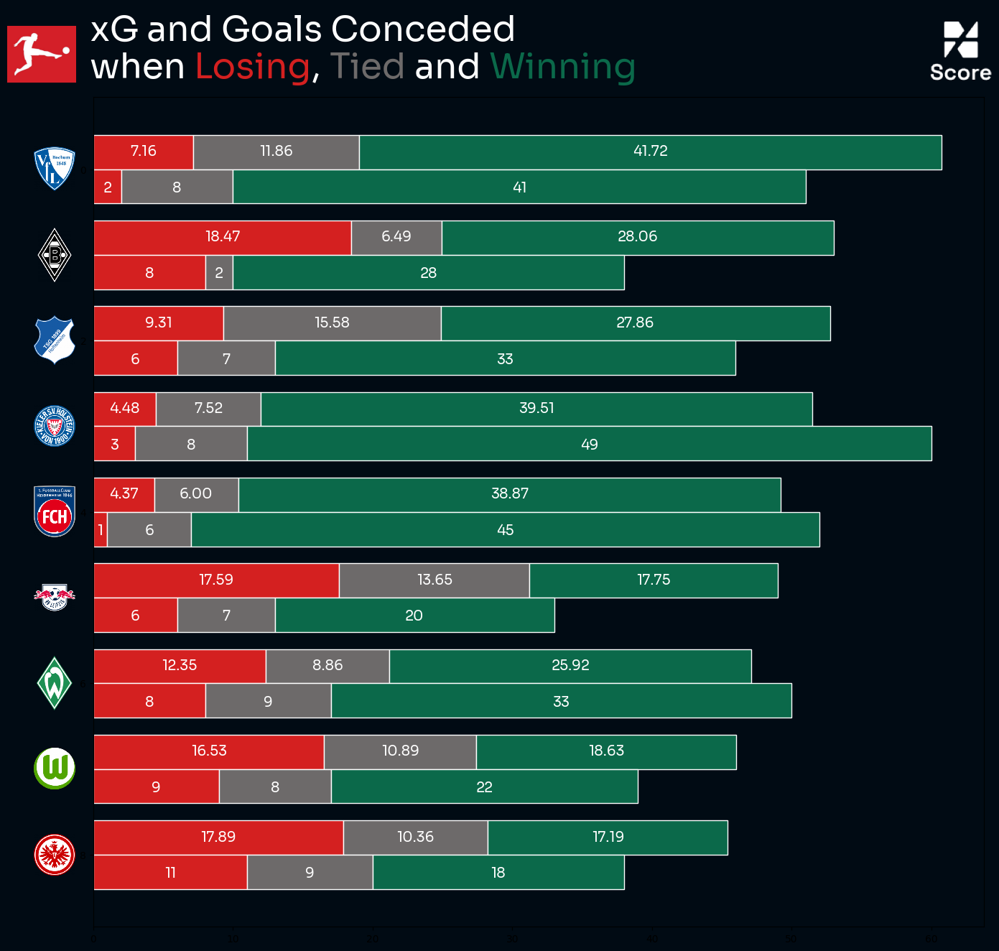

In [84]:
df_top10 = df[:9]

# Set up figure and axes
fig, ax = plt.subplots(figsize=(16, 15),facecolor=background)
#background = "#010b14"
text_color = 'white'
ax.set_facecolor(background)

# Number of teams
num_teams = len(df_top10)
y_positions = np.arange(num_teams)
bar_height = 0.4  # Height of each stacked bar

# Stacked Bars for xG
ax.barh(y_positions - bar_height / 2, df_top10["xg_conceded_losing"], height=bar_height, color="#d42020",edgecolor='white', label="xG (Losing)")
ax.barh(y_positions - bar_height / 2, df_top10["xg_conceded_drawing"], height=bar_height, color="#6d6a6a",edgecolor='white', left=df_top10["xg_conceded_losing"], label="xG (Drawing)")
ax.barh(y_positions - bar_height / 2, df_top10["xg_conceded_winning"], height=bar_height, color="#0b694a", edgecolor='white',left=df_top10["xg_conceded_losing"] + df_top10["xg_conceded_drawing"], label="xG (Winning)")

# Stacked Bars for Goals
ax.barh(y_positions + bar_height / 2, df_top10["goals_conceded_losing"], height=bar_height, color="#d42020",edgecolor='white', label="Goals (Losing)")
ax.barh(y_positions + bar_height / 2, df_top10["goals_conceded_drawing"], height=bar_height, color="#6d6a6a",edgecolor='white', left=df_top10["goals_conceded_losing"], label="Goals (Drawing)")
ax.barh(y_positions + bar_height / 2, df_top10["goals_conceded_winning"], height=bar_height, color="#0b694a",edgecolor='white', left=df_top10["goals_conceded_losing"] + df_top10["goals_conceded_drawing"], label="Goals (Winning)")


# Add text labels for xG values
for i, team in enumerate(df_top10["team"]):
    # xG values
    ax.text(df_top10["xg_conceded_losing"].iloc[i] / 2, y_positions[i] - bar_height / 2.5, 
            f'{df_top10["xg_conceded_losing"].iloc[i]:.2f}', color='white', ha='center',fontproperties=font_prop, fontsize=14)
    
    ax.text(df_top10["xg_conceded_losing"].iloc[i] + df_top10["xg_conceded_drawing"].iloc[i] / 2, y_positions[i] - bar_height / 2.5, 
            f'{df_top10["xg_conceded_drawing"].iloc[i]:.2f}', color='white', ha='center',fontproperties=font_prop, fontsize=14)
    
    ax.text(df_top10["xg_conceded_losing"].iloc[i] + df_top10["xg_conceded_drawing"].iloc[i] + df_top10["xg_conceded_winning"].iloc[i] / 2, 
            y_positions[i] - bar_height / 2.5, f'{df_top10["xg_conceded_winning"].iloc[i]:.2f}', color='white', ha='center',fontproperties=font_prop, fontsize=14)
    
    # Goal values
    ax.text(df_top10["goals_conceded_losing"].iloc[i] / 2, y_positions[i] + bar_height / 1.5, 
            f'{df_top10["goals_conceded_losing"].iloc[i]}', color='white', ha='center',fontproperties=font_prop, fontsize=14)
    
    ax.text(df_top10["goals_conceded_losing"].iloc[i] + df_top10["goals_conceded_drawing"].iloc[i] / 2, y_positions[i] + bar_height / 1.5, 
            f'{df_top10["goals_conceded_drawing"].iloc[i]}', color='white', ha='center',fontproperties=font_prop, fontsize=14)
    
    ax.text(df_top10["goals_conceded_losing"].iloc[i] + df_top10["goals_conceded_drawing"].iloc[i] + df_top10["goals_conceded_winning"].iloc[i] / 2, 
            y_positions[i] + bar_height / 1.5, f'{df_top10["goals_conceded_winning"].iloc[i]}', color='white', ha='center',fontproperties=font_prop, fontsize=14)



for y, img_path in zip(y_positions, df_top10["image_url"]):
    if os.path.exists(img_path):  # Check if the image file exists
        img = mpimg.imread(img_path)  # Load the image
        imagebox = OffsetImage(img, zoom=0.3)  # Adjust zoom level
        ab = AnnotationBbox(imagebox, (0.8, y), frameon=False, xybox=(-50, 0), xycoords='data', boxcoords="offset points")
        ax.add_artist(ab)



logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Score Logos-20241022T100701Z-001/Score Logos/ScoreSquareWhite.png')

ax_image = add_image(
    logo, fig, left=0.85, bottom=0.89, width=0.06, height=0.06,aspect='equal'
)


league_logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/TeamLogos/Bundesliga.jpg')

ax_image = add_image(
    league_logo, fig, left=0.05, bottom=0.89, width=0.06, height=0.06,aspect='equal'
)
# Labels and Titles
#ax.set_yticks(y_positions)
#ax.set_yticklabels(df_top10["team"],fontproperties=font_prop, color='white', fontsize=20)
#ax.set_xlabel("xG and Goals per 90")
#ax.set_title("xG vs Goals in Different Game States", fontweight="bold",fontproperties=font_prop, color='white', fontsize=30)


ax_text(-2.5, -1.2, '''
    xG and Goals Conceded 
    when <Losing>, <Tied> and <Winning>
    ''',
    color='white',fontproperties=font_prop,
    highlight_textprops=[{'color':'#d42020'}, {'color':'#6d6a6a'},{'color':'#0b694a'}], fontsize=35, ha='left', va='center', ax=ax)

# Grid and Legend
#ax.grid(axis="x", linestyle="--", alpha=0.7)
#ax.legend(loc="lower right", ncol=2)

ax.invert_yaxis()

plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/Bundesliga_Conceded_GameState_Top9.png',dpi=500,bbox_inches = 'tight',facecolor=background)


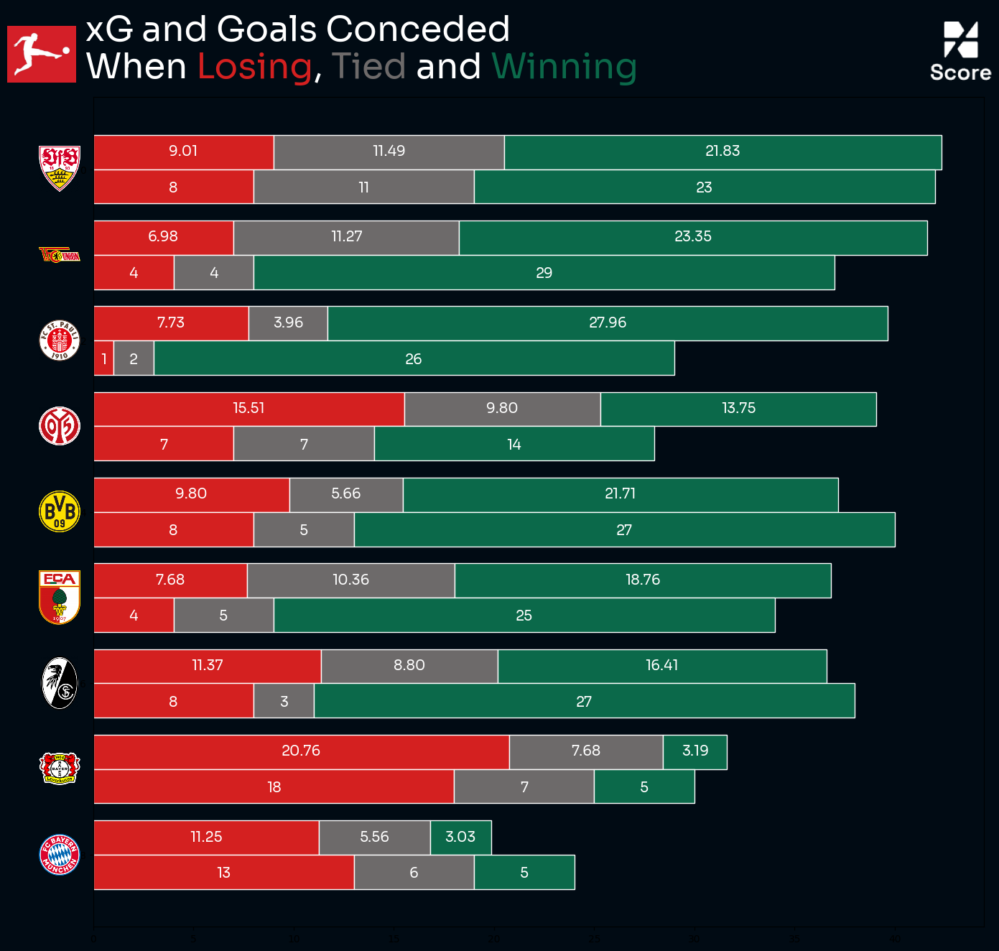

In [88]:
df_top10 = df[9:]

# Set up figure and axes
fig, ax = plt.subplots(figsize=(16, 15),facecolor=background)
background = "#010b14"
text_color = 'white'
ax.set_facecolor(background)

# Number of teams
num_teams = len(df_top10)
y_positions = np.arange(num_teams)
bar_height = 0.4  # Height of each stacked bar

# Stacked Bars for xG
ax.barh(y_positions - bar_height / 2, df_top10["xg_conceded_losing"], height=bar_height, color="#d42020",edgecolor='white', label="xG (Losing)")
ax.barh(y_positions - bar_height / 2, df_top10["xg_conceded_drawing"], height=bar_height, color="#6d6a6a",edgecolor='white', left=df_top10["xg_conceded_losing"], label="xG (Drawing)")
ax.barh(y_positions - bar_height / 2, df_top10["xg_conceded_winning"], height=bar_height, color="#0b694a", edgecolor='white',left=df_top10["xg_conceded_losing"] + df_top10["xg_conceded_drawing"], label="xG (Winning)")

# Stacked Bars for Goals
ax.barh(y_positions + bar_height / 2, df_top10["goals_conceded_losing"], height=bar_height, color="#d42020",edgecolor='white', label="Goals (Losing)")
ax.barh(y_positions + bar_height / 2, df_top10["goals_conceded_drawing"], height=bar_height, color="#6d6a6a",edgecolor='white', left=df_top10["goals_conceded_losing"], label="Goals (Drawing)")
ax.barh(y_positions + bar_height / 2, df_top10["goals_conceded_winning"], height=bar_height, color="#0b694a",edgecolor='white', left=df_top10["goals_conceded_losing"] + df_top10["goals_conceded_drawing"], label="Goals (Winning)")


# Add text labels for xG values
for i, team in enumerate(df_top10["team"]):
    # xG values
    ax.text(df_top10["xg_conceded_losing"].iloc[i] / 2, y_positions[i] - bar_height / 2.5, 
            f'{df_top10["xg_conceded_losing"].iloc[i]:.2f}', color='white', ha='center',fontproperties=font_prop, fontsize=14)
    
    ax.text(df_top10["xg_conceded_losing"].iloc[i] + df_top10["xg_conceded_drawing"].iloc[i] / 2, y_positions[i] - bar_height / 2.5, 
            f'{df_top10["xg_conceded_drawing"].iloc[i]:.2f}', color='white', ha='center',fontproperties=font_prop, fontsize=14)
    
    ax.text(df_top10["xg_conceded_losing"].iloc[i] + df_top10["xg_conceded_drawing"].iloc[i] + df_top10["xg_conceded_winning"].iloc[i] / 2, 
            y_positions[i] - bar_height / 2.5, f'{df_top10["xg_conceded_winning"].iloc[i]:.2f}', color='white', ha='center',fontproperties=font_prop, fontsize=14)
    
    # Goal values
    ax.text(df_top10["goals_conceded_losing"].iloc[i] / 2, y_positions[i] + bar_height / 1.5, 
            f'{df_top10["goals_conceded_losing"].iloc[i]}', color='white', ha='center',fontproperties=font_prop, fontsize=14)
    
    ax.text(df_top10["goals_conceded_losing"].iloc[i] + df_top10["goals_conceded_drawing"].iloc[i] / 2, y_positions[i] + bar_height / 1.5, 
            f'{df_top10["goals_conceded_drawing"].iloc[i]}', color='white', ha='center',fontproperties=font_prop, fontsize=14)
    
    ax.text(df_top10["goals_conceded_losing"].iloc[i] + df_top10["goals_conceded_drawing"].iloc[i] + df_top10["goals_conceded_winning"].iloc[i] / 2, 
            y_positions[i] + bar_height / 1.5, f'{df_top10["goals_conceded_winning"].iloc[i]}', color='white', ha='center',fontproperties=font_prop, fontsize=14)



for y, img_path in zip(y_positions, df_top10["image_url"]):
    if os.path.exists(img_path):  # Check if the image file exists
        img = mpimg.imread(img_path)  # Load the image
        imagebox = OffsetImage(img, zoom=0.3)  # Adjust zoom level
        ab = AnnotationBbox(imagebox, (0.8, y), frameon=False, xybox=(-50, 0), xycoords='data', boxcoords="offset points")
        ax.add_artist(ab)



logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Score Logos-20241022T100701Z-001/Score Logos/ScoreSquareWhite.png')

ax_image = add_image(
    logo, fig, left=0.85, bottom=0.89, width=0.06, height=0.06,aspect='equal'
)


league_logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/TeamLogos/Bundesliga.jpg')

ax_image = add_image(
    league_logo, fig, left=0.05, bottom=0.89, width=0.06, height=0.06,aspect='equal'
)
# Labels and Titles
#ax.set_yticks(y_positions)
#ax.set_yticklabels(df_top10["team"],fontproperties=font_prop, color='white', fontsize=20)
#ax.set_xlabel("xG and Goals per 90")
#ax.set_title("xG vs Goals in Different Game States", fontweight="bold",fontproperties=font_prop, color='white', fontsize=30)


ax_text(-2, -1.2, '''
    xG and Goals Conceded
    When <Losing>, <Tied> and <Winning>
    ''',
    color='white',fontproperties=font_prop,
    highlight_textprops=[{'color':'#d42020'}, {'color':'#6d6a6a'},{'color':'#0b694a'}], fontsize=35, ha='left', va='center', ax=ax)

# Grid and Legend
#ax.grid(axis="x", linestyle="--", alpha=0.7)
#ax.legend(loc="lower right", ncol=2)

ax.invert_yaxis()

plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/Bundesliga_Conceded_GameState_Bottom10.png',dpi=500,bbox_inches = 'tight',facecolor=background)


## Passing V Carrying

In [7]:
df = pd.read_csv('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Data/PassingVPossession/final_stats_Ligue-1-Stats.csv')

In [8]:
df.head()

,player,team_x,url_x,pass_metric,id_x,headshot_url,team_y,url_y,carry_metric,id_y
0,Takumi Minamino,MO,/en/players/f833a830/Takumi-Minamino,3.47,f833a830,https://fbref.com/req/202302030/images/headsho...,MO,/en/players/f833a830/Takumi-Minamino,0.50,f833a830
1,Rayan Cherki,LY,/en/players/b34c63a5/Rayan-Cherki,3.14,b34c63a5,https://fbref.com/req/202302030/images/headsho...,LY,/en/players/b34c63a5/Rayan-Cherki,0.71,b34c63a5
2,Hamed Junior Traorè,AU,/en/players/570bb4b9/Hamed-Junior-Traore,2.89,570bb4b9,https://fbref.com/req/202302030/images/headsho...,AU,/en/players/570bb4b9/Hamed-Junior-Traore,1.16,570bb4b9
3,Aleksandr Golovin,MO,/en/players/3708e9fa/Aleksandr-Golovin,2.88,3708e9fa,https://fbref.com/req/202302030/images/headsho...,MO,/en/players/3708e9fa/Aleksandr-Golovin,0.40,3708e9fa
4,Yann Gboho,TO,/en/players/6be41a31/Yann-Gboho,2.68,6be41a31,https://fbref.com/req/202302030/images/headsho...,TO,/en/players/6be41a31/Yann-Gboho,2.73,6be41a31


In [9]:
df1 = df.drop_duplicates(subset=['player'])

Text(0.5, 1.07, 'Top Playmakers - LaLiga 2024/25')

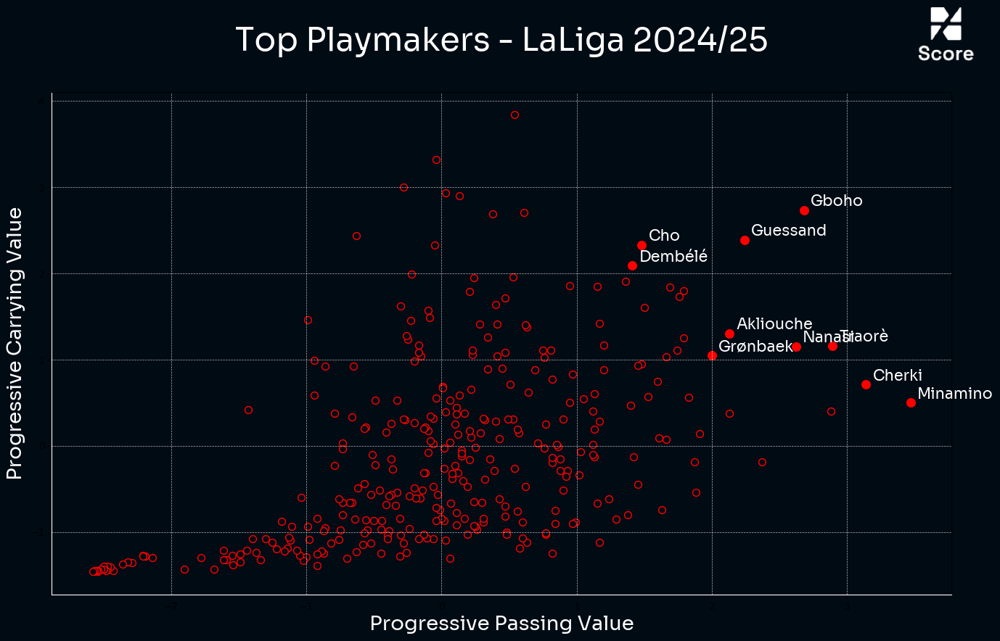

In [10]:
fig, ax = plt.subplots(figsize=(16,9))
fig.set_facecolor(background)
ax.set_facecolor(background)
ax.grid(color='white', linestyle='--', linewidth=0.5, alpha=0.7)

for index,row in df1.iterrows():
  if ((row['pass_metric'] >= 2.0) & (row['carry_metric'] >= 1.0)) or (row['pass_metric'] >= 1.0) & (row['carry_metric'] >= 2.0) or (row['pass_metric'] >= 3.0) or (row['carry_metric'] >= 4.0):
    ax.scatter(row['pass_metric'], row['carry_metric'],color='red',s=70)
    ax.annotate(row['player'].split(' ')[-1],xy = (row['pass_metric']+0.05,row['carry_metric']+0.05),fontproperties=font_prop,color='white',fontsize=15)
  else:
    ax.scatter(row['pass_metric'], row['carry_metric'],color=background,edgecolor='red',s=50)


logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Score Logos-20241022T100701Z-001/Score Logos/ScoreSquareWhite.png')

ax_image = add_image(
    logo, fig, left=0.85, bottom=0.92, width=0.09, height=0.09,aspect='equal'
)

#ax.tick_params(axis='x', colors='white')
#ax.tick_params(axis='y', colors='white')
#ax.spines['top'].set_color('white')
#ax.spines['right'].set_color('white')
ax.spines['bottom'].set_color('white')
ax.spines['left'].set_color('white')

ax.set_xlabel("Progressive Passing Value",fontproperties=font_prop,color='white',fontsize=20)
ax.set_ylabel("Progressive Carrying Value",fontproperties=font_prop,color='white',fontsize=20)
ax.set_title("Top Playmakers - LaLiga 2024/25",fontproperties=font_prop,color='white',fontsize=32,y=1.07)
#ax.suptitle("Players With 100+ Passes and Carries",fontsize=18,color='white')
#fig.text(0.5, 0, "Data from FBRef | Ishdeep Chahda | @indian_citizen", ha='center', fontsize=10,color='white')

#plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/Playmakers_LaLiga.png',dpi=500,bbox_inches = 'tight',facecolor=background)


## TreeMap for ShotType

In [204]:
query = """WITH PlayerGoals AS (
    -- Count total goals per player by shot type
    SELECT 
        player,
        "shotType",
        COUNT(*) AS goals
    FROM understat_shots_tb
    WHERE result = 'Goal' and season = 2024
    GROUP BY player, "shotType"
),

TopScorers AS (
    -- Identify the top 10 goal scorers
    SELECT 
        player,
        SUM(goals) AS total_goals
    FROM PlayerGoals
    GROUP BY player
    ORDER BY total_goals DESC
    LIMIT 9
),

GoalDistribution AS (
    -- Get goal distribution by shot type for top scorers
    SELECT 
        pg.player,
        pg."shotType",
        pg.goals
    FROM PlayerGoals pg
    JOIN TopScorers ts ON pg.player = ts.player
)

-- Pivot shot types into separate columns
SELECT 
    player,
    COALESCE(MAX(CASE WHEN "shotType" = 'RightFoot' THEN goals END), 0) AS right_foot_goals,
    COALESCE(MAX(CASE WHEN "shotType" = 'LeftFoot' THEN goals END), 0) AS left_foot_goals,
    COALESCE(MAX(CASE WHEN "shotType" = 'Head' THEN goals END), 0) AS head_goals,
    COALESCE(MAX(CASE WHEN "shotType" = 'OtherBodyPart' THEN goals END), 0) AS other_goals,
    SUM(goals) AS total_goals
FROM GoalDistribution
GROUP BY player
ORDER BY total_goals DESC;


"""

with engine.connect() as conn:
    df = pd.read_sql(query, conn)

In [152]:
df.columns

Index(['player', 'right_foot_goals', 'left_foot_goals', 'head_goals',
       'other_goals', 'total_goals'],
      dtype='object')

In [143]:
df.head()

,player,right_foot_goals,left_foot_goals,head_goals,other_goals,total_goals
0,Mohamed Salah,3,22,0,0,25.0
1,Mateo Retegui,8,8,5,0,21.0
2,Harry Kane,15,3,3,0,21.0
3,Erling Haaland,2,14,4,0,20.0
4,Robert Lewandowski,13,5,2,0,20.0


In [205]:
import pandas as pd
import matplotlib.pyplot as plt
import squarify
import matplotlib.cm as cm


In [206]:
df_long = df.melt(id_vars=["player", "total_goals"], 
                  value_vars=["right_foot_goals", "left_foot_goals", "head_goals", "other_goals"],
                  var_name="shot_type", value_name="goals")


In [207]:
df_long = df_long[df_long["goals"] > 0]


In [208]:
shot_type_map = {
    "right_foot_goals": "Right Foot",
    "left_foot_goals": "Left Foot",
    "head_goals": "Header",
    "other_goals": "Other"
}
df_long["shot_type"] = df_long["shot_type"].map(shot_type_map)


C:\Users\acer\AppData\Local\Temp\ipykernel_46908\2030691291.py:27: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\acer\AppData\Local\Temp\ipykernel_46908\2030691291.py:27: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\acer\AppData\Local\Temp\ipykernel_46908\2030691291.py:27: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\acer\AppData\Local\Temp\ipykernel_46908\2030691291.py:27: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matp

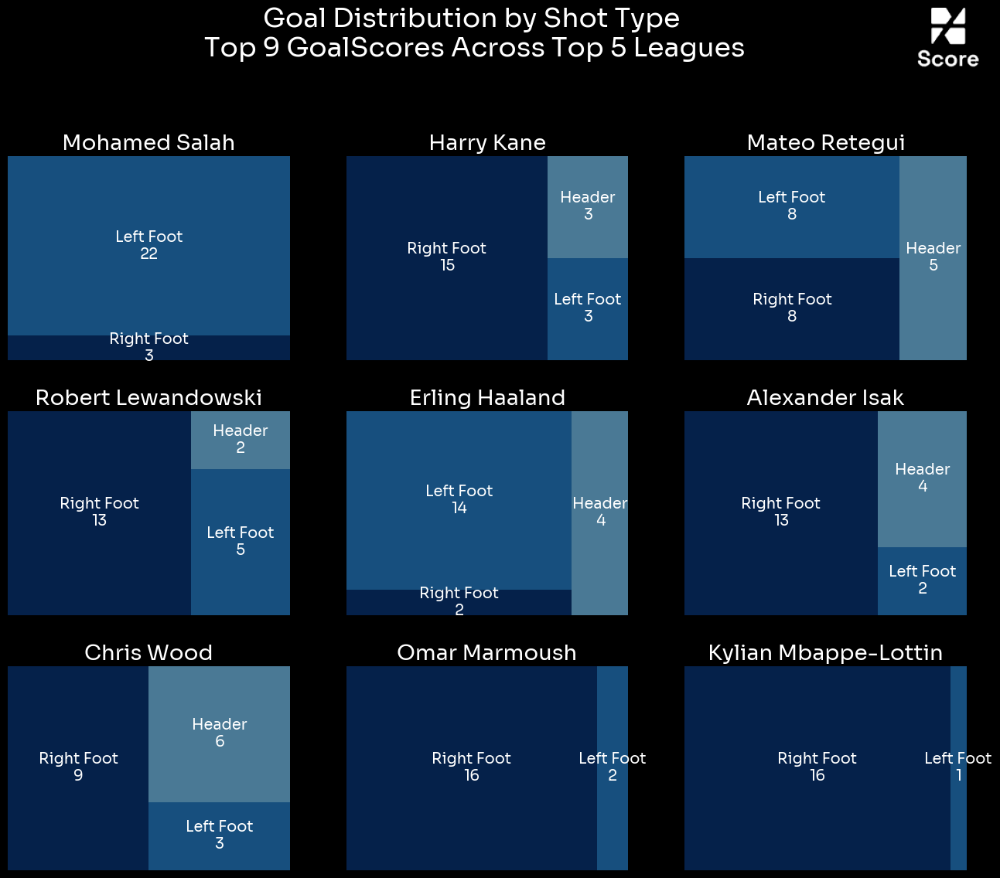

In [219]:
fig, axes = plt.subplots(3, 3, figsize=(16, 12))
axes = axes.flatten()  # Convert 2D array to 1D for easier looping
fig.set_facecolor(background)
# Unique players
players = df["player"].unique()

logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Score Logos-20241022T100701Z-001/Score Logos/ScoreSquareWhite.png')

ax_image = add_image(
    logo, fig, left=0.85, bottom=0.97, width=0.07, height=0.07,aspect='equal'
)

# Loop through each player and create a treemap
for i, player in enumerate(players):
    ax = axes[i]  # Select subplot
    
    # Filter player's data
    player_data = df_long[df_long["player"] == player]
    
    # If no goals exist for the player, skip the subplot
    if player_data.empty:
        ax.axis("off")
        continue
    
    # Treemap labels
    labels = player_data["shot_type"] + "\n" + player_data["goals"].astype(str)
    cmap = cm.get_cmap("Blues_r", 5)  # Get "Blues" colormap
    colors = [cmap(i) for i in range(num_colors)]  # Extract shades
    # Plot treemap
    squarify.plot(sizes=player_data["goals"], 
                  label=labels,
                  color=colors,
                  alpha=0.7, 
                  ax=ax)
    for text in ax.texts:  
        text.set_color("white")
        text.set_fontproperties(font_prop)
        text.set_fontsize(14)

    # Titles
    ax.set_title(player, fontproperties=font_prop,color='white', fontsize=20)
    ax.axis("off")

for j in range(len(players), 9):
    axes[j].axis("off")  # Hide empty subplots

plt.suptitle("Goal Distribution by Shot Type\n Top 9 GoalScores Across Top 5 Leagues", fontsize=25,y=1.04, fontproperties=font_prop,color='white')
plt.subplots_adjust(wspace=0.2, hspace=0.25)

plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/Top9Goal_ShotType.png',dpi=500,bbox_inches = 'tight',facecolor=background)


## Defensive Actions in Middle Third

In [300]:
df['x'] = df['x']*1.05
df['y'] = df['y']*0.68
df['endX'] = df['endX']*1.05
df['endY'] = df['endY']*0.68
df['goalMouthY'] = df['goalMouthY']*0.68

In [301]:
df['period'] = df['period'].replace({'FirstHalf': 1, 'SecondHalf': 2, 'FirstPeriodOfExtraTime': 3, 'SecondPeriodOfExtraTime': 4,
                                     'PenaltyShootout': 5, 'PostGame': 14, 'PreMatch': 16})
# new column for cumulative minutes, This part is taken from the "jakeyk11.github.io" github repository and modified for my use
def cumulative_match_mins(events_df):
    events_out = pd.DataFrame()
    # Add cumulative time to events data, resetting for each unique match
    match_events = events_df.copy()
    match_events['cumulative_mins'] = match_events['minute'] + (1/60) * match_events['second']
    # Add time increment to cumulative minutes based on period of game.
    for period in np.arange(1, match_events['period'].max() + 1, 1):
        if period > 1:
            t_delta = match_events[match_events['period'] == period - 1]['cumulative_mins'].max() - \
                                   match_events[match_events['period'] == period]['cumulative_mins'].min()
        elif period == 1 or period == 5:
            t_delta = 0
        else:
            t_delta = 0
        match_events.loc[match_events['period'] == period, 'cumulative_mins'] += t_delta
    # Rebuild events dataframe
    events_out = pd.concat([events_out, match_events])
    return events_out

df = cumulative_match_mins(df)

In [302]:
# New Column for Team Names and Oppositon TeamNames
df['teamName'] = df['teamId'].map(teams_dict)
team_names = list(teams_dict.values())

In [291]:
def find_defensive_actions(events_df):
    # Defensive Aerials
    aerials = events_df[events_df['type']=='Aerial']
    defensive_aerials = aerials[aerials['qualifiers'].apply(
    lambda x: isinstance(x, list) and any(isinstance(q, dict) and q.get('type', {}).get('value') == 285 for q in x))]

    # Define and filter defensive events
    defensive_actions = ['BallRecovery', 'BlockedPass', 'Clearance', 'Foul', 'Interception', 'Tackle',
                         'Claim', 'KeeperPickup', 'KeeperSweeper', 'Smother', 'Punch', 'Save']
    defensive_action_df = events_df[(events_df['type'].isin(defensive_actions)) & (events_df['outcomeType'] == 'Successful')]

    defensive_action_df = pd.concat([defensive_action_df,
                                     defensive_aerials], axis=0).sort_values(['matchId', 'cumulative_mins'])

    # Note challenges are never successful and represent when the opposition completes a take on
    return defensive_action_df

In [304]:
def group_player_events(events, player_data, group_type='count', agg_columns=None, col_names='Column Name'):
    # Specify agg_columns as list if not assigned
    if agg_columns is None:
        agg_columns = list()
    elif type(agg_columns) == str:
        agg_columns = [agg_columns]

    # Initialise output dataframe
    player_data_out = player_data.copy()

    # Perform aggregation based on grouping type input
    if group_type == 'count':
        grouped_events = events.groupby('playerId', axis=0).count()
        selected_events = grouped_events[agg_columns].copy()
        selected_events.loc[:, col_names] = grouped_events['match_id']
    elif group_type == 'sum':
        grouped_events = events.groupby('playerId', axis=0).sum(numeric_only=True)
        selected_events = grouped_events[agg_columns].copy()
    elif group_type == 'mean':
        grouped_events = events.groupby('playerId', axis=0).mean(numeric_only=True)
        selected_events = grouped_events[agg_columns].copy()
    else:
        selected_events = pd.DataFrame()

    # Merge into player information dataframe
    player_data_out = player_data_out.merge(selected_events, left_on='playerId', right_index=True, how='left')
    if type(col_names) == str:
        col_names = [col_names]
    if agg_columns != list() and group_type in ['sum', 'mean']:
        for idx in np.arange(len(agg_columns)):
            player_data_out = player_data_out.rename(columns={agg_columns[idx]: col_names[idx]})

    # Remove nulls and replace with 0
    player_data_out[col_names] = player_data_out[col_names].fillna(0)

    return player_data_out

In [293]:
 # Filter only pass events
def_df = find_defensive_actions(df)

middlethird = def_df[(def_df['x'] > 35) & (def_df['x'] < 70)]

# Count passes per player
def_counts = middlethird.groupby('playerName')['index'].count().reset_index()

In [294]:
def_counts.head()

,playerName,index
0,Aaron Cresswell,7
1,Aaron Ramsdale,1
2,Aaron Wan-Bissaka,126
3,Abdoulaye Doucoure,84
4,Abdukodir Khusanov,21


In [295]:
# Rename column for clarity
def_counts.rename(columns={'index': 'defensive_actions'}, inplace=True)

# Get the top 12 players
#top_12_players = def_counts.nlargest(12, 'defensive_actions')

In [ ]:
fig, ax = plt.subplots(figsize=(16, 9))
background = 'white'
fig.set_facecolor(background)
ax.set_facecolor(background)
mac_actions = middlethird[middlethird['playerName'] == 'Alexis Mac Allister']
cmap = LinearSegmentedColormap.from_list('custom_cmap', [background, 'purple'])  # White to team color

pitch = Pitch(pitch_type='uefa', corner_arcs=True, pitch_color=background, line_color='black', linewidth=2)
pitch.draw(ax=ax)

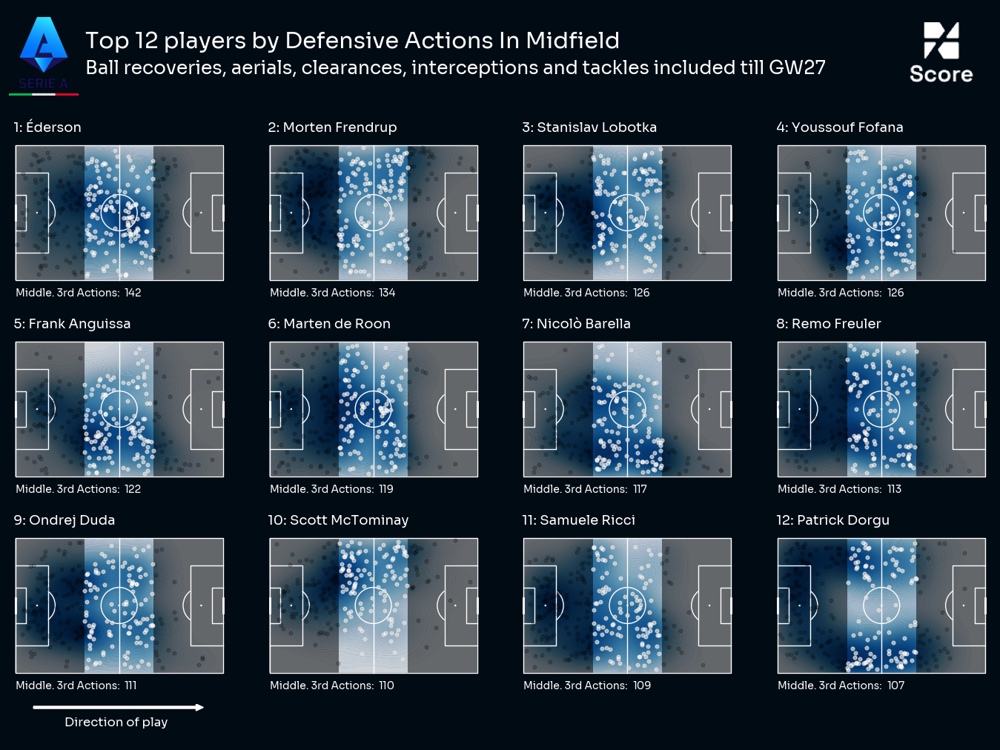

In [310]:
# Set-up pitch subplots
pitch = Pitch(pitch_color=background, pitch_type='uefa', line_color='white', linewidth=1, stripe=False)
fig, ax = pitch.grid(nrows=3, ncols=4, grid_height=0.75, space=0.12, axis=False)
fig.set_size_inches(14, 10)
fig.set_facecolor(background)
ax['pitch'] = ax['pitch'].reshape(-1)

# Plot successful prog passes as arrows, using for loop to iterate through each player and each pass
idx = 0

for _, row in top_12_players.iterrows():
    player_name = row['playerName']
    player_def_actions = def_df[def_df['playerName'] == player_name]
    player_opp_middle_def_actions = middlethird[middlethird['playerName'] == player_name]
    
    ax['pitch'][idx].set_title(f"  {idx + 1}: {player_name}", loc="left", color='w',fontproperties=font_prop, fontsize=13)

    # KDE plot for defensive actions
    pitch.kdeplot(player_def_actions['x'], player_def_actions['y'], ax=ax['pitch'][idx], fill=True, 
                  levels=80, thresh=0, cmap='Blues', cut=8, alpha=0.6, antialiased=True, zorder=0)  
    pitch.kdeplot(player_def_actions['x'], player_def_actions['y'], ax=ax['pitch'][idx], fill=True, 
                  levels=100, thresh=0, cmap='Blues', cut=8, alpha=0.6, antialiased=True, zorder=0)  

    # Shade the left (defensive) third
    ax['pitch'][idx].fill([0, 35, 35, 0], [0, 0, 68, 68], 'black', alpha=0.5, zorder=0)

    # Shade the right (attacking) third
    ax['pitch'][idx].fill([70, 105, 105, 70], [0, 0, 68, 68], 'black', alpha=0.5, zorder=0)


    # Scatter plot for defensive actions
    pitch.scatter(player_def_actions['x'], player_def_actions['y'], color='k', alpha=0.2, s=12, zorder=1, ax=ax['pitch'][idx])
    pitch.scatter(player_opp_middle_def_actions['x'], player_opp_middle_def_actions['y'], color='w', alpha=0.6, s=12, zorder=1, ax=ax['pitch'][idx])

    ax['pitch'][idx].text(0, -8, "Middle. 3rd Actions:",fontproperties=font_prop ,fontsize=10, fontweight='bold', color='w', zorder=1)
    ax['pitch'][idx].text(55, -8, f"{len(player_opp_middle_def_actions)}", fontproperties=font_prop,fontsize=10, color='w', zorder=1)

    idx += 1
    if idx >= 12:  # Prevents out-of-bounds error
        break


title_text = f"Top 12 players by Defensive Actions In Midfield"
subtitle_text = f"Ball recoveries, aerials, clearances, interceptions and tackles included till GW27"

# Title
fig.text(0.1, 0.945, title_text, fontweight="bold",fontproperties=font_prop, fontsize=22, color='w')
fig.text(0.1, 0.91, subtitle_text, fontweight="regular",fontproperties=font_prop, fontsize=18, color='w')

# Add direction of play arrow
ax = fig.add_axes([0.042, 0.05, 0.18, 0.01])
ax.axis("off")
plt.arrow(0.51, 0.15, 0.1, 0, color="white")
fig.text(0.13, 0.03, "Direction of play", ha="center",fontproperties=font_prop, fontsize=12, color="white", fontweight="regular")

logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Score Logos-20241022T100701Z-001/Score Logos/ScoreSquareWhite.png')

ax_image = add_image(
    logo, fig, left=0.88, bottom=0.89, width=0.09, height=0.09,aspect='equal'
)

league_logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/TeamLogos/serieA.png')

ax_image = add_image(
    league_logo, fig, left=0, bottom=0.88, width=0.12, height=0.12,aspect='equal'
)

plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/SerieA_Top12MidDefActions.png',dpi=500,bbox_inches = 'tight',facecolor=background)

## Where does Teams lose the possession of the ball

In [231]:
df['teamName'] = df['teamId'].map(teams_dict)
team_names = list(teams_dict.values())

In [232]:
df['x'] = df['x']*1.05
df['y'] = df['y']*0.68
df['endX'] = df['endX']*1.05
df['endY'] = df['endY']*0.68

In [233]:
conditions = [
    df['x'] < 35,  # Defensive Third
    (df['x'] >= 35) & (df['x'] < 70),  # Middle Third
    df['x'] >= 70  # Final Third
]

values = ['defensive_third', 'middle_third', 'final_third']
df['area_type'] = np.select(conditions, values, default='middle_third')

In [234]:
df_epl = df.copy()

In [235]:
turnover_counts = df_epl[df_epl['turnover'] == True].groupby(['teamName','area_type']).size().reset_index(name='count')
turnover_pivot = turnover_counts.pivot(index='teamName', columns='area_type', values='count').fillna(0)
turnover_pivot.reset_index(inplace=True)

In [236]:
# Calculate total turnovers per team
turnover_pivot['total_turnovers'] = (
    turnover_pivot[['defensive_third', 'middle_third', 'final_third']].sum(axis=1)
)

# Convert to percentage
turnover_pivot['defensive_third_pct'] = round((turnover_pivot['defensive_third'] / turnover_pivot['total_turnovers']) * 100,1)
turnover_pivot['middle_third_pct'] = round((turnover_pivot['middle_third'] / turnover_pivot['total_turnovers']) * 100,1)
turnover_pivot['final_third_pct'] = round((turnover_pivot['final_third'] / turnover_pivot['total_turnovers']) * 100,1)

turnover_pivot.drop(columns=['total_turnovers'], inplace=True)

In [237]:
turnover_pivot

area_type,teamName,defensive_third,final_third,middle_third,defensive_third_pct,middle_third_pct,final_third_pct
0,Arsenal,49,192,97,14.5,28.7,56.8
1,Aston Villa,58,169,141,15.8,38.3,45.9
2,Bournemouth,52,217,191,11.3,41.5,47.2
3,Brentford,67,174,122,18.5,33.6,47.9
4,Brighton,58,216,134,14.2,32.8,52.9
5,Chelsea,61,166,122,17.5,35.0,47.6
6,Crystal Palace,63,133,143,18.6,42.2,39.2
7,Everton,51,184,130,14.0,35.6,50.4
8,Fulham,63,153,132,18.1,37.9,44.0
9,Ipswich,70,158,162,17.9,41.5,40.5


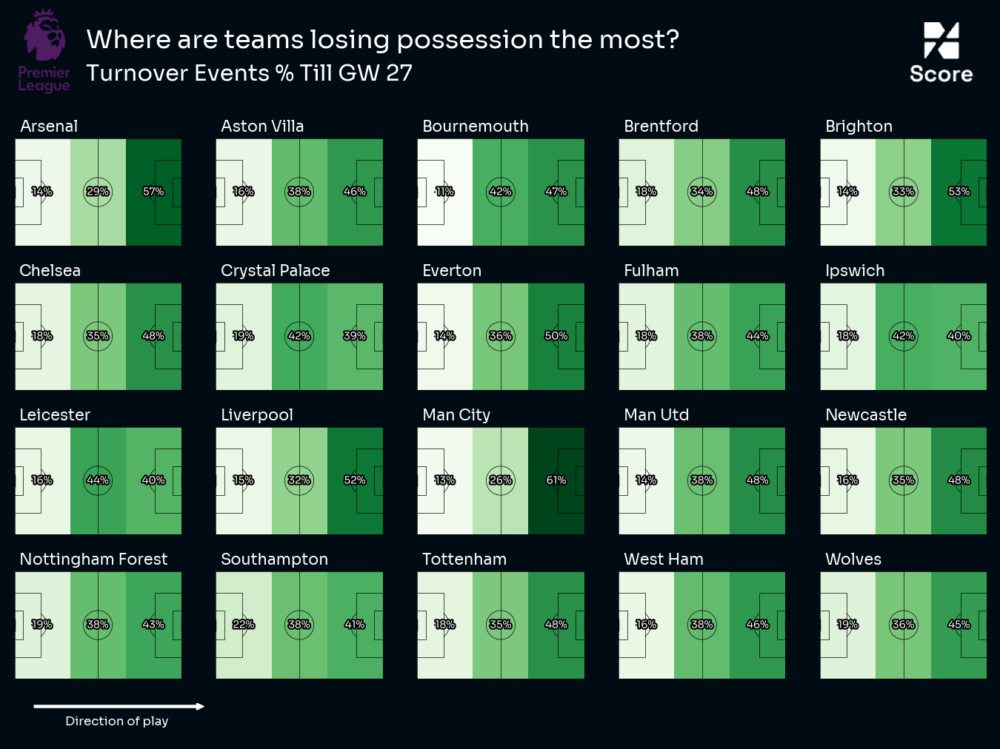

In [253]:
import matplotlib.patheffects as path_effects
path_eff = [path_effects.Stroke(linewidth=3, foreground='black'),
            path_effects.Normal()]
pitch = Pitch(pitch_color=background, pitch_type='uefa', line_color='black', linewidth=0.5,line_zorder=2, stripe=False)
fig, ax = pitch.grid(nrows=4, ncols=5, grid_height=0.75, space=0.12, axis=False)
fig.set_size_inches(14, 10)
fig.set_facecolor(background)
ax['pitch'] = ax['pitch'].reshape(-1)

bin_statistic = pitch.bin_statistic([0], [0], statistic='count', bins=(3, 1))
teams = turnover_pivot['teamName'].values

turover_cols = ['defensive_third_pct' , 'middle_third_pct','final_third_pct']

vmin = turnover_pivot[turover_cols].min().min()  # we normalise the heatmaps with the min / max values
vmax = turnover_pivot[turover_cols].max().max()

idx = 0
for i, ax in enumerate(ax['pitch'].flat[:len(teams)]):
    # the top of the pitch is zero
    # plot the title half way between zero and -20 (the top padding)
    ax.text(3, 75, teams[i],color='white',
            ha='left', va='center', fontsize=15,
            fontproperties=font_prop)

    # fill in the bin statistics from df and plot the heatmap
    bin_statistic['statistic'] = turnover_pivot.loc[turnover_pivot.teamName == teams[i], turover_cols].values
    heatmap = pitch.heatmap(bin_statistic, ax=ax, cmap='Greens', vmin=vmin, vmax=vmax)
    annotate = pitch.label_heatmap(bin_statistic, color='white', fontproperties=font_prop,
                                   path_effects=path_eff, fontsize=10, ax=ax,
                                   str_format='{0:.0f}%', ha='center', va='center')

    idx += 1
    if idx >= 20:  # Prevents out-of-bounds error
        break



# 🔹 Title
title_text = f"Where are teams losing possession the most?"
subtitle_text = f"Turnover Events % Till GW 27"

fig.text(0.1, 0.945, title_text, fontweight="bold",fontproperties=font_prop, fontsize=25, color='w')
fig.text(0.1, 0.9, subtitle_text, fontweight="regular",fontproperties=font_prop, fontsize=22, color='w')

# 🔹 Add direction of play arrow
ax = fig.add_axes([0.042, 0.05, 0.18, 0.01])
ax.axis("off")
plt.arrow(0.51, 0.15, 0.1, 0, color="white")
fig.text(0.13, 0.03, "Direction of play", ha="center",fontproperties=font_prop, fontsize=12, color="white", fontweight="regular") 

logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Score Logos-20241022T100701Z-001/Score Logos/ScoreSquareWhite.png')

ax_image = add_image(
    logo, fig, left=0.88, bottom=0.89, width=0.09, height=0.09,aspect='equal'
)

league_logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/TeamLogos/pl.png')

ax_image = add_image(
    league_logo, fig, left=0, bottom=0.88, width=0.12, height=0.12,aspect='equal'
)

plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/PL_Turovers.png',dpi=500,bbox_inches = 'tight',facecolor=background)


## Top 20 Players with most Shots

In [406]:
df['teamName'] = df['teamId'].map(teams_dict)
team_names = list(teams_dict.values())

In [407]:
# Filter only shot events
shot_types = ['MissedShots', 'Goal', 'SavedShot', 'ShotOnPost']
shots_df = df[df['type'].isin(shot_types)]

# Count shots per player
shot_counts = shots_df.groupby('playerName', as_index=False)['id'].count()

# Get the top 20 players by shot count
top_20_players = shot_counts.nlargest(15, 'id')

In [404]:
top_shots_df['playerName'].unique()

array(['Kylian Mbappé', 'Vinícius Júnior', 'Johan Bakayoko',
       'Jamal Musiala', 'Michael Olise', 'Harry Kane', 'Mohamed Salah',
       'Ousmane Dembélé', 'Serhou Guirassy', 'Erling Haaland',
       'Phil Foden', 'Lamine Yamal', 'Raphinha', 'Vangelis Pavlidis',
       'Ademola Lookman'], dtype=object)

In [403]:
shot_summary['playerName'].unique()

array(['Ademola Lookman', 'Erling Haaland', 'Harry Kane', 'Jamal Musiala',
       'Kylian Mbappé', 'Lamine Yamal', 'Michael Olise', 'Mohamed Salah',
       'Ousmane Dembélé', 'Phil Foden', 'Raphinha', 'Serhou Guirassy',
       'Vinícius Júnior'], dtype=object)

In [408]:
# Filter data for only top 20 players
top_20_players_list = top_20_players['playerName'].tolist()
top_shots_df = shots_df[shots_df['playerName'].isin(top_20_players_list)]

# Count different types of shots per player
shot_summary = top_shots_df.pivot_table(
    index=['playerName', 'teamName'],
    columns='type',
    values='id',
    aggfunc='count',
    fill_value=0
).reset_index()

# Add a "Total Shots" column (sum of all shot types)
shot_summary['Total Shots'] = shot_summary.iloc[:, 2:].sum(axis=1)

# Rename columns for clarity
shot_summary.columns.name = None  # Remove pivot column name
shot_summary = shot_summary.rename_axis(None, axis=1)  # Remove index name

# Sort shot_summary by "Total Shots" in descending order
shot_summary = shot_summary.sort_values(by='Total Shots', ascending=False)

# Reset index after sorting
shot_summary = shot_summary.reset_index(drop=True)

In [409]:
shot_summary

,playerName,teamName,Goal,MissedShots,SavedShot,ShotOnPost,Total Shots
0,Ousmane Dembélé,PSG,8,13,29,2,52
1,Kylian Mbappé,Real Madrid,8,10,29,0,47
2,Harry Kane,Bayern Munich,10,11,19,1,41
3,Erling Haaland,Man City,8,8,22,1,39
4,Raphinha,Barcelona,11,15,12,1,39
5,Michael Olise,Bayern Munich,5,11,19,0,35
6,Jamal Musiala,Bayern Munich,3,6,22,3,34
7,Lamine Yamal,Barcelona,3,8,22,0,33
8,Vinícius Júnior,Real Madrid,7,10,15,1,33
9,Serhou Guirassy,Borussia Dortmund,10,10,12,0,32


In [410]:
shot_summary.to_csv('Top_15_Players_By_Shots_UCL.csv')

## xG Comparison B/w 2 teams

In [424]:
query = """SELECT 
    season,
    team,
    ROUND(SUM("xG")::NUMERIC, 2) AS total_xG,
    COUNT(CASE WHEN result = 'Goal' THEN 1 END) AS total_goals
FROM (
    -- Home team data
    SELECT 
        season,
        h_team AS team,
        "xG",
        result
    FROM understat_shots_tb
    WHERE season BETWEEN 2015 AND 2024
      AND h_a = 'h'

    UNION ALL

    -- Away team data
    SELECT 
        season,
        a_team AS team,
        "xG",
        result
    FROM understat_shots_tb
    WHERE season BETWEEN 2015 AND 2024
      AND h_a = 'a'
) AS combined
WHERE team IN ('Manchester City', 'Manchester United')
GROUP BY season, team
ORDER BY season, team;
"""

with engine.connect() as conn:
    df = pd.read_sql(query, conn)

In [425]:
df

,season,team,total_xg,total_goals
0,2015,Manchester City,67.58,71
1,2015,Manchester United,45.83,46
2,2016,Manchester City,80.63,75
3,2016,Manchester United,58.67,54
4,2017,Manchester City,93.15,103
5,2017,Manchester United,61.02,67
6,2018,Manchester City,95.04,91
7,2018,Manchester United,70.40,65
8,2019,Manchester City,103.87,100
9,2019,Manchester United,66.35,64


In [426]:
values

[81, 59, 94, 46, 12, 54, 67, 50, 45, 67, 86, 98, 21, 81, 87]

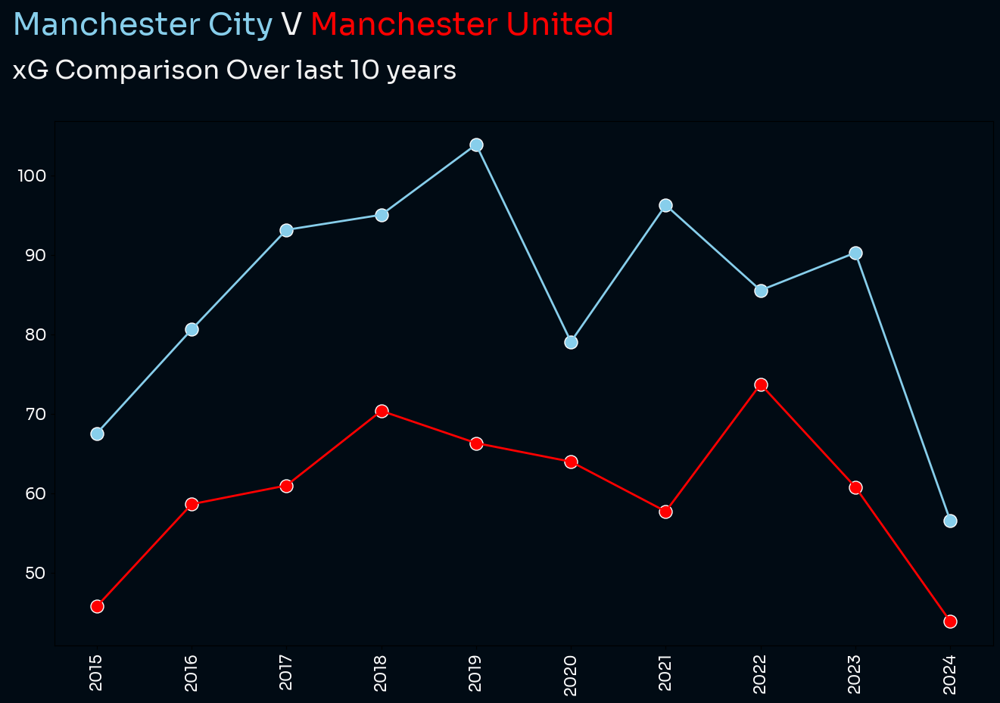

In [427]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define actual season years
season_years = list(range(2015, 2025))  # Seasons from 2014 to 2023

# Define colors for teams
team_colors = {
    "Manchester City": "skyblue",
    "Manchester United": "red"
}

# Create figure
fig, ax = plt.subplots(figsize=(16, 9),facecolor=background)
ax.set_facecolor(background)
# Plot each team separately
for team in df['team'].unique():
    team_df = df[df['team'] == team]
    team_df['goal_diff'] = team_df['total_goals'] - team_df['total_xg']
    plt.scatter(team_df['season'], team_df['total_xg'], color=team_colors[team], label=team, s=150, edgecolors='white')
    plt.plot(team_df['season'], team_df['total_xg'], color=team_colors[team], linewidth=2)
    # Annotate each point with goal difference
    for _, row in team_df.iterrows():
        diff_text = f"{row['goal_diff']:.1f}"  # Format with one decimal place
        text_color = "green" if row['goal_diff'] > 0 else "red"  # Green if positive, red if negative
        #plt.text(row['season'], row['total_xg'] + 2.5, diff_text,fontproperties=font_prop, fontsize=15, color='white', ha='center')

# Labels and title
#plt.xlabel("Season",fontproperties=font_prop,color='white', fontsize=25)
#plt.ylabel("xG",fontproperties=font_prop,color='white', fontsize=25)
plt.xticks(season_years, rotation=90,color='white',fontproperties=font_prop,size=15)  # Rotate x-axis labels
plt.yticks(color='white',fontproperties=font_prop,size=15)

# Grid for better readability
ax.grid(False)


TITLE = "<Manchester City> V <Manchester United>"
SUB_TITLE = "xG Comparison Over last 10 years"

# add title
fig_text(0.09, 1.04, TITLE, size=30, color="#F2F2F2",highlight_textprops=[{"color": 'skyblue'}, {"color": 'red'}], fontproperties=font_prop)
fig_text(0.09, 0.97, SUB_TITLE, size=25, color="#F2F2F2", fontproperties=font_prop)
plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/CityVUnited.png',dpi=500,bbox_inches = 'tight',facecolor=background)


In [287]:
query = """SELECT *
FROM understat_shots_tb
WHERE 
    (h_a = 'h' AND h_team = 'Real Madrid')
    OR
    (h_a = 'a' AND a_team = 'Real Madrid');
"""

with engine.connect() as conn:
    df_madrid = pd.read_sql(query, conn)

In [288]:
query = """SELECT *
FROM understat_shots_tb
WHERE 
    (h_a = 'h' AND h_team = 'Celta Vigo')
    OR
    (h_a = 'a' AND a_team = 'Celta Vigo');
"""

with engine.connect() as conn:
    df_celta = pd.read_sql(query, conn)

In [289]:
df_madrid['X'] = (df_madrid['X'] / 100) * 105 * 100
df_madrid['Y'] = (df_madrid['Y'] / 100) * 68 * 100

df_celta['X'] = (df_celta['X'] / 100) * 105 * 100
df_celta['Y'] = (df_celta['Y'] / 100) * 68 * 100

In [290]:
df_madrid.head()

,id,minute,result,X,Y,xG,player,h_a,player_id,situation,season,shotType,match_id,h_team,a_team,h_goals,a_goals,date,player_assisted,lastAction,league
0,585514,12,Goal,90.509997,42.567999,0.067690,Rodrygo,a,8015,OpenPlay,2024,RightFoot,26989,Mallorca,Real Madrid,1,1,2024-08-18 19:30:00,Vinícius Júnior,Pass,La_Liga
1,585515,17,SavedShot,93.659997,21.896001,0.091645,Rodrygo,a,8015,OpenPlay,2024,RightFoot,26989,Mallorca,Real Madrid,1,1,2024-08-18 19:30:00,Vinícius Júnior,Pass,La_Liga
2,585516,20,MissedShots,74.234997,29.307999,0.019744,Antonio Rüdiger,a,1822,OpenPlay,2024,RightFoot,26989,Mallorca,Real Madrid,1,1,2024-08-18 19:30:00,Rodrygo,Pass,La_Liga
3,585517,24,MissedShots,99.959997,39.167999,0.141936,Kylian Mbappe-Lottin,a,3423,OpenPlay,2024,RightFoot,26989,Mallorca,Real Madrid,1,1,2024-08-18 19:30:00,Vinícius Júnior,Pass,La_Liga
4,585521,46,BlockedShot,75.390003,24.887999,0.019536,Eder Militão,a,7829,OpenPlay,2024,RightFoot,26989,Mallorca,Real Madrid,1,1,2024-08-18 19:30:00,Vinícius Júnior,Pass,La_Liga


In [291]:
def xg_distribution_penalty_box(df):
    # Filter shots inside penalty box (X >= 88.5 and 13.6 <= Y <= 54.4)
    df_penalty = df[(df['X'] >= 88.5) & (df['Y'] >= 13.6) & (df['Y'] <= 54.4)]
    
    # Width of penalty box
    box_width = 54.4 - 13.6
    y_zone_size = box_width / 3
    
    # Define zones within the penalty box
    def assign_zone(y):
        if y < 13.6 + y_zone_size:
            return 'Left'
        elif y < 13.6 + 2 * y_zone_size:
            return 'Center'
        else:
            return 'Right'
    
    # Assign zones
    df_penalty['zone'] = df_penalty['Y'].apply(assign_zone)
    
    # Total xG inside penalty box
    total_xg = df_penalty['xG'].sum()
    
    # Aggregate xG by zone
    xg_by_zone = df_penalty.groupby('zone')['xG'].sum().reset_index()
    
    # Calculate % of total xG
    xg_by_zone['xG_percent'] = (xg_by_zone['xG'] / total_xg) * 100
    
    return xg_by_zone

In [292]:
result = xg_distribution_penalty_box(df_madrid)
print(result)

     zone         xG  xG_percent
0  Center  50.372322   74.042764
1    Left   7.813083   11.484526
2   Right   9.845985   14.472710


In [293]:
result = xg_distribution_penalty_box(df_celta)
print(result)

     zone         xG  xG_percent
0  Center  34.646184   76.602801
1    Left   6.488316   14.345683
2   Right   4.093852    9.051516


## Final Third Entries

In [316]:
def final_third_entries_dist(df, team):
    # Filter passes
    df_ft_passes = df[
        (df['teamName'] == team) &
        (df['type'].isin(['Pass','Carry'])) &
        (df['endX'] > 70.13) &
        (~df['qualifiers'].str.contains('CornerTaken|Freekick', na=False)) &
        (df['outcomeType'] == 'Successful')
    ]
    
    pitch_width = 68
    y_zone_size = pitch_width / 3
    
    # Define zones
    def assign_zone(y):
        if y < y_zone_size:
            return 'Left'
        elif y < 2 * y_zone_size:
            return 'Center'
        else:
            return 'Right'
    
    # Assign zone
    df_ft_passes['zone'] = df_ft_passes['endY'].apply(assign_zone)
    
    # Count passes per zone
    ft_passes_by_zone = df_ft_passes.groupby('zone').size().reset_index(name='count')
    
    total_ft_passes = ft_passes_by_zone['count'].sum()
    
    # Calculate % of total
    ft_passes_by_zone['ft_percent'] = (ft_passes_by_zone['count'] / total_ft_passes) * 100
    
    return ft_passes_by_zone

In [320]:
result_madrid = final_third_entries_dist(df, 'Real Madrid')

In [340]:
result_madrid

,zone,count,ft_percent
0,Center,1489,20.316551
1,Left,2534,34.574976
2,Right,3306,45.108473


In [357]:
result_celta = final_third_entries_dist(df, 'Celta Vigo')

In [364]:
import matplotlib.cm as cm
background = 'white'
def plot_final_third_zones(ft_passes_by_zone, background,team):
    fig, ax = plt.subplots(figsize=(16, 9))
    fig.set_facecolor(background)
    ax.set_facecolor(background)
    
    pitch = Pitch(pitch_type='uefa', half=True, pitch_color=background, line_color='black', linewidth=0.5,
                          corner_arcs=True)
    pitch.draw(ax=ax)
    
    x_min, x_max = 70.13, 105
    pitch_width = 68
    zone_heights = [0, pitch_width / 3, 2 * pitch_width / 3, pitch_width]
    cmap = cm.get_cmap('Oranges')

    fig.suptitle(f"{team}'s Final Third Entries", fontsize=20,fontproperties=font_prop, color='black', y=0.92)
    
    for i in range(3):
        y1, y2 = zone_heights[i], zone_heights[i+1]
        percent = ft_passes_by_zone.loc[i, 'ft_percent']
        color = cmap(percent / max(ft_passes_by_zone['ft_percent']))  # Or just pick a color
        
        ax.fill([x_min, x_max, x_max, x_min], [y1, y1, y2, y2], color=color, alpha=0.6, zorder=0)
        ax.text((x_min + x_max)/2, (y1 + y2)/2, f"{percent:.1f}%", color='black',fontproperties=font_prop,zorder=2,
                ha='center', va='center', weight='bold', fontsize=18)

    plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/MadridVCelta1.png',dpi=500,bbox_inches = 'tight',facecolor=background)



C:\Users\acer\AppData\Local\Temp\ipykernel_14272\3671689745.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('Oranges')


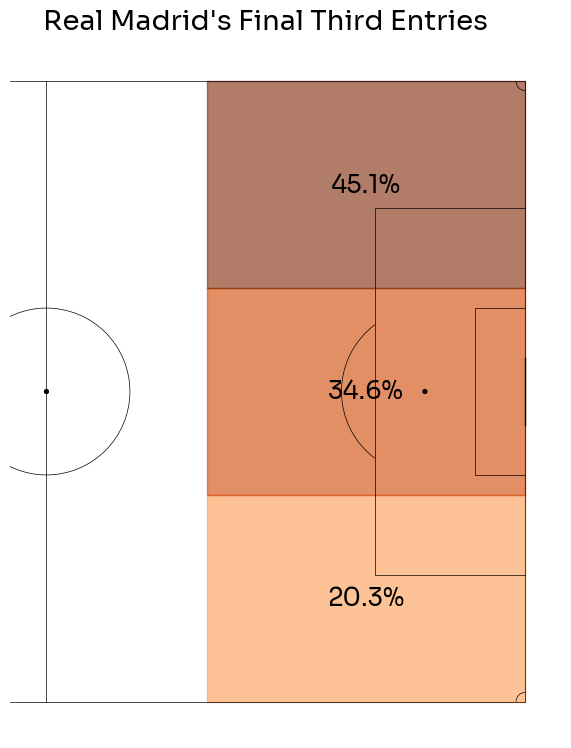

In [365]:
plot_final_third_zones(result_madrid, background, "Real Madrid")

## Where are teams finding their strikers?

In [88]:
df['position'].unique()

array(['Attacker', nan, 'Right Back', 'Left Wing', 'Centre Back',
       'Central Midfield', 'Attacking Midfield', 'Centre Forward',
       'Left Back', 'Defensive Midfield', 'Goalkeeper', 'Defender',
       'Midfielder', 'Right Wing', 'Left Midfield'], dtype=object)

In [89]:
df.loc[(df['playerName'] == 'Jorgen Strand Larsen') & (df['teamName'] == 'Wolves'), 'position'] = 'Centre Forward'
df.loc[(df['playerName'] == 'Darwin Nunez') & (df['teamName'] == 'Liverpool'), 'position'] = 'Centre Forward'
df.loc[(df['playerName'] == 'Liam Delap') & (df['teamName'] == 'Ipswich'), 'position'] = 'Centre Forward'
df.loc[(df['playerName'] == 'Mikel Merino') & (df['teamName'] == 'Arsenal'), 'position'] = 'Centre Forward'
df.loc[(df['playerName'] == 'Rasmus Hojlund') & (df['teamName'] == 'Man Utd'), 'position'] = 'Centre Forward'

In [90]:
# Arsenal , Ipswich , Wolves , Liverpool
strikers = df[df['position'] == 'Centre Forward'][['teamName','playerName','playerId']].drop_duplicates()

In [91]:
player_minutes = df.groupby(['playerName', 'teamName', 'matchId'])['maxMinute'].max().reset_index()

# Step 2: Sum total minutes played across all matches
total_minutes_played = player_minutes.groupby(['playerName', 'teamName'])['maxMinute'].sum().reset_index()
total_minutes_played.rename(columns={'maxMinute': 'TotalMinutesPlayed'}, inplace=True)

In [92]:
strikers = strikers.merge(total_minutes_played, left_on='playerName', right_on='playerName', how='left')

In [93]:
strikers = strikers[strikers['TotalMinutesPlayed'] > 1000]

In [94]:
strikers = strikers.reset_index()

In [97]:
strikers.shape

(20, 6)

In [96]:
rows_to_remove = [1,3,12,14,20,22,26,27]

# Use iloc to keep all other rows
strikers = strikers.drop(strikers.index[rows_to_remove])

In [98]:
strikers = strikers.drop(columns = ['index','teamName_y'])

In [99]:
def get_passes_df(df):
    df1 = df[~df['type'].str.contains('SubstitutionOn|FormationChange|FormationSet|Card')]
    df = df1
    df.loc[:, "receiver"] = df["playerId"].shift(-1)
    passes_ids = df.index[(df['type'] == 'Pass') & (df['outcomeType'] == 'Successful')]
    df_passes = df.loc[passes_ids, ["index", "x", "y", "endX", "endY", "teamName", "playerId", "receiver","qualifiers", "type", "outcomeType", "pass_or_carry_angle"]]

    return df_passes

In [100]:
df_passes = get_passes_df(df)

In [101]:
# Step 1: Get the playerIds of the strikers
striker_ids = strikers['playerId'].unique()

# Step 2: Filter df_passes where receiver is in striker_ids
passes_to_strikers = df_passes[
    (df_passes['receiver'].isin(striker_ids)) &
    (df_passes['playerId'] != df_passes['receiver'])
]

passes_to_strikers = passes_to_strikers.merge(
    strikers[['playerId', 'playerName', 'teamName_x']],
    left_on='receiver',
    right_on='playerId',
    how='left',
    suffixes=('', '_striker')
)

In [102]:
# Create a combined label for player and team
passes_to_strikers['player_team'] = passes_to_strikers['playerName'] + ' (' + passes_to_strikers['teamName_x'] + ')'

# Get pass counts
passes_to_strikers['player_team'].value_counts()

player_team
Alexander Isak (Newcastle)               488
Yoane Wissa (Brentford)                  442
Jean-Philippe Mateta (Crystal Palace)    404
Jorgen Strand Larsen (Wolves)            394
Mikel Merino (Arsenal)                   393
Nicolas Jackson (Chelsea)                385
Liam Delap (Ipswich)                     382
Erling Haaland (Man City)                375
Ollie Watkins (Aston Villa)              371
Chris Wood (Nottingham Forest)           353
Dominic Solanke (Tottenham)              319
Danny Welbeck (Brighton)                 310
Rasmus Hojlund (Man Utd)                 296
Paul Onuachu (Southampton)               272
Jamie Vardy (Leicester)                  267
Beto (Everton)                           258
Evanilson (Bournemouth)                  234
Darwin Nunez (Liverpool)                 204
Rodrigo Muniz (Fulham)                   182
Danny Ings (West Ham)                     74
Name: count, dtype: int64

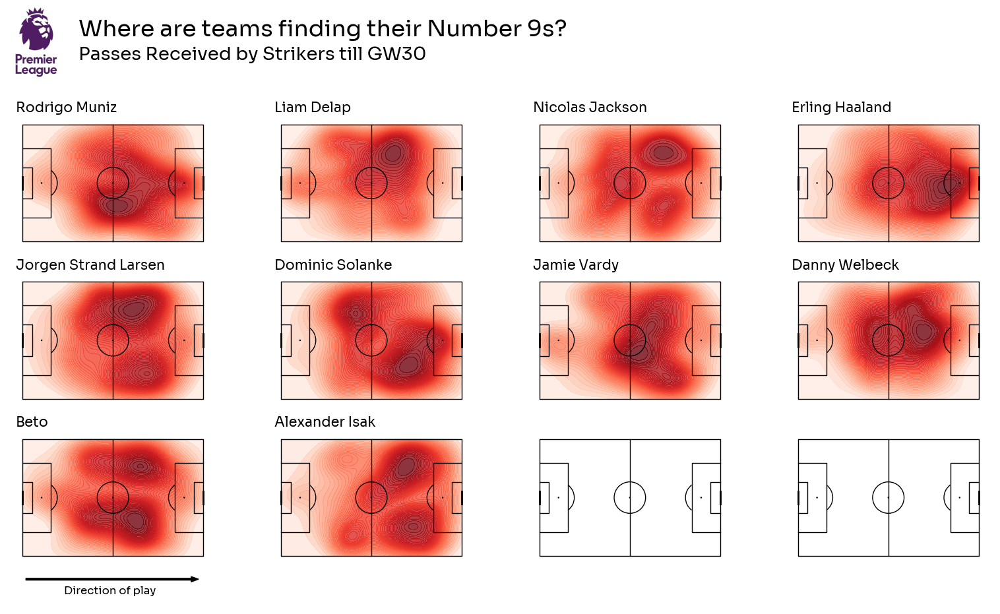

In [476]:
# Set-up pitch subplots
background = 'white'
pitch = Pitch(pitch_color=background, pitch_type='uefa', line_color='black', linewidth=1, stripe=False)
fig, ax = pitch.grid(nrows=3, ncols=4, grid_height=0.75, space=0.12, axis=False)
fig.set_size_inches(16, 9)
fig.set_facecolor(background)
ax['pitch'] = ax['pitch'].reshape(-1)

# Plot successful prog passes as arrows, using for loop to iterate through each player and each pass
idx = 0

for _, row in strikers[:10].iterrows():
    player_name = row['playerName']
    player_actions = passes_to_strikers[passes_to_strikers['playerName'] == player_name]
    
    ax['pitch'][idx].set_title(f"{player_name}", loc="left", color='black',fontproperties=font_prop, fontsize=15)

    # KDE plot for defensive actions
    pitch.kdeplot(player_actions['endX'], player_actions['endY'], ax=ax['pitch'][idx], fill=True, 
                  levels=50, thresh=0, cmap='Reds', cut=5, alpha=0.8, antialiased=False, zorder=0)

    idx += 1
    if idx >= 10:  # Prevents out-of-bounds error
        break


title_text = f"Where are teams finding their Number 9s?"
subtitle_text = f"Passes Received by Strikers till GW30"

# Title
fig.text(0.1, 0.97, title_text, fontweight="bold",fontproperties=font_prop, fontsize=25, color='black')
fig.text(0.1, 0.93, subtitle_text, fontweight="regular",fontproperties=font_prop, fontsize=20, color='black')

# Add direction of play arrow
ax = fig.add_axes([0.042, 0.05, 0.18, 0.01])
ax.axis("off")
plt.arrow(0.51, 0.15, 0.1, 0, color="black")
fig.text(0.13, 0.03, "Direction of play", ha="center",fontproperties=font_prop, fontsize=12, color="black", fontweight="regular")

league_logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/TeamLogos/pl.png')

ax_image = add_image(
    league_logo, fig, left=0, bottom=0.9, width=0.12, height=0.12,aspect='equal'
)

plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/PL_PassesRec1.png',dpi=500,bbox_inches = 'tight',facecolor=background)

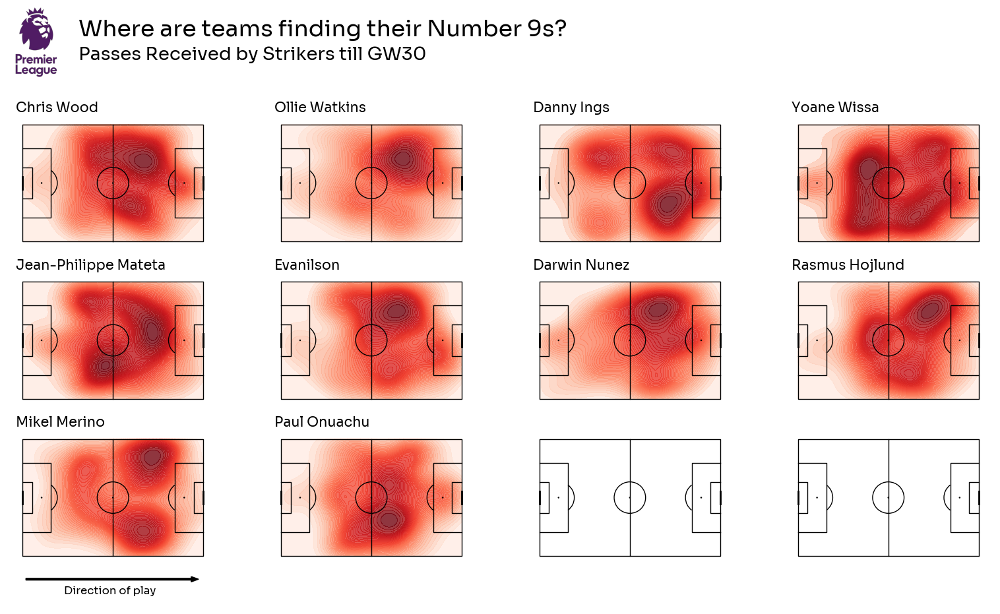

In [477]:
# Set-up pitch subplots
background = 'white'
pitch = Pitch(pitch_color=background, pitch_type='uefa', line_color='black', linewidth=1, stripe=False)
fig, ax = pitch.grid(nrows=3, ncols=4, grid_height=0.75, space=0.12, axis=False)
fig.set_size_inches(16, 9)
fig.set_facecolor(background)
ax['pitch'] = ax['pitch'].reshape(-1)

# Plot successful prog passes as arrows, using for loop to iterate through each player and each pass
idx = 0

for _, row in strikers[10:].iterrows():
    player_name = row['playerName']
    player_actions = passes_to_strikers[passes_to_strikers['playerName'] == player_name]
    
    ax['pitch'][idx].set_title(f"{player_name}", loc="left", color='black',fontproperties=font_prop, fontsize=15)

    # KDE plot for defensive actions
    pitch.kdeplot(player_actions['endX'], player_actions['endY'], ax=ax['pitch'][idx], fill=True, 
                  levels=50, thresh=0, cmap='Reds', cut=5, alpha=0.8, antialiased=False, zorder=0)

    idx += 1
    if idx >= 10:  # Prevents out-of-bounds error
        break


title_text = f"Where are teams finding their Number 9s?"
subtitle_text = f"Passes Received by Strikers till GW30"

# Title
fig.text(0.1, 0.97, title_text, fontweight="bold",fontproperties=font_prop, fontsize=25, color='black')
fig.text(0.1, 0.93, subtitle_text, fontweight="regular",fontproperties=font_prop, fontsize=20, color='black')

# Add direction of play arrow
ax = fig.add_axes([0.042, 0.05, 0.18, 0.01])
ax.axis("off")
plt.arrow(0.51, 0.15, 0.1, 0, color="black")
fig.text(0.13, 0.03, "Direction of play", ha="center",fontproperties=font_prop, fontsize=12, color="black", fontweight="regular")

league_logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/TeamLogos/pl.png')

ax_image = add_image(
    league_logo, fig, left=0, bottom=0.9, width=0.12, height=0.12,aspect='equal'
)

plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/PL_PassesRec2.png',dpi=500,bbox_inches = 'tight',facecolor=background)

## FullBack Analysis

In [132]:
merged_df['position'].unique()

array(['Defensive Midfield', nan, 'Right Back', 'Left Wing',
       'Centre Back', 'Goalkeeper', 'Central Midfield',
       'Attacking Midfield', 'Centre Forward', 'Attacker', 'Left Back',
       'Right Wing', 'Midfielder', 'Defender', 'Left Midfield',
       'Secondary Striker', 'Right Midfield'], dtype=object)

In [133]:
# Arsenal , Ipswich , Wolves , Liverpool
fullbacks = merged_df[merged_df['position'].isin(['Right Back','Left Back'])][['teamName','playerName','playerId']].drop_duplicates()

In [134]:
fullbacks.shape

(102, 3)

In [135]:
player_minutes = df.groupby(['playerName', 'teamName', 'matchId'])['maxMinute'].max().reset_index()

# Step 2: Sum total minutes played across all matches
total_minutes_played = player_minutes.groupby(['playerName', 'teamName'])['maxMinute'].sum().reset_index()
total_minutes_played.rename(columns={'maxMinute': 'TotalMinutesPlayed'}, inplace=True)

In [136]:
fullbacks = fullbacks.merge(total_minutes_played, left_on='playerName', right_on='playerName', how='left')

In [201]:
def find_defensive_actions(events_df):
    # Defensive Aerials
    aerials = events_df[events_df['type']=='Aerial']
    defensive_aerials = aerials[aerials['qualifiers'].apply(
    lambda x: isinstance(x, list) and any(isinstance(q, dict) and q.get('type', {}).get('value') == 285 for q in x))]

    # Define and filter defensive events
    defensive_actions = ['BallRecovery', 'BlockedPass', 'Clearance', 'Foul', 'Interception', 'Tackle',
                         'Claim', 'KeeperPickup', 'KeeperSweeper', 'Smother', 'Punch', 'Save']
    defensive_action_df = events_df[(events_df['type'].isin(defensive_actions)) & (events_df['outcomeType'] == 'Successful')]

    defensive_action_df = pd.concat([defensive_action_df,
                                     defensive_aerials], axis=0).sort_values(['matchId', 'cumulative_mins'])

    # Note challenges are never successful and represent when the opposition completes a take on
    return defensive_action_df

def find_offensive_actions(events_df):

    dfpass = events_df[(events_df['type'] == 'Pass') & (events_df['outcomeType'] == 'Successful')]

    through_pass = dfpass[(dfpass['qualifiers'].str.contains('Throughball'))]
    long_pass = dfpass[(dfpass['qualifiers'].str.contains('Longball'))]
    cross = dfpass[(dfpass['qualifiers'].str.contains('Cross'))]
    cross_acc = cross[cross['outcomeType']=='Successful']
    key_pass = dfpass[dfpass['qualifiers'].str.contains('KeyPass')]
    big_chnc = dfpass[dfpass['qualifiers'].str.contains('BigChanceCreated')]
    assist = dfpass[dfpass['qualifiers'].str.contains('IntentionalAssist')]
    fnl_thd = dfpass[(dfpass['endX']>=70) & (~dfpass['qualifiers'].str.contains('CornerTaken|Freekick'))]
    pen_box = dfpass[(dfpass['endX']>=88.5) & (dfpass['endY']>=13.6) & (dfpass['endY']<=54.4) &
                       (~dfpass['qualifiers'].str.contains('CornerTaken|Freekick'))]
    
    offensive_actions = ['Goal','TakeOn','SavedShot','MissedShots','GoodSkill','ShotOnPost']
    offensive_action_df = events_df[(events_df['type'].isin(offensive_actions)) & (events_df['outcomeType'] == 'Successful')]

    # Combine all offensive contributions
    offensive_combined = pd.concat([
        through_pass,
        long_pass,
        cross_acc,
        key_pass,
        big_chnc,
        assist,
        fnl_thd,
        pen_box,
        offensive_action_df
    ]).drop_duplicates()

    return offensive_combined
    
    

In [138]:
fullbacks_df = df[df['playerName'].isin(fullbacks['playerName'])]

In [139]:
fullbacks.columns

Index(['teamName_x', 'playerName', 'playerId', 'teamName_y',
       'TotalMinutesPlayed'],
      dtype='object')

In [155]:
def_df = find_defensive_actions(fullbacks_df)
# Count passes per player
def_counts = def_df.groupby('playerName')['index'].count().reset_index()
def_counts.rename(columns={'index': 'def_actions'}, inplace=True)

In [156]:
off_df = find_offensive_actions(fullbacks_df)
off_counts = off_df.groupby('playerName')['index'].count().reset_index()
off_counts.rename(columns={'index': 'off_actions'}, inplace=True)

In [157]:
print(def_counts['def_actions'].min() , def_counts['def_actions'].max() , off_counts['off_actions'].min() , off_counts['off_actions'].max())

3 458 1 1141


In [158]:
final_df = off_counts.merge(def_counts, left_on='playerName', right_on='playerName', how='left')

In [159]:
final_df = final_df.merge(fullbacks, left_on='playerName', right_on='playerName', how='left')

In [160]:
final_df = final_df.drop_duplicates(subset=['playerName'])

In [162]:
final_df.head()

,playerName,off_actions,def_actions,teamName_x,playerId,teamName_y,TotalMinutesPlayed
0,Aaron Cresswell,63,54,West Ham,68049.0,West Ham,1258
1,Aaron Wan-Bissaka,464,428,West Ham,331924.0,West Ham,2888
2,Achraf Hakimi,1141,428,PSG,320834.0,PSG,3250
3,Adam Marusic,257,180,Lazio,275698.0,Lazio,2752
4,Adam Smith,123,127,Bournemouth,69877.0,Bournemouth,1925


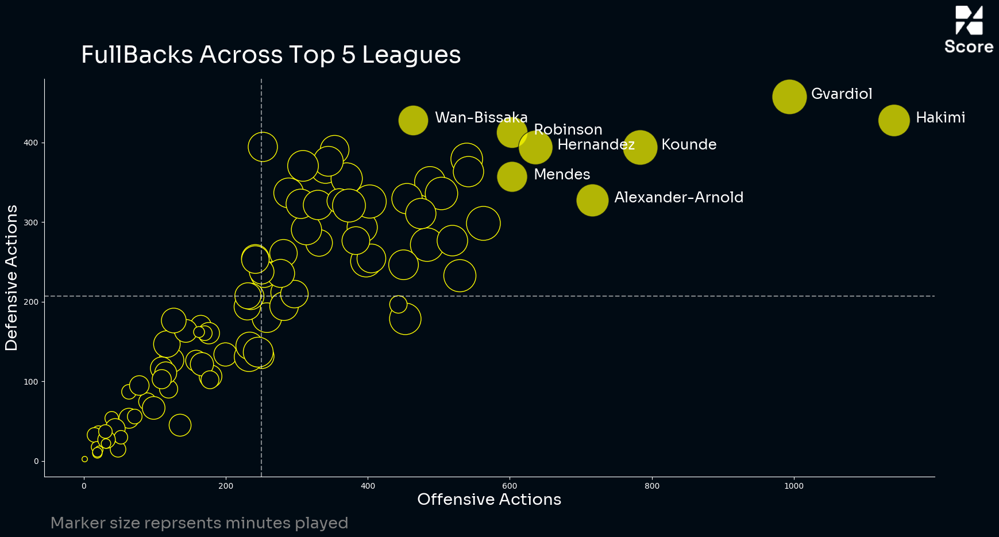

In [163]:
fig, ax = plt.subplots(figsize=(20,9))
fig.set_facecolor(background)
ax.set_facecolor(background)
ax.grid(color='white', linestyle='--', linewidth=0.5, alpha=0.7)

for index,row in final_df.iterrows():

  if ( ((row['off_actions'] >= 600)) or (row['def_actions'] >= 400)):
    ax.scatter(row['off_actions'], row['def_actions'],color='yellow',s=row['TotalMinutesPlayed'] * 0.5,edgecolor=background,zorder=1,alpha=0.7)
    ax.annotate(row['playerName'].split(' ')[1],xy = (row['off_actions']+30,row['def_actions']-3),fontproperties=font_prop,color='white',fontsize=18,zorder=2)
  else:
    ax.scatter(row['off_actions'], row['def_actions'],color=background,s=row['TotalMinutesPlayed'] * 0.5,edgecolor='yellow')


median_saves = final_df['off_actions'].median()
median_passes = final_df['def_actions'].median()
ax.axvline(median_saves, color='white', linestyle='--', lw=1.5,alpha=0.5,zorder=1)
ax.axhline(median_passes, color='white', linestyle='--', lw=1.5,alpha=0.5,zorder=1)

logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Score Logos-20241022T100701Z-001/Score Logos/ScoreSquareWhite.png')

ax_image = add_image(
    logo, fig, left=0.88, bottom=0.92, width=0.1, height=0.1,aspect='equal'
)

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')
ax.spines['top'].set_color(background)
ax.spines['right'].set_color(background)
ax.spines['bottom'].set_color('white')
ax.spines['left'].set_color('white')

ax.set_xlabel("Offensive Actions",fontproperties=font_prop,color='white',fontsize=20)
ax.set_ylabel("Defensive Actions",fontproperties=font_prop,color='white',fontsize=20)
ax.grid(False)
#ax.set_title("Top GoalKeepers - LaLiga 2024/25",fontproperties=font_prop,color='white',fontsize=32,y=1.07)
#ax.suptitle("Players With 100+ Passes and Carries",fontsize=18,color='white')
ax.text(-5, 500, "FullBacks Across Top 5 Leagues", fontproperties=font_prop,ha='left', fontsize=30,color='white')
#ax.text(0.8, 96, "Minimum 1000 minutes played | 2024/25", fontproperties=font_prop,ha='left', fontsize=20,color='white')

fig.text(0.13,0.01, "Marker size reprsents minutes played", fontproperties=font_prop,ha='left', fontsize=20,color='grey')


#ax.scatter(2, 99,edgecolor='yellow',s=500,color=background)
plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/FullbacksTop5.png',dpi=500,bbox_inches = 'tight',facecolor=background)


## CenterBacks

In [221]:
merged_df['position'].value_counts()

position
Centre Back           147078
Central Midfield      100545
Right Back             80243
Defensive Midfield     76025
Midfielder             61529
Defender               57651
Goalkeeper             57068
Left Back              49048
Right Wing             43243
Left Wing              42261
Centre Forward         40023
Attacker               37343
Attacking Midfield     32684
Left Midfield           7504
Right Midfield          3767
Secondary Striker       1549
Name: count, dtype: int64

In [228]:
# Arsenal , Ipswich , Wolves , Liverpool
centerbacks = merged_df[merged_df['position'].isin(['Centre Back','Defender'])][['teamName','playerName','playerId']].drop_duplicates()

player_minutes = df.groupby(['playerName', 'teamName', 'matchId'])['maxMinute'].max().reset_index()

# Step 2: Sum total minutes played across all matches
total_minutes_played = player_minutes.groupby(['playerName', 'teamName'])['maxMinute'].sum().reset_index()
total_minutes_played.rename(columns={'maxMinute': 'TotalMinutesPlayed'}, inplace=True)

centerbacks = centerbacks.merge(total_minutes_played, left_on='playerName', right_on='playerName', how='left')

In [229]:
centerbacks.head()

,teamName_x,playerName,playerId,teamName_y,TotalMinutesPlayed
0,Man Utd,Harry Maguire,99487.0,Man Utd,2213
1,Fulham,Calvin Bassey,396976.0,Fulham,3089
2,Fulham,Issa Diop,300359.0,Fulham,2030
3,Man Utd,Matthijs de Ligt,320374.0,Man Utd,2692
4,Liverpool,Virgil van Dijk,95408.0,Liverpool,3169


In [230]:
centerbacks_df = merged_df[merged_df['playerName'].isin(centerbacks['playerName'])]

def_df = find_defensive_actions(centerbacks_df)

# Count number of matches each player appeared in
matches_played = centerbacks_df.groupby('playerName')['matchId'].nunique().reset_index()
matches_played.rename(columns={'matchId': 'matches_played'}, inplace=True)

# Calculate total defensive actions
def_counts = def_df.groupby('playerName')['index'].count().reset_index()
def_counts.rename(columns={'index': 'def_actions'}, inplace=True)


off_df = find_offensive_actions(centerbacks_df)
# Calculate total offensive actions
off_counts = off_df.groupby('playerName')['index'].count().reset_index()
off_counts.rename(columns={'index': 'off_actions'}, inplace=True)

# Merge all into a single DataFrame
stats_df = def_counts.merge(off_counts, on='playerName', how='outer') \
                     .merge(matches_played, on='playerName', how='left')

# Calculate per match stats
stats_df['def_actions_per_match'] = round(stats_df['def_actions'] / stats_df['matches_played'],2)
stats_df['off_actions_per_match'] = round(stats_df['off_actions'] / stats_df['matches_played'],2)

In [258]:
print(stats_df['def_actions_per_match'].min(),stats_df['def_actions_per_match'].max(),stats_df['off_actions_per_match'].min(),stats_df['off_actions_per_match'].max())

0.67 15.85 0.5 19.35


In [232]:
stats_df = stats_df.merge(total_minutes_played, left_on='playerName', right_on='playerName', how='left')

In [233]:
stats_df = stats_df.drop_duplicates(subset=['playerName'])

In [265]:
stats_df[stats_df['playerName'] == 'Inigo Martinez']

,playerName,def_actions,off_actions,matches_played,def_actions_per_match,off_actions_per_match,teamName,TotalMinutesPlayed
52,Inigo Martinez,280,393.0,25,11.2,15.72,Barcelona,2381


In [256]:
stats_df[(stats_df['def_actions_per_match'] >= 14) & (stats_df['off_actions_per_match'] >= 10)]

,playerName,def_actions,off_actions,matches_played,def_actions_per_match,off_actions_per_match,teamName,TotalMinutesPlayed
33,Dean Huijsen,402,310.0,28,14.36,11.07,Bournemouth,2698
38,Emmanuel Agbadou,412,275.0,26,15.85,10.58,Reims,1331
67,Joachim Andersen,371,343.0,26,14.27,13.19,Crystal Palace,94
71,Joseph Okumu,265,219.0,18,14.72,12.17,Reims,1717
112,Nico Schlotterbeck,332,445.0,23,14.43,19.35,Borussia Dortmund,2187


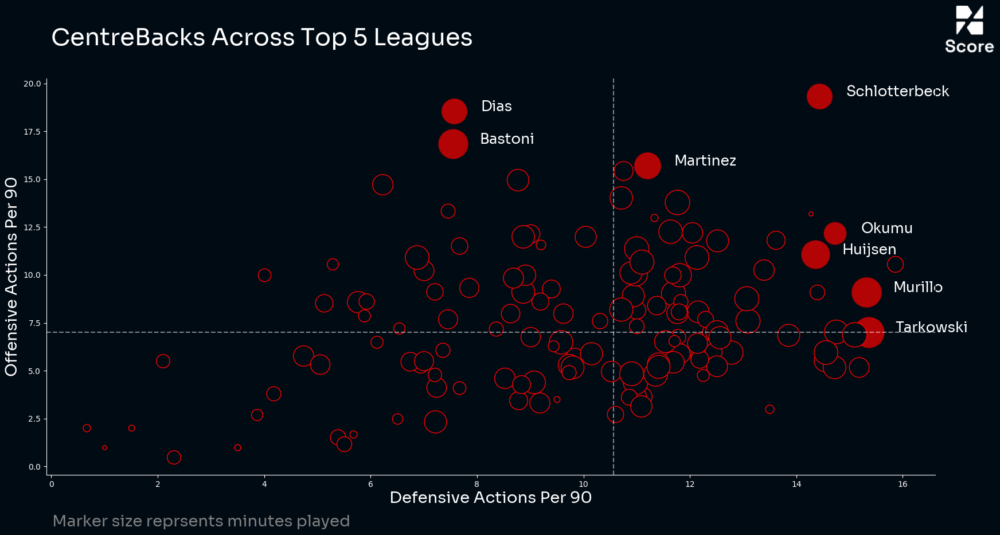

In [270]:
fig, ax = plt.subplots(figsize=(20,9))
fig.set_facecolor(background)
ax.set_facecolor(background)
ax.grid(color='white', linestyle='--', linewidth=0.5, alpha=0.7)

for index,row in stats_df.iterrows():

  if ( ((row['def_actions_per_match'] >= 14)) & (row['off_actions_per_match'] >= 10) & (row['TotalMinutesPlayed']>1500)):
    ax.scatter(row['def_actions_per_match'], row['off_actions_per_match'],color='red',s=row['TotalMinutesPlayed'] * 0.5,edgecolor=background,zorder=1,alpha=0.7)
    ax.annotate(row['playerName'].split()[-1],xy = (row['def_actions_per_match']+0.5,row['off_actions_per_match']),fontproperties=font_prop,color='white',fontsize=18,zorder=2)
  elif ((row['off_actions_per_match'] >= 15.7) & (row['TotalMinutesPlayed']>1000)):
    ax.scatter(row['def_actions_per_match'], row['off_actions_per_match'],color='red',s=row['TotalMinutesPlayed'] * 0.5,edgecolor=background,zorder=1,alpha=0.7)
    ax.annotate(row['playerName'].split()[-1],xy = (row['def_actions_per_match']+0.5,row['off_actions_per_match']),fontproperties=font_prop,color='white',fontsize=18,zorder=2)
  elif ((row['def_actions_per_match'] >= 15.3) & (row['TotalMinutesPlayed']>2000)):
    ax.scatter(row['def_actions_per_match'], row['off_actions_per_match'],color='red',s=row['TotalMinutesPlayed'] * 0.5,edgecolor=background,zorder=1,alpha=0.7)
    ax.annotate(row['playerName'].split()[-1],xy = (row['def_actions_per_match']+0.5,row['off_actions_per_match']),fontproperties=font_prop,color='white',fontsize=18,zorder=2)
  else:
    ax.scatter(row['def_actions_per_match'], row['off_actions_per_match'],color=background,s=row['TotalMinutesPlayed'] * 0.3,edgecolor='red')


median_saves = stats_df['def_actions_per_match'].median()
median_passes = stats_df['off_actions_per_match'].median()
ax.axvline(median_saves, color='white', linestyle='--', lw=1.5,alpha=0.5,zorder=1)
ax.axhline(median_passes, color='white', linestyle='--', lw=1.5,alpha=0.5,zorder=1)

logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Score Logos-20241022T100701Z-001/Score Logos/ScoreSquareWhite.png')

ax_image = add_image(
    logo, fig, left=0.88, bottom=0.92, width=0.1, height=0.1,aspect='equal'
)

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')
ax.spines['top'].set_color(background)
ax.spines['right'].set_color(background)
ax.spines['bottom'].set_color('white')
ax.spines['left'].set_color('white')

ax.set_xlabel("Defensive Actions Per 90",fontproperties=font_prop,color='white',fontsize=20)
ax.set_ylabel("Offensive Actions Per 90",fontproperties=font_prop,color='white',fontsize=20)
ax.grid(False)
#ax.set_title("Top GoalKeepers - LaLiga 2024/25",fontproperties=font_prop,color='white',fontsize=32,y=1.07)
#ax.suptitle("Players With 100+ Passes and Carries",fontsize=18,color='white')
ax.text(0, 22, "CentreBacks Across Top 5 Leagues", fontproperties=font_prop,ha='left', fontsize=30,color='white')
#ax.text(0.8, 96, "Minimum 1000 minutes played | 2024/25", fontproperties=font_prop,ha='left', fontsize=20,color='white')

fig.text(0.13,0.01, "Marker size reprsents minutes played", fontproperties=font_prop,ha='left', fontsize=20,color='grey')


#ax.scatter(2, 99,edgecolor='yellow',s=500,color=background)
plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/CenterBacksTop5.png',dpi=500,bbox_inches = 'tight',facecolor=background)


## UCL xG Performance

In [164]:
def scrape_shots(mi):
    headers = {
    'sec-ch-ua-platform': '"Windows"',
    'Referer': 'https://www.fotmob.com/matches/lyon-vs-rennes/36cxwz',
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/134.0.0.0 Safari/537.36',
    'x-mas': 'eyJib2R5Ijp7InVybCI6Ii9hcGkvbWF0Y2hEZXRhaWxzP21hdGNoSWQ9NDczNzU3MiIsImNvZGUiOjE3NDQ4ODk2NjIxNDIsImZvbyI6InByb2R1Y3Rpb246N2E3NjZlNjUxOTVjNDM3YzY1YmFhNDQzYzM0YzAzZDIwYTJhZjM1MC11bmRlZmluZWQifSwic2lnbmF0dXJlIjoiMjNFNUIyRDBFM0YwM0FBMDdCNkYxOEIyQTgzMzA3QjAifQ==',
    'sec-ch-ua': '"Chromium";v="134", "Not:A-Brand";v="24", "Google Chrome";v="134"',
    'sec-ch-ua-mobile': '?0',} # This headers changes regularly, so you need to get the new header everytime Fotmob change it.

    params = {
    'matchId': mi,
    'showNewUefaBracket': 'true'}

    response = requests.get('https://www.fotmob.com/api/matchDetails', params=params, headers=headers)
    data = response.json()
    shotmap = data['content']['shotmap']['shots']
    shots_df = pd.DataFrame(shotmap)
    shots_df['matchId'] = mi

    return shots_df

In [168]:
match_ids = [4737568,4737570,4737569,4737567,4737571,4737572,4737573,4737574]  

# Initialize an empty list to store individual DataFrames
all_shots_dfs = []

# Loop through each matchId, scrape the shots data, merge with team names, and append to the list
for fotmob_matchId in match_ids:
    #print(fotmob_matchId)
    try:
        shots_df = scrape_shots(fotmob_matchId)
        if shots_df is not None:
            # Append the DataFrame to the list
            all_shots_dfs.append(shots_df)
    except Exception as e:
        print(f'{fotmob_matchId} is not valid')

# Concatenate all DataFrames in the list into a single DataFrame
final_shots_df = pd.concat(all_shots_dfs, ignore_index=True)

In [170]:
final_shots_df.columns

Index(['id', 'eventType', 'teamId', 'playerId', 'playerName', 'x', 'y', 'min',
       'minAdded', 'isBlocked', 'isOnTarget', 'blockedX', 'blockedY',
       'goalCrossedY', 'goalCrossedZ', 'expectedGoals',
       'expectedGoalsOnTarget', 'shotType', 'situation', 'period', 'isOwnGoal',
       'onGoalShot', 'isSavedOffLine', 'isFromInsideBox', 'keeperId',
       'firstName', 'lastName', 'fullName', 'teamColor', 'shortName',
       'matchId'],
      dtype='object')

In [171]:
import pandas as pd

def get_top_xg_performance(df):
    # Step 1: Calculate goals scored per player
    goals_df = df[df['eventType'] == 'Goal'].groupby('playerName').size().reset_index(name='goals')

    # Step 2: Calculate total xG per player
    xg_df = df.groupby('playerName')['expectedGoals'].sum().reset_index(name='total_xG')

    # Step 3: Merge both
    performance_df = pd.merge(goals_df, xg_df, on='playerName', how='outer').fillna(0)

    # Step 4: Calculate overperformance
    performance_df['xG_diff'] = performance_df['goals'] - performance_df['total_xG']

    # Step 5: Sort for overperformers and underperformers
    top_overperformers = performance_df.sort_values(by='xG_diff', ascending=False).head(3)
    top_underperformers = performance_df.sort_values(by='xG_diff', ascending=True).head(3)

    return top_overperformers, top_underperformers


In [172]:
top_overperformers, top_underperformers = get_top_xg_performance(final_shots_df)

In [175]:
top_overperformers.to_csv('top_overperformers.csv')

In [176]:
top_underperformers.to_csv('top_underperformers.csv')

## Team Metric Comparison

In [478]:
def get_rank_by_metric_team(df, team,metric,third):
    if metric == 'Key Passes':
        # Filter key passes
        metric_df = df[ (df['type'] == 'Pass') & (df['qualifiers'].str.contains('KeyPass', na=False) & (df['outcomeType']=='Successful'))
        ]

    elif metric == 'Crosses':
        # Filter key passes
        metric_df = df[ (df['type'] == 'Pass') & (df['qualifiers'].str.contains('Cross', na=False) & (df['outcomeType']=='Successful'))
        ]

    elif metric == 'ProgPass':
        # Filter key passes
        metric_df = df[(df['prog_pass']>=9.11) & (df['x']>=35) & (~df['qualifiers'].str.contains('CornerTaken|Freekick'))]
        
        
    elif metric == 'TakeOn':
        if third == 2:
            metric_df = df[(df['type']=='TakeOn') & (df['x'] > 35) & (df['x'] < 70) & (df['outcomeType']=='Successful')]
        else:        
            metric_df = df[(df['type']=='TakeOn') & (df['outcomeType']=='Successful')]
        
    elif metric == 'BallRecovery':
        if third == 3:
            metric_df = df[(df['type'] == 'BallRecovery') & (df['x'] > 70.13) & (df['outcomeType']=='Successful')]
        if third == 2:
            metric_df = df[(df['type']=='BallRecovery') & (df['x'] > 35) & (df['x'] < 70) & (df['outcomeType']=='Successful')]
        elif third == None:
            metric_df = df[(df['type'] == 'BallRecovery') & (df['outcomeType']=='Successful')] 

    elif metric == 'Pass':
        if third == 3:
            metric_df = df[(df['type'] == 'Pass') & (df['endX']>70.13) & (df['outcomeType']=='Successful') &(~df['qualifiers'].str.contains('CornerTaken|Freekick'))]

    elif metric == 'Aerial':
        if third == 3:
            metric_df = df[(df['type'] == 'Aerial') & (df['endX']>70.13) & (df['outcomeType']=='Successful')]
        elif third == None:
            metric_df = df[(df['type'] == 'Aerial') & (df['outcomeType']=='Successful')]

    elif metric == 'Interception':
        if third == 3:
            metric_df = df[(df['type'] == 'Interception') & (df['endX']>70.13) & (df['outcomeType']=='Successful')]
        elif third == None:
            metric_df = df[(df['type'] == 'Interception') & (df['outcomeType']=='Successful')]
            
    elif metric == 'Shot':
        metric_df = df[(df['type'].isin(['Goal','SavedShot','MissedShots','ShotOnPost'])) & (df['outcomeType']=='Successful')]

    elif metric == 'Tackle':
        metric_df = df[(df['type'].isin(['Tackle'])) & (df['outcomeType']=='Successful')]

    elif metric == 'BallTouch':
        if third == 3:
            metric_df = df[(df['isTouch'] == True) & (df['x'] > 70.13) & (df['outcomeType']=='Successful')]
        elif third == 2:
            metric_df = df[(df['isTouch'] == True) & (df['x'] > 35) & (df['x'] < 70) & (df['outcomeType']=='Successful')]
        else:         
            metric_df = df[(df['isTouch'] == True) & (df['outcomeType']=='Successful')]

    elif metric == 'BigChance':
        metric_df = df[(df['qualifiers'].str.contains('BigChance')) & (df['outcomeType']=='Successful')]

    elif metric == 'ChanceCreated':
        metric_df = df[(df['passKey'] == True)]


    elif metric == 'IntentionalAssist':
        metric_df = df[(df['qualifiers'].str.contains('BigChanceCreated')) & (df['outcomeType']=='Successful')]

    elif metric == 'Assist':
        metric_df = df[(df['assist'] == True)]

    elif metric == 'Clearance':
        metric_df = df[
            (df['type'] == 'Clearance') & 
            (df['outcomeType'] == 'Successful')
        ]

    elif metric == 'BlockedPass':
        metric_df = df[
            (df['type'] == 'BlockedPass') & 
            (df['outcomeType'] == 'Successful')
        ]

    elif metric == 'DefensiveActions':
        defensive_actions = ['BallRecovery', 'BlockedPass', 'Clearance', 'Foul', 'Interception', 'Tackle',
                         'Claim', 'KeeperPickup', 'KeeperSweeper', 'Smother', 'Punch', 'Save','ShieldBallOpp']
        if third == 3:
            metric_df = df[(df['type'].isin(defensive_actions)) & (df['outcomeType']=='Successful') & (df['x'] > 70.13)]
        elif third == 2:
            metric_df = df[(df['type'].isin(defensive_actions)) & (df['outcomeType']=='Successful') & (df['x'] > 35) & (df['x'] < 70)]
        else:
            metric_df = df[(df['type'].isin(defensive_actions)) & (df['outcomeType']=='Successful')]

    elif metric == 'offsideProvoked':
        metric_df = df[
            (df['type'] == 'OffsideProvoked') & 
            (df['outcomeType'] == 'Successful')
        ]

    elif metric == 'offsideGiven':
        metric_df = df[
            (df['type'] == 'OffsideProvoked')
        ]
        
        

    # Count key passes per player
    team_df = metric_df.groupby('teamName').size().reset_index(name=metric)

    # Rank players based on key passes (higher count = better rank)
    team_df['rank'] = team_df[metric].rank(method='dense', ascending=False)

    # Find and return the rank of the specified player
    team_rank = team_df[team_df['teamName'] == team]

    return team_rank if not team_rank.empty else f"Team '{team}' not found"

def get_leaderboard_with_player(df, pname, metric, third):
    if metric == 'Key Passes':
        metric_df = df[
            (df['type'] == 'Pass') & 
            (df['qualifiers'].str.contains('KeyPass', na=False)) & 
            (df['outcomeType'] == 'Successful')
        ]

    elif metric == 'TakeOn':
        if third == 2:
            metric_df = df[
                (df['type'] == 'TakeOn') & 
                (df['x'] > 35) & (df['x'] < 70) & 
                (df['outcomeType'] == 'Successful')
            ]
        else:
            metric_df = df[
                (df['type'] == 'TakeOn') & 
                (df['outcomeType'] == 'Successful')
            ]

    elif metric == 'BallRecovery':
        if third == 3:
            metric_df = df[
                (df['type'] == 'BallRecovery') & 
                (df['x'] > 70.13) & 
                (df['outcomeType'] == 'Successful')
            ]
        elif third == 2:
            metric_df = df[(df['type']=='BallRecovery') & (df['x'] > 35) & (df['x'] < 70) & (df['outcomeType']=='Successful')]
        else:
            metric_df = df[
                (df['type'] == 'BallRecovery') & 
                (df['outcomeType'] == 'Successful')
            ]

    elif metric == 'Pass':
        if third == 3:
            metric_df = df[
                (df['type'] == 'Pass') & 
                (df['endX'] > 70.13) & 
                (df['outcomeType'] == 'Successful') & 
                (~df['qualifiers'].str.contains('CornerTaken|Freekick', na=False))
            ]
        else:
            metric_df = df[
                (df['type'] == 'Pass') & 
                (df['outcomeType'] == 'Successful') & 
                (~df['qualifiers'].str.contains('CornerTaken|Freekick', na=False))
            ]

    elif metric == 'Aerial':
        if third == 3:
            metric_df = df[
                (df['type'] == 'Aerial') & 
                (df['endX'] > 70.13) & 
                (df['outcomeType'] == 'Successful')
            ]
        else:
            metric_df = df[
                (df['type'] == 'Aerial') & 
                (df['outcomeType'] == 'Successful')
            ]

    elif metric == 'Interception':
        if third == 3:
            metric_df = df[
                (df['type'] == 'Interception') & 
                (df['endX'] > 70.13) & 
                (df['outcomeType'] == 'Successful')
            ]
        else:
            metric_df = df[
                (df['type'] == 'Interception') & 
                (df['outcomeType'] == 'Successful')
            ]

    elif metric == 'Shot':
        metric_df = df[
            df['type'].isin(['Goal', 'SavedShot', 'MissedShots', 'ShotOnPost']) & 
            (df['outcomeType'] == 'Successful')
        ]

    elif metric == 'Tackle':
        metric_df = df[
            (df['type'] == 'Tackle') & 
            (df['outcomeType'] == 'Successful')
        ]

    elif metric == 'Clearance':
        metric_df = df[
            (df['type'] == 'Clearance') & 
            (df['outcomeType'] == 'Successful')
        ]

    elif metric == 'BigChance':
        metric_df = df[(df['qualifiers'].str.contains('BigChance')) & (df['outcomeType']=='Successful')]

    elif metric == 'BallTouch':
        if third == 3:
            metric_df = df[(df['isTouch'] == True) & (df['x'] > 70.13) & (df['outcomeType']=='Successful')]
        elif third == 2:
            metric_df = df[(df['isTouch'] == True) & (df['x'] > 35) & (df['x'] < 70) & (df['outcomeType']=='Successful')]
        else:         
            metric_df = df[(df['isTouch'] == True) & (df['outcomeType']=='Successful')]

    elif metric == 'DefensiveActions':
        metric_df = df[(df['type'].isin(['Interception','Tackle','Aerial','BallRecovery','Challenge','BlockedPass','ShieldBallOpp'])) & (df['outcomeType']=='Successful')]

    # Group and rank players
    player_df = metric_df.groupby('playerName').size().reset_index(name=metric)
    player_df['rank'] = player_df[metric].rank(method='dense', ascending=False)

    # Get the rank of the specified player
    player_rank_row = player_df[player_df['playerName'] == pname]
    
    if player_rank_row.empty:
        return f"Player '{pname}' not found"

    player_rank = player_rank_row['rank'].values[0]

    # Get all players with a better rank OR same as the target player
    leaderboard_df = player_df[player_df['rank'] <= player_rank].sort_values(by='rank')

    # Optional: Highlight the target player (add a flag column)
    leaderboard_df['is_target_player'] = leaderboard_df['playerName'] == pname

    return leaderboard_df

def get_rank_by_metric(df, pname,metric,third):
    if metric == 'Key Passes':
        # Filter key passes
        metric_df = df[ (df['type'] == 'Pass') & (df['qualifiers'].str.contains('KeyPass', na=False) & (df['outcomeType']=='Successful'))
        ]

    elif metric == 'Crosses':
        # Filter key passes
        metric_df = df[ (df['type'] == 'Pass') & (df['qualifiers'].str.contains('Cross', na=False) & (df['outcomeType']=='Successful'))
        ]

    elif metric == 'ProgPass':
        # Filter key passes
        metric_df = df[(df['prog_pass']>=9.11) & (df['x']>=35) & (~df['qualifiers'].str.contains('CornerTaken|Freekick'))]
        
        
    elif metric == 'TakeOn':
        if third == 2:
            metric_df = df[(df['type']=='TakeOn') & (df['x'] > 35) & (df['x'] < 70) & (df['outcomeType']=='Successful')]
        else:        
            metric_df = df[(df['type']=='TakeOn') & (df['outcomeType']=='Successful')]
        
    elif metric == 'BallRecovery':
        if third == 3:
            metric_df = df[(df['type'] == 'BallRecovery') & (df['x'] > 70.13) & (df['outcomeType']=='Successful')]
        if third == 2:
            metric_df = df[(df['type']=='BallRecovery') & (df['x'] > 35) & (df['x'] < 70) & (df['outcomeType']=='Successful')]
        elif third == None:
            metric_df = df[(df['type'] == 'BallRecovery') & (df['outcomeType']=='Successful')] 

    elif metric == 'Pass':
        if third == 3:
            metric_df = df[(df['type'] == 'Pass') & (df['endX']>70.13) & (df['outcomeType']=='Successful') &(~df['qualifiers'].str.contains('CornerTaken|Freekick'))]

    elif metric == 'Aerial':
        if third == 3:
            metric_df = df[(df['type'] == 'Aerial') & (df['endX']>70.13) & (df['outcomeType']=='Successful')]
        elif third == None:
            metric_df = df[(df['type'] == 'Aerial') & (df['outcomeType']=='Successful')]

    elif metric == 'Interception':
        if third == 3:
            metric_df = df[(df['type'] == 'Interception') & (df['endX']>70.13) & (df['outcomeType']=='Successful')]
        elif third == None:
            metric_df = df[(df['type'] == 'Interception') & (df['outcomeType']=='Successful')]
            
    elif metric == 'Shot':
        metric_df = df[(df['type'].isin(['Goal','SavedShot','MissedShots','ShotOnPost'])) & (df['outcomeType']=='Successful')]

    elif metric == 'Tackle':
        metric_df = df[(df['type'].isin(['Tackle'])) & (df['outcomeType']=='Successful')]

    elif metric == 'BallTouch':
        if third == 3:
            metric_df = df[(df['isTouch'] == True) & (df['x'] > 70.13) & (df['outcomeType']=='Successful')]
        elif third == 2:
            metric_df = df[(df['isTouch'] == True) & (df['x'] > 35) & (df['x'] < 70) & (df['outcomeType']=='Successful')]
        else:         
            metric_df = df[(df['isTouch'] == True) & (df['outcomeType']=='Successful')]

    elif metric == 'BigChance':
        metric_df = df[(df['qualifiers'].str.contains('BigChance')) & (df['outcomeType']=='Successful')]

    elif metric == 'ChanceCreated':
        metric_df = df[(df['passKey'] == True)]


    elif metric == 'IntentionalAssist':
        metric_df = df[(df['qualifiers'].str.contains('BigChanceCreated')) & (df['outcomeType']=='Successful')]

    elif metric == 'Assist':
        metric_df = df[(df['assist'] == True)]

    elif metric == 'Clearance':
        metric_df = df[
            (df['type'] == 'Clearance') & 
            (df['outcomeType'] == 'Successful')
        ]

    elif metric == 'BlockedPass':
        metric_df = df[
            (df['type'] == 'BlockedPass') & 
            (df['outcomeType'] == 'Successful')
        ]

    elif metric == 'DefensiveActions':
        defensive_actions = ['BallRecovery', 'BlockedPass', 'Clearance', 'Foul', 'Interception', 'Tackle',
                         'Claim', 'KeeperPickup', 'KeeperSweeper', 'Smother', 'Punch', 'Save','ShieldBallOpp']
        metric_df = df[(df['type'].isin(defensive_actions)) & (df['outcomeType']=='Successful')]
        
        

    # Count key passes per player
    player_df = metric_df.groupby('playerName').size().reset_index(name=metric)

    # Rank players based on key passes (higher count = better rank)
    player_df['rank'] = player_df[metric].rank(method='dense', ascending=False)

    # Find and return the rank of the specified player
    player_rank = player_df[player_df['playerName'] == pname]

    return player_rank if not player_rank.empty else f"Player '{pname}' not found"

In [483]:
team = 'Real Madrid'
metric = 'offsideProvoked'
get_rank_by_metric_team(df, team,metric,None)

,teamName,offsideProvoked,rank
14,Real Madrid,39,16.0


### Arsenal Vs PSG

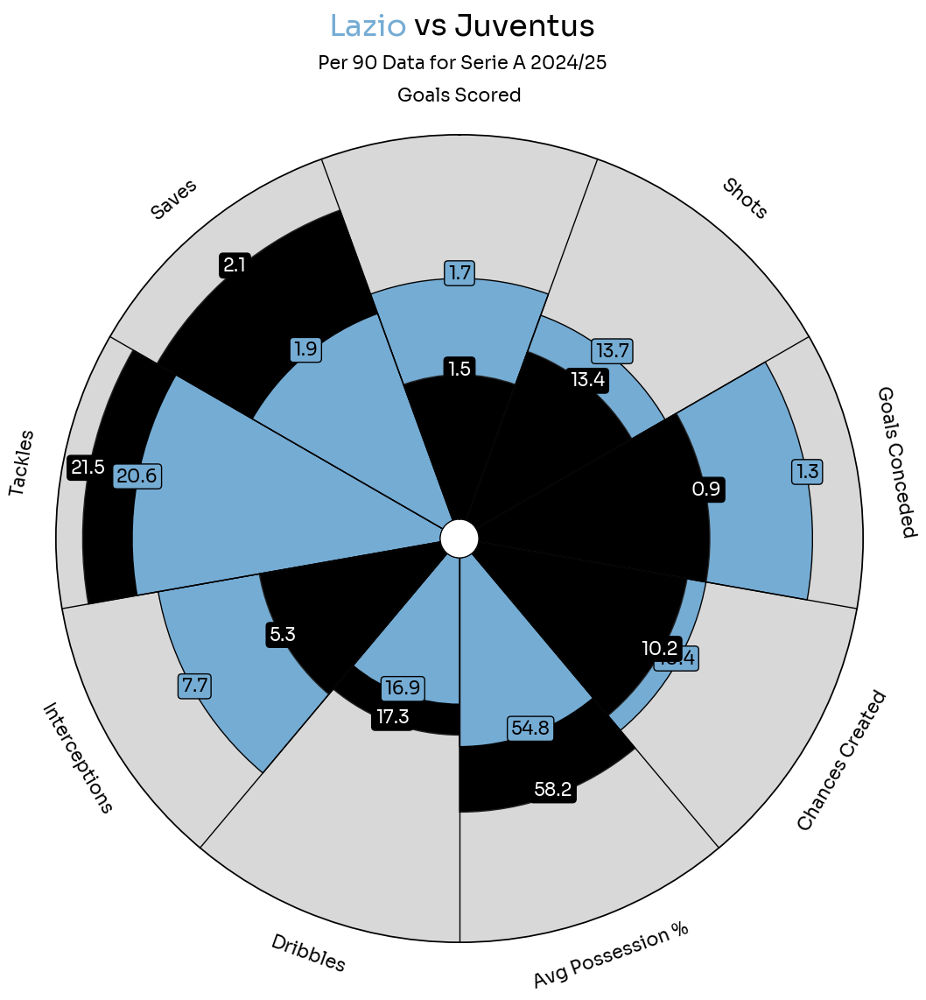

In [460]:
# Metrics and values
params = ['Goals Scored','Shots','Goals Conceded',
           'Chances Created','Avg Possession %','Dribbles',
           'Interceptions','Tackles','Saves']

lazio = [1.7, 13.7, 1.3, 10.4, 54.8, 16.9, 7.7, 20.6, 1.9]
juve = [1.5, 13.4, 0.9, 10.2, 58.2, 17.3, 5.3, 21.5, 2.1]

# minimum range value and maximum range value for parameters
min_range = [1.2, 12 , 0 , 8 , 45 , 15, 1, 15, 1.5]
max_range = [2, 15, 1.5, 12, 65, 20, 10, 22, 2.2]

# instantiate PyPizza class
baker = PyPizza(
    params=params,
    min_range=min_range,        # min range values
    max_range=max_range,        # max range values
    background_color="white", straight_line_color="#000000",
    last_circle_color="#000000", last_circle_lw=2.5, other_circle_lw=0,
    other_circle_color="#000000", straight_line_lw=1
)

# plot pizza
fig, ax = baker.make_pizza(
    lazio,                     # list of values
    compare_values=juve,    # passing comparison values
    figsize=(12, 12),             # adjust figsize according to your need
    color_blank_space=["grey","grey","grey","grey","grey","grey","grey","grey","grey"],   # use same color to fill blank space
    blank_alpha=0.3,            # alpha for blank-space colors
    param_location=110,         # where the parameters will be added
    kwargs_slices=dict(
        facecolor='#75acd4', edgecolor="#000000",
        zorder=1, linewidth=1
    ),                          # values to be used when plotting slices
    kwargs_compare=dict(
        facecolor="#000001", edgecolor="#222222", zorder=3, linewidth=1,
    ),                          # values to be used when plotting comparison slices
    kwargs_params=dict(
        color="black", fontsize=15, zorder=5,
        fontproperties=font_prop, va="center"
    ),                          # values to be used when adding parameter
    kwargs_values=dict(
        color="black", fontsize=15,
        fontproperties=font_prop, zorder=3,
        bbox=dict(
            edgecolor="#000000", facecolor="#75acd4",
            boxstyle="round,pad=0.2", lw=1
        )
    ),                           # values to be used when adding parameter-values
    kwargs_compare_values=dict(
        color="white", fontsize=15,
        fontproperties=font_prop, zorder=3,
        bbox=dict(
            edgecolor="#000000", facecolor="#000001",
            boxstyle="round,pad=0.2", lw=1
        )
    )
)

# add title
fig_text(
    0.515, 0.995, "<Lazio> vs <Juventus>",
    size=25, fig=fig,
    highlight_textprops=[{"color": '#75acd4'}, {"color": '#000001'}],
    ha="center", fontproperties=font_prop, color="black"
)

# add subtitle
fig.text(
    0.515, 0.942,
    "Per 90 Data for Serie A 2024/25",
    size=15,
    ha="center", fontproperties=font_prop, color="black"
)

plt.savefig('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/LazioJuve.png',dpi=500,bbox_inches = 'tight',facecolor='white')

## GK Analysis

In [406]:
# Define your list of matchIds (mi)
first_matchId = 4507639
last_matchId = 4508972
#match_ids = [first_matchId + i for i in range(26)] 
match_ids = [4621583,4621576,4621603,4621502,4621605,4621606,4621604,4621607,
            4737552,4737560,4737568,4737572,4737575]


# Initialize an empty list to store individual DataFrames
all_shots_dfs = []

# Loop through each matchId, scrape the shots data, merge with team names, and append to the list
for fotmob_matchId in match_ids:
    #print(fotmob_matchId)
    try:
        shots_df = scrape_shots(fotmob_matchId)
        if shots_df is not None:
            # Append the DataFrame to the list
            all_shots_dfs.append(shots_df)
    except Exception as e:
        print(f'{fotmob_matchId} is not valid')

# Concatenate all DataFrames in the list into a single DataFrame
t1_shots_df = pd.concat(all_shots_dfs, ignore_index=True)

C:\Users\acer\AppData\Local\Temp\ipykernel_14272\1262365469.py:24: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  t1_shots_df = pd.concat(all_shots_dfs, ignore_index=True)


In [407]:
# Define your list of matchIds (mi)
first_matchId = 4507639
last_matchId = 4508972
#match_ids = [first_matchId + i for i in range(26)] 
match_ids = [4621579,4621577,4621568,4621508,4621578,4621493,4621580,4723908,
            4723909,4737554,4737562,4737567,4737571]


# Initialize an empty list to store individual DataFrames
all_shots_dfs = []

# Loop through each matchId, scrape the shots data, merge with team names, and append to the list
for fotmob_matchId in match_ids:
    #print(fotmob_matchId)
    try:
        shots_df = scrape_shots(fotmob_matchId)
        if shots_df is not None:
            # Append the DataFrame to the list
            all_shots_dfs.append(shots_df)
    except Exception as e:
        print(f'{fotmob_matchId} is not valid')

# Concatenate all DataFrames in the list into a single DataFrame
t2_shots_df = pd.concat(all_shots_dfs, ignore_index=True)

In [509]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from mplsoccer import add_image
from matplotlib.patches import Rectangle

def plot_shot_map(ax, shots_df, team,teamcolor, pname, against, background,flag=True):
    ax.set_facecolor(background)
    ax.plot([29, 39], [0, 0], color='#c7d5cc', linewidth=1.5)
    ax.plot([30.3, 37.7], [2.5, 2.5], color='#c7d5cc', linewidth=3)
    ax.plot([37.7, 37.7], [0, 2.5], color='#c7d5cc', linewidth=3)
    ax.plot([30.3, 30.3], [0, 2.5], color='#c7d5cc', linewidth=3)
    
    ax.add_patch(Rectangle((30.3, 0), 7.4, 2.5, fill=False, edgecolor='#c7d5cc', hatch='+', alpha=0.3))
    ax.axis('off')

    shots_faced = shots_df
    
    # Filtering shots
    saved_mask = (shots_df.eventType == 'AttemptSaved') & (shots_df.isBlocked == False) & (shots_df.situation != 'Penalty') & (shots_df.expectedGoalsOnTarget > 0.0)
    x_vals = 68 - shots_df[saved_mask].goalCrossedY
    y_vals = shots_df[saved_mask].goalCrossedZ

    pen_saved_mask = (shots_df.eventType == 'AttemptSaved') & (shots_df.isBlocked == False) & (shots_df.situation == 'Penalty') & (shots_df.expectedGoalsOnTarget > 0.0)
    x_pensave_vals = 68 - shots_df[pen_saved_mask].goalCrossedY
    y_pensave_vals = shots_df[pen_saved_mask].goalCrossedZ

    goal_mask = (shots_df.eventType == 'Goal') & (shots_df.situation != 'Penalty') & (shots_df.expectedGoalsOnTarget > 0.0)
    x_goal_vals = 68 - shots_df[goal_mask].goalCrossedY
    y_goal_vals = shots_df[goal_mask].goalCrossedZ

    pen_mask = (shots_df.eventType == 'Goal') & (shots_df.situation == 'Penalty') & (shots_df.expectedGoalsOnTarget > 0.0)
    x_pen_vals = 68 - shots_df[pen_mask].goalCrossedY
    y_pen_vals = shots_df[pen_mask].goalCrossedZ
    
    ax.scatter(x_vals, y_vals, marker='o', color=background, label='Saved', s=1000, zorder=2, edgecolors=teamcolor, linewidths=1.5)
    #ax.scatter(x_goal_vals, y_goal_vals, marker='o', color=background, label='Goal', s=1000, zorder=2, edgecolors='green', linewidths=1.5)

    ax.scatter(x_pensave_vals, y_pensave_vals, marker='s', color=background, label='Penalty Saved', s=1000, zorder=2, edgecolors=teamcolor, linewidths=1.5)
    #ax.scatter(x_pen_vals, y_pen_vals, marker='o', color=background, label='Penalty Scored', s=1000, zorder=2, edgecolors='yellow', linewidths=1.5)
    
    for x, y, xgot in zip(x_vals, y_vals, shots_df[saved_mask].expectedGoalsOnTarget):
        ax.text(x, y, round(xgot, 2), color='white', fontsize=10, zorder=3, ha='center', va='center')

    for x, y, xgot in zip(x_pensave_vals, y_pensave_vals, shots_df[pen_saved_mask].expectedGoalsOnTarget):
        ax.text(x, y, round(xgot, 2), color='white', fontsize=10, zorder=3, ha='center', va='center')

    #for x, y, xgot in zip(x_goal_vals, y_goal_vals, shots_df[goal_mask].expectedGoalsOnTarget):
    #    ax.text(x, y, round(xgot, 2), color='white', fontsize=12, zorder=3, ha='center', va='center')
    
    total_xgot_saved = shots_df[saved_mask].expectedGoalsOnTarget.sum() + shots_df[pen_saved_mask].expectedGoalsOnTarget.sum()
    total_xgot_faced = shots_df.expectedGoalsOnTarget.sum()
    ax.text(31, 3.1, f'{pname}', color='white', fontsize=22, zorder=3, ha='left', va='center')
    #ax.text(31, 2.8, f'Against {against}', color='white', fontsize=18, zorder=3, ha='left', va='center')
    ax.text(37.7, 3.1, 'Total xGOT Saved', color='white', fontsize=22, zorder=3, ha='right', va='center')
    ax.text(37.7, 2.8, f'{round(total_xgot_saved, 2)} / {round(total_xgot_faced, 2)}', color='white', fontsize=18, zorder=3, ha='right', va='center')

    #ax.ylim(ymin=-0.2, ymax=3)
    #ax.xlim(xmin=29, xmax=39)

    # Add legend
    legend = ax.legend(loc='upper right', fontsize=12, facecolor='black', framealpha=0.8, markerscale=0.5, edgecolor='white')

    # Change text color of legend labels
    for text in legend.get_texts():
        text.set_color("white")  # Set text color to white
    
    # Add team logo
    team_logo = mpimg.imread(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/TeamLogos/{team}.png')
    if flag == True:
        ax_image = add_image(
            team_logo, fig, left=0.23, bottom=0.88, width=0.08, height=0.08,aspect='equal',zorder=5
        )
    else:
        ax_image = add_image(
            team_logo, fig, left=0.23, bottom=0.45, width=0.08, height=0.08,aspect='equal',zorder=5
        )
        

    return


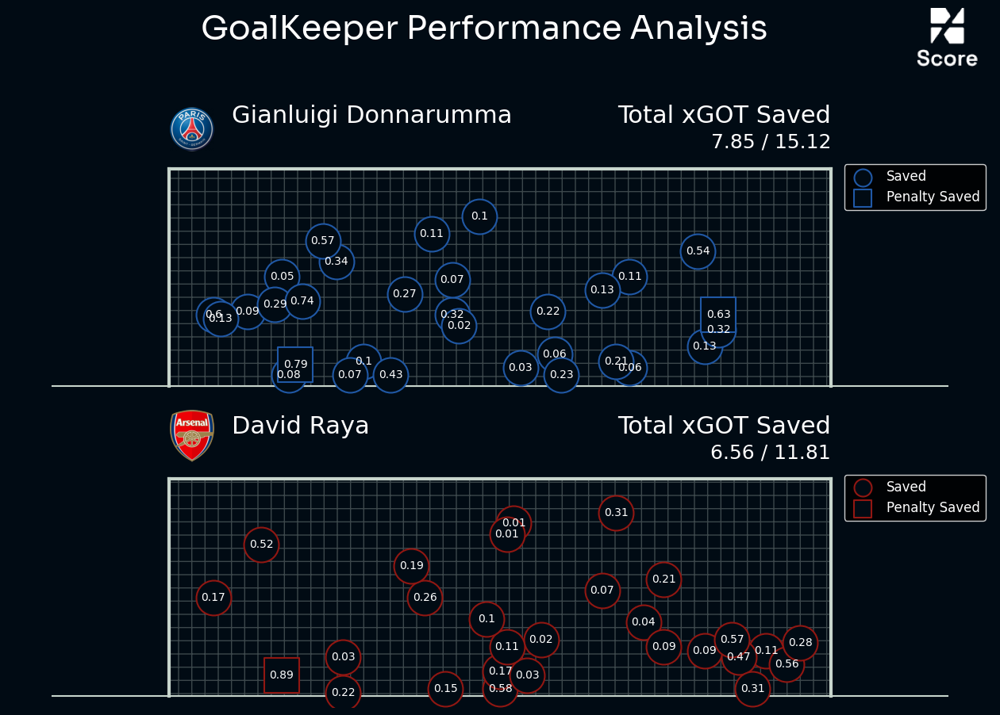

In [510]:
# Create a figure with two subplots
fig, axes = plt.subplots(2, 1, figsize=(16, 9), facecolor="#010b14")
background="#010b14"

league = 'Champions League 2024/25'

fig.suptitle(f'GoalKeeper Performance Analysis', fontsize=30,fontproperties=font_prop, color='white', y=1.08)
#fig.text(0.44,1,f'{league}',fontsize=20,fontproperties=font_prop, color='white')

logo = mpimg.imread('C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Score Logos-20241022T100701Z-001/Score Logos/ScoreSquareWhite.png')
ax_image = add_image(
    logo, fig, left=0.82, bottom=1, width=0.09, height=0.09,aspect='equal'
)


p1_saves_df = t2_shots_df[t2_shots_df['teamId'] != 9847]
p2_saves_df = t1_shots_df[t1_shots_df['teamId'] != 9825]

# Example usage: plot shot maps on both subplots
plot_shot_map(axes[0], p1_saves_df, "PSG",'#2058a5', "Gianluigi Donnarumma", "Real Madrid",background)
plot_shot_map(axes[1], p2_saves_df, "Arsenal",'#911712', "David Raya", "Getafe",background,False)
        
plt.subplots_adjust(wspace=0.3)
plt.subplots_adjust(hspace=0.3)

#plt.savefig(f'C:/Users/acer/Documents/GitHub/IndianCitizen/ScorePredict/Images/Plots/PSGVArsenal.png',dpi=500,bbox_inches = 'tight',facecolor=background)

In [511]:
p1_saves_df['eventType'].value_counts()

eventType
AttemptSaved    69
Miss            49
Goal            13
Post             2
Name: count, dtype: int64

In [508]:
p1_saves_df[(p1_saves_df['eventType'] == 'AttemptSaved') & (p1_saves_df['isBlocked'] == False)].shape

(34, 31)

In [417]:
p1_saves_df[(p1_saves_df['eventType'] == 'Goal') & (p1_saves_df['isBlocked'] == False)].shape

(13, 31)

In [418]:
p2_saves_df[(p2_saves_df['eventType'] == 'AttemptSaved') & (p2_saves_df['isBlocked'] == False)].shape

(28, 31)

In [419]:
p2_saves_df[(p2_saves_df['eventType'] == 'Goal') & (p2_saves_df['isBlocked'] == False)].shape

(9, 31)